In [1]:
import numpy as np
import pandas as pd

In [2]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')

In [3]:
train.head()

,index,category,data
0,0,2,신혼부부위한 주택정책 보다 보육시설 늘려주세요.. 국민세금으로 일부를 위한 정책펴지...
1,1,0,학교이름에 '남자'도 붙여주세요. 울산여자중학교에 재학중인 학생입니다 최근 양성평등...
2,2,1,"빙상연맹, 대한축구협회등 각종 체육협회의 비리를 철저하게 밝혀주세요.. 최근 동계올..."
3,3,1,"티비 12세,15세 관람가도 연령확인 의무화 하자.. 제기 에전에 티비를 보다가 잠..."
4,4,1,무더운 여름철엔 남성들도 시원한 자율복장을 해야. 무더운 여름철에는 남성들도 노넥타...


In [4]:
y_train=train['category']

In [5]:
x_train=train['data']

In [6]:
type(x_train[0])

str

In [7]:
import re
comments=[]
for i in x_train[:5]:
    texts=re.sub('[^가-힣]',' ',str(i))
    texts=re.sub('\s+',' ',texts)
    comments.append(texts)
print(comments)

['신혼부부위한 주택정책 보다 보육시설 늘려주세요 국민세금으로 일부를 위한 정책펴지 마시고 보편적으로 모든국민이 수긍할 수 있는 복지정책 펴 주시길 바랍니다 저도 신혼부부이지만 당첨되는 사람 로또되는 이런주택정책 반대합니다 국민세금을 일부 사람들에게 퍼주기식이 되면 안되죠 그 세금으로 우리아이 안전하게 맡길 수 있는 보육시설을 전국에 설치해 주세요 대기업들은 솔선수범해서 모든 사업장에 의무설치 할 수 있도록 하시구요 집 보다 애 맡길데가 없어 경력단절 되는게 더 괴롭습니다 집은 개인의 능력을 키워 사는게 맞습니다 그 능력을 키울수 있도록 육아 전담에 힘을 기울이는게 맞습니다 우리아이 부모가 키우는거 맞지만 이제는 국가가 책임지는 시대로 가는게 맞다고 봅니다 그렇잖아도 부동산 가격 자꾸 올라가는게 정부정책이 잘못 되었다고 봅니다 부동산은 그냥 내버려 두세요 좀 건들수록 역효과네요 ', '학교이름에 남자 도 붙여주세요 울산여자중학교에 재학중인 학생입니다 최근 양성평등 글짓기를 하다 생각했습니다 우리 울산엔 울산중학교 는 두개입니다 하나는 남중 하나는 여중인데 어째서 우리학교만 여자 를 붙여야하는가 하고요 남자가 우위였던 때 지어졌던 학교라 그런진 모르겠지만 울산중학교 남중 에도 남자 를 붙여 울산남자중학교가 되게 해주세요 평소에 학교이름을 줄여 부를때에도 우리학교는 울여중 남중은 그냥 울중 이라 부릅니다 몇년동안 그리 불러온 너무나 익숙해진 이 현실을 이젠 바꿀때가 되지않았나 싶네요 지금은 조선시대가 아니니까요 국내에 이런 학교는 널렸습니다 울산뿐만이 아니라 국내 다른 중 고등학교에 있는 똑같은 문제들을 해결해주셨으면 합니다 ', '빙상연맹 대한축구협회등 각종 체육협회의 비리를 철저하게 밝혀주세요 최근 동계올림픽에서 김보름 박지우 선수와 관련해서 큰 논란거리가 되고 있는데요 선수 개개인의 문제를 떠나서 이번일에 대해 대한빙상연맹의 불합리한 행정에 불신을 갖고있는 사람들이 많습니다 이제 동계올림픽도 폐막일이 다가오고 월이 되면 러시아에서 년마다 열리는 월드컵 축구대

In [8]:
from konlpy.tag import Okt
texts=[]
okt=Okt()
stopPos=['Determiner','Adverb','Conjunction','Josa','PreEomi','Eomi','Suffix',
           'Punctuation','Foreign','Alpha','Number','Unknown','Verb','Adjective',
        'Modifier','VerbPrefix']
stopWord=['은','는','이','가','그','저','것','도','니']
for tag in comments:
    tag_tokens=okt.pos(tag)
    word=[]
    for i in tag_tokens:
        if i[1] not in stopPos:
            if i[0] not in stopWord:
                if len(i[0])>=2:
                    word.append(i[0])
    texts.append(word)  

In [9]:
print(texts) #1개까지 포함할 경우

[['신혼부부', '주택', '정책', '보육', '시설', '국민', '세금', '일부', '정책', '보편', '국민', '수긍', '복지', '정책', '신혼부부', '당첨', '사람', '로또', '주택', '정책', '반대', '국민', '세금', '일부', '사람', '주기', '식이', '세금', '우리', '아이', '보육', '시설', '전국', '설치', '대기업', '솔선수범', '모든', '사업', '의무', '설치', '경력', '단절', '개인', '능력', '능력', '육아', '전담', '우리', '아이', '부모', '이제', '국가', '시대', '부동산', '가격', '자꾸', '정부', '정책', '잘못', '부동산', '그냥', '수록', '역효과'], ['학교', '이름', '남자', '울산', '여자', '중학교', '재학', '학생', '최근', '양성평등', '글짓기', '생각', '우리', '울산', '울산', '중학교', '개입', '하나', '남중', '하나', '여중', '어째서', '우리', '학교', '여자', '남자', '우위', '학교', '울산', '중학교', '남중', '남자', '산남', '중학교', '평소', '학교', '이름', '우리', '학교', '여중', '남중', '그냥', '동안', '현실', '지금', '조선시대', '국내', '학교', '널렸습니', '울산', '국내', '다른', '고등학교', '문제', '해결'], ['빙상', '연맹', '축구', '협회', '각종', '체육', '협회', '비리', '최근', '동계올림픽', '김보름', '박지우', '선수', '관련', '논란', '거리', '선수', '개개인', '문제', '이번', '대해', '빙상', '연맹', '불합리', '행정', '불신', '사람', '이제', '동계올림픽', '폐막', '일이', '러시아', '월드컵', '축구', '대회', '월드컵', '시작', '감독', '선임', '선수', '선발', '대해

In [10]:
def preprocessing_texts(train):
    comments=[]
    for i in train:
        texts=re.sub('[^가-힣]',' ',str(i))
        texts=re.sub('\s+',' ',texts)
        comments.append(texts)
    stopPos=['Determiner','Adverb','Conjunction','Josa','PreEomi','Eomi','Suffix',
               'Punctuation','Foreign','Alpha','Number','Unknown','Verb','Adjective',
            'Modifier','VerbPrefix']
    stopWord=['은','는','이','가','그','저','것','도','니']
    texts=[]
    okt=Okt()
    for tag in comments:
        tag_tokens=okt.pos(tag)
        word=[]
        for i in tag_tokens:
            if i[1] not in stopPos:
                if i[0] not in stopWord:
                    if len(i[0])>=2:
                        word.append(i[0])
        texts.append(word)    
    return texts

In [11]:
texts=preprocessing_texts(x_train)

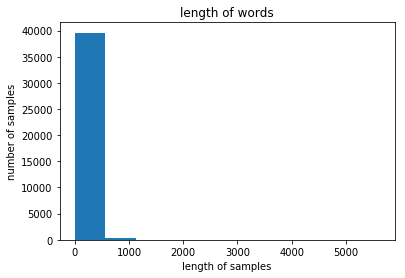

In [18]:
import matplotlib.pyplot as plt
text_len=[len(i) for i in texts]
plt.title('length of words')
plt.hist(text_len,bins=10)
plt.xlabel('length of samples')
plt.ylabel('number of samples')
plt.show()

In [21]:
from tensorflow.keras.preprocessing.text import Tokenizer
tokenizer=Tokenizer()
tokenizer.fit_on_texts(texts)
threshold=8
total_cnt=len(tokenizer.word_index)
rare_cnt=0
total_freq=0
rare_freq=0
for key,value in tokenizer.word_counts.items():
    total_freq=total_freq+value
    if (value<threshold):
        rare_cnt=rare_cnt+1
        rare_freq=rare_freq+value
print('단어 집합(vocabulary)의 크기 :',total_cnt)
print('등장 빈도가 %s번 이하인 희귀 단어의 수: %s'%(threshold - 1, rare_cnt))
print('단어 집합에서 희귀 단어를 제외시킬 경우의 단어 집합의 크기 %s'%(total_cnt - rare_cnt))
print("단어 집합에서 희귀 단어의 비율:", (rare_cnt / total_cnt)*100)
print("전체 등장 빈도에서 희귀 단어 등장 빈도 비율:", (rare_freq / total_freq)*100)

단어 집합(vocabulary)의 크기 : 47765
등장 빈도가 7번 이하인 희귀 단어의 수: 31738
단어 집합에서 희귀 단어를 제외시킬 경우의 단어 집합의 크기 16027
단어 집합에서 희귀 단어의 비율: 66.44614257301372
전체 등장 빈도에서 희귀 단어 등장 빈도 비율: 2.2347828303425774


In [22]:
len(tokenizer.word_counts)

47765

In [33]:
main_tokenizer=Tokenizer(num_words=10000)
main_tokenizer.fit_on_texts(texts)
encoded=main_tokenizer.texts_to_sequences(texts)

In [34]:
print(max(len(i) for i in encoded))
print(min(len(i) for i in encoded))
print(sum(len(i) for i in encoded)/len(encoded))

5406
0
74.83605


In [35]:
print(len(main_tokenizer.word_index))

47765


In [36]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
x_train=pad_sequences(encoded,maxlen=100)
x_train.shape

(40000, 100)

In [41]:
from tensorflow.keras.utils import to_categorical
y_train=to_categorical(np.array(y_train))

In [42]:
y_train.shape

(40000, 3)

In [43]:
from keras import layers
from keras.layers import Dense,Embedding,Dropout,BatchNormalization
from keras.models import Sequential
lstm_model=Sequential()
lstm_model.add(Embedding(10000,128,input_length=x_train.shape[1]))
lstm_model.add(layers.LSTM(32))
lstm_model.add(BatchNormalization())
# lstm_model.add(Dropout(0.5))
lstm_model.add(Dense(3,activation='softmax'))
lstm_model.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['acc'])
hist=lstm_model.fit(x_train,y_train,epochs=10,batch_size=128,validation_split=0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/10
32000/32000 [==============================] - 40s 1ms/step - loss: 0.4393 - acc: 0.8243 - val_loss: 0.4255 - val_acc: 0.8420
Epoch 2/10
32000/32000 [==============================] - 37s 1ms/step - loss: 0.2960 - acc: 0.8867 - val_loss: 0.3560 - val_acc: 0.8631
Epoch 3/10
32000/32000 [==============================] - 37s 1ms/step - loss: 0.2465 - acc: 0.9056 - val_loss: 0.3690 - val_acc: 0.8664
Epoch 4/10
32000/32000 [==============================] - 37s 1ms/step - loss: 0.2085 - acc: 0.9196 - val_loss: 0.4094 - val_acc: 0.8502
Epoch 5/10
32000/32000 [==============================] - 32s 991us/step - loss: 0.1796 - acc: 0.9325 - val_loss: 0.4467 - val_acc: 0.8559
Epoch 6/10
32000/32000 [==============================] - 66s 2ms/step - loss: 0.1529 - acc: 0.9429 - val_loss: 0.4832 - val_acc: 0.8511
Epoch 7/10
32000/32000 [==============================] - 25s 795us/step - loss: 0.1299 - acc: 0.9498 - val_loss: 0.5758 - val_

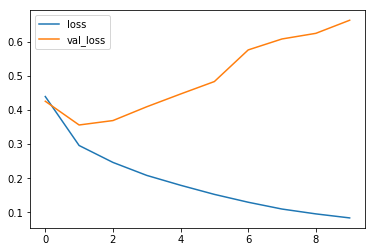

In [44]:
loss=hist.history['loss']
val_loss=hist.history['val_loss']
acc=hist.history['acc']
val_acc=hist.history['val_acc']
plt.plot(loss,label='loss')
plt.plot(val_loss,label='val_loss')
plt.legend()
plt.show()

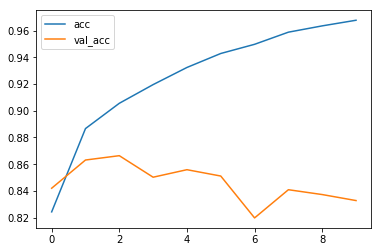

In [45]:
plt.plot(acc,label='acc')
plt.plot(val_acc,label='val_acc')
plt.legend()
plt.show()

In [46]:
test.head()

,index,data
0,0,소년법 폐지해주세요. 법 아래에서 보호받아야 할 아이들이\n법으로 인해 보호받지 못...
1,1,국공립 유치원 증설에 관하여. 국공립 유치원 부지 학보와건립및 증설에\n*지역 어린...
2,2,나경원파면. 나경원의원의 동계올림픽 위원을 파면해 주세요
3,3,국민위원에가 삼성편만들어요. 삼성에서 11년간 일하고 혈암과 백혈병 진단을 받은 ...
4,4,"방과후,유치원,어린이집 영어교육을 유지시켜주세요. 저는 아이 셋 키우는 평범한 주부..."


In [47]:
x_test=test['data']

In [48]:
test_texts=preprocessing_texts(x_test)

In [29]:
test_tokenizer=Tokenizer(num_words=10000)
test_tokenizer.fit_on_texts(test_texts)
encoded=test_tokenizer.texts_to_sequences(test_texts)
x_test=pad_sequences(encoded,maxlen=100)
x_test.shape

(5000, 300)

In [30]:
test['target']=lstm_model.predict_classes(x_test)

In [34]:
test['target'].value_counts()

2    2066
0    2016
1     918
Name: target, dtype: int64

In [35]:
submit=pd.read_csv('sample_submission.csv')
submit.head()

,index,category
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


In [36]:
submit['category']=test['target']
submit.head()

,index,category
0,0,2
1,1,0
2,2,0
3,3,0
4,4,2


In [38]:
submit.to_csv('bluehouse.csv',index=False)

In [48]:
comments=[]
for i in train['data']:
    texts=re.sub('[^가-힣]',' ',str(i))
    texts=re.sub('\s+',' ',texts)
    comments.append(texts)

In [49]:
comments

['신혼부부위한 주택정책 보다 보육시설 늘려주세요 국민세금으로 일부를 위한 정책펴지 마시고 보편적으로 모든국민이 수긍할 수 있는 복지정책 펴 주시길 바랍니다 저도 신혼부부이지만 당첨되는 사람 로또되는 이런주택정책 반대합니다 국민세금을 일부 사람들에게 퍼주기식이 되면 안되죠 그 세금으로 우리아이 안전하게 맡길 수 있는 보육시설을 전국에 설치해 주세요 대기업들은 솔선수범해서 모든 사업장에 의무설치 할 수 있도록 하시구요 집 보다 애 맡길데가 없어 경력단절 되는게 더 괴롭습니다 집은 개인의 능력을 키워 사는게 맞습니다 그 능력을 키울수 있도록 육아 전담에 힘을 기울이는게 맞습니다 우리아이 부모가 키우는거 맞지만 이제는 국가가 책임지는 시대로 가는게 맞다고 봅니다 그렇잖아도 부동산 가격 자꾸 올라가는게 정부정책이 잘못 되었다고 봅니다 부동산은 그냥 내버려 두세요 좀 건들수록 역효과네요 ',
 '학교이름에 남자 도 붙여주세요 울산여자중학교에 재학중인 학생입니다 최근 양성평등 글짓기를 하다 생각했습니다 우리 울산엔 울산중학교 는 두개입니다 하나는 남중 하나는 여중인데 어째서 우리학교만 여자 를 붙여야하는가 하고요 남자가 우위였던 때 지어졌던 학교라 그런진 모르겠지만 울산중학교 남중 에도 남자 를 붙여 울산남자중학교가 되게 해주세요 평소에 학교이름을 줄여 부를때에도 우리학교는 울여중 남중은 그냥 울중 이라 부릅니다 몇년동안 그리 불러온 너무나 익숙해진 이 현실을 이젠 바꿀때가 되지않았나 싶네요 지금은 조선시대가 아니니까요 국내에 이런 학교는 널렸습니다 울산뿐만이 아니라 국내 다른 중 고등학교에 있는 똑같은 문제들을 해결해주셨으면 합니다 ',
 '빙상연맹 대한축구협회등 각종 체육협회의 비리를 철저하게 밝혀주세요 최근 동계올림픽에서 김보름 박지우 선수와 관련해서 큰 논란거리가 되고 있는데요 선수 개개인의 문제를 떠나서 이번일에 대해 대한빙상연맹의 불합리한 행정에 불신을 갖고있는 사람들이 많습니다 이제 동계올림픽도 폐막일이 다가오고 월이 되면 러시아에서 년마다 열리는 월드컵 축

In [50]:
stopPos=['Determiner','Adverb','Conjunction','Josa','PreEomi','Eomi','Suffix',
           'Punctuation','Foreign','Alpha','Number','Unknown']
stopWord=['은','는','이','가','그','저','것','도','니']
# texts=[]
okt=Okt()
for tag in comments:
    tag_tokens=okt.pos(tag)
#     word=[]
    for i in tag_tokens:
        if i[1] not in stopPos:
            if i[0] not in stopWord:
                print(i)
#                     word.append(i[0])
#     texts.append(word)    

('신혼부부', 'Noun')
('위', 'Noun')
('주택', 'Noun')
('정책', 'Noun')
('보다', 'Verb')
('보육', 'Noun')
('시설', 'Noun')
('늘려주세요', 'Verb')
('국민', 'Noun')
('세금', 'Noun')
('일부', 'Noun')
('위', 'Noun')
('정책', 'Noun')
('펴지', 'Verb')
('마시고', 'Verb')
('보편', 'Noun')
('모든', 'Modifier')
('국민', 'Noun')
('수긍', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('복지', 'Noun')
('정책', 'Noun')
('펴', 'Verb')
('주시길', 'Verb')
('바랍니다', 'Verb')
('신혼부부', 'Noun')
('당첨', 'Noun')
('되는', 'Verb')
('사람', 'Noun')
('로또', 'Noun')
('되는', 'Verb')
('이런', 'Modifier')
('주택', 'Noun')
('정책', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('국민', 'Noun')
('세금', 'Noun')
('일부', 'Noun')
('사람', 'Noun')
('퍼', 'Noun')
('주기', 'Noun')
('식이', 'Noun')
('되면', 'Verb')
('안되죠', 'Adjective')
('세금', 'Noun')
('우리', 'Noun')
('아이', 'Noun')
('안전하게', 'Adjective')
('맡길', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('보육', 'Noun')
('시설', 'Noun')
('전국', 'Noun')
('설치', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('대기업', 'Noun')
('솔선수범', 'Noun')
('해서', 'Verb')
('모든', 'Noun')
(

('없고', 'Adjective')
('말', 'Noun')
('입니다', 'Adjective')
('남자', 'Noun')
('반바지', 'Noun')
('입으면', 'Verb')
('고정관념', 'Noun')
('갖고', 'Verb')
('편견', 'Noun')
('섞인', 'Verb')
('시선', 'Noun')
('부정', 'Noun')
('바로', 'Noun')
('보는', 'Verb')
('경우', 'Noun')
('많은', 'Adjective')
('입니다', 'Adjective')
('흔', 'Modifier')
('한', 'Modifier')
('예', 'Noun')
('직장', 'Noun')
('놀러', 'Verb')
('왔냐', 'Verb')
('등', 'Noun')
('편견', 'Noun')
('섞인', 'Verb')
('시선', 'Noun')
('말', 'Noun')
('듣게', 'Verb')
('되는', 'Verb')
('경우', 'Noun')
('허다', 'Verb')
('합니다', 'Verb')
('그냥', 'Noun')
('시원하게', 'Adjective')
('반바지', 'Noun')
('입고', 'Verb')
('다니면', 'Verb')
('되지하고', 'Verb')
('말', 'Noun')
('하진', 'Verb')
('말기', 'Noun')
('바랍니다', 'Verb')
('시선', 'Noun')
('무시', 'Noun')
('입을수도', 'Adjective')
('있지만', 'Adjective')
('지금', 'Noun')
('말', 'Noun')
('하는건', 'Verb')
('그게', 'Noun')
('아닌거', 'Adjective')
('아시지요', 'Verb')
('즉', 'Noun')
('고정관념', 'Noun')
('떨치고', 'Verb')
('편견', 'Noun')
('섞인', 'Verb')
('시선', 'Noun')
('바라보는', 'Verb')
('문화', 'Noun')
('지', 'Modifier')
(

('아이', 'Noun')
('키우기', 'Verb')
('좋', 'Adjective')
('은나라', 'Noun')
('아이', 'Noun')
('키우기', 'Verb')
('좋', 'Adjective')
('은나라', 'Noun')
('좋은', 'Adjective')
('접근', 'Noun')
('입니다', 'Adjective')
('지금', 'Noun')
('낸', 'Verb')
('의견', 'Noun')
('한가지', 'Noun')
('더', 'Noun')
('어린이집', 'Noun')
('교대', 'Noun')
('근무', 'Noun')
('하게', 'Verb')
('해주세요', 'Verb')
('아이', 'Noun')
('안심', 'Noun')
('하게', 'Verb')
('보육', 'Noun')
('하게', 'Verb')
('보육', 'Noun')
('교사', 'Noun')
('엄마', 'Noun')
('교대', 'Noun')
('양', 'Modifier')
('육', 'Modifier')
('수당', 'Noun')
('거의', 'Noun')
('의미', 'Noun')
('없습니다', 'Adjective')
('수당', 'Noun')
('백만원', 'Noun')
('해도', 'Verb')
('아이', 'Noun')
('낳지', 'Verb')
('않을듯', 'Verb')
('싶어요', 'Verb')
('아이', 'Noun')
('삶', 'Noun')
('먼저', 'Noun')
('생각', 'Noun')
('하는', 'Verb')
('엄마', 'Noun')
('많아서', 'Adjective')
('엄마', 'Noun')
('아예', 'Noun')
('아이', 'Noun')
('돌볼수있게', 'Verb')
('시', 'Noun')
('퇴근', 'Noun')
('해야겠지요', 'Verb')
('이런', 'Modifier')
('문화', 'Noun')
('시급합니다', 'Adjective')
('시', 'Noun')
('시', 'Noun')
('근무', '

('언론인', 'Noun')
('변희재', 'Noun')
('의', 'Noun')
('정당한', 'Adjective')
('의혹', 'Noun')
('제기', 'Noun')
('표현', 'Noun')
('자유', 'Noun')
('입니다', 'Adjective')
('변희재', 'Noun')
('대한', 'Noun')
('구속영장', 'Noun')
('청구', 'Noun')
('표현', 'Noun')
('자유', 'Noun')
('관', 'Noun')
('기본권', 'Noun')
('침해', 'Noun')
('입니다', 'Adjective')
('구속', 'Noun')
('철회', 'Noun')
('바랍니다', 'Verb')
('여론조사', 'Noun')
('전화', 'Noun')
('선거', 'Noun')
('유세', 'Modifier')
('차량', 'Noun')
('소음공해', 'Noun')
('평일', 'Noun')
('가장', 'Noun')
('바쁜', 'Adjective')
('업무', 'Noun')
('시간', 'Noun')
('하루', 'Noun')
('몇', 'Modifier')
('통', 'Noun')
('계속', 'Noun')
('전화', 'Noun')
('오는데', 'Verb')
('수신', 'Noun')
('거부', 'Noun')
('할', 'Verb')
('방법', 'Noun')
('없네요', 'Adjective')
('선거', 'Noun')
('해서', 'Verb')
('차량', 'Noun')
('음악', 'Noun')
('크게', 'Noun')
('틀어놓고', 'Verb')
('주거', 'Noun')
('단지', 'Noun')
('사무실', 'Noun')
('단지', 'Noun')
('학교', 'Noun')
('할것', 'Verb')
('활보', 'Noun')
('다니는', 'Verb')
('또한', 'Noun')
('공중', 'Noun')
('도덕', 'Noun')
('어긋나는', 'Verb')
('선거', 'Noun')
('유세

('입니다', 'Adjective')
('뉴스', 'Noun')
('보면서', 'Verb')
('화가', 'Noun')
('나네요', 'Verb')
('과거', 'Noun')
('지금', 'Noun')
('미래', 'Noun')
('소년', 'Noun')
('범죄', 'Noun')
('없어지지는', 'Verb')
('않겠죠', 'Verb')
('상식', 'Noun')
('이하', 'Noun')
('일', 'Noun')
('어리다는', 'Verb')
('이유', 'Noun')
('덮어줘', 'Verb')
('선', 'Noun')
('안됩니다', 'Adjective')
('본인', 'Noun')
('성인', 'Noun')
('벌', 'Noun')
('받는다고', 'Verb')
('생각', 'Noun')
('해야', 'Verb')
('무서운줄', 'Adjective')
('알겠죠', 'Verb')
('악순환', 'Noun')
('고리', 'Noun')
('끊어야', 'Verb')
('합니다', 'Verb')
('분위기', 'Noun')
('흐리는', 'Verb')
('문제', 'Noun')
('아들', 'Noun')
('분리', 'Noun')
('시켜야', 'Verb')
('마땅합니다', 'Adjective')
('소년법', 'Noun')
('폐지', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('청소년', 'Noun')
('어린이', 'Noun')
('신고', 'Noun')
('권리', 'Noun')
('주', 'Modifier')
('십', 'Modifier')
('시오', 'Noun')
('한', 'Verb')
('중학교', 'Noun')
('다니는', 'Verb')
('학생', 'Noun')
('입니다', 'Adjective')
('다름이', 'Adjective')
('아니오라', 'Adjective')
('제', 'Noun')
('평소', 'Noun')
('게임', 'Noun')
('즐겨하는', 'Verb')
('편', 'Noun

('군대', 'Noun')
('면제', 'Noun')
('원합니다', 'Adjective')
('팬심', 'Noun')
('그랬으면', 'Adjective')
('좋겠다는', 'Adjective')
('마음', 'Noun')
('있지만', 'Adjective')
('방탄소년단', 'Noun')
('우리나라', 'Noun')
('벌어', 'Verb')
('들이는', 'Verb')
('수익', 'Noun')
('한국어', 'Noun')
('배우려는', 'Verb')
('외국인', 'Noun')
('우리나라', 'Noun')
('케이팝', 'Noun')
('음악', 'Noun')
('외국', 'Noun')
('많은', 'Adjective')
('인기', 'Noun')
('받는것은', 'Verb')
('방탄소년단', 'Noun')
('일부', 'Noun')
('생각', 'Noun')
('합니다', 'Verb')
('방탄소년단', 'Noun')
('자신', 'Noun')
('노력', 'Noun')
('우리나라', 'Noun')
('많은', 'Adjective')
('이익', 'Noun')
('벌었습니다', 'Verb')
('대뷔', 'Noun')
('초', 'Noun')
('지금', 'Noun')
('노력', 'Noun')
('생각', 'Noun')
('하면', 'Verb')
('방탄소년단', 'Noun')
('노력', 'Noun')
('충분하다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('우리나라', 'Noun')
('위해', 'Noun')
('많은', 'Adjective')
('노력', 'Noun')
('하고', 'Verb')
('많은', 'Adjective')
('이익', 'Noun')
('벌은', 'Verb')
('방탄소년단', 'Noun')
('군대', 'Noun')
('면제', 'Noun')
('할수', 'Verb')
('있도록', 'Adjective')
('해주세요', 'Verb')
('빙상', 'Noun')
('

('학교', 'Noun')
('다니거나', 'Verb')
('다녔던', 'Verb')
('사람', 'Noun')
('어쩜', 'Noun')
('말', 'Noun')
('험하게', 'Adjective')
('하는지', 'Verb')
('속상합니다', 'Adjective')
('자기', 'Noun')
('자신', 'Noun')
('이름', 'Noun')
('댓글', 'Noun')
('달수', 'Verb')
('있게', 'Adjective')
('한다면', 'Verb')
('욕설', 'Noun')
('험한', 'Adjective')
('말', 'Noun')
('쓰지', 'Verb')
('않을수', 'Verb')
('있지', 'Adjective')
('않을까', 'Verb')
('생각', 'Noun')
('됩니다', 'Verb')
('또한', 'Noun')
('근거', 'Noun')
('없는', 'Adjective')
('루머', 'Noun')
('댓글', 'Noun')
('작성', 'Noun')
('할', 'Verb')
('때', 'Noun')
('조심스러워', 'Adjective')
('지지', 'Noun')
('않을까', 'Verb')
('생각', 'Noun')
('됩니다', 'Verb')
('인터넷', 'Noun')
('충분히', 'Adjective')
('열린', 'Verb')
('소통', 'Noun')
('장', 'Noun')
('입니다', 'Adjective')
('곳', 'Noun')
('지켜', 'Verb')
('야할', 'Adjective')
('최소한', 'Noun')
('정도', 'Noun')
('있어야', 'Adjective')
('한다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('비록', 'Noun')
('제', 'Noun')
('청원', 'Noun')
('만', 'Modifier')
('명', 'Noun')
('넘을수', 'Verb')
('있을지', 'Adjective')
('모르겠지만', 'Verb')
(

('전자발찌', 'Noun')
('착용', 'Noun')
('및', 'Noun')
('신상', 'Noun')
('정보공개', 'Noun')
('범죄자', 'Noun')
('범위', 'Noun')
('늘려주세요', 'Verb')
('안녕하세요', 'Adjective')
('오늘', 'Noun')
('뉴스', 'Noun')
('기사', 'Noun')
('보다가', 'Verb')
('화가', 'Noun')
('나서', 'Verb')
('글', 'Noun')
('올립니다', 'Verb')
('다름', 'Adjective')
('아닌', 'Adjective')
('현재', 'Noun')
('성폭행', 'Noun')
('범과', 'Noun')
('강력범죄', 'Noun')
('적용', 'Noun')
('된', 'Verb')
('전자발찌', 'Noun')
('착용', 'Noun')
('및', 'Noun')
('신상', 'Noun')
('정보공개', 'Noun')
('아동학대', 'Noun')
('범죄', 'Noun')
('특례', 'Noun')
('범', 'Noun')
('위반', 'Noun')
('아동학대', 'Noun')
('하여', 'Verb')
('본인', 'Noun')
('어린', 'Verb')
('애기', 'Noun')
('방치', 'Noun')
('학대', 'Noun')
('살인', 'Noun')
('하는', 'Verb')
('여성', 'Noun')
('전자발찌', 'Noun')
('착용', 'Noun')
('신상', 'Noun')
('정보공개', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('요즘', 'Noun')
('뉴스', 'Noun')
('보', 'Noun')
('애기', 'Noun')
('엄마', 'Noun')
('그런', 'Modifier')
('범죄', 'Noun')
('짓는데', 'Verb')
('하다는', 'Verb')
('생각', 'Noun')
('이듭', 'Noun')
('이유', 'Noun')
('남자친구', '

('된다는게', 'Verb')
('발의', 'Noun')
('됐다죠', 'Verb')
('그럼', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('걸', 'Noun')
('맞게', 'Verb')
('처우', 'Noun')
('보장', 'Noun')
('해주셔야죠', 'Verb')
('법인', 'Noun')
('어린이집', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('어린이집', 'Noun')
('경우', 'Noun')
('호', 'Noun')
('봉표', 'Noun')
('지급', 'Noun')
('받지만', 'Verb')
('민간', 'Noun')
('가정', 'Noun')
('어린이집', 'Noun')
('경우', 'Noun')
('급여', 'Noun')
('최저임금', 'Noun')
('원', 'Modifier')
('장님', 'Noun')
('주기', 'Noun')
('싫어서', 'Adjective')
('온갖', 'Noun')
('꼼수', 'Noun')
('월', 'Noun')
('적용', 'Noun')
('아니라', 'Adjective')
('월', 'Noun')
('적용', 'Noun')
('하느니', 'Verb')
('같은', 'Adjective')
('경우', 'Noun')
('년도', 'Noun')
('최저임금', 'Noun')
('올려줄', 'Verb')
('생각', 'Noun')
('안', 'VerbPrefix')
('하는', 'Verb')
('어린이집', 'Noun')
('다니고', 'Verb')
('있네요', 'Adjective')
('비슷한', 'Adjective')
('처지', 'Noun')
('있는', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('여럿', 'Noun')
('있으리라', 'Adjective')
('생각', 'Noun')
('됩니다', 'Verb')
('일', 'Noun')
('할', 'Verb')
('수', 'Noun')
(

('전국', 'Noun')
('초', 'Noun')
('중고', 'Noun')
('휴교', 'Noun')
('령', 'Noun')
('필요', 'Noun')
('일', 'Noun')
('내일', 'Noun')
('일', 'Noun')
('년', 'Noun')
('역대', 'Noun')
('태풍', 'Noun')
('이번', 'Noun')
('태풍', 'Noun')
('몰고오는', 'Verb')
('피해', 'Noun')
('인명', 'Noun')
('피해', 'Noun')
('최소', 'Noun')
('화해', 'Noun')
('야한다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('우리나라', 'Noun')
('전체', 'Noun')
('태풍', 'Noun')
('영향', 'Noun')
('드는것이니', 'Verb')
('어디가', 'Noun')
('약하고', 'Adjective')
('영향', 'Noun')
('작게', 'Adjective')
('가고를', 'Verb')
('떠나서', 'Verb')
('휴교', 'Noun')
('한다면', 'Verb')
('전국', 'Noun')
('하는게', 'Verb')
('맞는듯', 'Verb')
('싶습니다', 'Verb')
('영향', 'Noun')
('작게', 'Adjective')
('온다고', 'Verb')
('해서', 'Verb')
('피해자', 'Noun')
('안', 'VerbPrefix')
('생기는것은', 'Verb')
('아닙니다', 'Adjective')
('한마디', 'Noun')
('안일한', 'Adjective')
('태도', 'Noun')
('영향', 'Noun')
('적게오는', 'Verb')
('지역', 'Noun')
('간과', 'Noun')
('해', 'Verb')
('선', 'Noun')
('안된다는', 'Adjective')
('말', 'Noun')
('입니다', 'Adjective')
('휴교', 'Noun')
('령', 'Noun')
(

('혹시', 'Noun')
('대통령', 'Noun')
('담배', 'Noun')
('테', 'Noun')
('우시나요', 'Verb')
('담배', 'Noun')
('인연', 'Noun')
('맺은지', 'Verb')
('년', 'Noun')
('끊어야겠다', 'Verb')
('생각', 'Noun')
('해봤지만', 'Verb')
('개피', 'Noun')
('물', 'Noun')
('하늘', 'Noun')
('보면', 'Verb')
('그간', 'Noun')
('쌓인', 'Verb')
('스트레스', 'Noun')
('연기', 'Noun')
('사라지는', 'Verb')
('듯', 'Noun')
('묘', 'Noun')
('맛', 'Noun')
('포기', 'Noun')
('못', 'Noun')
('있습니다', 'Adjective')
('개인', 'Noun')
('끊겠다는', 'Verb')
('생각', 'Noun')
('했던것도', 'Verb')
('경제', 'Noun')
('이유', 'Noun')
('제', 'Noun')
('몸', 'Noun')
('생각', 'Noun')
('해서는', 'Verb')
('아닌', 'Adjective')
('듯', 'Noun')
('담배', 'Noun')
('스트레스', 'Noun')
('해소', 'Noun')
('식품', 'Noun')
('보고있는', 'Verb')
('인', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('생각', 'Noun')
('옳은건', 'Adjective')
('아니겠지만', 'Adjective')
('왜', 'Noun')
('같은', 'Adjective')
('흡연', 'Noun')
('자만', 'Noun')
('세금', 'Noun')
('내는', 'Verb')
('이유', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('여전히', 'Adjective')
('납득', 'Noun')
('가지', 'Noun')
('않습니다', 'Verb')
(

('난민', 'Noun')
('혐오', 'Noun')
('제', 'Modifier')
('주', 'Modifier')
('도민', 'Noun')
('혐오', 'Noun')
('하진', 'Verb')
('않으셨습니까', 'Verb')
('안녕하세요', 'Adjective')
('올해', 'Noun')
('중', 'Noun')
('되는', 'Verb')
('학생', 'Noun')
('입니다', 'Adjective')
('글', 'Noun')
('모든', 'Noun')
('사람', 'Noun')
('보아', 'Noun')
('공감', 'Noun')
('해주시고', 'Verb')
('동의', 'Noun')
('해주셨음', 'Verb')
('합니다', 'Verb')
('제주도', 'Noun')
('명', 'Noun')
('넘는', 'Verb')
('난민', 'Noun')
('들어와', 'Verb')
('있습니다', 'Adjective')
('세계', 'Noun')
('어려운', 'Adjective')
('나라', 'Noun')
('위해', 'Noun')
('나라', 'Noun')
('국토', 'Noun')
('살', 'Noun')
('해준다니', 'Verb')
('취지', 'Noun')
('정말', 'Noun')
('좋습니다', 'Adjective')
('위해', 'Noun')
('국민', 'Noun')
('세금', 'Noun')
('썼는데', 'Verb')
('취지', 'Noun')
('현재', 'Noun')
('잘', 'Verb')
('되어가고', 'Verb')
('있습니까', 'Adjective')
('아니', 'Adjective')
('사실', 'Noun')
('현재', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('제주도', 'Noun')
('난민', 'Noun')
('들어와', 'Verb')
('있는', 'Adjective')
('알', 'Noun')
('관심', 'Noun')
('없을', 'Adjective')
('겁니다', '

('유치원', 'Noun')
('교육', 'Noun')
('국가책임', 'Noun')
('현재', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('제', 'Noun')
('폐지', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('개원', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('건물', 'Noun')
('초등학교', 'Noun')
('교실', 'Noun')
('를', 'Noun')
('이용', 'Noun')
('한다', 'Verb')
('사립', 'Noun')
('유치원', 'Noun')
('폐', 'Noun')
('매매', 'Noun')
('원', 'Modifier')
('한', 'Modifier')
('곳', 'Noun')
('국가', 'Noun')
('공시가격', 'Noun')
('매입', 'Noun')
('하여', 'Verb')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('설립', 'Noun')
('한다', 'Verb')
('유치원교사', 'Noun')
('유치원교사', 'Noun')
('정규', 'Noun')
('교육', 'Noun')
('받은', 'Verb')
('자를', 'Verb')
('공개', 'Noun')
('채용', 'Noun')
('정규직', 'Noun')
('임용', 'Noun')
('한다', 'Verb')
('초등학교', 'Noun')
('설립', 'Noun')
('유치원', 'Noun')
('초등학교', 'Noun')
('교장', 'Noun')
('관리', 'Noun')
('감독', 'Noun')
('받도록', 'Verb')
('한다', 'Verb')
('사립', 'Noun')
('유치원', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('사용', 'Noun')
('하는', 'Verb')
('곳', 'Noun')
(

('여', 'Modifier')
('성', 'Modifier')
('군복무', 'Noun')
('의무', 'Noun')
('남녀평등', 'Noun')
('이전', 'Noun')
('인간', 'Noun')
('평등', 'Noun')
('여성군', 'Noun')
('의무', 'Noun')
('여성', 'Noun')
('핑계', 'Noun')
('대해', 'Noun')
('반박', 'Noun')
('구', 'Modifier')
('구', 'Modifier')
('절절', 'Noun')
('말안하고', 'Verb')
('핵심', 'Noun')
('말하겠습니다', 'Verb')
('군가산점', 'Noun')
('제', 'Modifier')
('대의', 'Noun')
('대해', 'Noun')
('폐지', 'Noun')
('이유', 'Noun')
('남녀', 'Noun')
('불평등', 'Noun')
('입니다', 'Adjective')
('애초', 'Noun')
('남자', 'Noun')
('군대', 'Noun')
('가는것이', 'Verb')
('불평등', 'Noun')
('입니다', 'Adjective')
('신체', 'Noun')
('조건', 'Noun')
('따지시는', 'Verb')
('분', 'Noun')
('제', 'Noun')
('일', 'Modifier')
('반', 'Modifier')
('여성', 'Noun')
('저체중', 'Noun')
('허약한', 'Adjective')
('체질', 'Noun')
('입니다', 'Adjective')
('그럼', 'Adjective')
('안', 'VerbPrefix')
('갑니까', 'Verb')
('갔다', 'Verb')
('왔습니다', 'Verb')
('군대', 'Noun')
('무거운', 'Adjective')
('거들고', 'Verb')
('뛰는', 'Verb')
('거만합니까', 'Adjective')
('그렇치', 'Adjective')
('않습니다', 'Verb')
('아주', 'Noun')
('

('초등학교', 'Noun')
('전', 'Modifier')
('학년', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('이용', 'Noun')
('가능하게', 'Adjective')
('해주세요', 'Verb')
('아이', 'Noun')
('키우는', 'Verb')
('밎벌', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('방학', 'Noun')
('되면', 'Verb')
('큰', 'Verb')
('걱정', 'Noun')
('앞섭니다', 'Verb')
('아이', 'Noun')
('학년', 'Noun')
('되니', 'Verb')
('돌봄', 'Verb')
('교실', 'Noun')
('이용', 'Noun')
('하지', 'Verb')
('못', 'VerbPrefix')
('해', 'Verb')
('아이', 'Noun')
('집', 'Noun')
('사실', 'Noun')
('방치', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('방학', 'Noun')
('되면', 'Verb')
('아이', 'Noun')
('봐줄', 'Verb')
('사람', 'Noun')
('없어', 'Adjective')
('방학', 'Noun')
('겁', 'Noun')
('납니다', 'Verb')
('저만', 'Modifier')
('그런', 'Modifier')
('아니라', 'Adjective')
('생각', 'Noun')
('됩니다', 'Verb')
('전국', 'Noun')
('각', 'Modifier')
('급', 'Noun')
('학교', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('늘려', 'Verb')
('전', 'Modifier')
('학년', 'Noun')
('이용', 'Noun')
('할수', 'Verb')
('있도록', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('충', 'Noun')
('시설', '

('어린이집', 'Noun')
('보육', 'Noun')
('교사', 'Noun')
('어린이집', 'Noun')
('교사', 'Noun')
('전문성', 'Noun')
('위해', 'Noun')
('최소', 'Noun')
('년', 'Noun')
('이상', 'Noun')
('철저한', 'Adjective')
('교육', 'Noun')
('받아야', 'Verb')
('자격증', 'Noun')
('딸', 'Noun')
('수', 'Noun')
('있도록', 'Adjective')
('평생교육', 'Noun')
('아닌', 'Adjective')
('사립', 'Noun')
('학원', 'Noun')
('폐지', 'Noun')
('해주시고', 'Verb')
('년', 'Noun')
('대학', 'Noun')
('과정', 'Noun')
('버금', 'Noun')
('가는', 'Verb')
('철저한', 'Adjective')
('교육과정', 'Noun')
('가진', 'Verb')
('평생교육', 'Noun')
('커리큘럼', 'Noun')
('가질', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('자격증', 'Noun')
('취득', 'Noun')
('문턱', 'Noun')
('어렵게', 'Adjective')
('해주세요', 'Verb')
('시간', 'Noun')
('휴게', 'Noun')
('문제', 'Noun')
('아니고', 'Adjective')
('서류', 'Noun')
('작업', 'Noun')
('때문', 'Noun')
('시', 'Noun')
('시', 'Noun')
('퇴근', 'Noun')
('하는', 'Verb')
('경우', 'Noun')
('다반사', 'Noun')
('입니다', 'Adjective')
('교사', 'Noun')
('인당', 'Verb')
('시간', 'Noun')
('근무', 'Noun')
('의무', 'Noun')
('하시고', 'Verb')
('시간', 'Noun')
('야간', '

('박', 'Noun')
('근', 'Modifier')
('혜', 'Noun')
('대통령', 'Noun')
('석방', 'Noun')
('박근혜', 'Noun')
('대통령', 'Noun')
('즉각', 'Noun')
('석방', 'Noun')
('하길', 'Verb')
('정도', 'Noun')
('했어면', 'Verb')
('어지간히', 'Adjective')
('했다고', 'Verb')
('아니', 'Adjective')
('가혹하게', 'Adjective')
('한다고', 'Verb')
('생각', 'Noun')
('하질', 'Verb')
('않나요', 'Verb')
('복수', 'Noun')
('또다른', 'Modifier')
('복수', 'Noun')
('남기는', 'Verb')
('법', 'Noun')
('뭔', 'Modifier')
('죄', 'Noun')
('있다고', 'Adjective')
('지금', 'Noun')
('둬놓', 'Verb')
('코', 'Noun')
('그리', 'Verb')
('좋', 'Adjective')
('타고', 'Noun')
('온', 'Modifier')
('사방', 'Noun')
('웃고다니는지', 'Verb')
('지금', 'Noun')
('온', 'Modifier')
('국민', 'Noun')
('들', 'Verb')
('어떻', 'Modifier')
('케', 'Noun')
('생각', 'Noun')
('하는지', 'Verb')
('동네', 'Noun')
('사우나', 'Noun')
('시', 'Modifier')
('장통', 'Noun')
('구석', 'Noun')
('구석', 'Noun')
('모', 'Noun')
('삼', 'Noun')
('삼', 'Noun')
('오', 'Noun')
('오', 'Noun')
('구석', 'Noun')
('구석', 'Noun')
('모', 'Noun')
('쑥', 'Noun')
('떡', 'Noun')
('쑥', 'Noun')
('떡', 'Noun')
('남',

('대구', 'Noun')
('계명대', 'Noun')
('정', 'Noun')
('은희', 'Noun')
('강간', 'Noun')
('살인', 'Noun')
('사체', 'Noun')
('유기', 'Noun')
('사체', 'Noun')
('손괴', 'Noun')
('교사', 'Noun')
('사건', 'Noun')
('저희', 'Noun')
('풀어야', 'Verb')
('합', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('구마', 'Noun')
('고속도로', 'Noun')
('의문사', 'Noun')
('제', 'Noun')
('여식', 'Noun')
('당시', 'Noun')
('세', 'Noun')
('의', 'Noun')
('한', 'Verb')
('과', 'Noun')
('가족', 'Noun')
('절규', 'Noun')
('고통', 'Noun')
('누가', 'Noun')
('풀어주고', 'Verb')
('책임져야', 'Verb')
('합', 'Noun')
('지난', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('사건', 'Noun')
('일로', 'Noun')
('년', 'Noun')
('지나서야', 'Verb')
('년맺힌', 'Noun')
('한', 'Verb')
('풀어주다', 'Verb')
('만', 'Noun')
('천하', 'Noun')
('호언', 'Noun')
('장담', 'Noun')
('대구', 'Noun')
('지방', 'Noun')
('검찰청', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('대법원', 'Noun')
('과정', 'Noun')
('있다하나', 'Adjective')
('이런', 'Modifier')
('절차', 'Noun')
('통해', 'Noun')
('자기', 'Noun')
('성과', 'Noun')
('오히려', 'Noun')
('범죄', 'Noun')
('

('태극기', 'Noun')
('평창', 'Noun')
('지금', 'Noun')
('난리', 'Noun')
('남', 'Noun')
('문재인', 'Noun')
('지금', 'Noun')
('다음', 'Noun')
('네이버', 'Noun')
('태극기', 'Noun')
('안', 'VerbPrefix')
('한다고', 'Verb')
('난리', 'Noun')
('났습니다', 'Verb')
('북한', 'Noun')
('선수', 'Noun')
('몇', 'Modifier')
('명', 'Noun')
('때문', 'Noun')
('태극기', 'Noun')
('아닌', 'Adjective')
('한반도기', 'Noun')
('들면', 'Verb')
('국민', 'Noun')
('분노', 'Noun')
('하늘', 'Noun')
('찌를', 'Verb')
('겁니다', 'Verb')
('태극기', 'Noun')
('소중한지를', 'Adjective')
('문재인', 'Noun')
('때문', 'Noun')
('알', 'Noun')
('되다니', 'Verb')
('어이없군요', 'Adjective')
('태극기', 'Noun')
('반드시', 'Noun')
('평창', 'Noun')
('걸어주세요', 'Verb')
('학생', 'Noun')
('폭력', 'Noun')
('민법', 'Noun')
('교육', 'Noun')
('의무', 'Noun')
('사', 'Modifier')
('전', 'Modifier')
('예', 'Modifier')
('방안', 'Noun')
('학생', 'Noun')
('폭력', 'Noun')
('민법', 'Noun')
('교육', 'Noun')
('추가', 'Noun')
('과목', 'Noun')
('사전', 'Noun')
('예방', 'Noun')
('하였으면', 'Verb')
('합니다', 'Verb')
('학생', 'Noun')
('인성', 'Noun')
('교육', 'Noun')
('우선', 'Noun')
('시', 'Noun')

('여성', 'Noun')
('마음', 'Noun')
('놓고', 'Verb')
('임신', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('도와주세요', 'Verb')
('임신', 'Noun')
('기간', 'Noun')
('육아휴직', 'Noun')
('안녕하세요', 'Adjective')
('여성', 'Noun')
('마음', 'Noun')
('놓고', 'Verb')
('임신', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('도와주세요', 'Verb')
('직장', 'Noun')
('다니고', 'Verb')
('있습니다', 'Adjective')
('회사', 'Noun')
('생활', 'Noun')
('하며', 'Verb')
('계획', 'Noun')
('임신', 'Noun')
('준비', 'Noun')
('하지만', 'Verb')
('생각', 'Noun')
('쉽지', 'Verb')
('않습니다', 'Verb')
('어렵게', 'Adjective')
('임신', 'Noun')
('되지만', 'Verb')
('임신', 'Noun')
('기간', 'Noun')
('약', 'Noun')
('개월', 'Noun')
('동안', 'Noun')
('기본', 'Noun')
('시간', 'Noun')
('회사', 'Noun')
('근무', 'Noun')
('하며', 'Verb')
('때로는', 'Noun')
('잔업', 'Noun')
('때로는', 'Noun')
('주말', 'Noun')
('특근', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('임신', 'Noun')
('기간', 'Noun')
('중', 'Noun')
('육아휴직', 'Noun')
('해야하는', 'Verb')
('이유', 'Noun')
('출산', 'Noun')
('후', 'Noun')
('스스로', 'Noun')
('복직', 'Noun')
('포기', '

('한국', 'Noun')
('대학생', 'Noun')
('봉인', 'Noun')
('외국인', 'Noun')
('유학생', 'Noun')
('등록금', 'Noun')
('절발', 'Noun')
('할인', 'Noun')
('말', 'Noun')
('됩니까', 'Verb')
('우리나라', 'Noun')
('대학생', 'Noun')
('등록금', 'Noun')
('액수', 'Noun')
('아십니까', 'Verb')
('만원', 'Noun')
('만원', 'Noun')
('우리나라', 'Noun')
('대학', 'Noun')
('졸업', 'Noun')
('하고서', 'Verb')
('대출', 'Noun')
('없는', 'Adjective')
('학생', 'Noun')
('거의', 'Noun')
('없다', 'Adjective')
('할', 'Verb')
('정도', 'Noun')
('힘들게', 'Adjective')
('대학', 'Noun')
('다니고', 'Verb')
('있습니다', 'Adjective')
('역시', 'Noun')
('세', 'Noun')
('자녀', 'Noun')
('고서', 'Noun')
('내년', 'Noun')
('아이', 'Noun')
('대학', 'Noun')
('다니게', 'Verb')
('됩니다', 'Verb')
('다행히도', 'Adjective')
('학년', 'Noun')
('큰아이가', 'Verb')
('성적', 'Noun')
('장학금', 'Noun')
('받아', 'Verb')
('많은', 'Adjective')
('도움', 'Noun')
('되어', 'Verb')
('고맙기', 'Adjective')
('없고', 'Adjective')
('본인', 'Noun')
('아르바이트', 'Noun')
('하여', 'Verb')
('부모', 'Noun')
('든든하고', 'Adjective')
('고마운', 'Adjective')
('아이', 'Noun')
('입니다', 'Adjective')
('중국', 'Noun')


('수원', 'Noun')
('광교', 'Noun')
('산', 'Noun')
('초등학교', 'Noun')
('교장', 'Noun')
('선생님', 'Noun')
('교육', 'Noun')
('혁신', 'Noun')
('수여', 'Noun')
('해', 'Verb')
('주십시요', 'Verb')
('존경', 'Noun')
('하는', 'Verb')
('문재인', 'Noun')
('대통령', 'Noun')
('더운데', 'Adjective')
('노고', 'Noun')
('많으십니다', 'Adjective')
('수원', 'Noun')
('광교', 'Noun')
('산', 'Noun')
('초등학교', 'Noun')
('교장', 'Noun')
('선생님', 'Noun')
('참신한', 'Adjective')
('아이디어', 'Noun')
('비용', 'Noun')
('고', 'Modifier')
('효율', 'Noun')
('교육', 'Noun')
('지금', 'Noun')
('전', 'Noun')
('국민', 'Noun')
('관심', 'Noun')
('집중', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('초등학생', 'Noun')
('풀', 'Noun')
('만들어', 'Verb')
('달라', 'Noun')
('어떻게', 'Adjective')
('보면', 'Verb')
('당황', 'Noun')
('투정', 'Noun')
('한마디', 'Noun')
('산', 'Noun')
('초등학교', 'Noun')
('교장', 'Noun')
('선생님', 'Noun')
('직접', 'Noun')
('풀', 'Noun')
('재료', 'Noun')
('인터넷', 'Noun')
('구입', 'Noun')
('밤', 'Noun')
('늦게까지', 'Verb')
('설치', 'Noun')
('하셨다고', 'Verb')
('합니다', 'Verb')
('매일', 'Noun')
('청소', 'Noun')
('직접', 'Noun')
('

('일본', 'Noun')
('필수', 'Noun')
('과목', 'Noun')
('빼주세요', 'Verb')
('제', 'Noun')
('역사', 'Noun')
('실생활', 'Noun')
('쓰이지', 'Verb')
('않는', 'Verb')
('과학', 'Noun')
('우리나라', 'Noun')
('언어', 'Noun')
('아닌', 'Adjective')
('영어', 'Noun')
('이해', 'Noun')
('합니다', 'Verb')
('일본어', 'Noun')
('필수', 'Noun')
('과목', 'Noun')
('빼', 'Noun')
('주셨으면', 'Verb')
('합니다', 'Verb')
('일본어', 'Noun')
('방과후', 'Noun')
('개인', 'Noun')
('원하면', 'Adjective')
('배우는', 'Verb')
('바꾸어', 'Verb')
('주시', 'Noun')
('좋겠습니다', 'Adjective')
('지금', 'Noun')
('저희', 'Noun')
('국어', 'Noun')
('영어', 'Noun')
('수학', 'Noun')
('과학', 'Noun')
('역사', 'Noun')
('등', 'Noun')
('신경', 'Noun')
('쓸', 'Verb')
('과목', 'Noun')
('많은데', 'Adjective')
('아예', 'Noun')
('보지', 'Noun')
('듣지도', 'Verb')
('않았었던', 'Verb')
('일본어', 'Noun')
('배우', 'Noun')
('하시니', 'Verb')
('굉장히', 'Adjective')
('당황', 'Noun')
('스럽고', 'Adjective')
('어렵습니다', 'Adjective')
('그러니', 'Adjective')
('빼', 'Noun')
('주시', 'Noun')
('나머지', 'Noun')
('과목', 'Noun')
('부담', 'Noun')
('덜어질', 'Verb')
('학교생활', 'Noun')
('더욱', 'Noun')


('월드', 'Noun')
('클래스', 'Noun')
('손흥민', 'Noun')
('병역면제', 'Noun')
('세', 'Noun')
('연기', 'Noun')
('해줍시다', 'Verb')
('실력', 'Noun')
('보면', 'Verb')
('진작', 'Noun')
('병역면제', 'Noun')
('되었어야', 'Verb')
('할', 'Verb')
('손흥민', 'Noun')
('선수', 'Noun')
('과거', 'Noun')
('대표팀', 'Noun')
('감독', 'Noun')
('신분', 'Noun')
('중요한', 'Adjective')
('시기', 'Noun')
('땅', 'Noun')
('보러', 'Verb')
('다녀서', 'Verb')
('땅', 'Noun')
('보라', 'Noun')
('비난', 'Noun')
('받기도', 'Verb')
('했던', 'Verb')
('홍명보', 'Noun')
('말', 'Noun')
('안되는', 'Adjective')
('인맥', 'Noun')
('위주', 'Noun')
('선수', 'Noun')
('선발', 'Noun')
('깜', 'Noun')
('안되던', 'Adjective')
('모나코', 'Noun')
('박', 'Noun')
('비난', 'Noun')
('받던', 'Verb')
('벤치워', 'Verb')
('머', 'Noun')
('박주영', 'Noun')
('선발', 'Noun')
('하면서', 'Verb')
('월등한', 'Adjective')
('실력', 'Noun')
('손흥민', 'Noun')
('검증', 'Noun')
('안되었다', 'Adjective')
('는둥', 'Noun')
('개', 'Noun')
('소리', 'Noun')
('해가며', 'Verb')
('외면', 'Noun')
('했고', 'Verb')
('소', 'Modifier')
('속', 'Modifier')
('감', 'Noun')
('방출', 'Noun')
('리스트', 'Noun')
('들어',

('제', 'Noun')
('회', 'Noun')
('전국', 'Noun')
('기능', 'Noun')
('대회', 'Noun')
('용접', 'Noun')
('직종', 'Noun')
('부정', 'Noun')
('심사', 'Noun')
('대해', 'Noun')
('조사', 'Noun')
('필요합니다', 'Adjective')
('안녕하십니까', 'Noun')
('인천', 'Noun')
('도화', 'Noun')
('기계', 'Noun')
('공업고등학교', 'Noun')
('재학', 'Noun')
('이석현', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('회', 'Noun')
('전국', 'Noun')
('기능', 'Noun')
('대회', 'Noun')
('용접', 'Noun')
('직종', 'Noun')
('대한', 'Noun')
('편파', 'Noun')
('판정', 'Noun')
('부정', 'Noun')
('심사', 'Noun')
('대한', 'Noun')
('조사', 'Noun')
('필요하며', 'Adjective')
('공개', 'Noun')
('되어야', 'Verb')
('한다고', 'Verb')
('생각', 'Noun')
('하기에', 'Verb')
('억울한', 'Adjective')
('마음', 'Noun')
('감히', 'Noun')
('곳', 'Noun')
('몇', 'Modifier')
('자', 'Noun')
('적어', 'Verb')
('봅니다', 'Verb')
('다운', 'Noun')
('힐', 'Noun')
('국가대표', 'Noun')
('꿈', 'Noun')
('접어', 'Verb')
('두고', 'Verb')
('국제', 'Noun')
('기능올림픽', 'Noun')
('위해', 'Noun')
('용접', 'Noun')
('기능', 'Noun')
('훈련', 'Noun')
('년', 'Noun')
('개', 'Noun')
('월간', 'Noun')
('모든', 'Modifier'

('스피드스케이팅', 'Noun')
('백', 'Modifier')
('철기', 'Noun')
('감독', 'Noun')
('퇴진', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('대한', 'Noun')
('빙상', 'Noun')
('연맹', 'Noun')
('및', 'Noun')
('백', 'Modifier')
('철기', 'Noun')
('감독', 'Noun')
('대한', 'Noun')
('진상', 'Noun')
('조사', 'Noun')
('및', 'Noun')
('책임', 'Noun')
('여부', 'Noun')
('물어', 'Noun')
('됩니다', 'Verb')
('기자회견', 'Noun')
('거짓', 'Noun')
('변명', 'Noun')
('하는', 'Verb')
('백', 'Modifier')
('철기', 'Noun')
('감독', 'Noun')
('김보름', 'Noun')
('선수', 'Noun')
('합당', 'Noun')
('처벌', 'Noun')
('받고', 'Verb')
('대', 'Modifier')
('한', 'Modifier')
('빙상', 'Noun')
('연맹', 'Noun')
('또한', 'Noun')
('개혁', 'Noun')
('해야', 'Verb')
('됩니다', 'Verb')
('평창올림픽', 'Noun')
('올림픽', 'Noun')
('정신', 'Noun')
('위배', 'Noun')
('되는', 'Verb')
('선수', 'Noun')
('철저히', 'Adjective')
('조사', 'Noun')
('바랍니다', 'Verb')
('학폭위', 'Noun')
('전문가', 'Noun')
('배치', 'Noun')
('되어야', 'Verb')
('합니다', 'Verb')
('학교폭력', 'Noun')
('막기', 'Verb')
('위', 'Noun')
('했던', 'Verb')
('제도', 'Noun')
('남용', 'Noun')
('되고', 'Verb')
('악용', 'Noun')

('반대', 'Noun')
('하는건', 'Verb')
('아니고', 'Adjective')
('월', 'Noun')
('일', 'Noun')
('쇼케이스', 'Noun')
('기준', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('패키지', 'Noun')
('보상', 'Noun')
('환불', 'Noun')
('해주고', 'Verb')
('이상', 'Noun')
('보상', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('넥슨', 'Noun')
('유저', 'Noun')
('돈', 'Noun')
('보고', 'Noun')
('있다는데', 'Adjective')
('생각', 'Noun')
('하지', 'Verb')
('않습니다', 'Verb')
('애초', 'Noun')
('피파', 'Noun')
('자체', 'Noun')
('유료', 'Noun')
('게임', 'Noun')
('므', 'Noun')
('게임', 'Noun')
('무료', 'Noun')
('즐기는것', 'Verb')
('자체', 'Noun')
('감사할줄', 'Verb')
('알아야하는데', 'Verb')
('무슨', 'Noun')
('돈', 'Noun')
('생각', 'Noun')
('다니', 'Verb')
('그런', 'Adjective')
('허', 'Verb')
('언', 'Modifier')
('비어', 'Noun')
('좀', 'Noun')
('말', 'Noun')
('하지', 'Verb')
('말아주십시오', 'Verb')
('게다가', 'Noun')
('자산', 'Noun')
('가치', 'Noun')
('전체', 'Noun')
('보상', 'Noun')
('뇨', 'Noun')
('패키지', 'Noun')
('보상', 'Noun')
('해주면', 'Verb')
('돼지', 'Noun')
('나머지', 'Noun')
('유저', 'No

('조두순', 'Noun')
('재심', 'Noun')
('및', 'Noun')
('무기징역', 'Noun')
('과연', 'Noun')
('최선', 'Noun')
('대해', 'Noun')
('다시', 'Noun')
('법적', 'Noun')
('재심', 'Noun')
('이루어질', 'Verb')
('수', 'Noun')
('있는지', 'Adjective')
('모릅니다', 'Verb')
('피해자', 'Noun')
('아픔', 'Noun')
('깊이', 'Noun')
('공감', 'Noun')
('사건', 'Noun')
('떠올리면', 'Verb')
('가슴', 'Noun')
('아픕니다', 'Adjective')
('제', 'Noun')
('말', 'Noun')
('싶은', 'Verb')
('관용', 'Noun')
('없는', 'Adjective')
('사회', 'Noun')
('의', 'Noun')
('위험성', 'Noun')
('입니다', 'Adjective')
('흉악', 'Noun')
('범죄', 'Noun')
('재발', 'Noun')
('두려움', 'Noun')
('잘', 'Verb')
('알', 'Noun')
('있습니다', 'Adjective')
('더', 'Noun')
('경계', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('돌아올', 'Verb')
('자리', 'Noun')
('하나', 'Noun')
('없는', 'Adjective')
('매몰', 'Noun')
('찬', 'Noun')
('사회', 'Noun')
('입니다', 'Adjective')
('범죄', 'Noun')
('재발', 'Noun')
('막기', 'Verb')
('위', 'Noun')
('최선', 'Noun')
('방법', 'Noun')
('무기징역', 'Noun')
('죄인', 'Noun')
('진정한', 'Adjective')
('회개', 'Noun')
('뉘우침', 'Noun')
('변화', 'Noun')
('입니다', 'Adjectiv

('이제', 'Noun')
('유일', 'Noun')
('무', 'Noun')
('문화재', 'Noun')
('없애', 'Verb')
('버리고', 'Verb')
('곳', 'Noun')
('의미', 'Noun')
('심장', 'Noun')
('허가', 'Noun')
('받은', 'Verb')
('고층', 'Noun')
('호텔', 'Noun')
('건설', 'Noun')
('하겠다고', 'Verb')
('합니다', 'Verb')
('지금', 'Noun')
('늦지', 'Verb')
('않았으니', 'Verb')
('철저한', 'Adjective')
('조사', 'Noun')
('이러한', 'Adjective')
('일이', 'Modifier')
('어떻게', 'Adjective')
('벌어졌는지', 'Verb')
('밝혀내야', 'Verb')
('합니다', 'Verb')
('적반하장', 'Noun')
('수지', 'Noun')
('비난', 'Noun')
('하는', 'Verb')
('일베충', 'Noun')
('팬덤', 'Noun')
('처벌', 'Noun')
('청원', 'Noun')
('억지', 'Noun')
('땡깡', 'Noun')
('침소', 'Noun')
('봉대', 'Noun')
('생트집', 'Noun')
('잡는', 'Verb')
('수지', 'Noun')
('안티', 'Noun')
('정체', 'Noun')
('아이돌', 'Noun')
('빠돌이', 'Noun')
('빠순이', 'Noun')
('중', 'Noun')
('윤아', 'Noun')
('팬덤', 'Noun')
('많음', 'Adjective')
('일베충', 'Noun')
('메', 'Noun')
('갈', 'Verb')
('년', 'Noun')
('중', 'Noun')
('소녀시대', 'Noun')
('팬덤', 'Noun')
('엑소', 'Noun')
('팬덤', 'Noun')
('많음', 'Adjective')
('보수', 'Noun')
('기득권', 'Noun')
('추종',

('구', 'Noun')
('안', 'VerbPrefix')
('하는', 'Verb')
('정부', 'Noun')
('이제', 'Noun')
('국민', 'Noun')
('밝혀', 'Verb')
('냅시다', 'Verb')
('제발', 'Noun')
('관심', 'Noun')
('갖고', 'Verb')
('더', 'Noun')
('이상', 'Noun')
('고통', 'Noun')
('받는', 'Verb')
('사람', 'Noun')
('가정', 'Noun')
('없도록', 'Adjective')
('중', 'Noun')
('고등학교', 'Noun')
('두발', 'Noun')
('규정', 'Noun')
('학생', 'Noun')
('두발', 'Noun')
('자유', 'Noun')
('해주세요', 'Verb')
('부탁드립니다', 'Adjective')
('가정', 'Noun')
('장애인', 'Noun')
('청소년', 'Noun')
('폭력', 'Noun')
('법', 'Noun')
('재개', 'Noun')
('정', 'Noun')
('안녕하십니까', 'Noun')
('가정폭력', 'Noun')
('피해자', 'Noun')
('장애인', 'Noun')
('입니다', 'Adjective')
('지난', 'Noun')
('년', 'Noun')
('전', 'Noun')
('아버지', 'Noun')
('형', 'Noun')
('폭력', 'Noun')
('당하며', 'Adjective')
('살았습니다', 'Verb')
('도저히', 'Noun')
('안되어', 'Adjective')
('작년', 'Noun')
('독립', 'Noun')
('했습니다', 'Verb')
('경찰서', 'Noun')
('가서', 'Verb')
('신고', 'Noun')
('했는데', 'Verb')
('가정', 'Noun')
('내', 'Noun')
('사건', 'Noun')
('처벌', 'Noun')
('불가능하다고', 'Adjective')
('합니다', 'Verb')
('어떻게',

('학교', 'Noun')
('시설', 'Noun')
('이용', 'Noun')
('하는', 'Verb')
('생활', 'Noun')
('체육', 'Noun')
('여건', 'Noun')
('개선', 'Noun')
('해주십시요', 'Verb')
('생활', 'Noun')
('체육', 'Noun')
('고등학교', 'Noun')
('이하', 'Noun')
('각', 'Modifier')
('급', 'Noun')
('학교', 'Noun')
('시설', 'Noun')
('개방', 'Noun')
('및', 'Noun')
('이용', 'Noun')
('관', 'Noun')
('규칙', 'Noun')
('따라', 'Verb')
('학교', 'Noun')
('시설', 'Noun')
('대관', 'Noun')
('하여', 'Verb')
('여가', 'Noun')
('생활', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('대한민국', 'Noun')
('배드민턴', 'Noun')
('생활', 'Noun')
('체육', 'Noun')
('동호', 'Noun')
('인구', 'Noun')
('약', 'Noun')
('만', 'Modifier')
('명', 'Noun')
('넘는', 'Verb')
('인기', 'Noun')
('많은', 'Adjective')
('국민', 'Noun')
('운동', 'Noun')
('입니다', 'Adjective')
('동', 'Modifier')
('호인', 'Noun')
('해당', 'Noun')
('주거지역', 'Noun')
('가까운', 'Adjective')
('학교', 'Noun')
('시설', 'Noun')
('체육관', 'Noun')
('대관', 'Noun')
('하여', 'Verb')
('건강', 'Noun')
('관리', 'Noun')
('삶', 'Noun')
('질', 'Noun')
('향상', 'Noun')
('위', 'Noun')
('하는', 'Verb')
('동시', 'Noun')
('지

('동안', 'Noun')
('여러', 'Modifier')
('나라', 'Noun')
('사람', 'Noun')
('소통', 'Noun')
('할수', 'Verb')
('있는', 'Adjective')
('시간', 'Noun')
('많았는데', 'Adjective')
('사람', 'Noun')
('지냄으로써', 'Verb')
('해외', 'Noun')
('있는', 'Adjective')
('동안', 'Noun')
('한국', 'Noun')
('문화', 'Noun')
('다른', 'Modifier')
('나라', 'Noun')
('잘못', 'Noun')
('알려져', 'Verb')
('있고', 'Adjective')
('요즘', 'Noun')
('화제', 'Noun')
('되는', 'Verb')
('욱일기', 'Noun')
('심각', 'Noun')
('사람', 'Noun')
('알', 'Noun')
('못', 'VerbPrefix')
('합니다', 'Verb')
('충격', 'Noun')
('주었던것은', 'Verb')
('큰', 'Verb')
('유명', 'Noun')
('브랜드', 'Noun')
('자신', 'Noun')
('로고', 'Noun')
('욱일기', 'Noun')
('그려놓는다던가', 'Verb')
('그것', 'Noun')
('디자인', 'Noun')
('줄', 'Noun')
('알', 'Noun')
('사서', 'Noun')
('한국', 'Noun')
('입고', 'Verb')
('있던', 'Adjective')
('외국', 'Noun')
('살던', 'Verb')
('제', 'Noun')
('사촌동생', 'Noun')
('보았습니다', 'Verb')
('점점', 'Noun')
('세계', 'Noun')
('빠르게', 'Adjective')
('진행', 'Noun')
('되고', 'Verb')
('있고', 'Adjective')
('올바른', 'Adjective')
('한국', 'Noun')
('대해', 'Noun')
('한국', 'Nou

('학년', 'Noun')
('부터', 'Noun')
('전국', 'Noun')
('동일한', 'Adjective')
('시험', 'Noun')
('문제', 'Noun')
('시험', 'Noun')
('치루어', 'Noun')
('신', 'Modifier')
('성적', 'Noun')
('전국', 'Noun')
('석차', 'Noun')
('내야', 'Noun')
('합니다', 'Verb')
('교육', 'Noun')
('비리', 'Noun')
('갑질', 'Verb')
('없어지고', 'Verb')
('명문', 'Noun')
('학군', 'Noun')
('없', 'Adjective')
('음', 'Noun')
('알', 'Noun')
('되며', 'Verb')
('지방', 'Noun')
('소멸', 'Noun')
('걱정', 'Noun')
('없고', 'Adjective')
('사교육', 'Noun')
('감소', 'Noun')
('할', 'Verb')
('출산율', 'Noun')
('올라갈', 'Verb')
('학교', 'Noun')
('선생님', 'Noun')
('부담', 'Noun')
('덜어', 'Verb')
('질', 'Noun')
('아이', 'Noun')
('스스로', 'Noun')
('공부', 'Noun')
('할', 'Verb')
('입니다', 'Adjective')
('또한', 'Noun')
('일찍', 'Noun')
('다른', 'Modifier')
('길', 'Noun')
('모색', 'Noun')
('해', 'Verb')
('볼', 'Noun')
('수', 'Noun')
('있을', 'Adjective')
('학', 'Noun')
('반', 'Modifier')
('석차', 'Noun')
('아닌', 'Adjective')
('전', 'Modifier')
('국석', 'Noun')
('차이므로', 'Verb')
('아이', 'Noun')
('간', 'Noun')
('더', 'Noun')
('큰', 'Verb')
('생각', 'Noun'

('성범죄', 'Noun')
('공', 'Modifier')
('소', 'Modifier')
('시효', 'Noun')
('없애주세요', 'Verb')
('친', 'Noun')
('여동생', 'Noun')
('친', 'Noun')
('조카', 'Noun')
('수년', 'Noun')
('성추행', 'Noun')
('성폭행', 'Noun')
('시도', 'Noun')
('해서', 'Verb')
('두', 'Noun')
('사람', 'Noun')
('인생', 'Noun')
('망', 'Noun')
('뜨려', 'Verb')
('놓고', 'Verb')
('공', 'Modifier')
('소', 'Modifier')
('시효', 'Noun')
('지났다고', 'Verb')
('피해자', 'Noun')
('고소했습니다', 'Adjective')
('피해자', 'Noun')
('이제야', 'Noun')
('털어', 'Verb')
('놔서', 'Verb')
('가족', 'Noun')
('화내', 'Noun')
('녹음', 'Noun')
('해서', 'Verb')
('당당히', 'Adjective')
('고소했습니다', 'Adjective')
('조사', 'Noun')
('과정', 'Noun')
('차마', 'Noun')
('민망해', 'Adjective')
('들을수가', 'Verb')
('없는', 'Adjective')
('상황', 'Noun')
('이었고', 'Verb')
('들', 'Verb')
('짐승', 'Noun')
('놀랐지만', 'Verb')
('피해자', 'Noun')
('가족', 'Noun')
('벌금', 'Noun')
('내고', 'Verb')
('가해자', 'Noun')
('당당합니다', 'Adjective')
('공', 'Modifier')
('소', 'Modifier')
('시효', 'Noun')
('지났으니까', 'Verb')
('요', 'Noun')
('가해자', 'Noun')
('광주', 'Noun')
('신협', 'Noun')
('다닙니다'

('유명', 'Noun')
('드라마', 'Noun')
('상습', 'Noun')
('성추행', 'Noun')
('대기발령', 'Noun')
('드라마', 'Noun')
('의', 'Noun')
('성추행', 'Noun')
('사건', 'Noun')
('수면', 'Noun')
('위로', 'Noun')
('드러나면서', 'Verb')
('후', 'Noun')
('폭풍', 'Noun')
('상당하다', 'Adjective')
('일', 'Noun')
('일간스포츠', 'Noun')
('단독', 'Noun')
('보도', 'Noun')
('유명', 'Noun')
('성추행', 'Noun')
('사건', 'Noun')
('대해', 'Noun')
('업계', 'Noun')
('관계자', 'Noun')
('뿐', 'Noun')
('아니라', 'Adjective')
('대중', 'Noun')
('관심', 'Noun')
('치솟고', 'Verb')
('있다', 'Adjective')
('재계', 'Noun')
('이어', 'Verb')
('법조', 'Noun')
('등', 'Noun')
('공직', 'Noun')
('사회', 'Noun')
('성추행', 'Noun')
('파문', 'Noun')
('잇따르고', 'Verb')
('있는', 'Adjective')
('가운데', 'Noun')
('이번', 'Noun')
('방송', 'Noun')
('같은', 'Adjective')
('일이', 'Modifier')
('발생', 'Noun')
('앞서', 'Noun')
('본지는', 'Verb')
('지난해', 'Noun')
('방송', 'Noun')
('된', 'Verb')
('드라마', 'Noun')
('경기도', 'Noun')
('일산', 'Noun')
('한', 'Verb')
('편집', 'Noun')
('실', 'Noun')
('메인', 'Noun')
('인', 'Noun')
('씨', 'Noun')
('성추행', 'Noun')
('당해', 'Adjective')
('여'

('유아', 'Noun')
('집중', 'Noun')
('되는', 'Verb')
('정부', 'Noun')
('세', 'Noun')
('자녀', 'Noun')
('키우고있는', 'Verb')
('주부', 'Noun')
('입니다', 'Adjective')
('집', 'Noun')
('채', 'Noun')
('수유', 'Noun')
('있다', 'Adjective')
('보니', 'Verb')
('받을수있는', 'Verb')
('혜탁', 'Noun')
('없고', 'Adjective')
('남편', 'Noun')
('소득', 'Noun')
('연봉', 'Noun')
('삼', 'Modifier')
('천', 'Modifier')
('정도', 'Noun')
('되니', 'Verb')
('달', 'Noun')
('안되는데', 'Adjective')
('아이', 'Noun')
('커가고', 'Verb')
('제대로', 'Noun')
('된', 'Verb')
('교육', 'Noun')
('힘들', 'Adjective')
('정도', 'Noun')
('한참', 'Noun')
('클', 'Verb')
('때', 'Noun')
('먹는것도', 'Verb')
('들어', 'Verb')
('생활비', 'Noun')
('지출', 'Noun')
('많은데', 'Adjective')
('우리나라', 'Noun')
('출산', 'Noun')
('장려', 'Noun')
('복지', 'Noun')
('제도로', 'Noun')
('보육료', 'Noun')
('지원', 'Noun')
('아동', 'Noun')
('수', 'Modifier')
('당', 'Modifier')
('쪽', 'Noun')
('신경', 'Noun')
('쓰는것', 'Verb')
('같아요', 'Adjective')
('삶', 'Noun')
('질', 'Noun')
('나이', 'Noun')
('지면', 'Noun')
('출산', 'Noun')
('늘어날것', 'Verb')
('같은데', 'Adjective')
('육아

('생리대', 'Noun')
('값', 'Noun')
('내려주세요', 'Verb')
('요즘', 'Noun')
('생리대', 'Noun')
('가격', 'Noun')
('비쌉니다', 'Adjective')
('보통', 'Noun')
('사람', 'Noun')
('생리', 'Noun')
('세', 'Noun')
('쯤', 'Noun')
('시작', 'Noun')
('하는데', 'Verb')
('하루', 'Noun')
('개', 'Noun')
('쯤', 'Noun')
('사용', 'Noun')
('합니다', 'Verb')
('그렇다면', 'Adjective')
('보통', 'Noun')
('일', 'Noun')
('한다', 'Verb')
('치면', 'Noun')
('개', 'Noun')
('이상', 'Noun')
('쓴다는', 'Verb')
('그럼', 'Adjective')
('원', 'Noun')
('이상은', 'Noun')
('듭니', 'Noun')
('제발', 'Noun')
('생리대', 'Noun')
('가격', 'Noun')
('좀', 'Noun')
('낮춰주세요', 'Verb')
('살때', 'Noun')
('죄', 'Noun')
('짓는', 'Verb')
('기분', 'Noun')
('입니다', 'Adjective')
('손님', 'Noun')
('갑질', 'Noun')
('대한', 'Noun')
('법률', 'Noun')
('규정', 'Noun')
('왜', 'Noun')
('없나요', 'Adjective')
('전라북도', 'Noun')
('세탁소', 'Noun')
('운영', 'Noun')
('합니다', 'Verb')
('전직', 'Noun')
('기계', 'Noun')
('정보', 'Noun')
('통신', 'Noun')
('컴퓨터', 'Noun')
('전문가', 'Noun')
('나름', 'Noun')
('나', 'Noun')
('엑셀', 'Noun')
('등', 'Noun')
('이용', 'Noun')
('해서', 'Verb')
('빈

('시', 'Modifier')
('터', 'Noun')
('자격', 'Noun')
('여부', 'Noun')
('나라', 'Noun')
('승인', 'Noun')
('하십시오', 'Verb')
('요양보호사', 'Noun')
('여러', 'Modifier')
('자격', 'Noun')
('요건', 'Noun')
('실습', 'Noun')
('필요한데', 'Adjective')
('정작', 'Noun')
('출산율', 'Noun')
('민하', 'Noun')
('대한민국', 'Noun')
('도움', 'Noun')
('필요한', 'Adjective')
('맞벌이', 'Noun')
('가정', 'Noun')
('오는', 'Verb')
('베이비', 'Noun')
('시', 'Modifier')
('터', 'Noun')
('자격', 'Noun')
('높은', 'Adjective')
('수당', 'Noun')
('요구', 'Noun')
('긴', 'Verb')
('시간', 'Noun')
('집', 'Noun')
('애', 'Noun')
('보면서', 'Verb')
('가사', 'Noun')
('도움', 'Noun')
('애', 'Noun')
('보고있겠', 'Verb')
('다합', 'Noun')
('베이비', 'Noun')
('시', 'Modifier')
('터', 'Noun')
('직종', 'Noun')
('무슨', 'Noun')
('대', 'Verb')
('용돈', 'Noun')
('벌이', 'Noun')
('입', 'Noun')
('심지어', 'Noun')
('애', 'Noun')
('옳게', 'Adjective')
('보는', 'Verb')
('시', 'Modifier')
('터', 'Noun')
('정작', 'Noun')
('몇', 'Modifier')
('퍼센트', 'Noun')
('될까', 'Verb')
('요', 'Noun')
('집안', 'Noun')
('어른', 'Noun')
('없는', 'Adjective')
('곳', 'Noun')
('소리'

('납니다', 'Verb')
('이런', 'Adjective')
('사람', 'Noun')
('우리나라', 'Noun')
('기자', 'Noun')
('이분', 'Noun')
('기사', 'Noun')
('댓글', 'Noun')
('대부분', 'Noun')
('이런', 'Adjective')
('부분', 'Noun')
('사실', 'Noun')
('아니고', 'Adjective')
('어떤', 'Adjective')
('부분', 'Noun')
('대해', 'Noun')
('혼자', 'Noun')
('해석', 'Noun')
('하여', 'Verb')
('일기', 'Noun')
('쓰듯이', 'Verb')
('쓰지말라', 'Verb')
('입니다', 'Adjective')
('대중', 'Noun')
('말', 'Noun')
('본채', 'Noun')
('듣는', 'Verb')
('채도', 'Noun')
('하지', 'Verb')
('않은', 'Verb')
('채', 'Noun')
('계속', 'Noun')
('소설', 'Noun')
('연', 'Modifier')
('재중', 'Noun')
('데', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('분', 'Noun')
('인해', 'Adjective')
('사실', 'Noun')
('다른', 'Noun')
('내용', 'Noun')
('피', 'Noun')
('해보는', 'Verb')
('연예인', 'Noun')
('없길', 'Adjective')
('바라며', 'Verb')
('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('된', 'Verb')
('사실', 'Noun')
('알', 'Noun')
('되어', 'Verb')
('피', 'Noun')
('해보는', 'Verb')
('대중', 'Noun')
('없었으면', 'Adjective')
('좋겠습니다', 'Adjective')
('이럴거면', 'Adjective')
('개인', 'Noun')
('블로그', 'No

('초등학교', 'Noun')
('저학년', 'Noun')
('영어', 'Noun')
('방과후', 'Noun')
('금지', 'Noun')
('폐지', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('외국', 'Noun')
('사례', 'Noun')
('보고', 'Noun')
('현실', 'Noun')
('깨닫길', 'Verb')
('바랍니다', 'Verb')
('내년', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('되는', 'Verb')
('아들', 'Noun')
('둔', 'Verb')
('평범한', 'Adjective')
('대', 'Verb')
('여성', 'Noun')
('입니다', 'Adjective')
('모든', 'Noun')
('입법', 'Noun')
('대상', 'Noun')
('정책', 'Noun')
('충분한', 'Adjective')
('시간', 'Noun')
('두고', 'Verb')
('현실', 'Noun')
('측면', 'Noun')
('다방면', 'Noun')
('고려', 'Noun')
('해서', 'Verb')
('상정', 'Noun')
('되', 'Verb')
('기', 'Noun')
('많은', 'Adjective')
('현실', 'Noun')
('어려움', 'Noun')
('있는', 'Adjective')
('압니', 'Noun')
('아이', 'Noun')
('교육', 'Noun')
('때', 'Noun')
('놓치고', 'Verb')
('다음', 'Noun')
('기약', 'Noun')
('면', 'Noun')
('배', 'Noun')
('이상', 'Noun')
('노력', 'Noun')
('시간', 'Noun')
('필요하기에', 'Adjective')
('절대', 'Noun')
('적시', 'Verb')
('판단', 'Noun')
('필요합니다', 'Adjective')
('도대체', 'Noun')
('왜', 'Noun')
('초등학교', 'Noun')
('저

('박영선', 'Noun')
('파면', 'Noun')
('구속', 'Noun')
('시켜주세요', 'Verb')
('어제', 'Noun')
('윤', 'Noun')
('성빈', 'Noun')
('선수', 'Noun')
('스켈레톤', 'Noun')
('금메달', 'Noun')
('딴', 'Verb')
('최고', 'Noun')
('소식', 'Noun')
('카드', 'Noun')
('있다', 'Adjective')
('해도', 'Noun')
('극', 'Modifier')
('소수만', 'Noun')
('출입', 'Noun')
('가능하다는', 'Adjective')
('곳', 'Noun')
('박영선', 'Noun')
('위원', 'Noun')
('왜', 'Noun')
('나타나나요', 'Verb')
('로', 'Noun')
('자랑', 'Noun')
('하셨다던데', 'Verb')
('박영선', 'Noun')
('카드', 'Noun')
('없었다던데', 'Adjective')
('어떻게', 'Adjective')
('들어간건', 'Verb')
('가요', 'Noun')
('테블릿', 'Noun')
('실체', 'Noun')
('미래에셋', 'Noun')
('밝힘니다', 'Verb')
('또', 'Noun')
('하나', 'Noun')
('테블릿', 'Noun')
('사건', 'Noun')
('미래에셋', 'Noun')
('생명보험', 'Noun')
('지', 'Modifier')
('네트웍', 'Noun')
('스', 'Noun')
('사의', 'Noun')
('속임', 'Verb')
('판매', 'Noun')
('상품', 'Noun')
('바꿔치기', 'Verb')
('영업', 'Noun')
('판매', 'Noun')
('실체', 'Noun')
('허상', 'Noun')
('전국', 'Noun')
('여개', 'Noun')
('지점', 'Noun')
('흘러', 'Verb')
('들어간', 'Verb')
('상품', 'Noun')
('전', 'Modif

('동성애', 'Noun')
('금지법', 'Noun')
('제정', 'Noun')
('따른', 'Verb')
('처벌', 'Noun')
('조항', 'Noun')
('만들어', 'Verb')
('주', 'Modifier')
('시기', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('최근', 'Noun')
('동성애자', 'Noun')
('비롯', 'Noun')
('양성애자', 'Noun')
('트랜스젠더', 'Noun')
('본인', 'Noun')
('소위', 'Noun')
('성소수자', 'Noun')
('하며', 'Verb')
('미화', 'Noun')
('시키고', 'Verb')
('있고', 'Adjective')
('언론', 'Noun')
('마치', 'Noun')
('동성애', 'Noun')
('윤리', 'Noun')
('도덕', 'Noun')
('문제', 'Noun')
('없는', 'Adjective')
('단순', 'Noun')
('개인', 'Noun')
('취향', 'Noun')
('국민', 'Noun')
('호도', 'Noun')
('있습니다', 'Adjective')
('또한', 'Noun')
('동성애', 'Noun')
('비난', 'Noun')
('하기라도', 'Verb')
('하면', 'Verb')
('마치', 'Noun')
('해서는', 'Verb')
('안', 'Noun')
('될', 'Verb')
('차별', 'Noun')
('하는', 'Verb')
('사람인', 'Noun')
('언론', 'Noun')
('몰이', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('동성애', 'Noun')
('미화', 'Noun')
('시킨다고', 'Verb')
('해도', 'Noun')
('진리', 'Noun')
('변하지', 'Adjective')
('않습니다', 'Verb')
('동성애', 'Noun')
('명백하게', 'Adjective')
('비도덕적', 'Noun')
('비'

('세금', 'Noun')
('관련', 'Noun')
('평범한', 'Adjective')
('주부', 'Noun')
('입니다', 'Adjective')
('애', 'Noun')
('키우면서', 'Verb')
('학원', 'Noun')
('과외', 'Noun')
('시키는건', 'Verb')
('기본', 'Noun')
('입니다', 'Adjective')
('학원', 'Noun')
('정당한', 'Adjective')
('세금', 'Noun')
('내고', 'Verb')
('운영', 'Noun')
('하지만', 'Verb')
('과외', 'Noun')
('다릅니다', 'Adjective')
('신고', 'Noun')
('하고', 'Verb')
('하시는', 'Verb')
('분도', 'Noun')
('계시', 'Noun')
('거의', 'Noun')
('그냥', 'Noun')
('하시는', 'Verb')
('분', 'Noun')
('많더라구요', 'Adjective')
('과외', 'Noun')
('비도', 'Noun')
('학원', 'Noun')
('비', 'Noun')
('배는', 'Verb')
('기본', 'Noun')
('높구요', 'Adjective')
('분', 'Noun')
('뭐', 'Noun')
('그리', 'Verb')
('당당한지', 'Adjective')
('부를', 'Verb')
('과시', 'Noun')
('하면서', 'Verb')
('없는', 'Adjective')
('사람', 'Noun')
('무시', 'Noun')
('하는것이', 'Verb')
('형평성', 'Noun')
('어긋난다는', 'Verb')
('생각', 'Noun')
('들어서', 'Verb')
('글', 'Noun')
('올리게', 'Verb')
('됬습니다', 'Verb')
('일', 'Modifier')
('년', 'Noun')
('억', 'Noun')
('넘게', 'Verb')
('벌면서', 'Verb')
('세금', 'Noun')
('안내', 'Noun')

('여자', 'Noun')
('아이스하키', 'Noun')
('남북', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('구성', 'Noun')
('대한', 'Noun')
('정부', 'Noun')
('해명', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('대한민국', 'Noun')
('정부', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('여자', 'Noun')
('아이스하키', 'Noun')
('남북', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('구성', 'Noun')
('대해', 'Noun')
('국민', 'Noun')
('납득', 'Noun')
('할', 'Verb')
('만', 'Noun')
('이유', 'Noun')
('제시', 'Noun')
('해주십시오', 'Verb')
('나', 'Noun')
('올림픽', 'Noun')
('커다란', 'Adjective')
('꿈', 'Noun')
('향', 'Noun')
('해', 'Verb')
('달려온', 'Verb')
('선수', 'Noun')
('사기', 'Noun')
('저하', 'Noun')
('꿈', 'Noun')
('지원', 'Noun')
('못', 'VerbPrefix')
('할', 'Verb')
('망정', 'Noun')
('실력', 'Noun')
('비하하는', 'Verb')
('듯', 'Noun')
('발언', 'Noun')
('한', 'Verb')
('이낙연', 'Noun')
('총리', 'Noun')
('공', 'Modifier')
('개사', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('여자', 'Noun')
('하키', 'Noun')
('팀', 'Noun')
('기존', 'Noun')
('우리', 'Noun')
('선수', 'Noun')
('명', 'Noun')
('북한', 'Noun')
('팀'

('학생', 'Noun')
('개근', 'Noun')
('도와주세요', 'Verb')
('살', 'Noun')
('한', 'Verb')
('여고생', 'Noun')
('입니다', 'Adjective')
('사실', 'Noun')
('개근', 'Noun')
('이란', 'Noun')
('안해', 'Noun')
('해도', 'Noun')
('만이', 'Noun')
('억울해서', 'Adjective')
('청원', 'Noun')
('부탁드립니다', 'Adjective')
('생리통', 'Noun')
('심해서', 'Adjective')
('가끔', 'Noun')
('수업', 'Noun')
('못', 'Noun')
('들을', 'Verb')
('정도', 'Noun')
('심할', 'Adjective')
('때', 'Noun')
('있어요', 'Adjective')
('뿐', 'Noun')
('아니라', 'Adjective')
('여고생', 'Noun')
('공감', 'Noun')
('하실', 'Verb')
('같아요', 'Adjective')
('보건', 'Noun')
('실', 'Noun')
('시간', 'Noun')
('자고', 'Noun')
('나서', 'Verb')
('수업', 'Noun')
('들을라', 'Verb')
('하면', 'Verb')
('선생님', 'Noun')
('질문', 'Noun')
('하세요', 'Verb')
('그럼', 'Adjective')
('학생', 'Noun')
('개근', 'Noun')
('포기', 'Noun')
('한거야', 'Verb')
('란', 'Noun')
('질문', 'Noun')
('하는데', 'Verb')
('개근', 'Noun')
('하려고', 'Verb')
('아파도', 'Adjective')
('지', 'Modifier')
('각', 'Modifier')
('안', 'Noun')
('중학교', 'Noun')
('때', 'Noun')
('개근', 'Noun')
('고등학교', 'Noun')
('때', 'Noun

('현재', 'Noun')
('국방', 'Noun')
('의무', 'Noun')
('엄연한', 'Adjective')
('인권', 'Noun')
('유린', 'Noun')
('입니다', 'Adjective')
('병역법', 'Noun')
('개정', 'Noun')
('하여', 'Verb')
('국방', 'Noun')
('의무', 'Noun')
('지는', 'Verb')
('신체', 'Noun')
('자유', 'Noun')
('보장', 'Noun')
('해주십시오', 'Verb')
('현재', 'Noun')
('병역법', 'Noun')
('엄연한', 'Adjective')
('인권', 'Noun')
('유린', 'Noun')
('입니다', 'Adjective')
('병역법', 'Noun')
('개정', 'Noun')
('통', 'Noun')
('하여', 'Verb')
('병역의무', 'Noun')
('자', 'Noun')
('신체', 'Noun')
('자유', 'Noun')
('보장', 'Noun')
('해주십시오', 'Verb')
('자세한', 'Adjective')
('청원', 'Noun')
('내용', 'Noun')
('아래', 'Noun')
('같습니다', 'Adjective')
('현재', 'Noun')
('대한민국', 'Noun')
('병역법', 'Noun')
('제', 'Noun')
('장', 'Noun')
('제', 'Noun')
('조', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('남성은', 'Noun')
('헌법', 'Noun')
('법', 'Noun')
('정', 'Noun')
('하는', 'Verb')
('바', 'Noun')
('따라', 'Verb')
('병역의무', 'Noun')
('성실히', 'Adjective')
('수행', 'Noun')
('하여야', 'Verb')
('한다', 'Verb')
('의해', 'Adjective')
('대한민국', 'Noun')
('국민', 'Noun')
('남성은', '

('초등', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('확대', 'Noun')
('지금', 'Noun')
('저희', 'Noun')
('아이', 'Noun')
('다닐', 'Verb')
('초등', 'Noun')
('학교', 'Noun')
('학생', 'Noun')
('수가', 'Noun')
('명', 'Noun')
('입니다', 'Adjective')
('경북', 'Noun')
('등', 'Noun')
('입니다', 'Adjective')
('초등', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('교실', 'Noun')
('명', 'Noun')
('뿐입니다', 'Adjective')
('맞벌이', 'Noun')
('부부', 'Noun')
('위', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('사실', 'Noun')
('맞벌이', 'Noun')
('가족', 'Noun')
('이용', 'Noun')
('하기가', 'Verb')
('힘', 'Noun')
('이듭', 'Noun')
('형식', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('운영', 'Noun')
('하는거', 'Verb')
('로', 'Noun')
('생각', 'Noun')
('되지', 'Verb')
('않습니다', 'Verb')
('돌봄', 'Verb')
('교실', 'Noun')
('학생', 'Noun')
('수', 'Modifier')
('대비', 'Noun')
('운영', 'Noun')
('해야하는거', 'Verb')
('아닌가요', 'Adjective')
('인력', 'Noun')
('확충', 'Noun')
('한다고는', 'Verb')
('하는데', 'Verb')
('저희', 'Noun')
('학교', 'Noun')
('연락', 'Noun')
('없네요', 'Adjective')
('선생님', 'Noun')
('분만', 'Noun')
('더', 'Noun')
('충', 'Noun')


('가정', 'Noun')
('용', 'Noun')
('전기', 'Noun')
('누진', 'Noun')
('제', 'Noun')
('폐지', 'Noun')
('청원', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('누진', 'Noun')
('제', 'Modifier')
('때문', 'Noun')
('매우', 'Noun')
('불행합니다', 'Adjective')
('여름', 'Noun')
('누진', 'Noun')
('제', 'Noun')
('적용', 'Noun')
('페지', 'Noun')
('적용', 'Noun')
('해주십시요', 'Verb')
('낙태', 'Noun')
('합법', 'Noun')
('해주세요', 'Verb')
('여자', 'Noun')
('자신', 'Noun')
('권리', 'Noun')
('입니다', 'Adjective')
('합법', 'Noun')
('부탁드려요', 'Adjective')
('청소년', 'Noun')
('인권', 'Noun')
('지켜주세요', 'Verb')
('대한민국', 'Noun')
('청소년', 'Noun')
('살아가다', 'Verb')
('보면', 'Verb')
('가끔', 'Noun')
('어른', 'Noun')
('무시', 'Noun')
('당할', 'Adjective')
('때', 'Noun')
('있습니다', 'Adjective')
('청소년', 'Noun')
('어린이', 'Noun')
('어른', 'Noun')
('가는', 'Verb')
('중간', 'Noun')
('과정', 'Noun')
('입니다', 'Adjective')
('정신', 'Noun')
('육체', 'Noun')
('혼란', 'Noun')
('스러울', 'Adjective')
('때', 'Noun')
('많죠', 'Adjective')
('또한', 'Noun')
('그것', 'Noun')
('자살', 'Noun')
('시도', 'Noun')
('해보고', 'Verb')
('우울증', 'Noun')
(

('국가장학금', 'Noun')
('가구', 'Noun')
('재산', 'Noun')
('소득', 'Noun')
('조사', 'Noun')
('및', 'Noun')
('소득', 'Noun')
('분위', 'Noun')
('별', 'Noun')
('차액', 'Noun')
('분위', 'Noun')
('분위', 'Noun')
('만', 'Modifier')
('원', 'Modifier')
('차액', 'Noun')
('납니다', 'Verb')
('어떻게', 'Adjective')
('산정', 'Noun')
('하나요', 'Noun')
('아들', 'Noun')
('제대로', 'Noun')
('올해', 'Noun')
('남매', 'Noun')
('대학', 'Noun')
('보내게', 'Verb')
('된', 'Verb')
('엄마', 'Noun')
('입니다', 'Adjective')
('년', 'Noun')
('학기', 'Noun')
('소득', 'Noun')
('분위', 'Noun')
('분위', 'Noun')
('였으나', 'Verb')
('년', 'Noun')
('학기', 'Noun')
('분위', 'Noun')
('확인', 'Noun')
('장학재단', 'Noun')
('전화해', 'Adjective')
('보았습니다', 'Verb')
('전화', 'Noun')
('연결', 'Noun')
('걸립니다', 'Verb')
('끈기', 'Noun')
('가져', 'Verb')
('야합니다', 'Adjective')
('소득', 'Noun')
('산정', 'Noun')
('기준', 'Noun')
('바뀌고', 'Verb')
('제', 'Noun')
('년', 'Noun')
('월', 'Noun')
('기준', 'Noun')
('근로', 'Noun')
('소득', 'Noun')
('잡혀있다는', 'Verb')
('답변', 'Noun')
('였습니다', 'Verb')
('작년', 'Noun')
('월', 'Noun')
('직장', 'Noun')
('다니다', 'Ver

('학교', 'Noun')
('수업', 'Noun')
('시간', 'Noun')
('내', 'Noun')
('스마트폰', 'Noun')
('검색', 'Noun')
('사용', 'Noun')
('금지', 'Noun')
('시켜주세요', 'Verb')
('중', 'Noun')
('아들', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('아들', 'Noun')
('올해', 'Noun')
('폴더', 'Noun')
('폰', 'Noun')
('공', 'Modifier')
('신', 'Modifier')
('폰', 'Noun')
('바꾸었습니다', 'Verb')
('처음', 'Noun')
('스무살', 'Noun')
('스마트폰', 'Noun')
('사주기로', 'Verb')
('약속', 'Noun')
('했습니다', 'Verb')
('폴더', 'Noun')
('폰', 'Noun')
('기능', 'Noun')
('카메라', 'Noun')
('기능', 'Noun')
('늘', 'Noun')
('불만', 'Noun')
('이었던', 'Verb')
('터', 'Noun')
('공', 'Modifier')
('신', 'Modifier')
('폰', 'Noun')
('좋아합니다', 'Adjective')
('친구', 'Noun')
('이해', 'Noun')
('하지못하지만', 'Verb')
('요', 'Noun')
('아들', 'Noun')
('수업', 'Noun')
('시간', 'Noun')
('스마트폰', 'Noun')
('검색', 'Noun')
('할', 'Verb')
('때', 'Noun')
('있는데', 'Adjective')
('자기', 'Noun')
('못', 'VerbPrefix')
('한다고', 'Verb')
('얘', 'Noun')
('길하는', 'Verb')
('거', 'Noun')
('자', 'Noun')
('기반', 'Noun')
('본인', 'Noun')
('포함', 'Noun')
('명', 

('일부일처제', 'Noun')
('나라', 'Noun')
('입니다', 'Adjective')
('간통죄', 'Noun')
('민사', 'Noun')
('풀수있으나', 'Verb')
('혼인', 'Noun')
('해소', 'Noun')
('하지', 'Verb')
('않은', 'Verb')
('상태', 'Noun')
('민사', 'Noun')
('계속', 'Noun')
('싸운다는것은', 'Verb')
('당사자', 'Noun')
('가족', 'Noun')
('큰', 'Verb')
('고통', 'Noun')
('입니다', 'Adjective')
('법', 'Noun')
('건', 'Noun')
('공익', 'Noun')
('목적', 'Noun')
('있어야하는데', 'Adjective')
('오히려', 'Noun')
('간통죄', 'Noun')
('민법', 'Noun')
('바뀌는것까지는', 'Verb')
('이해', 'Noun')
('되나', 'Verb')
('중혼', 'Noun')
('준', 'Noun')
('하는', 'Verb')
('사실혼', 'Noun')
('인해', 'Adjective')
('가정', 'Noun')
('파탄', 'Noun')
('되고', 'Verb')
('있고', 'Adjective')
('당사자', 'Noun')
('가족', 'Noun')
('결론', 'Noun')
('더', 'Noun')
('상처', 'Noun')
('됩니다', 'Verb')
('당사자', 'Noun')
('가정', 'Noun')
('지킬수있는', 'Verb')
('최소한', 'Noun')
('권리', 'Noun')
('사죄', 'Noun')
('할', 'Verb')
('기회', 'Noun')
('주어', 'Noun')
('야하며', 'Adjective')
('해소', 'Noun')
('될수있는', 'Verb')
('방법', 'Noun')
('역시', 'Noun')
('중혼', 'Noun')
('형법', 'Noun')
('되', 'Verb')
('야하는', 'Ad

('밝혀지지도', 'Verb')
('않고', 'Verb')
('처벌', 'Noun')
('또한', 'Noun')
('제대로', 'Noun')
('이루어', 'Verb')
('짖', 'Verb')
('못', 'Noun')
('있습니다', 'Adjective')
('부디', 'Noun')
('분명한', 'Adjective')
('감사', 'Noun')
('말', 'Noun')
('아닌', 'Adjective')
('결과', 'Noun')
('국민', 'Noun')
('원합니다', 'Adjective')
('이러한', 'Adjective')
('일로', 'Noun')
('늘', 'Noun')
('힘든고', 'Adjective')
('상처', 'Noun')
('받는건', 'Verb')
('선수', 'Noun')
('들입니다', 'Verb')
('앞', 'Noun')
('이런', 'Modifier')
('일이', 'Noun')
('반복', 'Noun')
('되지', 'Verb')
('않도록', 'Verb')
('강력한', 'Adjective')
('처벌', 'Noun')
('제도', 'Noun')
('구축', 'Noun')
('부탁드립니다', 'Adjective')
('한', 'Verb')
('나라', 'Noun')
('국가대표', 'Noun')
('선수', 'Noun')
('운동', 'Noun')
('해도', 'Noun')
('힘든', 'Adjective')
('사람', 'Noun')
('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('된', 'Verb')
('제도', 'Noun')
('환경', 'Noun')
('인해', 'Adjective')
('고통', 'Noun')
('받고', 'Verb')
('아파하고', 'Adjective')
('있는', 'Adjective')
('현실', 'Noun')
('안타깝', 'Adjective')
('급니', 'Noun')
('강력한', 'Adjective')
('조사', 'Noun')
('대한', 'Nou

('해외', 'Noun')
('국민', 'Noun')
('절규', 'Noun')
('귀', 'Noun')
('기울여주시기', 'Verb')
('바랍니다', 'Verb')
('안녕하세요', 'Adjective')
('의', 'Noun')
('안', 'Noun')
('순덕', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('동경', 'Noun')
('장기', 'Noun')
('거주', 'Noun')
('영주권', 'Noun')
('년경', 'Noun')
('일', 'Modifier')
('본', 'Modifier')
('재판소', 'Noun')
('짜고치는', 'Verb')
('고스톱', 'Noun')
('일본', 'Noun')
('경찰', 'Noun')
('명', 'Noun')
('한적한', 'Adjective')
('곳', 'Noun')
('살해', 'Noun')
('당할', 'Adjective')
('뻔', 'Noun')
('한', 'Verb')
('일', 'Noun')
('일', 'Modifier')
('본', 'Modifier')
('구청', 'Noun')
('가짜', 'Noun')
('호적등본', 'Noun')
('발행', 'Noun')
('받은', 'Verb')
('일', 'Noun')
('일', 'Modifier')
('본', 'Modifier')
('대학병원', 'Noun')
('허위', 'Noun')
('병명', 'Noun')
('병', 'Noun')
('위장', 'Noun')
('하여', 'Verb')
('죽이려고', 'Verb')
('한', 'Verb')
('일등', 'Noun')
('공권력', 'Noun')
('범죄', 'Noun')
('피해', 'Noun')
('받고', 'Verb')
('호소', 'Noun')
('하던', 'Verb')
('중', 'Noun')
('년', 'Noun')
('경', 'Noun')
('전자파', 'Noun')
('초음파', 'Noun')
('적외선', 'Noun')
('방사선

('않을', 'Verb')
('수', 'Noun')
('없습니다', 'Adjective')
('소년법', 'Noun')
('과연', 'Noun')
('누구', 'Noun')
('위', 'Noun')
('법', 'Noun')
('힘', 'Noun')
('있고', 'Adjective')
('빽', 'Noun')
('좋은', 'Adjective')
('아이', 'Noun')
('죄', 'Noun')
('의식', 'Noun')
('전혀', 'Noun')
('없는', 'Adjective')
('아이', 'Noun')
('현재', 'Noun')
('우리', 'Noun')
('나라', 'Noun')
('이사회', 'Noun')
('법', 'Noun')
('지켜줘', 'Verb')
('야할', 'Adjective')
('아이', 'Noun')
('오히려', 'Noun')
('피해', 'Noun')
('당하고', 'Adjective')
('있습니다', 'Adjective')
('소년법', 'Noun')
('폐지', 'Noun')
('강력히', 'Adjective')
('청원', 'Noun')
('하는', 'Verb')
('바', 'Noun')
('입니다', 'Adjective')
('신태용', 'Noun')
('감독', 'Noun')
('다시', 'Noun')
('한번', 'Noun')
('년후', 'Noun')
('월드컵', 'Noun')
('준비', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있게', 'Adjective')
('해주십시요', 'Verb')
('오늘', 'Noun')
('새벽', 'Noun')
('들뜬', 'Adjective')
('마음', 'Noun')
('독일', 'Noun')
('전', 'Noun')
('지켜봤습니다', 'Verb')
('마음', 'Noun')
('다른', 'Noun')
('국민', 'Noun')
('대다수', 'Noun')
('우리', 'Noun')
('선수', 'Noun')
('온몸', 'Noun')
('내던

('국민연금', 'Noun')
('누굴', 'Noun')
('위', 'Noun')
('연금', 'Noun')
('일괄', 'Noun')
('연금', 'Noun')
('가입', 'Noun')
('건', 'Noun')
('인권', 'Noun')
('침해', 'Noun')
('국민', 'Noun')
('사람', 'Noun')
('국민연금', 'Noun')
('일괄', 'Noun')
('가입', 'Noun')
('해', 'Noun')
('놓고', 'Verb')
('관리', 'Noun')
('못', 'Noun')
('하고', 'Verb')
('국민', 'Noun')
('피해', 'Noun')
('보게', 'Verb')
('만들고', 'Verb')
('대', 'Verb')
('정부', 'Noun')
('삼성', 'Noun')
('국민연금', 'Noun')
('손', 'Noun')
('댔는데', 'Verb')
('처벌', 'Noun')
('하지도', 'Verb')
('않는', 'Verb')
('이상한', 'Adjective')
('나라', 'Noun')
('국민연금', 'Noun')
('세금', 'Noun')
('국민', 'Noun')
('노후', 'Noun')
('쓸', 'Verb')
('자금', 'Noun')
('함부로', 'Noun')
('만', 'Modifier')
('지고', 'Noun')
('함부로', 'Noun')
('생각', 'Noun')
('하려면', 'Verb')
('차라리', 'Noun')
('국민연금', 'Noun')
('폐지', 'Noun')
('일괄', 'Noun')
('가입', 'Noun')
('하게', 'Verb')
('하는', 'Verb')
('건', 'Noun')
('인권', 'Noun')
('침해', 'Noun')
('가입', 'Noun')
('선택', 'Noun')
('하도록', 'Verb')
('하라', 'Noun')
('여기', 'Noun')
('대한민국', 'Noun')
('삼', 'Modifier')
('성', 'Modifier'

('국악', 'Noun')
('배우는', 'Verb')
('아이', 'Noun')
('기회', 'Noun')
('주세요', 'Verb')
('복도', 'Noun')
('교감', 'Noun')
('선생님', 'Noun')
('눈', 'Noun')
('마주쳤다', 'Verb')
('어이', 'Noun')
('딴', 'Verb')
('따라', 'Verb')
('선생', 'Noun')
('나를', 'Verb')
('보시고는', 'Verb')
('엄지손가락', 'Noun')
('치켜세우며', 'Verb')
('눈짓', 'Noun')
('물어보신다', 'Verb')
('금', 'Noun')
('받았어', 'Verb')
('나', 'Noun')
('고개', 'Noun')
('떨구며', 'Verb')
('가로', 'Noun')
('저었다', 'Noun')
('교감', 'Noun')
('선생님', 'Noun')
('엄지손가락', 'Noun')
('땅', 'Noun')
('향', 'Noun')
('한다', 'Verb')
('몇', 'Noun')
('년', 'Noun')
('전', 'Noun')
('제', 'Noun')
('사는', 'Verb')
('전라도', 'Noun')
('광주', 'Noun')
('학생', 'Noun')
('종합', 'Noun')
('예술제', 'Noun')
('하여', 'Verb')
('음악', 'Noun')
('미술', 'Noun')
('등', 'Noun')
('예술', 'Noun')
('분야', 'Noun')
('학생', 'Noun')
('참가', 'Noun')
('하여', 'Verb')
('우열', 'Noun')
('가리는', 'Verb')
('대회', 'Noun')
('있었습니다', 'Adjective')
('새내기', 'Noun')
('교사', 'Noun')
('시절', 'Noun')
('맡게', 'Verb')
('된', 'Verb')
('사물놀이', 'Noun')
('부', 'Noun')
('지도', 'Noun')
('학생', 'Noun')
(

('봐주지', 'Verb')
('못', 'VerbPrefix')
('하게', 'Verb')
('되는거네요', 'Verb')
('이혼', 'Noun')
('정의', 'Noun')
('돌', 'Noun')
('된', 'Verb')
('개월', 'Noun')
('아이', 'Noun')
('키우는', 'Verb')
('워킹맘', 'Noun')
('입니다', 'Adjective')
('삶', 'Noun')
('고', 'Noun')
('되다', 'Verb')
('보니', 'Verb')
('인터넷', 'Noun')
('많은것을', 'Adjective')
('찾아보았는데요', 'Verb')
('한부모', 'Noun')
('가정', 'Noun')
('보았습니다', 'Verb')
('여러', 'Noun')
('사유', 'Noun')
('인해', 'Adjective')
('부모', 'Noun')
('중', 'Noun')
('사람', 'Noun')
('아이', 'Noun')
('양육', 'Noun')
('하는', 'Verb')
('형태', 'Noun')
('뜻', 'Noun')
('하는것으로', 'Verb')
('보고', 'Noun')
('신청', 'Noun')
('했습니다', 'Verb')
('헌데', 'Verb')
('돌아온', 'Verb')
('연락', 'Noun')
('대상자', 'Noun')
('아니라는', 'Adjective')
('답변', 'Noun')
('이었는데요', 'Verb')
('직장', 'Noun')
('년차', 'Noun')
('차', 'Noun')
('집', 'Noun')
('보증', 'Noun')
('만', 'Noun')
('만', 'Noun')
('공과', 'Noun')
('별도', 'Noun')
('저축', 'Noun')
('주택', 'Noun')
('청약', 'Noun')
('월', 'Noun')
('만', 'Noun')
('현', 'Noun')
('만원', 'Noun')
('예금', 'Noun')
('빚', 'Noun')
('약', 'Noun')

('생각', 'Noun')
('합니다', 'Verb')
('네이버', 'Noun')
('다음', 'Noun')
('실시간', 'Noun')
('검색어', 'Noun')
('순위', 'Noun')
('기능', 'Noun')
('폐지', 'Noun')
('해야', 'Verb')
('한다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('신태용', 'Noun')
('감스트', 'Noun')
('축구', 'Noun')
('독일', 'Noun')
('전', 'Modifier')
('때', 'Noun')
('딱', 'Modifier')
('한', 'Modifier')
('번만', 'Noun')
('감', 'Noun')
('스트', 'Noun')
('감독', 'Noun')
('쓰게', 'Verb')
('해주세요', 'Verb')
('제발', 'Noun')
('제', 'Modifier')
('소원', 'Noun')
('입니다', 'Adjective')
('소년법', 'Noun')
('오히려', 'Noun')
('청소년', 'Noun')
('고통', 'Noun')
('받고', 'Verb')
('있어요', 'Adjective')
('도와주세요', 'Verb')
('정부', 'Noun')
('정책', 'Noun')
('인해', 'Adjective')
('아이', 'Noun')
('눈물', 'Noun')
('외면', 'Noun')
('정부', 'Noun')
('아이', 'Noun')
('모교', 'Noun')
('폐교', 'Noun')
('시켜주세요', 'Verb')
('부산', 'Noun')
('국제', 'Noun')
('외고', 'Noun')
('학부', 'Noun')
('모입니다', 'Verb')
('화가', 'Noun')
('나고', 'Verb')
('눈물', 'Noun')
('나서', 'Verb')
('억', 'Noun')
('무너져서', 'Verb')
('글', 'Noun')
('씁니다', 'Verb')
('정부', 'Noun')
('정책',

('삼지연', 'Noun')
('공연', 'Noun')
('실황', 'Noun')
('중계', 'Noun')
('요청', 'Noun')
('삼지연', 'Noun')
('공', 'Modifier')
('연', 'Modifier')
('단', 'Noun')
('공연', 'Noun')
('보고싶어', 'Verb')
('응모', 'Noun')
('했으나', 'Verb')
('많은', 'Adjective')
('사람', 'Noun')
('떨어졌습니다', 'Verb')
('보고싶어', 'Verb')
('뒤졌으나', 'Verb')
('중계방송', 'Noun')
('하는', 'Verb')
('매체', 'Noun')
('없었습니다', 'Adjective')
('서울', 'Noun')
('공연', 'Noun')
('실황', 'Noun')
('중계', 'Noun')
('해주셔서', 'Verb')
('우리', 'Noun')
('민족', 'Noun')
('공연', 'Noun')
('다', 'Noun')
('보고', 'Noun')
('느끼고', 'Verb')
('공감', 'Noun')
('할수있게', 'Verb')
('해주십시요', 'Verb')
('남성', 'Noun')
('인권', 'Noun')
('좀', 'Noun')
('신경', 'Noun')
('써주십', 'Verb')
('쇼', 'Noun')
('대통령', 'Noun')
('남자', 'Noun')
('군대', 'Noun')
('가고', 'Verb')
('이런거', 'Adjective')
('뭐', 'Noun')
('어쩔', 'Modifier')
('수', 'Noun')
('없다고', 'Adjective')
('생각', 'Noun')
('되도', 'Verb')
('남자', 'Noun')
('잠재', 'Noun')
('범죄자', 'Noun')
('되고', 'Verb')
('남성', 'Noun')
('수많은', 'Adjective')
('여성', 'Noun')
('무고', 'Noun')
('한', 'Verb')
('인생', 'No

('사교육비', 'Noun')
('로만', 'Noun')
('운영', 'Noun')
('되어', 'Verb')
('달', 'Noun')
('백만원', 'Noun')
('넘는', 'Verb')
('교육비', 'Noun')
('드는', 'Verb')
('곳도', 'Noun')
('허다하지요', 'Verb')
('유치원', 'Noun')
('기본', 'Noun')
('유아', 'Noun')
('전인', 'Noun')
('발달', 'Noun')
('도모', 'Noun')
('해야', 'Verb')
('하는', 'Verb')
('곳', 'Noun')
('유아교육', 'Noun')
('전문', 'Noun')
('교육', 'Noun')
('받은', 'Verb')
('전', 'Modifier')
('문인', 'Noun')
('교육', 'Noun')
('해야', 'Verb')
('하는', 'Verb')
('곳', 'Noun')
('지칭', 'Noun')
('해야', 'Verb')
('한다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('영어', 'Noun')
('언어', 'Noun')
('일', 'Modifier')
('부일', 'Noun')
('인성', 'Noun')
('발달', 'Noun')
('시키진', 'Verb')
('않겠지요', 'Verb')
('또한', 'Noun')
('영어', 'Noun')
('유치원', 'Noun')
('비전', 'Verb')
('문교', 'Noun')
('사들이', 'Verb')
('교육', 'Noun')
('들', 'Verb')
('전', 'Modifier')
('문인', 'Noun')
('전문', 'Noun')
('일', 'Noun')
('확률', 'Noun')
('높진', 'Adjective')
('않을거라', 'Verb')
('감히', 'Noun')
('생각', 'Noun')
('해봅니다', 'Verb')
('학부모', 'Noun')
('명칭', 'Noun')
('보고', 'Noun')
('전문성', '

('우리', 'Noun')
('소리', 'Noun')
('우리', 'Noun')
('전통', 'Noun')
('음악', 'Noun')
('활성화', 'Noun')
('시켜', 'Verb')
('주세요', 'Verb')
('안녕하세요', 'Adjective')
('청와대', 'Noun')
('홈페이지', 'Noun')
('처음', 'Noun')
('무척', 'Noun')
('떨리네요', 'Verb')
('그간', 'Noun')
('정부', 'Noun')
('무서웠는데', 'Adjective')
('올해', 'Noun')
('문재인', 'Noun')
('대통령', 'Noun')
('온화한', 'Adjective')
('미소', 'Noun')
('서민', 'Noun')
('입장', 'Noun')
('생각', 'Noun')
('해주시는', 'Verb')
('많은', 'Adjective')
('면', 'Noun')
('청와대', 'Noun')
('홈페이지', 'Noun')
('글', 'Noun')
('남길', 'Verb')
('수', 'Noun')
('있게', 'Adjective')
('용기', 'Noun')
('주었어요', 'Verb')
('멀리', 'Noun')
('청와대', 'Noun')
('자동차', 'Noun')
('시간', 'Noun')
('정도', 'Noun')
('달려야', 'Verb')
('닿을', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('전라도', 'Noun')
('광주', 'Noun')
('살', 'Noun')
('있는', 'Adjective')
('두', 'Noun')
('아이', 'Noun')
('키우는', 'Verb')
('엄마', 'Noun')
('아들', 'Noun')
('둘', 'Noun')
('년', 'Noun')
('전', 'Noun')
('아이', 'Noun')
('교육', 'Noun')
('차원', 'Noun')
('사물놀이', 'Noun')
('접', 'Noun')
('하게', 'Verb')


('자신', 'Noun')
('하는', 'Verb')
('행동', 'Noun')
('나쁜지', 'Adjective')
('아닌지도', 'Adjective')
('아는', 'Verb')
('나이', 'Noun')
('입니다', 'Adjective')
('병신', 'Noun')
('같은', 'Adjective')
('법', 'Noun')
('때문', 'Noun')
('피해자', 'Noun')
('평생', 'Noun')
('고', 'Modifier')
('통속', 'Noun')
('살아갑니다', 'Verb')
('오히려', 'Noun')
('가해자', 'Noun')
('혜택', 'Noun')
('보는', 'Verb')
('겁니다', 'Verb')
('더', 'Noun')
('이상', 'Noun')
('이런', 'Adjective')
('법', 'Noun')
('방치', 'Noun')
('하지', 'Verb')
('마시고', 'Verb')
('폐지', 'Noun')
('해주시길', 'Verb')
('바랍니다', 'Verb')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('가해자', 'Noun')
('피해자', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('발생', 'Noun')
('하지', 'Verb')
('않는', 'Verb')
('최선', 'Noun')
('방법', 'Noun')
('생각', 'Noun')
('합니다', 'Verb')
('여성', 'Noun')
('징병제', 'Noun')
('결과', 'Noun')
('평등함이', 'Adjective')
('아닌', 'Adjective')
('과정', 'Noun')
('평등함을', 'Adjective')
('원합니다', 'Adjective')
('대부분', 'Noun')
('성인', 'Noun')
('남자', 'Noun')
('대에', 'Verb')
('년', 'Noun')
('개월', 'Noun')
('시간', 'Noun')


('아이스하키', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('반대', 'Noun')
('한반도기', 'Noun')
('들던', 'Verb')
('말던', 'Verb')
('어차피', 'Noun')
('개막', 'Noun')
('실', 'Noun')
('안', 'VerbPrefix')
('볼꺼니까', 'Verb')
('넘어가고', 'Verb')
('아이스하키', 'Noun')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('제발', 'Noun')
('취소', 'Noun')
('하시죠', 'Verb')
('대통령', 'Noun')
('되시더니', 'Verb')
('국민', 'Noun')
('소리', 'Noun')
('들리지', 'Verb')
('않으십니까', 'Verb')
('북한', 'Noun')
('좋아하시는건', 'Adjective')
('자유', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('선수', 'Noun')
('피해', 'Noun')
('주지', 'Noun')
('말', 'Noun')
('자고', 'Noun')
('제발', 'Noun')
('국민', 'Noun')
('분향', 'Noun')
('권리', 'Noun')
('강제', 'Noun')
('뺏', 'Verb')
('어간', 'Noun')
('밝혀주세요', 'Verb')
('노무현', 'Noun')
('대통령', 'Noun')
('서거', 'Noun')
('당시', 'Noun')
('분향소', 'Noun')
('강제', 'Noun')
('철거', 'Noun')
('분향소', 'Noun')
('길목', 'Noun')
('차단', 'Noun')
('및', 'Noun')
('전직', 'Noun')
('대통령', 'Noun')
('추', 'Noun')
('도사', 'Noun')
('막은', 'Verb')
('알', 'Noun')
('싶습니다', 'Verb')
('한나라', 'Noun')
('대통령', '

('하여', 'Verb')
('참가', 'Noun')
('규정', 'Noun')
('한', 'Verb')
('학교', 'Noun')
('당', 'Noun')
('명의', 'Noun')
('선수', 'Noun')
('로만', 'Noun')
('한정', 'Noun')
('함', 'Noun')
('규칙', 'Noun')
('정', 'Noun')
('있습니다', 'Adjective')
('동두천', 'Noun')
('고등학교', 'Noun')
('위', 'Noun')
('규정', 'Noun')
('위반', 'Noun')
('하여', 'Verb')
('시합', 'Noun')
('명의', 'Noun')
('참가', 'Noun')
('신청', 'Noun')
('있었고', 'Adjective')
('참가', 'Noun')
('신청', 'Noun')
('기간', 'Noun')
('만료', 'Noun')
('되었습니다', 'Verb')
('이후', 'Noun')
('종목', 'Noun')
('참가', 'Noun')
('하는', 'Verb')
('선수', 'Noun')
('확인', 'Noun')
('후', 'Noun')
('선수', 'Noun')
('명', 'Noun')
('기권', 'Noun')
('하여', 'Verb')
('대회', 'Noun')
('출전', 'Noun')
('한다고', 'Verb')
('합니다', 'Verb')
('종전', 'Noun')
('같은', 'Adjective')
('사례', 'Noun')
('위', 'Noun')
('규정', 'Noun')
('위반', 'Noun')
('시합', 'Noun')
('신청', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('종목', 'Noun')
('실격', 'Noun')
('처리', 'Noun')
('한', 'Verb')
('사실', 'Noun')
('있었고', 'Adjective')
('대하', 'Noun')
('여', 'Noun')
('거의', 'Noun')
('모든', 'Noun')
('빙

('기', 'Noun')
('시절', 'Noun')
('우리나라', 'Noun')
('분', 'Noun')
('난민', 'Noun')
('해외', 'Noun')
('가셨습니다', 'Verb')
('예', 'Modifier')
('맨', 'Noun')
('난민', 'Noun')
('사랑', 'Noun')
('품어', 'Verb')
('안읍시다', 'Verb')
('북한', 'Noun')
('괴뢰', 'Noun')
('집단', 'Noun')
('자유', 'Noun')
('대한민국', 'Noun')
('침공', 'Noun')
('했을', 'Verb')
('때', 'Noun')
('아무', 'Noun')
('보상', 'Noun')
('수많은', 'Adjective')
('자유', 'Noun')
('진영', 'Noun')
('국가', 'Noun')
('우리나라', 'Noun')
('왔습니다', 'Verb')
('이제', 'Noun')
('우리', 'Noun')
('지구촌', 'Noun')
('울', 'Modifier')
('때', 'Noun')
('입니다', 'Adjective')
('예', 'Modifier')
('맨', 'Noun')
('난민', 'Noun')
('문화', 'Noun')
('종교', 'Noun')
('이해', 'Noun')
('합시다', 'Verb')
('문제', 'Noun')
('하나', 'Noun')
('하나', 'Noun')
('해결', 'Noun')
('해', 'Verb')
('나갑시다', 'Verb')
('우리', 'Noun')
('하나', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('한민족', 'Noun')
('입니다', 'Adjective')
('패션', 'Noun')
('스타일', 'Noun')
('리스트', 'Noun')
('업계', 'Noun')
('급여', 'Noun')
('조사', 'Noun')
('해주세요', 'Verb')
('짧게', 'Adjective')
('쓰겠습니다', 'Verb')

('김보름', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('자격', 'Noun')
('박탈', 'Noun')
('김보름', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('자격', 'Noun')
('박탈', 'Noun')
('적폐', 'Noun')
('빙상', 'Noun')
('연맹', 'Noun')
('엄중', 'Noun')
('처벌', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('여성', 'Noun')
('능력', 'Noun')
('장애인', 'Noun')
('못', 'Noun')
('병신', 'Noun')
('나라', 'Noun')
('참', 'Verb')
('잘', 'Verb')
('돌아가네요', 'Verb')
('우리', 'Noun')
('부모', 'Noun')
('세대', 'Noun')
('달리', 'Noun')
('년도', 'Noun')
('이후', 'Noun')
('여', 'Modifier')
('성차별', 'Noun')
('빠르게', 'Adjective')
('사라졌습니다', 'Verb')
('법', 'Noun')
('인식', 'Noun')
('사회', 'Noun')
('등', 'Noun')
('거의', 'Noun')
('모든', 'Noun')
('면', 'Noun')
('여성', 'Noun')
('우월한', 'Adjective')
('위치', 'Noun')
('있으며', 'Adjective')
('엄청난', 'Adjective')
('대우', 'Noun')
('받고', 'Verb')
('있는', 'Adjective')
('시대', 'Noun')
('남성', 'Noun')
('차별', 'Noun')
('당연한듯이', 'Adjective')
('참아야되', 'Verb')
('고', 'Noun')
('무시', 'Noun')
('하면서', 'Verb')
('여', 'Modifier')
('성차별', 'Noun')
('신경', 'Noun')
('쓰는거', 'Verb')


('남편', 'Noun')
('성폭행', 'Noun')
('무고', 'Noun')
('하는', 'Verb')
('아내', 'Noun')
('지가', 'Verb')
('먼저', 'Noun')
('하자', 'Noun')
('해놓고', 'Verb')
('성관계', 'Noun')
('하고나니까', 'Verb')
('남자', 'Noun')
('돈', 'Noun')
('요구', 'Noun')
('하다가', 'Verb')
('거부', 'Noun')
('하니', 'Verb')
('무고', 'Noun')
('외국인', 'Noun')
('남친', 'Noun')
('결혼', 'Noun')
('안', 'VerbPrefix')
('한다고', 'Verb')
('하니까', 'Verb')
('앙심', 'Noun')
('품고', 'Verb')
('무고', 'Noun')
('바람', 'Noun')
('펴놓고', 'Verb')
('남편', 'Noun')
('걸리니까', 'Verb')
('성폭행', 'Noun')
('무고', 'Noun')
('스마트폰', 'Noun')
('이용', 'Noun')
('채팅', 'Noun')
('사이트', 'Noun')
('성폭행', 'Noun')
('무고', 'Noun')
('하는', 'Verb')
('갓', 'Noun')
('살', 'Noun')
('된', 'Verb')
('여자', 'Noun')
('아르바이트', 'Noun')
('가게', 'Noun')
('사장', 'Noun')
('관계', 'Noun')
('후', 'Noun')
('성폭행', 'Noun')
('무고', 'Noun')
('애', 'Noun')
('배서', 'Noun')
('와가지고', 'Verb')
('처리', 'Noun')
('곤란하니', 'Adjective')
('친아버지', 'Noun')
('성폭행', 'Noun')
('했다고', 'Verb')
('무고', 'Noun')
('여고생', 'Noun')
('유명했던', 'Adjective')
('사건', 'Noun')
('딸', 'Noun')

('경조사', 'Noun')
('문화', 'Noun')
('부조', 'Noun')
('금', 'Noun')
('주고', 'Verb')
('받는', 'Verb')
('미풍양속', 'Noun')
('포장', 'Noun')
('되고', 'Verb')
('있지만', 'Adjective')
('현실', 'Noun')
('경조사', 'Noun')
('많은', 'Adjective')
('사람과', 'Noun')
('없는', 'Adjective')
('사람', 'Noun')
('있습니다', 'Adjective')
('경조사', 'Noun')
('많은', 'Adjective')
('사람', 'Noun')
('계속', 'Noun')
('받을수', 'Verb')
('있지만', 'Adjective')
('없는', 'Adjective')
('사람', 'Noun')
('주기', 'Noun')
('합니다', 'Verb')
('부조', 'Noun')
('금', 'Noun')
('공직', 'Noun')
('뇌물', 'Noun')
('둔갑', 'Noun')
('하기도', 'Verb')
('하고', 'Verb')
('직무', 'Noun')
('관련', 'Noun')
('합법', 'Noun')
('받아', 'Verb')
('챙기는', 'Verb')
('수단', 'Noun')
('이용', 'Noun')
('됩니다', 'Verb')
('또한', 'Noun')
('가난한', 'Adjective')
('사람', 'Noun')
('부조', 'Noun')
('금', 'Noun')
('하지', 'Verb')
('못', 'VerbPrefix')
('해', 'Verb')
('외톨이', 'Noun')
('되거나', 'Verb')
('직원', 'Noun')
('간', 'Noun')
('받아', 'Verb')
('챙기고', 'Verb')
('주지', 'Noun')
('않거나', 'Verb')
('서너', 'Modifier')
('번', 'Noun')
('왕창', 'Noun')
('받아', 'Verb')
('챙기고',

('더', 'Noun')
('이상', 'Noun')
('집단따돌림', 'Noun')
('없어', 'Adjective')
('야합니다', 'Adjective')
('학창시절', 'Noun')
('왕따', 'Noun')
('겪었습니다', 'Verb')
('지내다가', 'Verb')
('정신', 'Noun')
('장애등급', 'Noun')
('받고', 'Verb')
('정신장애', 'Noun')
('급', 'Noun')
('되었는데', 'Verb')
('중학교', 'Noun')
('동창회', 'Noun')
('모임', 'Noun')
('나갔는데', 'Verb')
('모임주', 'Verb')
('선하는', 'Adjective')
('친구', 'Noun')
('왕따', 'Noun')
('같은', 'Adjective')
('안좋은', 'Adjective')
('이야기', 'Noun')
('얘', 'Noun')
('싫어한다고', 'Adjective')
('꺼내지', 'Verb')
('말', 'Noun')
('하더군요', 'Verb')
('전', 'Noun')
('어리', 'Verb')
('버리', 'Verb')
('해서', 'Verb')
('왕따', 'Noun')
('겪었는데', 'Verb')
('그런', 'Adjective')
('말', 'Noun')
('하니까', 'Verb')
('어이', 'Noun')
('없더군요', 'Adjective')
('제발', 'Noun')
('동창회', 'Noun')
('나가지', 'Verb')
('않기로', 'Verb')
('했습니다', 'Verb')
('학교', 'Noun')
('가정', 'Noun')
('회사', 'Noun')
('군대', 'Noun')
('집단따돌림', 'Noun')
('마찬가지', 'Noun')
('겠지만', 'Verb')
('우리나라', 'Noun')
('유교', 'Noun')
('문화', 'Noun')
('입니다', 'Adjective')
('고발기', 'Noun')
('능이', 'Noun')
('약합니다', 

('울산', 'Noun')
('성민', 'Noun')
('사건', 'Noun')
('재', 'Noun')
('수사', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('존경', 'Noun')
('하는', 'Verb')
('대통령', 'Noun')
('무더위', 'Noun')
('속', 'Noun')
('엄청나게', 'Adjective')
('많은', 'Adjective')
('국내외', 'Noun')
('문제', 'Noun')
('다루시느라', 'Verb')
('얼마나', 'Noun')
('고생', 'Noun')
('많으', 'Adjective')
('신지', 'Noun')
('전', 'Noun')
('두아', 'Noun')
('키우는', 'Verb')
('주부', 'Noun')
('이자', 'Noun')
('학교', 'Noun')
('가루', 'Noun')
('치는', 'Verb')
('교사', 'Noun')
('입니다', 'Adjective')
('요즘', 'Noun')
('거듭', 'Noun')
('되는', 'Verb')
('영유', 'Noun')
('사망', 'Noun')
('소식', 'Noun')
('마음', 'Noun')
('편한', 'Adjective')
('날', 'Noun')
('없네요', 'Adjective')
('울산', 'Noun')
('성민', 'Noun')
('소식', 'Noun')
('정말', 'Noun')
('충격', 'Noun')
('자체', 'Noun')
('였습니다', 'Verb')
('여', 'Modifier')
('년', 'Noun')
('전', 'Noun')
('영유', 'Noun')
('사망', 'Noun')
('사건', 'Noun')
('그런', 'Adjective')
('식', 'Noun')
('처리', 'Noun')
('되었었던게', 'Verb')
('사실', 'Noun')
('생각', 'Noun')
('하니', 'Verb')
('마음', 'Noun')
('막막해', 'Adjective')


('이아름', 'Noun')
('태권도', 'Noun')
('정신', 'Noun')
('무었일까', 'Noun')
('음주운전', 'Noun')
('물의', 'Noun')
('일이', 'Modifier')
('키', 'Noun')
('고도', 'Noun')
('대회', 'Noun')
('참가', 'Noun')
('한다는', 'Modifier')
('이아름', 'Noun')
('이건', 'Noun')
('아니잖아요', 'Adjective')
('선수촌', 'Noun')
('퇴촌', 'Noun')
('시키면', 'Verb')
('모든', 'Noun')
('벌', 'Noun')
('받은', 'Verb')
('겁', 'Noun')
('예의', 'Noun')
('염치', 'Noun')
('인내', 'Noun')
('극기', 'Noun')
('백절불굴', 'Noun')
('위', 'Noun')
('섯가', 'Noun')
('태권도', 'Noun')
('정신', 'Noun')
('대', 'Verb')
('항목', 'Noun')
('입니다', 'Adjective')
('중', 'Noun')
('염치', 'Noun')
('이아름', 'Noun')
('선수', 'Noun')
('해당', 'Noun')
('하지', 'Verb')
('않나요', 'Verb')
('염치', 'Noun')
('있어하는거', 'Adjective')
('아닌가요', 'Adjective')
('국가대표', 'Noun')
('이름', 'Noun')
('함부로', 'Noun')
('써도', 'Verb')
('되는지요', 'Verb')
('경찰관', 'Noun')
('체포', 'Noun')
('정당성', 'Noun')
('여부', 'Noun')
('대구시', 'Noun')
('달성군', 'Noun')
('경찰서', 'Noun')
('화원면', 'Noun')
('담당', 'Noun')
('지구대', 'Noun')
('김기환', 'Noun')
('경위', 'Noun')
('정당성', 'Noun')
('없는', 'Ad

('프로', 'Noun')
('듀스', 'Noun')
('폐지', 'Noun')
('프로', 'Noun')
('듀스', 'Noun')
('폐지', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('프로그램', 'Noun')
('일본', 'Noun')
('우익', 'Noun')
('그룹', 'Noun')
('나옴으로써', 'Verb')
('우리나라', 'Noun')
('일본', 'Noun')
('사과받지못하고', 'Verb')
('보상', 'Noun')
('받지못한', 'Verb')
('문제', 'Noun')
('대해', 'Noun')
('자연', 'Noun')
('받아들이게', 'Verb')
('만드는', 'Verb')
('프로그램', 'Noun')
('보입니다', 'Verb')
('우익', 'Noun')
('그룹', 'Noun')
('한국', 'Noun')
('인기', 'Noun')
('예능', 'Noun')
('나와', 'Verb')
('시선', 'Noun')
('끌', 'Noun')
('한국', 'Noun')
('연습생', 'Noun')
('자연', 'Noun')
('녹아져서', 'Verb')
('나오고', 'Verb')
('우익', 'Noun')
('그룹', 'Noun')
('긍정', 'Noun')
('좋은', 'Adjective')
('모습', 'Noun')
('보여주면서', 'Verb')
('우리나라', 'Noun')
('잊지말아야', 'Verb')
('할', 'Verb')
('과거', 'Noun')
('일본', 'Noun')
('행동', 'Noun')
('대해', 'Noun')
('무', 'Noun')
('뎌', 'Modifier')
('지고', 'Noun')
('잊혀지게', 'Verb')
('만들고있다고', 'Verb')
('생각', 'Noun')
('이듭', 'Noun')
('단지', 'Noun')
('일', 'Modifier')
('본', 'Modifier')
('여자', 'Noun')
('아이돌', 'Noun')
('

('근로', 'Noun')
('사업', 'Noun')
('아이', 'Noun')
('입원', 'Noun')
('할', 'Verb')
('시', 'Noun')
('특별', 'Noun')
('휴가', 'Noun')
('제정', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('평범한', 'Adjective')
('직장', 'Noun')
('다니는', 'Verb')
('엄마', 'Noun')
('입니다', 'Adjective')
('살', 'Noun')
('미만', 'Noun')
('어린', 'Verb')
('아이', 'Noun')
('경우', 'Noun')
('아파서', 'Adjective')
('입원', 'Noun')
('할', 'Verb')
('시', 'Noun')
('보호자', 'Noun')
('꼭', 'Noun')
('필요합니다', 'Adjective')
('큰아이', 'Verb')
('작은', 'Adjective')
('아이', 'Noun')
('여태', 'Noun')
('입원', 'Noun')
('거나', 'Noun')
('하면', 'Verb')
('연차', 'Noun')
('휴가', 'Noun')
('하루', 'Noun')
('이틀', 'Noun')
('조부모', 'Noun')
('도움', 'Noun')
('등', 'Noun')
('버텼습니다만', 'Verb')
('생리', 'Noun')
('휴가', 'Noun')
('이런', 'Adjective')
('단기', 'Noun')
('육아휴가', 'Noun')
('꼭', 'Noun')
('필요하다고', 'Adjective')
('생각', 'Noun')
('됩니다', 'Verb')
('장기로', 'Noun')
('갈', 'Verb')
('경우', 'Noun')
('휴직', 'Noun')
('사직', 'Noun')
('고려', 'Noun')
('해야겠지만', 'Verb')
('대부분', 'Noun')
('일', 'Noun')
('정도', 'Noun')
('제한', 'Noun')
('하면'

('한반도기', 'Noun')
('현행법', 'Noun')
('정면', 'Noun')
('위배', 'Noun')
('됩니다', 'Verb')
('한반도기', 'Noun')
('국제', 'Noun')
('스포츠', 'Noun')
('대회', 'Noun')
('남북', 'Noun')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('단기', 'Noun')
('로', 'Noun')
('쓰기', 'Noun')
('위', 'Noun')
('하여', 'Verb')
('노태우', 'Noun')
('정부', 'Noun')
('년', 'Noun')
('남북', 'Noun')
('체육', 'Noun')
('회담', 'Noun')
('대한민국', 'Noun')
('조선', 'Noun')
('민주주의', 'Noun')
('인민공화국', 'Noun')
('합의', 'Noun')
('해', 'Verb')
('제정', 'Noun')
('하였습니다', 'Verb')
('이후', 'Noun')
('한반도기', 'Noun')
('년', 'Noun')
('하', 'Exclamation')
('계', 'Noun')
('올림픽', 'Noun')
('개막식', 'Noun')
('시작', 'Noun')
('년', 'Noun')
('동계', 'Noun')
('아시안', 'Noun')
('게임', 'Noun')
('등', 'Noun')
('여러', 'Noun')
('스포츠', 'Noun')
('대회', 'Noun')
('개막식', 'Noun')
('공동', 'Noun')
('입장', 'Noun')
('할', 'Verb')
('때', 'Noun')
('사용', 'Noun')
('되었습니다', 'Verb')
('한반도기', 'Noun')
('남북', 'Noun')
('합의', 'Noun')
('만들고', 'Verb')
('사용', 'Noun')
('이후', 'Noun')
('년', 'Noun')
('제정', 'Noun')
('최종', 'Noun')
('년', 'No

('아니고', 'Adjective')
('알', 'Noun')
('지내는', 'Verb')
('지인', 'Noun')
('이야기', 'Noun')
('할려고', 'Verb')
('합니다', 'Verb')
('사건', 'Noun')
('있는', 'Adjective')
('날', 'Noun')
('월', 'Noun')
('순', 'Modifier')
('때', 'Noun')
('입니다', 'Adjective')
('딸아이', 'Noun')
('학교', 'Noun')
('갈', 'Verb')
('시간', 'Noun')
('늦', 'Noun')
('부리고', 'Noun')
('돈', 'Noun')
('달라', 'Noun')
('보챘다고', 'Verb')
('합니다', 'Verb')
('만원', 'Noun')
('어른', 'Noun')
('적은', 'Verb')
('돈', 'Noun')
('애', 'Noun')
('큰', 'Verb')
('돈', 'Noun')
('생각', 'Noun')
('해서', 'Verb')
('안된다고', 'Adjective')
('했답니다', 'Verb')
('딸아이', 'Noun')
('지금', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('입니다', 'Adjective')
('못', 'VerbPrefix')
('준다고', 'Verb')
('했더니', 'Verb')
('애가', 'Noun')
('울', 'Noun')
('불', 'Noun')
('난리', 'Noun')
('아니였다고', 'Adjective')
('하더라구요', 'Verb')
('홧김', 'Noun')
('옷', 'Noun')
('걸이', 'Noun')
('긴', 'Verb')
('부분', 'Noun')
('울', 'Modifier')
('지', 'Modifier')
('말', 'Noun')
('왜', 'Noun')
('아침', 'Noun')
('부터', 'Noun')
('말', 'Noun')
('안', 'VerbPrefix')
('듣냐면서', 'Ve

('자녀', 'Noun')
('국가장학금', 'Noun')
('지', 'Modifier')
('원', 'Modifier')
('확대', 'Noun')
('해주세요', 'Verb')
('올해', 'Noun')
('국가장학금', 'Noun')
('자녀', 'Noun')
('모두', 'Noun')
('혜택', 'Noun')
('준다고', 'Verb')
('들었습니다', 'Verb')
('소득', 'Noun')
('분위', 'Noun')
('분', 'Noun')
('위안', 'Noun')
('들어야', 'Verb')
('세명', 'Noun')
('모두', 'Noun')
('혜택', 'Noun')
('주어진다고', 'Verb')
('하네요', 'Verb')
('저희', 'Noun')
('세', 'Modifier')
('자녀', 'Noun')
('소득', 'Noun')
('분위', 'Noun')
('속', 'Noun')
('하기', 'Verb')
('때문', 'Noun')
('세', 'Modifier')
('자녀', 'Noun')
('모두', 'Modifier')
('혜택', 'Noun')
('못', 'VerbPrefix')
('받고', 'Verb')
('있습니다', 'Adjective')
('현재', 'Noun')
('대학', 'Noun')
('명', 'Noun')
('고', 'Noun')
('자녀', 'Noun')
('두고', 'Verb')
('있는데', 'Adjective')
('교육비', 'Noun')
('부담', 'Noun')
('됩니다', 'Verb')
('국가장학금', 'Noun')
('지원', 'Noun')
('좀더', 'Noun')
('확대', 'Noun')
('해주십시요', 'Verb')
('노동운동', 'Noun')
('벌금', 'Noun')
('전과', 'Noun')
('기록', 'Noun')
('삭제', 'Noun')
('건', 'Noun')
('년', 'Noun')
('대우조선', 'Noun')
('노동조합', 'Noun')
('결성', 'Nou

('해보지', 'Verb')
('않았으나', 'Verb')
('개', 'Noun')
('대학', 'Noun')
('만', 'Modifier')
('명', 'Noun')
('정도', 'Noun')
('정원', 'Noun')
('가정', 'Noun')
('하여', 'Verb')
('개', 'Noun')
('대학', 'Noun')
('만', 'Modifier')
('명', 'Noun')
('연', 'Noun')
('백만원', 'Noun')
('등록금', 'Noun')
('낸다고', 'Verb')
('가정', 'Noun')
('하면', 'Verb')
('연간', 'Noun')
('약', 'Noun')
('억원', 'Noun')
('소요', 'Noun')
('될', 'Verb')
('이는', 'Verb')
('큰', 'Verb')
('비용', 'Noun')
('일', 'Noun')
('수', 'Noun')
('있으나', 'Adjective')
('비용', 'Noun')
('투자', 'Noun')
('하여', 'Verb')
('달성', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('사회', 'Noun')
('효용', 'Noun')
('매우', 'Noun')
('높을', 'Adjective')
('생각', 'Noun')
('되므로', 'Verb')
('그리', 'Verb')
('높은', 'Adjective')
('비용', 'Noun')
('아니라고', 'Adjective')
('생각', 'Noun')
('된다', 'Verb')
('우리나라', 'Noun')
('대학', 'Noun')
('순위', 'Noun')
('서울', 'Noun')
('편중', 'Noun')
('된', 'Verb')
('나라', 'Noun')
('거의', 'Noun')
('없을', 'Adjective')
('일본', 'Noun')
('교토대', 'Noun')
('있고', 'Adjective')
('미국', 'Noun')
('다양한', 'Adjec

('모욕죄', 'Noun')
('폐지', 'Noun')
('원합니다', 'Adjective')
('표현', 'Noun')
('자유', 'Noun')
('침해', 'Noun')
('하면서', 'Verb')
('합의금', 'Noun')
('장사꾼', 'Noun')
('양', 'Modifier')
('아치', 'Noun')
('배', 'Noun')
('불려주는', 'Verb')
('악법', 'Noun')
('입니다', 'Adjective')
('요즘', 'Noun')
('말', 'Noun')
('많습니다', 'Adjective')
('욕설', 'Noun')
('유도', 'Noun')
('낚이', 'Noun')
('모욕죄', 'Noun')
('때려서', 'Verb')
('바로', 'Noun')
('합의금', 'Noun')
('요구', 'Noun')
('거나', 'Noun')
('합의', 'Noun')
('거부', 'Noun')
('하면', 'Verb')
('바로', 'Noun')
('형사', 'Noun')
('기소유예', 'Noun')
('되면', 'Verb')
('민사', 'Noun')
('넘어가서', 'Verb')
('사람', 'Noun')
('피', 'Noun')
('폐하', 'Noun')
('만드는', 'Verb')
('사례', 'Noun')
('빈번', 'Noun')
('합니다', 'Verb')
('법', 'Noun')
('악용', 'Noun')
('하는', 'Verb')
('사례', 'Noun')
('넘쳐나는데', 'Adjective')
('즉각', 'Noun')
('개정', 'Noun')
('커녕', 'Noun')
('역', 'Noun')
('자유', 'Noun')
('한국', 'Noun')
('측', 'Noun')
('폐지', 'Noun')
('반대', 'Noun')
('있는', 'Adjective')
('상황', 'Noun')
('입니다', 'Adjective')
('높으신', 'Adjective')
('분', 'Noun')
('국민', 'Noun')

('국민', 'Noun')
('소통', 'Noun')
('위', 'Noun')
('국민', 'Noun')
('청원', 'Noun')
('글', 'Noun')
('미디어', 'Noun')
('행정관', 'Noun')
('가해자', 'Noun')
('서', 'Verb')
('편파', 'Noun')
('삭제', 'Noun')
('하는', 'Verb')
('갑질', 'Verb')
('횡포', 'Noun')
('직권남용', 'Noun')
('행위', 'Noun')
('분노합니다', 'Adjective')
('악질', 'Noun')
('비', 'Noun')
('양심', 'Noun')
('파럼', 'Noun')
('치한', 'Noun')
('영화배우', 'Noun')
('이경영', 'Noun')
('배우', 'Noun')
('무명', 'Noun')
('배우', 'Noun')
('후배', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('개업', 'Noun')
('초대', 'Noun')
('받아', 'Verb')
('이경영', 'Noun')
('지인', 'Noun')
('술값', 'Noun')
('만원', 'Noun')
('대신', 'Noun')
('결재', 'Noun')
('않는다는', 'Verb')
('이유', 'Noun')
('얼굴', 'Noun')
('뺨', 'Noun')
('급소', 'Noun')
('폭행', 'Noun')
('인격', 'Noun')
('모욕', 'Noun')
('당하고', 'Adjective')
('년', 'Noun')
('동안', 'Noun')
('상해', 'Noun')
('치료', 'Noun')
('비', 'Noun')
('거부', 'Noun')
('지금', 'Noun')
('공식', 'Noun')
('사과', 'Noun')
('거부', 'Noun')
('하는', 'Verb')
('가해자', 'Noun')
('이경영', 'Noun')
('배우', 'Noun')
('폭행', 'Noun')
('사건', '

('뉴스', 'Noun')
('보도', 'Noun')
('된', 'Verb')
('대구', 'Noun')
('달서구', 'Noun')
('유치원', 'Noun')
('아동학대', 'Noun')
('사건', 'Noun')
('절대', 'Noun')
('마녀사냥', 'Noun')
('아닙니다', 'Adjective')
('어제', 'Noun')
('보도', 'Noun')
('된', 'Verb')
('대구', 'Noun')
('달서구', 'Noun')
('아동학대', 'Noun')
('사건', 'Noun')
('피해', 'Noun')
('아동', 'Noun')
('학부', 'Noun')
('모입니다', 'Verb')
('진실', 'Noun')
('알리기', 'Verb')
('위해', 'Noun')
('용기', 'Noun')
('내어', 'Verb')
('사건', 'Noun')
('전말', 'Noun')
('공개', 'Noun')
('하고자', 'Verb')
('합니다', 'Verb')
('월', 'Noun')
('일', 'Noun')
('목', 'Noun')
('아침', 'Noun')
('유치원', 'Noun')
('가기', 'Noun')
('거부', 'Noun')
('하는', 'Verb')
('아이', 'Noun')
('할머니', 'Noun')
('업고', 'Verb')
('등원', 'Noun')
('시켰는데', 'Verb')
('날', 'Noun')
('저녁', 'Noun')
('퇴근', 'Noun')
('엄마', 'Noun')
('붙잡고', 'Verb')
('아이', 'Noun')
('엄마', 'Noun')
('유치원', 'Noun')
('안', 'VerbPrefix')
('갈래', 'Verb')
('선생님', 'Noun')
('혼났어', 'Verb')
('무서워', 'Adjective')
('나', 'Noun')
('밥', 'Noun')
('못', 'Noun')
('먹어서', 'Verb')
('다음', 'Noun')
('공부', 'Noun')
('못', 'N

('초등', 'Noun')
('학년', 'Noun')
('방과후', 'Noun')
('영어', 'Noun')
('지속', 'Noun')
('되어야', 'Verb')
('합니다', 'Verb')
('안녕하십니까', 'Noun')
('방과후', 'Noun')
('관련', 'Noun')
('업', 'Noun')
('종사', 'Noun')
('하며', 'Verb')
('또한', 'Noun')
('자녀', 'Noun')
('초등학생', 'Noun')
('둔', 'Verb')
('학부모', 'Noun')
('입니다', 'Adjective')
('년전', 'Noun')
('공교육', 'Noun')
('정상', 'Noun')
('화법', 'Noun')
('일명', 'Noun')
('선행', 'Noun')
('학습', 'Noun')
('금지법', 'Noun')
('시행', 'Noun')
('되었지요', 'Verb')
('다행히', 'Adjective')
('초등', 'Noun')
('학년', 'Noun')
('다양한', 'Adjective')
('사회', 'Noun')
('이슈', 'Noun')
('부담', 'Noun')
('년', 'Noun')
('유예', 'Noun')
('시켰지만', 'Verb')
('이는', 'Verb')
('년', 'Noun')
('월', 'Noun')
('이면', 'Noun')
('종료', 'Noun')
('됩니다', 'Verb')
('학원', 'Noun')
('공', 'Modifier')
('부방', 'Noun')
('과외', 'Noun')
('어린이집', 'Noun')
('유치원', 'Noun')
('등', 'Noun')
('사설', 'Noun')
('학원', 'Noun')
('누구', 'Noun')
('통제', 'Noun')
('하지', 'Verb')
('못', 'Noun')
('채', 'Noun')
('공교육', 'Noun')
('안', 'Noun')
('선행', 'Noun')
('학습', 'Noun')
('금지', 'Noun')
('있습니다

('노동조합', 'Noun')
('대', 'Modifier')
('의원', 'Noun')
('선출', 'Noun')
('안녕하세요', 'Adjective')
('답변', 'Noun')
('미흡하여', 'Adjective')
('다시', 'Noun')
('올립니다', 'Verb')
('천안', 'Noun')
('인', 'Noun')
('사업', 'Noun')
('근무', 'Noun')
('하고요', 'Verb')
('민주', 'Noun')
('노총', 'Noun')
('노동조합', 'Noun')
('있는', 'Adjective')
('회사', 'Noun')
('입니다', 'Adjective')
('궁굼한것', 'Noun')
('노동조합', 'Noun')
('대', 'Modifier')
('의원', 'Noun')
('있', 'Adjective')
('읍니', 'Noun')
('인터넷', 'Noun')
('어디', 'Noun')
('겁색', 'Noun')
('해봐도', 'Verb')
('노동조합', 'Noun')
('대', 'Modifier')
('의원', 'Noun')
('찬양', 'Noun')
('선출', 'Noun')
('방법', 'Noun')
('있', 'Adjective')
('읍니', 'Noun')
('년', 'Noun')
('비정규직', 'Noun')
('년', 'Noun')
('노동조합', 'Noun')
('정규직', 'Noun')
('일', 'Noun')
('했지만', 'Verb')
('노동조합', 'Noun')
('악덕', 'Noun')
('기', 'Modifier')
('업주', 'Noun')
('더', 'Noun')
('지독한', 'Adjective')
('갑질', 'Noun')
('해도', 'Noun')
('처벌', 'Noun')
('거나', 'Noun')
('부당하다', 'Adjective')
('할수', 'Verb')
('없다는걸', 'Adjective')
('알았', 'Verb')
('읍니', 'Noun')
('사업', 'Noun')
(

('미투', 'Noun')
('교원평가제', 'Noun')
('교원', 'Noun')
('성과', 'Noun')
('급제', 'Noun')
('폐지', 'Noun')
('교육부', 'Noun')
('강력히', 'Adjective')
('요청', 'Noun')
('합니다', 'Verb')
('정부', 'Noun')
('이주호', 'Noun')
('안병만', 'Noun')
('교육부', 'Noun')
('장관', 'Noun')
('시절', 'Noun')
('교육부', 'Noun')
('제', 'Noun')
('차관', 'Noun')
('이후', 'Noun')
('교육부', 'Noun')
('장관', 'Noun')
('의해', 'Adjective')
('추진', 'Noun')
('되어진', 'Verb')
('특목고', 'Noun')
('외고', 'Noun')
('자사고', 'Noun')
('등', 'Noun')
('를', 'Noun')
('위주', 'Noun')
('한', 'Verb')
('경쟁', 'Noun')
('교육', 'Noun')
('추진', 'Noun')
('하면서', 'Verb')
('교육', 'Noun')
('다양', 'Noun')
('외쳤습니다', 'Verb')
('미국', 'Noun')
('입학사정관', 'Noun')
('제', 'Noun')
('우리나라', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('아일랜드', 'Noun')
('전환', 'Noun')
('학년', 'Noun')
('제', 'Noun')
('우리나라', 'Noun')
('자유', 'Noun')
('학기', 'Noun')
('제', 'Noun')
('를', 'Noun')
('도입', 'Noun')
('하며', 'Verb')
('교육', 'Noun')
('다양성', 'Noun')
('외치면서', 'Verb')
('실상', 'Noun')
('교육', 'Noun')
('전문가', 'Noun')
('아닌', 'Adjective')
('경

('언론', 'Noun')
('국민', 'Noun')
('편', 'Noun')
('만들어', 'Verb')
('주세요', 'Verb')
('국민', 'Noun')
('언론', 'Noun')
('자유', 'Noun')
('준', 'Noun')
('결과', 'Noun')
('참혹한', 'Adjective')
('정치', 'Noun')
('편향', 'Noun')
('보도로', 'Noun')
('돌아왔습니다', 'Verb')
('언론', 'Noun')
('국민', 'Noun')
('편이', 'Noun')
('아닌', 'Adjective')
('재벌', 'Noun')
('편', 'Noun')
('들고', 'Verb')
('있으며', 'Adjective')
('재벌', 'Noun')
('지난', 'Noun')
('정권', 'Noun')
('유착', 'Noun')
('되어', 'Verb')
('있었습니다', 'Adjective')
('언론', 'Noun')
('재벌', 'Noun')
('자본', 'Noun')
('종속', 'Noun')
('되어', 'Verb')
('국민', 'Noun')
('눈', 'Noun')
('귀', 'Noun')
('멀게', 'Adjective')
('하고', 'Verb')
('있습니다', 'Adjective')
('분노한', 'Adjective')
('국민', 'Noun')
('기자', 'Noun')
('기레기', 'Noun')
('기발', 'Noun')
('놈', 'Noun')
('부를', 'Verb')
('정도', 'Noun')
('입니다', 'Adjective')
('또한', 'Noun')
('언론', 'Noun')
('합작', 'Noun')
('하여', 'Verb')
('여론', 'Noun')
('조작', 'Noun')
('하는', 'Verb')
('세력', 'Noun')
('존재', 'Noun')
('한다는', 'Modifier')
('사실', 'Noun')
('국정원', 'Noun')
('댓글', 'Noun')
('사건', 'Noun'

('대', 'Modifier')
('한', 'Modifier')
('야구', 'Noun')
('협회', 'Noun')
('규정', 'Noun')
('및', 'Noun')
('패널', 'Noun')
('티', 'Noun')
('조항', 'Noun')
('삭제', 'Noun')
('요청', 'Noun')
('대', 'Modifier')
('한', 'Modifier')
('야구', 'Noun')
('협회', 'Noun')
('선수', 'Noun')
('등록', 'Noun')
('후', 'Noun')
('년', 'Noun')
('동안', 'Noun')
('재', 'Noun')
('등록', 'Noun')
('하지', 'Verb')
('않은', 'Verb')
('선수', 'Noun')
('재', 'Noun')
('등록', 'Noun')
('시', 'Noun')
('년', 'Noun')
('출전', 'Noun')
('정지', 'Noun')
('조항', 'Noun')
('있습니다', 'Adjective')
('본', 'Verb')
('청원', 'Noun')
('아들', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('중학교', 'Noun')
('학년', 'Noun')
('야구선수', 'Noun')
('생활', 'Noun')
('하다가', 'Verb')
('본인', 'Noun')
('질병', 'Noun')
('경제', 'Noun')
('사정', 'Noun')
('악화', 'Noun')
('되어', 'Verb')
('야구선수', 'Noun')
('생활', 'Noun')
('두게', 'Verb')
('되었습니다', 'Verb')
('현', 'Modifier')
('제', 'Noun')
('인', 'Noun')
('제', 'Modifier')
('아들', 'Noun')
('다시', 'Noun')
('야구', 'Noun')
('할려고', 'Verb')
('하는데', 'Verb')
('위', 'Noun')
('조항', 'Noun')
('때문', 'Noun')

('좌편향', 'Noun')
('역사', 'Noun')
('교과서', 'Noun')
('전면', 'Noun')
('수정과', 'Noun')
('집필', 'Noun')
('안', 'Noun')
('폐기', 'Noun')
('촉구', 'Noun')
('합니다', 'Verb')
('초등학교', 'Noun')
('고등학교', 'Noun')
('국사', 'Noun')
('교과서', 'Noun')
('좌편향', 'Noun')
('입니다', 'Adjective')
('제주', 'Noun')
('사건', 'Noun')
('육탄', 'Noun')
('용사', 'Verb')
('남침', 'Noun')
('도끼', 'Noun')
('만행', 'Noun')
('연평도', 'Noun')
('포격', 'Noun')
('천안함', 'Noun')
('피격', 'Noun')
('연평해전', 'Noun')
('등', 'Noun')
('이러한', 'Adjective')
('역사', 'Noun')
('북한', 'Noun')
('저지른', 'Verb')
('만행', 'Noun')
('임', 'Noun')
('이런', 'Adjective')
('괴뢰', 'Noun')
('단체', 'Noun')
('우상화', 'Noun')
('된', 'Verb')
('표현', 'Modifier')
('거나', 'Noun')
('애매한', 'Adjective')
('표현', 'Noun')
('국가', 'Noun')
('관', 'Noun')
('안보', 'Noun')
('관', 'Noun')
('흐려놓고', 'Verb')
('있습니다', 'Adjective')
('교육과정평가원', 'Noun')
('집필', 'Noun')
('초안', 'Noun')
('가면', 'Noun')
('대한민국', 'Noun')
('공', 'Modifier')
('산화', 'Noun')
('되어가는', 'Verb')
('지름길', 'Noun')
('되고', 'Verb')
('맙니', 'Noun')
('역사', 'Noun')
('객관', 'Nou

('부모', 'Noun')
('홑', 'Noun')
('벌이', 'Noun')
('부모', 'Noun')
('차별', 'Noun')
('정책', 'Noun')
('말아주세요', 'Verb')
('요즘', 'Noun')
('보면', 'Verb')
('맞벌이', 'Noun')
('부모', 'Noun')
('치중', 'Noun')
('해서', 'Verb')
('정책', 'Noun')
('생각', 'Noun')
('하는것', 'Verb')
('같아요', 'Adjective')
('집', 'Noun')
('아이', 'Noun')
('케어', 'Noun')
('싶은', 'Verb')
('부모', 'Noun')
('있는데', 'Adjective')
('맞벌이', 'Noun')
('부부', 'Noun')
('정책', 'Noun')
('유치원', 'Noun')
('마찬가지', 'Noun')
('그러다', 'Adjective')
('보니', 'Verb')
('매번', 'Noun')
('비리', 'Noun')
('있는데도', 'Adjective')
('애', 'Noun')
('보낸', 'Verb')
('곳', 'Noun')
('없다는', 'Adjective')
('맞벌이', 'Noun')
('부모', 'Noun')
('땜', 'Noun')
('또', 'Noun')
('급하게', 'Adjective')
('정책', 'Noun')
('내놓고', 'Verb')
('아님', 'Adjective')
('질질', 'Noun')
('끌려다니고', 'Verb')
('요즘', 'Noun')
('안', 'VerbPrefix')
('보내면', 'Verb')
('손해', 'Noun')
('다른', 'Modifier')
('아이', 'Noun')
('가는데', 'Verb')
('이제', 'Noun')
('안가는게', 'Verb')
('이상한', 'Adjective')
('그런', 'Adjective')
('희안한', 'Adjective')
('시대', 'Noun')
('됐잖아요', 'Verb')
('제

('룰', 'Noun')
('입법', 'Noun')
('되어야', 'Verb')
('합니다', 'Verb')
('성범죄', 'Noun')
('피해자', 'Noun')
('고통스러워', 'Adjective')
('자신', 'Noun')
('드러내고', 'Verb')
('피해', 'Noun')
('사실', 'Noun')
('얘기', 'Noun')
('했는데도', 'Verb')
('판사', 'Noun')
('증거', 'Noun')
('불충분하다며', 'Adjective')
('가해자', 'Noun')
('무죄', 'Noun')
('판결', 'Noun')
('나오네요', 'Verb')
('고통', 'Noun')
('몸부림', 'Noun')
('치는', 'Verb')
('사람', 'Noun')
('존재', 'Noun')
('하는데', 'Verb')
('만든', 'Verb')
('사람', 'Noun')
('어떻게', 'Adjective')
('무죄', 'Noun')
('일수있나요', 'Verb')
('성범죄', 'Noun')
('대하', 'Noun')
('우리나라', 'Noun')
('법', 'Noun')
('판결', 'Noun')
('초보', 'Noun')
('적인것', 'Verb')
('같습니다', 'Adjective')
('법', 'Noun')
('생겨서', 'Verb')
('했는데', 'Verb')
('성관계', 'Noun')
('하려고', 'Verb')
('하면', 'Verb')
('무조건', 'Noun')
('범죄', 'Noun')
('성립', 'Noun')
('됐으면', 'Verb')
('합니다', 'Verb')
('콘텐츠', 'Noun')
('진흥', 'Noun')
('비리', 'Noun')
('조사해', 'Noun')
('주십시요', 'Verb')
('저희', 'Noun')
('국민', 'Noun')
('알기', 'Noun')
('콘텐츠', 'Noun')
('진흥', 'Noun')
('컨텐츠', 'Noun')
('좋으나', 'Adjective')
('그것

('과거', 'Noun')
('사', 'Noun')
('및', 'Noun')
('적폐', 'Noun')
('청산', 'Noun')
('대상', 'Noun')
('문화', 'Noun')
('재청', 'Noun')
('과거', 'Noun')
('사', 'Noun')
('및', 'Noun')
('적폐', 'Noun')
('청산', 'Noun')
('대상', 'Noun')
('문화', 'Noun')
('재청', 'Noun')
('대한민국', 'Noun')
('후손', 'Noun')
('올바르기', 'Adjective')
('서기', 'Noun')
('위', 'Noun')
('해서는', 'Verb')
('문화', 'Noun')
('왜곡', 'Noun')
('조장', 'Noun')
('되지', 'Verb')
('말아야', 'Verb')
('합니다', 'Verb')
('매년', 'Noun')
('조사', 'Noun')
('하여', 'Verb')
('발표', 'Noun')
('하는', 'Verb')
('대한민국', 'Noun')
('국가', 'Noun')
('기관', 'Noun')
('청렴', 'Noun')
('년', 'Noun')
('연', 'Modifier')
('속', 'Modifier')
('하위', 'Noun')
('차지', 'Noun')
('하는', 'Verb')
('문화', 'Noun')
('재청', 'Noun')
('적폐', 'Noun')
('온상', 'Noun')
('입니다', 'Adjective')
('년', 'Noun')
('국정감사', 'Noun')
('지적', 'Noun')
('사항', 'Noun')
('문화', 'Noun')
('재청', 'Noun')
('청렴', 'Noun')
('개선', 'Noun')
('위', 'Noun')
('특단', 'Noun')
('대책', 'Noun')
('마련', 'Noun')
('필요', 'Noun')
('언급', 'Noun')
('할', 'Verb')
('정도', 'Noun')
('라면', 'Noun')
('근무',

('있는', 'Adjective')
('진실', 'Noun')
('호소', 'Noun')
('하여도', 'Verb')
('전혀', 'Noun')
('시정', 'Noun')
('조치', 'Noun')
('취하', 'Noun')
('있지', 'Adjective')
('않습니다', 'Verb')
('심각한', 'Adjective')
('현재', 'Noun')
('북청', 'Noun')
('사자놀이', 'Noun')
('주요', 'Noun')
('구성원', 'Noun')
('년', 'Noun')
('자유', 'Noun')
('찾아', 'Verb')
('월남', 'Noun')
('하여', 'Verb')
('발굴', 'Noun')
('재현', 'Noun')
('하는', 'Verb')
('작업', 'Noun')
('아는', 'Verb')
('사람', 'Noun')
('전무하고', 'Adjective')
('기', 'Modifier')
('예능', 'Noun')
('전', 'Modifier')
('수', 'Modifier')
('교육', 'Noun')
('할', 'Verb')
('사람', 'Noun')
('없다는', 'Adjective')
('현실', 'Noun')
('문화', 'Noun')
('재청', 'Noun')
('업무', 'Noun')
('방기', 'Noun')
('있습니다', 'Adjective')
('아울러', 'Verb')
('북청', 'Noun')
('사자놀이', 'Noun')
('백미', 'Noun')
('사자', 'Noun')
('배역', 'Noun')
('할', 'Verb')
('사람', 'Noun')
('없어', 'Adjective')
('한국', 'Noun')
('종합예술', 'Noun')
('학교', 'Noun')
('현재', 'Noun')
('회원', 'Noun')
('출연료', 'Noun')
('배', 'Noun')
('이상', 'Noun')
('주고', 'Verb')
('초청', 'Noun')
('공연', 'Noun')
('및', 'Noun'

('이제', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('우리', 'Noun')
('품', 'Noun')
('우리', 'Noun')
('땅', 'Noun')
('태어난', 'Verb')
('아기', 'Noun')
('해외', 'Noun')
('보내는', 'Verb')
('일', 'Noun')
('멈추게', 'Verb')
('합시다', 'Verb')
('다음', 'Noun')
('청원', 'Noun')
('하고자', 'Verb')
('합니다', 'Verb')
('해외', 'Noun')
('입양', 'Noun')
('전면', 'Noun')
('금지', 'Noun')
('국내', 'Noun')
('입양', 'Noun')
('제외', 'Noun')
('어린이', 'Noun')
('국가', 'Noun')
('기관', 'Noun')
('양육', 'Noun')
('및', 'Noun')
('교육', 'Noun')
('기간', 'Noun')
('제', 'Modifier')
('교원', 'Noun')
('정규직', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('안녕하십니까', 'Noun')
('경남', 'Noun')
('공립', 'Noun')
('단', 'Modifier')
('설', 'Noun')
('유치원', 'Noun')
('근무', 'Noun')
('있는', 'Adjective')
('교사', 'Noun')
('입니다', 'Adjective')
('년', 'Noun')
('졸업', 'Noun')
('앞두고', 'Verb')
('공부', 'Noun')
('하며', 'Verb')
('시험', 'Noun')
('준비', 'Noun')
('했는데', 'Verb')
('당시', 'Noun')
('기간', 'Noun')
('제', 'Modifier')
('교원', 'Noun')
('정규직', 'Noun')
('교사', 'Noun')
('되면서', 'Verb')
('경남', 'Noun')
('뽑는', 'Verb')
('교원', 'N

('공주시', 'Noun')
('국립공원', 'Noun')
('계룡산', 'Noun')
('남매탑', 'Noun')
('공중화장실', 'Noun')
('설치', 'Noun')
('제안', 'Noun')
('합니다', 'Verb')
('계룡산', 'Noun')
('정상', 'Noun')
('갈려면', 'Verb')
('동학사', 'Noun')
('주차장', 'Noun')
('시간', 'Noun')
('분', 'Noun')
('정도', 'Noun')
('소요', 'Noun')
('되는데', 'Verb')
('국립공원', 'Noun')
('정상', 'Noun')
('부근', 'Noun')
('지역', 'Noun')
('공중화장실', 'Noun')
('없어요', 'Adjective')
('국립공원', 'Noun')
('관리', 'Noun')
('사무소', 'Noun')
('가서', 'Verb')
('문의', 'Noun')
('하면', 'Verb')
('본인', 'Noun')
('없', 'Adjective')
('무', 'Noun')
('아니라', 'Adjective')
('하고', 'Verb')
('공주시', 'Noun')
('문의', 'Noun')
('하면', 'Verb')
('국립공원', 'Noun')
('관활', 'Noun')
('아니라', 'Adjective')
('하고', 'Verb')
('도대체', 'Noun')
('지역', 'Noun')
('관리', 'Noun')
('책임자', 'Noun')
('누구', 'Noun')
('많은', 'Adjective')
('사람', 'Noun')
('상원', 'Noun')
('암', 'Noun')
('사찰', 'Noun')
('화장실', 'Noun')
('이용', 'Noun')
('하는데', 'Verb')
('상당히', 'Adjective')
('불편해', 'Adjective')
('합니다', 'Verb')
('사찰', 'Noun')
('만', 'Noun')
('누', 'Noun')
('갈련', 'Verb')
('제발',

('배아', 'Noun')
('줄기세포', 'Noun')
('상용', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('배아줄기세포', 'Noun')
('상욯화', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('최근', 'Noun')
('들어', 'Verb')
('배아', 'Noun')
('줄기세포', 'Noun')
('상용', 'Noun')
('되는', 'Verb')
('추세', 'Noun')
('입니다', 'Adjective')
('따라', 'Verb')
('윤리', 'Noun')
('문제', 'Noun')
('대두', 'Noun')
('되고있습니다', 'Verb')
('종교', 'Noun')
('비롯', 'Noun')
('일반', 'Noun')
('대중', 'Noun')
('정서', 'Noun')
('생명', 'Noun')
('수정과', 'Noun')
('동시', 'Noun')
('시작', 'Noun')
('된다고', 'Verb')
('여', 'Modifier')
('기기', 'Noun')
('때문', 'Noun')
('배아', 'Noun')
('이용', 'Noun')
('실험', 'Noun')
('인간', 'Noun')
('대한', 'Noun')
('생체실험', 'Noun')
('마찬가지', 'Noun')
('인간', 'Noun')
('생명', 'Noun')
('존엄성', 'Noun')
('훼손', 'Noun')
('하는', 'Verb')
('행위', 'Noun')
('주장', 'Noun')
('합니다', 'Verb')
('또', 'Noun')
('여성', 'Noun')
('배아줄기세포', 'Noun')
('연구', 'Noun')
('활성화', 'Noun')
('될', 'Verb')
('경우', 'Noun')
('호르몬', 'Noun')
('주입', 'Noun')
('통한', 'Noun')
('과', 'Noun')
('배란', 'Noun')
('유도', 'Noun')
('성행', 'Noun')
('하게'

('시청', 'Noun')
('위해', 'Noun')
('연결', 'Noun')
('된', 'Verb')
('부당한', 'Adjective')
('인터넷', 'Noun')
('요금', 'Noun')
('제목', 'Noun')
('시청', 'Noun')
('위해', 'Noun')
('연결', 'Noun')
('된', 'Verb')
('부당한', 'Adjective')
('인터넷', 'Noun')
('요금', 'Noun')
('시청', 'Noun')
('인터넷', 'Noun')
('연결하여', 'Adjective')
('시청', 'Noun')
('인터넷', 'Noun')
('사용', 'Noun')
('요금', 'Noun')
('시청', 'Noun')
('요금', 'Noun')
('각각', 'Noun')
('납부', 'Noun')
('인터넷', 'Noun')
('사용', 'Noun')
('자녀', 'Noun')
('동거', 'Noun')
('하면서', 'Verb')
('주로', 'Noun')
('자녀', 'Noun')
('사용', 'Noun')
('현재', 'Noun')
('자녀', 'Noun')
('출가', 'Noun')
('인하여', 'Adjective')
('부부', 'Noun')
('생활', 'Noun')
('년', 'Noun')
('동안', 'Noun')
('인터넷', 'Noun')
('사용', 'Noun')
('하지', 'Verb')
('않음', 'Verb')
('인터넷', 'Noun')
('사용', 'Noun')
('하지', 'Verb')
('않아도', 'Verb')
('시청', 'Noun')
('때문', 'Noun')
('인터넷', 'Noun')
('사용', 'Noun')
('요금', 'Noun')
('지불', 'Noun')
('해야', 'Verb')
('함', 'Noun')
('문제점', 'Noun')
('통신사', 'Noun')
('사정', 'Noun')
('이야기', 'Noun')
('하고', 'Verb')
('유선', 'Noun')
('방송',

('초등', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('지자체', 'Noun')
('관', 'Noun')
('반대', 'Noun')
('초등', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('학교', 'Noun')
('안', 'Noun')
('학부모', 'Noun')
('학생', 'Noun')
('신뢰', 'Noun')
('바탕', 'Noun')
('만족도', 'Noun')
('위인', 'Noun')
('정책', 'Noun')
('입니다', 'Adjective')
('돌봄전담', 'Verb')
('사', 'Noun')
('노력', 'Noun')
('희생', 'Noun')
('얻어진', 'Verb')
('로', 'Noun')
('그냥', 'Noun')
('얻어진', 'Verb')
('아님을', 'Adjective')
('교육', 'Noun')
('인정', 'Noun')
('하기를', 'Verb')
('바랍니다', 'Verb')
('지자체', 'Noun')
('관', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('먹방', 'Noun')
('규제', 'Noun')
('폐지', 'Noun')
('해라', 'Verb')
('지금', 'Noun')
('민주주의', 'Noun')
('국가', 'Noun')
('의식주', 'Noun')
('권리', 'Noun')
('해친다는건', 'Verb')
('말이안', 'Verb')
('됀다', 'Verb')
('폐지', 'Noun')
('왜', 'Noun')
('국가', 'Noun')
('마음대로', 'Noun')
('그딴', 'Modifier')
('걸', 'Noun')
('정하나', 'Noun')
('국민', 'Noun')
('안중', 'Noun')
('없는', 'Adjective')
('가보지', 'Verb')
('비만', 'Noun')
('이런', 'Adjective')
('헛소리', 'Noun')
('하지말고', 'Verb')
('우리', 'No

('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('해주세요', 'Verb')
('청소년', 'Noun')
('이유', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('악용', 'Noun')
('하는', 'Verb')
('잔인무도한', 'Adjective')
('청소년', 'Noun')
('늘어나고있습니다', 'Verb')
('반드시', 'Noun')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('뉴스', 'Noun')
('와이드', 'Noun')
('저녁', 'Noun')
('시', 'Noun')
('뉴스', 'Noun')
('와이드', 'Noun')
('출연자', 'Noun')
('토로', 'Noun')
('하던', 'Verb')
('중', 'Noun')
('문제', 'Noun')
('대통령', 'Noun')
('사실', 'Noun')
('대한항공', 'Noun')
('해체', 'Noun')
('지시', 'Noun')
('했다고', 'Verb')
('합니다', 'Verb')
('이제', 'Noun')
('대한항공', 'Noun')
('사실', 'Noun')
('끝', 'Noun')
('말', 'Noun')
('했습니다', 'Verb')
('정부', 'Noun')
('사실', 'Noun')
('여부', 'Noun')
('알려주세요', 'Verb')
('나', 'Noun')
('문제', 'Noun')
('대통령', 'Noun')
('기업', 'Noun')
('해체', 'Noun')
('할', 'Verb')
('능력', 'Noun')
('있다고', 'Adjective')
('믿지는', 'Verb')
('않지만', 'Verb')
('생각', 'Noun')
('정신', 'Noun')
('의심', 'Noun')
('되는', 'Verb')
('패널', 'Noun')
('참

('소년법', 'Noun')
('폐지', 'Noun')
('해주세요', 'Verb')
('나이', 'Noun')
('어리다고', 'Verb')
('법', 'Noun')
('울', 'Modifier')
('타', 'Modifier')
('리안', 'Noun')
('잔인함', 'Noun')
('표', 'Noun')
('출하', 'Noun')
('청소년', 'Noun')
('보호', 'Noun')
('해줄', 'Verb')
('필요', 'Noun')
('없다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('앞', 'Noun')
('나아가', 'Verb')
('내', 'Noun')
('아이', 'Noun')
('낳아', 'Verb')
('마음', 'Noun')
('편히', 'Adjective')
('기르', 'Verb')
('기도', 'Noun')
('무서운', 'Adjective')
('세상', 'Noun')
('입니다', 'Adjective')
('내', 'Noun')
('아이', 'Noun')
('본인', 'Noun')
('행동', 'Noun')
('왜', 'Noun')
('책임지어야', 'Verb')
('하는가를', 'Verb')
('교육', 'Noun')
('시키려면', 'Verb')
('폐지', 'Noun')
('되어야', 'Verb')
('된다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('해주세요', 'Verb')
('어느', 'Modifier')
('날', 'Noun')
('뉴스', 'Noun')
('보는게', 'Verb')
('무섭습니다', 'Adjective')
('지금', 'Noun')
('청소년', 'Noun')
('예전', 'Noun')
('청소년', 'Noun')
('다릅니다', 'Adjective')
('어른', 'Noun')
('더', 'Noun')
('잔인하고

('바라고', 'Verb')
('무고', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('자행', 'Noun')
('하여', 'Verb')
('끊', 'Verb')
('없는', 'Adjective')
('무고', 'Noun')
('희생', 'Noun')
('나오고', 'Verb')
('있습니다', 'Adjective')
('여기', 'Noun')
('여성부', 'Noun')
('재', 'Noun')
('머리', 'Noun')
('돌아가고', 'Verb')
('여성인권', 'Noun')
('신장', 'Noun')
('남성', 'Noun')
('폄하의', 'Verb')
('조직', 'Noun')
('아닌', 'Adjective')
('양성평등', 'Noun')
('추구', 'Noun')
('하는', 'Verb')
('조직', 'Noun')
('라면', 'Noun')
('올바른', 'Adjective')
('미투', 'Noun')
('운동', 'Noun')
('정착', 'Noun')
('위해', 'Noun')
('무고죄', 'Noun')
('형량', 'Noun')
('높이', 'Noun')
('무고', 'Noun')
('피해자', 'Noun')
('대한', 'Noun')
('보호', 'Noun')
('보상', 'Noun')
('확실히', 'Adjective')
('하겠다', 'Verb')
('하여야', 'Verb')
('정상', 'Noun')
('오히려', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('소', 'Modifier')
('극적', 'Noun')
('만들수도', 'Verb')
('있다는', 'Adjective')
('이유', 'Noun')
('무고죄', 'Noun')
('폐지', 'Noun')
('요구', 'Noun')
('하는', 'Verb')
('여', 'Modifier')
('성', 'Modifier')
('단체', 'Noun')
('지지', 'Noun')
('있습니다', 'Adjective')
('성

('미투', 'Noun')
('점점', 'Noun')
('조용해지고', 'Adjective')
('있는데', 'Adjective')
('제', 'Noun')
('글', 'Noun')
('올리게', 'Verb')
('되', 'Verb')
('죄송합니다', 'Adjective')
('읽어주세요', 'Verb')
('제', 'Modifier')
('딸', 'Noun')
('살', 'Noun')
('입니다', 'Adjective')
('이혼', 'Noun')
('가정', 'Noun')
('야무지고', 'Adjective')
('똑똑하고', 'Adjective')
('바르게', 'Noun')
('잘', 'VerbPrefix')
('자라주었고', 'Verb')
('스스로', 'Noun')
('전문대', 'Noun')
('졸업', 'Noun')
('했', 'Verb')
('습', 'Noun')
('디', 'Noun')
('시간', 'Noun')
('동안', 'Noun')
('힘들었다는걸', 'Adjective')
('얼마', 'Noun')
('전', 'Noun')
('알', 'Noun')
('되었고', 'Verb')
('혼자', 'Noun')
('여기', 'Noun')
('더기', 'Noun')
('뛰어다니는', 'Verb')
('딸', 'Noun')
('보며', 'Verb')
('못', 'VerbPrefix')
('배운', 'Verb')
('엄마', 'Noun')
('해줄수있는게', 'Verb')
('없어서', 'Adjective')
('청와대', 'Noun')
('문턱', 'Noun')
('하늘', 'Noun')
('높고', 'Adjective')
('모든', 'Modifier')
('국민', 'Noun')
('바쁘게', 'Adjective')
('살아가시기에', 'Verb')
('읽어주실까', 'Verb')
('정말', 'Noun')
('망설였습니다', 'Verb')
('도와주세요', 'Verb')
('먼저', 'Noun')
('부탁', 'Noun')
('드립니다',

('여학생', 'Noun')
('교복', 'Noun')
('치마', 'Noun')
('바지', 'Noun')
('바꿔주세요', 'Verb')
('세', 'Noun')
('세', 'Noun')
('청소년', 'Noun')
('하루', 'Noun')
('시간', 'Noun')
('정도', 'Noun')
('하루', 'Noun')
('대부분', 'Noun')
('교복', 'Noun')
('함께하고', 'Verb')
('있습니다', 'Adjective')
('고등학생', 'Noun')
('야자', 'Noun')
('한다면', 'Verb')
('하루', 'Noun')
('시간', 'Noun')
('이상', 'Noun')
('학교', 'Noun')
('교복', 'Noun')
('보내는', 'Verb')
('입니다', 'Adjective')
('나이', 'Noun')
('때', 'Noun')
('학생', 'Noun')
('활발한', 'Adjective')
('정상', 'Noun')
('입니다', 'Adjective')
('성장기', 'Noun')
('청소년', 'Noun')
('등교', 'Noun')
('길', 'Noun')
('지각', 'Noun')
('했으면', 'Verb')
('뛸', 'Verb')
('수도', 'Noun')
('있고', 'Adjective')
('가는', 'Verb')
('길', 'Noun')
('자전거', 'Noun')
('마음대로', 'Noun')
('탈', 'Noun')
('수', 'Noun')
('있고', 'Adjective')
('계단', 'Noun')
('오르내릴', 'Verb')
('때', 'Noun')
('마음', 'Noun')
('편히', 'Adjective')
('오를', 'Verb')
('수', 'Noun')
('있고', 'Adjective')
('쉬는', 'Verb')
('시간', 'Noun')
('방과', 'Noun')
('후', 'Noun')
('운동장', 'Noun')
('뛰어놀', 'Verb')
('수', 'Noun')


('아이', 'Noun')
('주말', 'Noun')
('공휴일', 'Noun')
('더', 'Noun')
('바쁘다고', 'Adjective')
('합니다', 'Verb')
('늦게까지', 'Verb')
('애', 'Noun')
('잡을까봐', 'Verb')
('학원', 'Noun')
('수업', 'Noun')
('밤', 'Noun')
('시', 'Noun')
('제한', 'Noun')
('했더니', 'Verb')
('이제', 'Noun')
('토', 'Noun')
('일요일', 'Noun')
('종일', 'Noun')
('학원', 'Noun')
('가서', 'Verb')
('수업', 'Noun')
('들어야', 'Verb')
('한다고', 'Verb')
('합니다', 'Verb')
('공휴일', 'Noun')
('없고', 'Adjective')
('일요일', 'Noun')
('없습니다', 'Adjective')
('명절', 'Noun')
('연휴', 'Noun')
('없고', 'Adjective')
('크리스마스', 'Noun')
('없습니다', 'Adjective')
('수능', 'Noun')
('코앞', 'Noun')
('고', 'Noun')
('수험생', 'Noun')
('재수생', 'Noun')
('이야기', 'Noun')
('아닙니다', 'Adjective')
('초등학교', 'Noun')
('중학교', 'Noun')
('아이', 'Noun')
('이야기', 'Noun')
('입니다', 'Adjective')
('수준', 'Noun')
('대학', 'Noun')
('갈지는', 'Verb')
('초', 'Noun')
('중학교', 'Noun')
('때', 'Noun')
('결정', 'Noun')
('된다고', 'Verb')
('하네요', 'Verb')
('휴일', 'Noun')
('뭐', 'Noun')
('대단한', 'Adjective')
('거', 'Noun')
('배우냐', 'Verb')
('하면', 'Verb')
('학교', 'Noun')
('

('미혼모', 'Noun')
('미혼', 'Noun')
('부', 'Noun')
('대한', 'Noun')
('복지', 'Noun')
('늘려주세요', 'Verb')
('저출산', 'Noun')
('시대', 'Noun')
('아이', 'Noun')
('낳고도', 'Verb')
('축하', 'Noun')
('받자', 'Verb')
('못', 'VerbPrefix')
('하는', 'Verb')
('한', 'Verb')
('아이', 'Noun')
('엄마', 'Noun')
('아빠', 'Noun')
('입니다', 'Adjective')
('문장', 'Noun')
('보고', 'Noun')
('어떤', 'Adjective')
('생각', 'Noun')
('드시나요', 'Verb')
('들', 'Verb')
('한번', 'Noun')
('미혼모', 'Noun')
('미혼', 'Noun')
('부들', 'Noun')
('차가운', 'Adjective')
('시선', 'Noun')
('편견', 'Noun')
('가지', 'Noun')
('않으', 'Verb')
('셨나', 'Noun')
('실제', 'Noun')
('미혼모', 'Noun')
('미혼', 'Noun')
('부를', 'Verb')
('검색', 'Noun')
('해', 'Noun')
('보면', 'Verb')
('혼인', 'Noun')
('하지', 'Verb')
('않은', 'Verb')
('상태', 'Noun')
('여성', 'Noun')
('남성', 'Noun')
('성교', 'Noun')
('강간', 'Noun')
('같은', 'Adjective')
('성폭력', 'Noun')
('등', 'Noun')
('임신', 'Noun')
('여성', 'Noun')
('뜻', 'Noun')
('한다', 'Verb')
('법률상', 'Noun')
('미혼모', 'Noun')
('정당한', 'Adjective')
('혼인', 'Noun')
('관계', 'Noun')
('의하지', 'Adjective')
('않은', 'V

('아이', 'Noun')
('오', 'Modifier')
('타', 'Modifier')
('모반', 'Noun')
('치료', 'Noun')
('했더니', 'Verb')
('보험', 'Noun')
('사기꾼', 'Noun')
('되어', 'Verb')
('있었습니다', 'Adjective')
('대통령', 'Noun')
('꼭', 'Noun')
('보세요', 'Verb')
('안녕하세요', 'Adjective')
('살', 'Noun')
('아이', 'Noun')
('키우고', 'Verb')
('있는', 'Adjective')
('부모', 'Noun')
('입니다', 'Adjective')
('저희', 'Noun')
('아이', 'Noun')
('태어나서', 'Verb')
('개월', 'Noun')
('부터', 'Noun')
('어린이집', 'Noun')
('보내야', 'Verb')
('했고', 'Verb')
('아이', 'Noun')
('얼굴', 'Noun')
('한쪽', 'Noun')
('점', 'Noun')
('생기더니', 'Verb')
('점점', 'Noun')
('커져', 'Verb')
('갔습니다', 'Verb')
('사람', 'Noun')
('아이', 'Noun')
('보며', 'Verb')
('부딪혔냐고', 'Verb')
('말', 'Noun')
('하기', 'Verb')
('일쑤', 'Noun')
('였고', 'Verb')
('병원', 'Noun')
('오', 'Modifier')
('타', 'Modifier')
('모반', 'Noun')
('진단', 'Noun')
('받았습니다', 'Verb')
('아이', 'Noun')
('치료', 'Noun')
('위해', 'Noun')
('주', 'Noun')
('한번', 'Noun')
('지방', 'Noun')
('서울', 'Noun')
('다녀야', 'Verb')
('했고', 'Verb')
('아이', 'Noun')
('아침', 'Noun')
('일찍', 'Noun')
('일어나며', 'Noun'

('혐오', 'Noun')
('거나', 'Noun')
('배제', 'Noun')
('하지', 'Verb')
('아니', 'Adjective')
('한다', 'Verb')
('학생', 'Noun')
('다른', 'Noun')
('학생', 'Noun')
('및', 'Noun')
('교직원', 'Noun')
('인권', 'Noun')
('권리', 'Noun')
('침해', 'Noun')
('하는', 'Verb')
('경우', 'Noun')
('법령', 'Noun')
('학교', 'Noun')
('규칙', 'Noun')
('이하', 'Noun')
('학칙', 'Noun')
('이라', 'Verb')
('한다', 'Verb')
('과', 'Noun')
('적법', 'Noun')
('절차', 'Noun')
('따른', 'Verb')
('책임', 'Noun')
('진다', 'Verb')
('학생', 'Noun')
('인권', 'Noun')
('권리', 'Noun')
('조례', 'Noun')
('열거', 'Noun')
('되지', 'Verb')
('않은', 'Verb')
('이유', 'Noun')
('경시', 'Noun')
('되지', 'Verb')
('아니하며', 'Adjective')
('학교', 'Noun')
('밖', 'Noun')
('청소년', 'Noun')
('역시', 'Noun')
('학생', 'Noun')
('아니라는', 'Adjective')
('이유', 'Noun')
('경시', 'Noun')
('되지', 'Verb')
('아니', 'Adjective')
('한다', 'Verb')
('학생인권', 'Noun')
('권리', 'Noun')
('학칙', 'Noun')
('의하여', 'Adjective')
('법령', 'Noun')
('범위', 'Noun')
('필요한', 'Adjective')
('경우', 'Noun')
('한하여', 'Verb')
('제한', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있다', 'Adjective')

('셋째', 'Modifier')
('아이지', 'Noun')
('다자', 'Noun')
('녀', 'Noun')
('지원', 'Noun')
('청소년', 'Noun')
('수당', 'Noun')
('지원', 'Noun')
('셋째', 'Modifier')
('아이', 'Noun')
('출산', 'Noun')
('결정', 'Noun')
('하기', 'Verb')
('전', 'Noun')
('둘째', 'Modifier')
('아이', 'Noun')
('보다', 'Verb')
('셋째', 'Modifier')
('를', 'Noun')
('나으면', 'Verb')
('좀', 'Noun')
('더', 'Noun')
('나은', 'Noun')
('지원', 'Noun')
('아이', 'Noun')
('키울', 'Verb')
('수', 'Noun')
('있지', 'Adjective')
('않을까', 'Verb')
('깨알', 'Noun')
('같은', 'Adjective')
('믿음', 'Noun')
('결정', 'Noun')
('하게', 'Verb')
('되었습니다', 'Verb')
('셋째', 'Modifier')
('아이', 'Noun')
('다자', 'Noun')
('녀', 'Noun')
('집안', 'Noun')
('혜택', 'Noun')
('턱', 'Noun')
('부족합니다', 'Adjective')
('더구나', 'Noun')
('아동', 'Noun')
('수당', 'Noun')
('감사합니다', 'Verb')
('육아', 'Noun')
('수당', 'Noun')
('아동', 'Noun')
('수당', 'Noun')
('현실', 'Noun')
('유아기', 'Noun')
('지난', 'Noun')
('세', 'Noun')
('초등', 'Noun')
('학년', 'Noun')
('봐도', 'Verb')
('유아기', 'Noun')
('때', 'Noun')
('드는', 'Verb')
('생활비', 'Noun')
('아이', 'Noun')
('자라는', 'Verb

('올려놓은', 'Verb')
('청와대', 'Noun')
('해명', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('초', 'Noun')
('중고', 'Noun')
('페미니즘', 'Noun')
('교육', 'Noun')
('의무', 'Noun')
('청원', 'Noun')
('뉴스', 'Noun')
('자주', 'Noun')
('언급', 'Noun')
('되고', 'Verb')
('있고', 'Adjective')
('해당', 'Noun')
('사이트', 'Noun')
('쭉빵', 'Noun')
('여시', 'Verb')
('부적합한', 'Adjective')
('방법', 'Noun')
('관', 'Noun')
('증거', 'Noun')
('명백히', 'Adjective')
('나타났는데도', 'Verb')
('불구', 'Noun')
('특별한', 'Adjective')
('조치', 'Noun')
('취하', 'Noun')
('않고', 'Verb')
('답변', 'Noun')
('대', 'Modifier')
('기', 'Modifier')
('목록', 'Noun')
('올려', 'Verb')
('놓고', 'Verb')
('있습니다', 'Adjective')
('순수한', 'Adjective')
('열정', 'Noun')
('청원', 'Noun')
('올리는', 'Verb')
('청원', 'Noun')
('자', 'Noun')
('모두', 'Noun')
('기만', 'Noun')
('하는', 'Verb')
('행동', 'Noun')
('국민', 'Noun')
('위', 'Noun')
('정책', 'Noun')
('아니라고', 'Adjective')
('봅니다', 'Verb')
('청와대', 'Noun')
('즉시', 'Noun')
('해명', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('충분히', 'Adjective')
('납득', 'Noun')
('되어야만', 'Verb')
('합니다', 'Verb')


('샤이니', 'Noun')
('종현', 'Noun')
('죽음', 'Noun')
('원인', 'Noun')
('워마드', 'Noun')
('인터넷', 'Noun')
('커뮤니티', 'Noun')
('있다', 'Adjective')
('언제', 'Noun')
('선량한', 'Adjective')
('시민', 'Noun')
('참고', 'Noun')
('살아야', 'Verb')
('하나요', 'Noun')
('언제', 'Noun')
('악플', 'Noun')
('다는', 'Verb')
('사람', 'Noun')
('책임감', 'Noun')
('두려움', 'Noun')
('마구잡이', 'Noun')
('공격', 'Noun')
('언어', 'Noun')
('행사', 'Noun')
('는걸', 'Noun')
('지켜만', 'Verb')
('봐야', 'Verb')
('하나요', 'Noun')
('흔히', 'Adjective')
('여성혐오', 'Noun')
('를', 'Noun')
('말', 'Noun')
('하는', 'Verb')
('워마드', 'Noun')
('등', 'Noun')
('악질', 'Noun')
('사이트', 'Noun')
('폐쇄해', 'Noun')
('한다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('근원', 'Noun')
('뿌리', 'Noun')
('뽑는', 'Verb')
('행동', 'Noun')
('될', 'Verb')
('수', 'Noun')
('없겠지만', 'Adjective')
('충분히', 'Adjective')
('경', 'Modifier')
('각심', 'Noun')
('심어주고', 'Verb')
('고쳐', 'Verb')
('나가야', 'Noun')
('할', 'Verb')
('문제', 'Noun')
('입니다', 'Adjective')
('요즘', 'Noun')
('유치원', 'Noun')
('초등학생', 'Noun')
('아이', 'Noun')
('뭐라고', 'Verb')
('하면서', 'Ve

('가짜', 'Noun')
('난민', 'Noun')
('신청', 'Noun')
('법', 'Noun')
('위반', 'Noun')
('난민', 'Noun')
('신', 'Modifier')
('청자', 'Noun')
('당장', 'Noun')
('추방', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('법', 'Noun')
('재정', 'Noun')
('원합니다', 'Adjective')
('미국', 'Noun')
('일본도', 'Noun')
('수용', 'Noun')
('안', 'VerbPrefix')
('하는', 'Verb')
('상황', 'Noun')
('자', 'Noun')
('국민', 'Noun')
('보호', 'Noun')
('능력', 'Noun')
('안되는', 'Adjective')
('우리나라', 'Noun')
('난민', 'Noun')
('수용', 'Noun')
('니요', 'Noun')
('이런', 'Adjective')
('역차별', 'Noun')
('상황', 'Noun')
('만드는', 'Verb')
('난민', 'Noun')
('법', 'Noun')
('개정', 'Noun')
('철패', 'Noun')
('강력히', 'Adjective')
('청원', 'Noun')
('하는', 'Verb')
('바', 'Noun')
('입니다', 'Adjective')
('초등학교', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('추첨', 'Noun')
('한다고', 'Verb')
('합니다', 'Verb')
('올해', 'Noun')
('첫째', 'Modifier')
('아이', 'Noun')
('초등학교', 'Noun')
('입학', 'Noun')
('하는', 'Verb')
('맞벌이', 'Noun')
('가정', 'Noun')
('입니다', 'Adjective')
('예비', 'Noun')
('소집', 'Noun')
('일', 'Modifier')
('날', 'No

('양육비', 'Noun')
('안주', 'Noun')
('나쁜', 'Adjective')
('아빠', 'Noun')
('아동학대', 'Noun')
('엄중', 'Noun')
('처벌', 'Noun')
('해주시', 'Noun')
('또한', 'Noun')
('여성', 'Noun')
('성폭력', 'Noun')
('상담', 'Noun')
('고를', 'Verb')
('운영', 'Noun')
('하시면서', 'Verb')
('남편', 'Noun')
('를', 'Noun')
('이혼', 'Noun')
('시키', 'Verb')
('신개', 'Noun')
('모', 'Noun')
('엄중', 'Noun')
('처벌', 'Noun')
('여주시', 'Noun')
('길', 'Noun')
('간청', 'Noun')
('드립니다', 'Verb')
('안녕하세요', 'Adjective')
('살', 'Noun')
('짜리', 'Verb')
('남자', 'Noun')
('이르', 'Verb')
('키우고있는', 'Verb')
('한부모', 'Noun')
('가정', 'Noun')
('아이', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('남편', 'Noun')
('나나', 'Noun')
('시', 'Modifier')
('개모', 'Noun')
('주도하에', 'Adjective')
('남편', 'Noun')
('시아버지', 'Noun')
('를', 'Noun')
('추운', 'Verb')
('엄동', 'Noun')
('설안에', 'Verb')
('임신', 'Noun')
('내쫓아', 'Verb')
('내쫓았습니다', 'Verb')
('남편', 'Noun')
('술', 'Noun')
('먹고와', 'Verb')
('제목', 'Noun')
('졸랐고니', 'Verb')
('자식', 'Noun')
('잡으려고', 'Verb')
('하자', 'Noun')
('절', 'Noun')
('살려', 'Verb')
('두고', 'Verb')
('를', 

('대한민국', 'Noun')
('국민', 'Noun')
('계십니다', 'Adjective')
('국가', 'Noun')
('최고', 'Noun')
('지도자', 'Noun')
('들께서', 'Verb')
('서로', 'Noun')
('문제', 'Noun')
('좋은', 'Adjective')
('방식', 'Noun')
('의제', 'Noun')
('삼아', 'Verb')
('논의', 'Noun')
('하시고', 'Verb')
('인권', 'Noun')
('개선', 'Noun')
('자유', 'Noun')
('의사', 'Noun')
('존중', 'Noun')
('및', 'Noun')
('석방', 'Noun')
('위해', 'Noun')
('공식', 'Noun')
('노력', 'Noun')
('해주실', 'Verb')
('부탁드립니다', 'Adjective')
('둘째', 'Noun')
('대한민국', 'Noun')
('주권국가', 'Noun')
('로서', 'Noun')
('엄연히', 'Adjective')
('헌법', 'Noun')
('법률', 'Noun')
('따라', 'Verb')
('국가', 'Noun')
('국민', 'Noun')
('안전', 'Noun')
('생명', 'Noun')
('보호', 'Noun')
('할', 'Verb')
('의무', 'Noun')
('있습니다', 'Adjective')
('미국', 'Noun')
('일본', 'Noun')
('만', 'Noun')
('하더라도', 'Verb')
('북한', 'Noun')
('강제', 'Noun')
('억류', 'Noun')
('되거나', 'Verb')
('납치', 'Noun')
('된', 'Verb')
('자', 'Noun')
('국민', 'Noun')
('대한', 'Noun')
('석방', 'Noun')
('의제', 'Noun')
('정상회담', 'Noun')
('당당히', 'Adjective')
('의제', 'Noun')
('화하신다고', 'Adjective')
('합니다', 'Ver

('난민', 'Noun')
('일단', 'Noun')
('무인도', 'Noun')
('수용', 'Noun')
('후', 'Noun')
('치안', 'Noun')
('불안', 'Noun')
('염려', 'Noun')
('반감', 'Noun')
('많던데', 'Adjective')
('극악한', 'Adjective')
('환경', 'Noun')
('살아남아', 'Verb')
('이질', 'Noun')
('문화', 'Noun')
('접해', 'Verb')
('여전히', 'Adjective')
('바른', 'Verb')
('인성', 'Noun')
('이성', 'Noun')
('유지', 'Noun')
('할', 'Verb')
('인간', 'Noun')
('흔', 'Modifier')
('치', 'Noun')
('않습니다', 'Verb')
('우리', 'Noun')
('평범한', 'Adjective')
('인간', 'Noun')
('대부분', 'Noun')
('외로운', 'Adjective')
('늑대', 'Noun')
('합니다', 'Verb')
('이점', 'Noun')
('포비아', 'Noun')
('역지', 'Adjective')
('사지', 'Noun')
('이해', 'Noun')
('부탁드리며', 'Adjective')
('반대', 'Noun')
('치안', 'Noun')
('불안', 'Noun')
('우려', 'Noun')
('역시', 'Noun')
('현실', 'Noun')
('무조건', 'Noun')
('인도주의', 'Noun')
('고집', 'Noun')
('할것도', 'Verb')
('아니라고', 'Adjective')
('봅니다', 'Verb')
('따라서', 'Noun')
('어촌', 'Noun')
('인구', 'Noun')
('감소', 'Noun')
('주거', 'Noun')
('가능한', 'Adjective')
('무인도', 'Noun')
('많다니', 'Adjective')
('일단', 'Noun')
('무인도', 'Noun')
('고립', 

('공무원', 'Noun')
('포함', 'Noun')
('손실', 'Noun')
('금액', 'Noun')
('완제', 'Noun')
('못', 'VerbPrefix')
('하시', 'Verb')
('사면', 'Noun')
('대상', 'Noun')
('제외', 'Noun')
('및', 'Noun')
('노', 'Noun')
('역기', 'Noun')
('무기한', 'Noun')
('연장', 'Noun')
('일', 'Modifier')
('반', 'Modifier')
('국민', 'Noun')
('동일한', 'Adjective')
('일일', 'Noun')
('금액', 'Noun')
('적용', 'Noun')
('받아', 'Verb')
('노역', 'Noun')
('받는게', 'Verb')
('마땅하고', 'Adjective')
('황제', 'Noun')
('노역', 'Noun')
('불평등한', 'Adjective')
('형법', 'Noun')
('개정', 'Noun')
('청원', 'Noun')
('드립니다', 'Verb')
('문화', 'Noun')
('예술인', 'Noun')
('정치', 'Noun')
('이용', 'Noun')
('하지말아주세요', 'Verb')
('안민석', 'Noun')
('의원', 'Noun')
('연예인', 'Noun')
('이용', 'Noun')
('정치', 'Noun')
('이제', 'Noun')
('그만해주세요', 'Adjective')
('문화', 'Noun')
('예술인', 'Noun')
('정치인', 'Noun')
('을', 'Noun')
('아닙니다', 'Adjective')
('보다', 'Verb')
('보다못해', 'Verb')
('여기다가도', 'Verb')
('글', 'Noun')
('올립니다', 'Verb')
('팬', 'Noun')
('명의', 'Noun')
('유권', 'Noun')
('자임', 'Noun')
('잊지', 'Verb')
('마세요', 'Verb')
('문', 'Noun')
('대통령'

('문화', 'Noun')
('싫어하는', 'Adjective')
('악질', 'Noun')
('블로거', 'Noun')
('처벌', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('한', 'Verb')
('네이버', 'Noun')
('블로거', 'Noun')
('올린', 'Verb')
('링크', 'Noun')
('보았습니다', 'Verb')
('블로거', 'Noun')
('이름', 'Noun')
('팩폭', 'Noun')
('빌런', 'Noun')
('입니다', 'Adjective')
('링크', 'Noun')
('보는', 'Verb')
('순간', 'Noun')
('충격', 'Noun')
('금치못헸습니', 'Noun')
('오타쿠', 'Noun')
('무시', 'Noun')
('모욕', 'Noun')
('하는', 'Verb')
('글', 'Noun')
('욕설', 'Noun')
('막', 'Noun')
('써', 'Verb')
('댄', 'Verb')
('글', 'Noun')
('였습니다', 'Verb')
('사과글', 'Noun')
('올린', 'Verb')
('포스트', 'Noun')
('반성', 'Noun')
('해당', 'Noun')
('만화', 'Noun')
('캐릭터', 'Noun')
('엉망', 'Noun')
('해', 'Noun')
('놔', 'Verb')
('혐오', 'Noun')
('행동', 'Noun')
('일', 'Noun')
('삼았습니다', 'Verb')
('욕설', 'Noun')
('쓰고', 'Verb')
('헸습', 'Noun')
('오타쿠', 'Noun')
('문화', 'Noun')
('하나', 'Noun')
('이란', 'Noun')
('악질', 'Noun')
('행동', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('보고있을', 'Verb')
('순', 'Noun')
('없습니다', 'Adjective')
('만화', 'Noun')
('문화', 'Noun')
('어지럽히는

('러시아', 'Noun')
('쇼트트렉', 'Noun')
('선수', 'Noun')
('빅토르안', 'Noun')
('안현수', 'Noun')
('의', 'Noun')
('대한민국', 'Noun')
('입국', 'Noun')
('불허', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('러시아', 'Noun')
('쇼트트렉', 'Noun')
('국가대표', 'Noun')
('선수', 'Noun')
('빅토르안', 'Noun')
('은퇴', 'Noun')
('한다는', 'Modifier')
('뉴스', 'Noun')
('봤습니다', 'Verb')
('러시아', 'Noun')
('코치', 'Noun')
('직', 'Noun')
('제안', 'Noun')
('했지만', 'Verb')
('한국', 'Noun')
('아이', 'Noun')
('키우고', 'Verb')
('싶다는', 'Verb')
('이유', 'Noun')
('내세워', 'Verb')
('거절', 'Noun')
('한국', 'Noun')
('가겠다고', 'Verb')
('하네요', 'Verb')
('빅토르안', 'Noun')
('대한민국', 'Noun')
('입국', 'Noun')
('불허', 'Noun')
('청원', 'Noun')
('하는', 'Verb')
('바', 'Noun')
('입니다', 'Adjective')
('이유', 'Noun')
('어찌', 'Noun')
('되었든', 'Verb')
('빅토르안', 'Noun')
('대한민국', 'Noun')
('국적', 'Noun')
('포기', 'Noun')
('러시아', 'Noun')
('귀화', 'Noun')
('사람', 'Noun')
('입니다', 'Adjective')
('개인', 'Noun')
('억울함이야', 'Adjective')
('누가', 'Noun')
('모를까', 'Verb')
('대한민국', 'Noun')
('빅토르안', 'Noun')
('만큼', 'Noun')
('억울한', 'Adjective')
(

('아이', 'Noun')
('키울', 'Verb')
('집', 'Noun')
('없습니다', 'Adjective')
('안녕하세요', 'Adjective')
('결혼', 'Noun')
('한지', 'Noun')
('년', 'Noun')
('회사', 'Noun')
('생활', 'Noun')
('년', 'Noun')
('아이', 'Noun')
('키우고', 'Verb')
('있는지', 'Adjective')
('년', 'Noun')
('된', 'Verb')
('두', 'Noun')
('아이', 'Noun')
('아빠', 'Noun')
('입니다', 'Adjective')
('예전', 'Noun')
('년대', 'Noun')
('강남', 'Noun')
('배추', 'Noun')
('밭일', 'Noun')
('때', 'Noun')
('부모님', 'Noun')
('분양', 'Noun')
('저렴하게', 'Adjective')
('잘', 'Verb')
('받아서', 'Verb')
('경제', 'Noun')
('풍족하지는', 'Adjective')
('않지만', 'Verb')
('도곡동', 'Noun')
('살', 'Noun')
('되어', 'Verb')
('지금', 'Noun')
('강남', 'Noun')
('살', 'Noun')
('있습니다', 'Adjective')
('분가', 'Noun')
('하게', 'Verb')
('되어', 'Verb')
('월세', 'Noun')
('살', 'Noun')
('있습니다', 'Adjective')
('멀리', 'Noun')
('이사', 'Noun')
('가게', 'Noun')
('되면', 'Verb')
('맞벌이', 'Noun')
('하는', 'Verb')
('저희', 'Noun')
('부부', 'Noun')
('입장', 'Noun')
('육아', 'Noun')
('부모님', 'Noun')
('도움', 'Noun')
('받을', 'Verb')
('수', 'Noun')
('없어', 'Adjective')
('부득이', 'Noun'

('양육비', 'Noun')
('지급', 'Noun')
('대안', 'Noun')
('양육비', 'Noun')
('문제', 'Noun')
('계속', 'Noun')
('해서', 'Verb')
('언론', 'Noun')
('국민', 'Noun')
('청원', 'Noun')
('게시판', 'Noun')
('계속', 'Noun')
('회', 'Noun')
('되지만', 'Verb')
('왜', 'Noun')
('뚜렷한', 'Adjective')
('대안', 'Noun')
('없는건', 'Adjective')
('가요', 'Noun')
('양육비', 'Noun')
('미지', 'Noun')
('급하는', 'Adjective')
('행위', 'Noun')
('아동', 'Noun')
('학대죄', 'Noun')
('입니다', 'Adjective')
('몇', 'Modifier')
('가지', 'Noun')
('시행', 'Noun')
('되', 'Verb')
('야할', 'Adjective')
('부분', 'Noun')
('있는듯', 'Adjective')
('해서', 'Verb')
('글', 'Noun')
('씁니다', 'Verb')
('양육비', 'Noun')
('이행', 'Noun')
('관리원', 'Noun')
('혜택', 'Noun')
('보지못하는', 'Verb')
('사람', 'Noun')
('많습니다', 'Adjective')
('양육비', 'Noun')
('받지못하는', 'Verb')
('가정', 'Noun')
('도움', 'Noun')
('받아야', 'Verb')
('됩니다', 'Verb')
('가정법원', 'Noun')
('감치', 'Noun')
('결정', 'Noun')
('좀', 'Noun')
('더', 'Noun')
('체계', 'Noun')
('이길', 'Verb')
('바랍니다', 'Verb')
('법원', 'Noun')
('경찰', 'Noun')
('도움', 'Noun')
('있어야', 'Adjective')
('됩니다', 'Verb')
('

('서지현', 'Noun')
('검사', 'Noun')
('대한', 'Noun')
('사건', 'Noun')
('처리', 'Noun')
('해야', 'Verb')
('선진국', 'Noun')
('형', 'Noun')
('먼저', 'Noun')
('무형', 'Noun')
('도덕', 'Noun')
('관념', 'Noun')
('판단', 'Noun')
('제', 'Modifier')
('외한', 'Noun')
('유부', 'Noun')
('남', 'Noun')
('왜', 'Noun')
('여', 'Modifier')
('성검사', 'Noun')
('하지', 'Verb')
('못', 'VerbPrefix')
('할', 'Verb')
('농담', 'Noun')
('하는가', 'Verb')
('성희롱', 'Noun')
('성폭력', 'Noun')
('아니다', 'Adjective')
('사랑', 'Noun')
('죄', 'Noun')
('아니다', 'Adjective')
('유부', 'Noun')
('남', 'Noun')
('해서', 'Verb')
('여자', 'Noun')
('사랑', 'Noun')
('하지', 'Verb')
('말', 'Noun')
('법', 'Noun')
('없다', 'Adjective')
('간통죄', 'Noun')
('폐지', 'Noun')
('도덕', 'Noun')
('일상', 'Noun')
('생활', 'Noun')
('지배', 'Noun')
('하지', 'Verb')
('말아야', 'Verb')
('한다는', 'Modifier')
('관념', 'Noun')
('마키아벨리', 'Noun')
('군주론', 'Noun')
('이후', 'Noun')
('없어졌다', 'Verb')
('인류', 'Noun')
('만들어', 'Verb')
('낸', 'Verb')
('일방', 'Noun')
('도덕', 'Noun')
('자연권', 'Noun')
('자연법', 'Noun')
('위배', 'Noun')
('됨', 'Verb')
('검찰', 'Noun')


('동', 'Modifier')
('에너지', 'Noun')
('본사', 'Noun')
('논현동', 'Noun')
('최태원', 'Noun')
('회장', 'Noun')
('자택', 'Noun')
('시위', 'Noun')
('벌이', 'Noun')
('에너지', 'Noun')
('보안', 'Noun')
('팀', 'Noun')
('유씨', 'Noun')
('따라다니기', 'Verb')
('시작', 'Noun')
('했다', 'Verb')
('보안', 'Noun')
('팀', 'Noun')
('병', 'Noun')
('앓고', 'Verb')
('있던', 'Adjective')
('유씨', 'Noun')
('어머니', 'Noun')
('입원', 'Noun')
('해', 'Verb')
('있는', 'Adjective')
('병원', 'Noun')
('모습', 'Noun')
('드러냈다', 'Verb')
('유씨', 'Noun')
('논현동', 'Noun')
('최', 'Noun')
('회장', 'Noun')
('자택', 'Noun')
('찾아가', 'Verb')
('항의', 'Noun')
('했고', 'Verb')
('이를', 'Verb')
('막아서는', 'Verb')
('보안팀장', 'Noun')
('씨', 'Noun')
('유씨', 'Noun')
('골목', 'Noun')
('끌', 'Noun')
('고가', 'Noun')
('차례', 'Noun')
('뺨', 'Noun')
('휘', 'Noun')
('갈', 'Verb')
('겼다', 'Verb')
('유씨', 'Noun')
('당시', 'Noun')
('사건', 'Noun')
('대해', 'Noun')
('시위', 'Noun')
('벌이면서도', 'Verb')
('가족', 'Noun')
('지냈던', 'Verb')
('직원', 'Noun')
('갑자기', 'Noun')
('뺨', 'Noun')
('때리자', 'Verb')
('충격', 'Noun')
('이었다', 'Verb')
('고', 'Noun')
(

('아이', 'Noun')
('학교', 'Noun')
('머리', 'Noun')
('다쳤어요', 'Verb')
('안녕하세요', 'Adjective')
('둥이', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('큰아이는', 'Verb')
('학년', 'Noun')
('둘째', 'Noun')
('학년', 'Noun')
('막내', 'Noun')
('어린이집', 'Noun')
('다니고', 'Verb')
('있습니다', 'Adjective')
('저번', 'Noun')
('주', 'Noun')
('금요일', 'Noun')
('아이', 'Noun')
('학교', 'Noun')
('보내고', 'Verb')
('출근', 'Noun')
('해', 'Noun')
('각자', 'Noun')
('자리', 'Noun')
('하고', 'Verb')
('있을', 'Adjective')
('시간', 'Noun')
('이었습니다', 'Verb')
('점심시간', 'Noun')
('지나면서', 'Verb')
('시', 'Noun')
('끝나고', 'Verb')
('전화', 'Noun')
('기다리고', 'Verb')
('있는데', 'Adjective')
('저희', 'Noun')
('큰아이의', 'Verb')
('전화', 'Noun')
('정신', 'Noun')
('없었습니다', 'Adjective')
('작은아이가', 'Adjective')
('학교', 'Noun')
('친구', 'Noun')
('밀어', 'Verb')
('복도', 'Noun')
('바닥', 'Noun')
('넘어지면', 'Verb')
('머리', 'Noun')
('부디', 'Noun')
('쳐다고', 'Verb')
('했습니다', 'Verb')
('보건', 'Noun')
('실', 'Noun')
('얼음찜질', 'Noun')
('하고', 'Verb')
('집', 'Noun')
('오고', 'Verb')
('있다고', 'Adjective')
('말', 'Noun')
('가슴', 'N

('각도기', 'Noun')
('사용', 'Noun')
('하지', 'Verb')
('않습니다', 'Verb')
('눈금', 'Noun')
('없는', 'Adjective')
('자', 'Noun')
('컴퍼스', 'Noun')
('사용', 'Noun')
('해서', 'Verb')
('도형', 'Noun')
('그린답니다', 'Verb')
('수학', 'Noun')
('선생님', 'Noun')
('옛날', 'Noun')
('썻던', 'Noun')
('방식', 'Noun')
('지금', 'Noun')
('배우고', 'Verb')
('있는', 'Adjective')
('거랍니', 'Noun')
('실생활', 'Noun')
('하나', 'Noun')
('쓰이지', 'Verb')
('않습니다', 'Verb')
('지금', 'Noun')
('시대', 'Noun')
('느껴', 'Verb')
('보십시오', 'Verb')
('눈금', 'Noun')
('있는', 'Adjective')
('자', 'Noun')
('각도기', 'Noun')
('학교', 'Noun')
('앞', 'Noun')
('문구점', 'Noun')
('무조건', 'Noun')
('있습니다', 'Adjective')
('왜', 'Noun')
('도형', 'Noun')
('하나', 'Noun')
('그리려고', 'Verb')
('복잡한', 'Adjective')
('배워야', 'Verb')
('되는', 'Verb')
('또', 'Noun')
('하나', 'Noun')
('실제', 'Noun')
('사례', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('때', 'Noun')
('선생님', 'Noun')
('질문', 'Noun')
('하나', 'Noun')
('해보았습니다', 'Verb')
('선생님', 'Noun')
('간단한', 'Adjective')
('계산', 'Noun')
('할', 'Verb')
('때', 'N

('손', 'Noun')
('혜원', 'Noun')
('의원', 'Noun')
('문화유산', 'Noun')
('지키기', 'Verb')
('위', 'Noun')
('목적', 'Noun')
('이었다', 'Verb')
('손', 'Noun')
('혜원', 'Noun')
('의원', 'Noun')
('사라져', 'Verb')
('버릴지도', 'Verb')
('모를', 'Verb')
('문화유산', 'Noun')
('지키자는', 'Verb')
('좋은', 'Adjective')
('의미', 'Noun')
('사들인', 'Verb')
('거', 'Noun')
('믿는다', 'Verb')
('손', 'Noun')
('혜원', 'Noun')
('의원', 'Noun')
('미술', 'Noun')
('디자인', 'Noun')
('전공', 'Noun')
('문화유산', 'Noun')
('후세', 'Noun')
('기억', 'Noun')
('되어져', 'Verb')
('야할', 'Adjective')
('유산', 'Noun')
('적산', 'Noun')
('가옥', 'Noun')
('마찬가지', 'Noun')
('서대문', 'Noun')
('형무소', 'Noun')
('그대로', 'Noun')
('보존', 'Noun')
('시켜서', 'Verb')
('후세', 'Noun')
('깨달음', 'Noun')
('위', 'Noun')
('겁니다', 'Verb')
('투기', 'Noun')
('라면', 'Noun')
('왜', 'Noun')
('이런', 'Modifier')
('곳', 'Noun')
('투기', 'Noun')
('하겠는가', 'Verb')
('그리', 'Verb')
('뉴스', 'Noun')
('꺼리도', 'Verb')
('되지', 'Verb')
('않는다고', 'Verb')
('봅니다', 'Verb')
('방', 'Noun')
('청소년', 'Noun')
('피시방', 'Noun')
('자리', 'Noun')
('제한', 'Noun')
('좀', 'Noun')
('해

('김기태', 'Noun')
('경질', 'Noun')
('원합니다', 'Adjective')
('정성훈', 'Noun')
('플레이', 'Noun')
('코치', 'Noun')
('제안', 'Noun')
('하면서', 'Verb')
('임창용', 'Noun')
('그것', 'Noun')
('방', 'Noun')
('출입', 'Noun')
('인터뷰', 'Noun')
('선수', 'Noun')
('불화', 'Noun')
('치면', 'Noun')
('사람', 'Noun')
('아니라고', 'Adjective')
('했습니다', 'Verb')
('임창용', 'Noun')
('시즌', 'Noun')
('중간', 'Noun')
('갑자기', 'Noun')
('군', 'Noun')
('보내고', 'Verb')
('올라와서', 'Verb')
('선발', 'Noun')
('했고', 'Verb')
('오늘', 'Noun')
('방출', 'Noun')
('되었습니다', 'Verb')
('불화', 'Noun')
('아니라는데', 'Adjective')
('불화', 'Noun')
('내려간거', 'Verb')
('같습니다', 'Adjective')
('김기태', 'Noun')
('조사', 'Noun')
('및', 'Noun')
('경질', 'Noun')
('원합니다', 'Adjective')
('울산', 'Noun')
('성민', 'Noun')
('편히', 'Adjective')
('눈감게', 'Verb')
('해주세요', 'Verb')
('개월', 'Noun')
('개월', 'Noun')
('아들', 'Noun')
('둔', 'Verb')
('세', 'Noun')
('평범한', 'Adjective')
('엄마', 'Noun')
('입니다', 'Adjective')
('글', 'Noun')
('쓰고', 'Verb')
('순간', 'Noun')
('눈물', 'Noun')
('마르질', 'Adjective')
('않네요', 'Verb')
('옆', 'Noun')
('자고', 'No

('대', 'Modifier')
('정부', 'Noun')
('및', 'Noun')
('대통령', 'Noun')
('드리는', 'Verb')
('역사', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('대', 'Modifier')
('정부', 'Noun')
('및', 'Noun')
('대통령', 'Noun')
('드리는', 'Verb')
('역사', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('우리', 'Noun')
('역사', 'Noun')
('반만년', 'Noun')
('아닙니다', 'Adjective')
('만년', 'Noun')
('그치는', 'Verb')
('아닙니다', 'Adjective')
('우리', 'Noun')
('역사', 'Noun')
('천부', 'Noun')
('삼', 'Noun')
('상징', 'Noun')
('되는', 'Verb')
('홍익인간', 'Noun')
('의', 'Noun')
('역사', 'Noun')
('로서', 'Noun')
('우리', 'Noun')
('한국', 'Noun')
('만년', 'Noun')
('넘는', 'Verb')
('역사', 'Noun')
('이어', 'Verb')
('온', 'Noun')
('세계', 'Noun')
('인류', 'Noun')
('문', 'Modifier')
('명의', 'Noun')
('종주국', 'Noun')
('입니다', 'Adjective')
('올해', 'Noun')
('임진년', 'Noun')
('년', 'Noun')
('년', 'Noun')
('년', 'Noun')
('년', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('역사', 'Noun')
('기록', 'Noun')
('분석', 'Noun')
('종합', 'Noun')
('단군조선', 'Noun')
('역사', 'Noun')
('년', 'Noun')
('배달', 'Noun')
('역사', 'Noun')
('년', 'Noun')
('한국

('민주화', 'Noun')
('운동', 'Noun')
('법안', 'Noun')
('꼭', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('법안', 'Noun')
('있다', 'Adjective')
('그동안', 'Noun')
('수', 'Modifier')
('차례', 'Noun')
('걸쳐', 'Verb')
('발의', 'Noun')
('민주화', 'Noun')
('유공', 'Noun')
('법안', 'Noun')
('유야무야', 'Noun')
('폐기', 'Noun')
('처리', 'Noun')
('되었습니다', 'Verb')
('민주화', 'Noun')
('운동', 'Noun')
('의거', 'Noun')
('혁명', 'Noun')
('부마', 'Noun')
('항쟁', 'Noun')
('항쟁', 'Noun')
('등', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('대한민국', 'Noun')
('정부', 'Noun')
('수립', 'Noun')
('이후', 'Noun')
('헌법', 'Noun')
('보장', 'Noun')
('된', 'Verb')
('국민', 'Noun')
('기본권', 'Noun')
('침해', 'Noun')
('권위', 'Noun')
('주의', 'Noun')
('통치', 'Noun')
('항거', 'Noun')
('하여', 'Verb')
('국민', 'Noun')
('자유', 'Noun')
('권리', 'Noun')
('회복', 'Noun')
('신장', 'Noun')
('시킨', 'Verb')
('활동', 'Noun')
('대통령령', 'Noun')
('정', 'Noun')
('하는', 'Verb')
('활동', 'Noun')
('말', 'Noun')
('한다', 'Verb')
('해방', 'Noun')
('이후', 'Noun')
('년대', 'Noun')
('중', 'Noun')
('후반', 'Noun')
('이르', 'Verb')
('기', 'Noun')

('유아', 'Noun')
('국가', 'Noun')
('백년', 'Noun')
('미래', 'Noun')
('입니다', 'Adjective')
('제대로', 'Noun')
('좀', 'Noun')
('해주세요', 'Verb')
('유아교육', 'Noun')
('국가', 'Noun')
('백년', 'Noun')
('미래', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('아이', 'Noun')
('길거리', 'Noun')
('내', 'Noun')
('몰고', 'Verb')
('갈', 'Verb')
('곳', 'Noun')
('방황', 'Noun')
('하게', 'Verb')
('하는', 'Verb')
('몹쓸', 'Noun')
('교육', 'Noun')
('현실', 'Noun')
('보면서', 'Verb')
('참', 'Verb')
('기', 'Noun')
('막힙니다', 'Verb')
('정치인', 'Noun')
('심심하면', 'Adjective')
('미국', 'Noun')
('외국', 'Noun')
('나가서', 'Verb')
('도데', 'Noun')
('체', 'Noun')
('머', 'Noun')
('하고', 'Verb')
('오시', 'Noun')
('건지', 'Verb')
('알', 'Noun')
('수가', 'Noun')
('없군요', 'Adjective')
('유식', 'Noun')
('척', 'Noun')
('할', 'Verb')
('말', 'Noun')
('인용', 'Noun')
('하면서', 'Verb')
('가까운', 'Adjective')
('일본', 'Noun')
('유아', 'Noun')
('교육', 'Noun')
('다큐', 'Noun')
('한번', 'Noun')
('보았다면', 'Verb')
('지금', 'Noun')
('처럼', 'Noun')
('정책', 'Noun')
('이럴까', 'Adjective')
('요', 'Noun')
('유아', 'Noun')
('교육', 'Noun')
('

('했습니다', 'Verb')
('정부', 'Noun')
('바뀌고', 'Verb')
('나서는', 'Verb')
('현실', 'Noun')
('되어야', 'Verb')
('합니다', 'Verb')
('충북', 'Noun')
('여행', 'Noun')
('볼일', 'Noun')
('생기', 'Noun')
('충북', 'Noun')
('도민', 'Noun')
('뿐', 'Noun')
('아니라', 'Adjective')
('타', 'Modifier')
('도시', 'Noun')
('사는', 'Verb')
('사람', 'Noun')
('라디오', 'Noun')
('스마트폰', 'Noun')
('교통', 'Noun')
('방송', 'Noun')
('듣는것이', 'Verb')
('습관', 'Noun')
('된', 'Verb')
('요즘', 'Noun')
('충북', 'Noun')
('도민', 'Noun')
('울며', 'Verb')
('겨자', 'Noun')
('먹기', 'Noun')
('대', 'Modifier')
('전', 'Modifier')
('교통', 'Noun')
('방송', 'Noun')
('청취', 'Noun')
('해야하는', 'Verb')
('불편한', 'Adjective')
('청취', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('년도', 'Noun')
('경북', 'Noun')
('동해', 'Noun')
('지역', 'Noun')
('사람', 'Noun')
('대', 'Modifier')
('구', 'Modifier')
('교통', 'Noun')
('방송', 'Noun')
('청취', 'Noun')
('했다가', 'Verb')
('비슷한', 'Adjective')
('경북', 'Noun')
('교통', 'Noun')
('방송', 'Noun')
('포항', 'Noun')
('채널', 'Noun')
('개국', 'Noun')
('되었습니다', 'Verb')
('충북', 'Noun')
('도민', 'Noun')


('자살', 'Noun')
('위험', 'Noun')
('높이는', 'Verb')
('학생', 'Noun')
('스트레스', 'Noun')
('해소', 'Noun')
('할', 'Verb')
('시간', 'Noun')
('및', 'Noun')
('프로그램', 'Noun')
('개선', 'Noun')
('하여', 'Verb')
('만들어주시길', 'Verb')
('청원', 'Noun')
('합니다', 'Verb')
('안녕하십니까', 'Noun')
('저희', 'Noun')
('현재', 'Noun')
('심리학', 'Noun')
('공부', 'Noun')
('있는', 'Adjective')
('학생', 'Noun')
('입니다', 'Adjective')
('입시', 'Noun')
('관문', 'Noun')
('통과', 'Noun')
('온', 'Noun')
('학생', 'Noun')
('심리학', 'Noun')
('공부', 'Noun')
('하는', 'Verb')
('학생', 'Noun')
('현재', 'Noun')
('년', 'Noun')
('시간', 'Noun')
('동안', 'Noun')
('공부', 'Noun')
('해야', 'Verb')
('하는', 'Verb')
('학생', 'Noun')
('스트레스', 'Noun')
('걱정', 'Noun')
('되어', 'Verb')
('글', 'Noun')
('쓰게', 'Verb')
('되었습니다', 'Verb')
('조금', 'Noun')
('긴', 'Verb')
('글', 'Noun')
('예상', 'Noun')
('되니', 'Verb')
('시간', 'Noun')
('없으신', 'Adjective')
('분', 'Noun')
('맨', 'Noun')
('아래', 'Noun')
('요약', 'Noun')
('본을', 'Verb')
('참고', 'Noun')
('해', 'Verb')
('주시길', 'Verb')
('바랍니다', 'Verb')
('현재', 'Noun')
('우리나라', 'Noun')
('교육기본법

('가정폭력', 'Noun')
('대한', 'Noun')
('강력한', 'Adjective')
('제재', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('오늘', 'Noun')
('맞았습니다', 'Verb')
('방금', 'Noun')
('경찰', 'Noun')
('다녀갔어요', 'Verb')
('가해자', 'Noun')
('아빠', 'Noun')
('피해자', 'Noun')
('딸', 'Noun')
('입니다', 'Adjective')
('십대', 'Noun')
('여성', 'Noun')
('입니다', 'Adjective')
('맞은', 'Verb')
('이유', 'Noun')
('모르겠습니다', 'Verb')
('아마', 'Noun')
('엄마', 'Noun')
('동생', 'Noun')
('이유', 'Noun')
('모를것', 'Verb')
('같습니다', 'Adjective')
('다녀간', 'Verb')
('경찰', 'Noun')
('이해', 'Noun')
('못', 'VerbPrefix')
('합니다', 'Verb')
('아무', 'Noun')
('이유', 'Noun')
('모르지만', 'Verb')
('때리니까', 'Verb')
('맞았습니다', 'Verb')
('아주', 'Noun')
('어릴', 'Verb')
('때', 'Noun')
('맞아서', 'Verb')
('맞는게', 'Verb')
('별로', 'Noun')
('아프진', 'Adjective')
('않지만', 'Verb')
('좀', 'Noun')
('이상하네요', 'Adjective')
('이번', 'Noun')
('두번째', 'Noun')
('신고', 'Noun')
('입니다', 'Adjective')
('처음', 'Noun')
('제', 'Noun')
('경찰', 'Noun')
('신고', 'Noun')
('잘', 'Verb')
('기억', 'Noun')
('나지', 'Verb')
('않지만', 'Verb')
('고', 'Noun')
('때', 'Noun

('의원님', 'Noun')
('뭔가', 'Noun')
('착각', 'Noun')
('하시고', 'Verb')
('계시는데', 'Adjective')
('전', 'Noun')
('세계', 'Noun')
('인정', 'Noun')
('해서', 'Verb')
('주는', 'Verb')
('상이', 'Noun')
('아니라', 'Adjective')
('정도', 'Noun')
('누가', 'Noun')
('봐도', 'Verb')
('방탄', 'Noun')
('소년단', 'Noun')
('팬', 'Noun')
('분', 'Noun')
('주신건데', 'Verb')
('전', 'Noun')
('세계', 'Noun')
('보실꺼면', 'Verb')
('계열', 'Noun')
('사를', 'Verb')
('미국', 'Noun')
('중국', 'Noun')
('합산', 'Noun')
('을해', 'Noun')
('전', 'Noun')
('세계', 'Noun')
('주는', 'Verb')
('상이', 'Noun')
('보이지', 'Noun')
('않을까요', 'Verb')
('소속', 'Noun')
('엑소', 'Noun')
('그룹', 'Noun')
('한국', 'Noun')
('매년', 'Noun')
('대상', 'Noun')
('탄다고', 'Verb')
('기사', 'Noun')
('뜨고', 'Verb')
('대중문화', 'Noun')
('문화', 'Noun')
('체육', 'Noun')
('관광부', 'Noun')
('장관', 'Noun')
('표창', 'Noun')
('받았다고', 'Verb')
('기사', 'Noun')
('뜨고', 'Verb')
('했는데', 'Verb')
('빌보드', 'Noun')
('상', 'Noun')
('어림', 'Noun')
('없지만', 'Adjective')
('엑소', 'Noun')
('받은', 'Verb')
('상', 'Noun')
('전부', 'Noun')
('합쳐서', 'Verb')
('집계', 'Noun')
('해보면', '

('용기', 'Noun')
('내어', 'Verb')
('신문고', 'Noun')
('다시', 'Noun')
('두드리는', 'Verb')
('이유', 'Noun')
('용기', 'Noun')
('내어', 'Verb')
('신문고', 'Noun')
('다시', 'Noun')
('두드리는', 'Verb')
('이유', 'Noun')
('점자', 'Noun')
('도서관', 'Noun')
('건립', 'Noun')
('방법', 'Noun')
('없는지', 'Adjective')
('점자', 'Noun')
('도서관', 'Noun')
('이전', 'Noun')
('더', 'Noun')
('큰', 'Verb')
('세상', 'Noun')
('여', 'Noun')
('희망', 'Noun')
('입니다', 'Adjective')
('이야기', 'Noun')
('작년', 'Noun')
('년', 'Noun')
('회', 'Noun')
('걸쳐', 'Verb')
('신문고', 'Noun')
('두드려', 'Verb')
('울산', 'Noun')
('점자', 'Noun')
('도서관', 'Noun')
('건립', 'Noun')
('해달라고', 'Verb')
('요청', 'Noun')
('했으나', 'Verb')
('같은', 'Adjective')
('내용', 'Noun')
('번', 'Noun')
('했다는', 'Verb')
('이유', 'Noun')
('삼진아웃', 'Noun')
('답변', 'Noun')
('대책', 'Noun')
('두리', 'Noun')
('뭉', 'Noun')
('실한', 'Adjective')
('대답', 'Noun')
('받아', 'Verb')
('보았다', 'Verb')
('년', 'Noun')
('월', 'Noun')
('민선', 'Noun')
('기', 'Noun')
('시작', 'Noun')
('하여', 'Verb')
('시장', 'Noun')
('비롯', 'Noun')
('지도', 'Noun')
('층', 'Noun')
('대폭', 'No

('극우', 'Noun')
('혐오', 'Noun')
('사이트', 'Noun')
('재재해주십시오', 'Adjective')
('어디', 'Noun')
('볼수', 'Verb')
('있는', 'Adjective')
('평범한', 'Adjective')
('학생', 'Noun')
('제', 'Noun')
('인터넷', 'Noun')
('보고', 'Noun')
('겪은', 'Verb')
('일', 'Noun')
('바탕', 'Noun')
('청와대', 'Noun')
('청원', 'Noun')
('하고자', 'Verb')
('합니다', 'Verb')
('여러', 'Noun')
('언론', 'Noun')
('다루었지만', 'Verb')
('우리', 'Noun')
('나라', 'Noun')
('다양한', 'Adjective')
('방면', 'Noun')
('갈등', 'Noun')
('심화', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('예전', 'Noun')
('이어져', 'Verb')
('온', 'Noun')
('이념', 'Noun')
('갈등', 'Noun')
('지역', 'Noun')
('갈등', 'Noun')
('세대', 'Noun')
('갈등', 'Noun')
('성별', 'Noun')
('갈등', 'Noun')
('모든', 'Noun')
('최근', 'Noun')
('들어', 'Verb')
('더욱더', 'Noun')
('심화', 'Noun')
('되고', 'Verb')
('서로', 'Noun')
('지나친', 'Verb')
('혐오', 'Noun')
('시각', 'Noun')
('바라보는', 'Verb')
('타협', 'Noun')
('설득', 'Noun')
('결여', 'Noun')
('된', 'Verb')
('방향', 'Noun')
('나아가고', 'Verb')
('있습니다', 'Adjective')
('국외', 'Noun')
('문제', 'Noun')
('심해지고', 'Verb')
('있는', 'Adjectiv

('보육', 'Noun')
('관련', 'Noun')
('대국민', 'Noun')
('창구', 'Noun')
('통합', 'Noun')
('해주세요', 'Verb')
('안녕하세요', 'Adjective')
('산본', 'Noun')
('살고있는', 'Verb')
('살', 'Noun')
('애기', 'Noun')
('엄마', 'Noun')
('고요', 'Noun')
('저희', 'Modifier')
('아기', 'Noun')
('개월', 'Noun')
('된', 'Verb')
('남자아이', 'Verb')
('입니다', 'Adjective')
('아기', 'Noun')
('낳고', 'Verb')
('보니', 'Verb')
('가입', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('싸이트', 'Noun')
('한두', 'Modifier')
('개', 'Noun')
('아니더라구요', 'Adjective')
('이름', 'Noun')
('비슷하고', 'Adjective')
('헷갈려서', 'Adjective')
('꽤', 'Noun')
('애', 'Noun')
('먹었습니다', 'Verb')
('아이', 'Noun')
('돌봄과', 'Verb')
('아이', 'Noun')
('사랑', 'Noun')
('차이점', 'Noun')
('아시나요', 'Verb')
('아이', 'Noun')
('사랑', 'Noun')
('포탈', 'Noun')
('보건복지부', 'Noun')
('운영', 'Noun')
('하는', 'Verb')
('싸이트', 'Noun')
('여기는', 'Verb')
('어린이집', 'Noun')
('예', 'Modifier')
('약', 'Modifier')
('때문', 'Noun')
('가입', 'Noun')
('해야하고요', 'Verb')
('아이돌', 'Noun')
('봄', 'Noun')
('서비스', 'Noun')
('여성가족부', 'Noun')
('운영', 'Noun')
('하는', 'Verb')
('싸이트', 'No

('방탄소년단', 'Noun')
('강제', 'Noun')
('해체', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('최근', 'Noun')
('방탄소년단', 'Noun')
('빌보드', 'Noun')
('위도', 'Noun')
('하고', 'Verb')
('외국', 'Noun')
('투어', 'Noun')
('하며', 'Verb')
('나날이', 'Noun')
('인기', 'Noun')
('오르고있습니다', 'Verb')
('어떤', 'Adjective')
('분', 'Noun')
('그런', 'Adjective')
('업적', 'Noun')
('비꼬고있습니다', 'Verb')
('강제', 'Noun')
('해체', 'Noun')
('뇨', 'Noun')
('방탄소년단', 'Noun')
('멤버', 'Noun')
('아미', 'Noun')
('위해', 'Noun')
('피땀', 'Noun')
('흘리며', 'Verb')
('전국', 'Noun')
('우리', 'Noun')
('노래', 'Noun')
('춤', 'Noun')
('알렸습니다', 'Verb')
('노력', 'Noun')
('끝', 'Noun')
('많은', 'Adjective')
('상도', 'Noun')
('탔죠', 'Verb')
('그게', 'Noun')
('거만하게', 'Adjective')
('보일까', 'Verb')
('요', 'Noun')
('전세계', 'Noun')
('있는', 'Adjective')
('아미', 'Noun')
('소식', 'Noun')
('들으면', 'Verb')
('어떻게', 'Adjective')
('될까', 'Verb')
('요', 'Noun')
('방탄', 'Noun')
('노래', 'Noun')
('가사', 'Noun')
('희망', 'Noun')
('심어', 'Verb')
('주기도', 'Noun')
('하였습니다', 'Verb')
('만약', 'Noun')
('그룹', 'Noun')
('해체', 'Noun')
('된다면', 'V

('태극기', 'Noun')
('휘날리며', 'Verb')
('평창', 'Noun')
('문재인', 'Noun')
('태극기', 'Noun')
('우리나라', 'Noun')
('국기', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('역사', 'Noun')
('깃', 'Noun')
('태극기', 'Noun')
('왜', 'Noun')
('평창', 'Noun')
('휘날리게', 'Verb')
('못', 'VerbPrefix')
('하는', 'Verb')
('겁', 'Noun')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('반대', 'Noun')
('입니다', 'Adjective')
('정부', 'Noun')
('뭔', 'Modifier')
('데', 'Noun')
('멋대로', 'Noun')
('선수', 'Noun')
('구', 'Modifier')
('성합', 'Noun')
('문재인', 'Noun')
('북한', 'Noun')
('가세', 'Noun')
('거기', 'Noun')
('당신', 'Noun')
('생각', 'Noun')
('펼치세요', 'Verb')
('당', 'Modifier')
('신돈', 'Noun')
('북한', 'Noun')
('원하구요', 'Adjective')
('왜', 'Noun')
('국민', 'Noun')
('혈세', 'Noun')
('멋대로', 'Noun')
('북', 'Noun')
('돼지', 'Noun')
('쳐', 'Verb')
('바치려', 'Verb')
('합', 'Noun')
('태극기', 'Noun')
('우리나라', 'Noun')
('국기', 'Noun')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('안됩니다', 'Adjective')
('보겸', 'Noun')
('여혐', 'Noun')
('왜곡', 'Noun')
('보도', 'Noun')
('책임', 'Noun')
('무십시오', 

('나누어', 'Verb')
('정', 'Noun')
('근로계약서', 'Noun')
('싸인', 'Noun')
('했습니다', 'Verb')
('안녕하세요', 'Adjective')
('현직', 'Noun')
('어린이집', 'Noun')
('교사', 'Noun')
('입니다', 'Adjective')
('담임', 'Noun')
('시간', 'Noun')
('보조', 'Noun')
('교사', 'Noun')
('분', 'Noun')
('휴게', 'Noun')
('시간', 'Noun')
('가져', 'Verb')
('재', 'Noun')
('충전', 'Noun')
('한다', 'Verb')
('월', 'Noun')
('일자', 'Noun')
('시행', 'Noun')
('된', 'Verb')
('법안', 'Noun')
('수', 'Noun')
('많은', 'Adjective')
('의문', 'Noun')
('점', 'Noun')
('생겨', 'Verb')
('글', 'Noun')
('올립니다', 'Verb')
('제', 'Noun')
('쉬는', 'Verb')
('시간', 'Noun')
('우리', 'Noun')
('아이', 'Noun')
('보호', 'Noun')
('해', 'Noun')
('줄', 'Noun')
('사람', 'Noun')
('누구', 'Noun')
('입', 'Noun')
('옆반', 'Noun')
('교사', 'Noun')
('보조', 'Noun')
('교사', 'Noun')
('옆', 'Noun')
('반', 'Modifier')
('교사', 'Noun')
('세', 'Noun')
('정원', 'Noun')
('명', 'Noun')
('제', 'Noun')
('휴시을', 'Noun')
('취할', 'Noun')
('경우', 'Noun')
('옆반', 'Noun')
('교사', 'Noun')
('본인', 'Noun')
('반', 'Noun')
('명를', 'Noun')
('포함', 'Noun')
('명', 'Noun')
('보육', 'No

('경기도', 'Noun')
('지역', 'Noun')
('자유', 'Noun')
('학기', 'Noun')
('제', 'Noun')
('및', 'Noun')
('연', 'Modifier')
('계', 'Noun')
('학기', 'Noun')
('제', 'Noun')
('폐지', 'Noun')
('요청', 'Noun')
('경기도', 'Noun')
('개', 'Noun')
('학기', 'Noun')
('자유', 'Noun')
('학기', 'Noun')
('제로', 'Noun')
('운영', 'Noun')
('하는', 'Verb')
('곳', 'Noun')
('입니다', 'Adjective')
('중학교', 'Noun')
('학년', 'Noun')
('주', 'Noun')
('대상', 'Noun')
('입니다', 'Adjective')
('자유', 'Noun')
('학기', 'Noun')
('제', 'Noun')
('한', 'Verb')
('학기', 'Noun')
('동안', 'Noun')
('중간', 'Noun')
('기말고사', 'Noun')
('등', 'Noun')
('지필', 'Verb')
('고사', 'Noun')
('보지', 'Noun')
('않고', 'Verb')
('학생', 'Noun')
('각자', 'Noun')
('취미', 'Noun')
('적성', 'Noun')
('찾아', 'Verb')
('진로', 'Noun')
('탐색', 'Noun')
('하는', 'Verb')
('기간', 'Noun')
('교사', 'Noun')
('지필', 'Verb')
('시험', 'Noun')
('출제', 'Noun')
('평가', 'Noun')
('등', 'Noun')
('대한', 'Noun')
('부담', 'Noun')
('토론', 'Noun')
('참여', 'Noun')
('수업', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있다', 'Adjective')
('연', 'Modifier')
('계', 'Noun')
('학기', 'Nou

('정시', 'Noun')
('비율', 'Noun')
('확대', 'Noun')
('청원', 'Noun')
('안녕하십니까', 'Noun')
('학년', 'Noun')
('수능', 'Noun')
('응시', 'Noun')
('예정', 'Noun')
('고', 'Noun')
('학생', 'Noun')
('입니다', 'Adjective')
('글', 'Noun')
('정시', 'Noun')
('비율', 'Noun')
('확대', 'Noun')
('수시', 'Noun')
('비율', 'Noun')
('축소', 'Noun')
('대한', 'Noun')
('청원', 'Noun')
('임', 'Noun')
('미리', 'Noun')
('밝히겠습니다', 'Verb')
('작년', 'Noun')
('여야', 'Noun')
('정권', 'Noun')
('교체', 'Noun')
('이후', 'Noun')
('현', 'Noun')
('정부', 'Noun')
('이전', 'Noun')
('정부', 'Noun')
('교육', 'Noun')
('혁신', 'Noun')
('조금', 'Noun')
('더', 'Noun')
('관심', 'Noun')
('갖고', 'Verb')
('있는', 'Adjective')
('보이기에', 'Verb')
('청원', 'Noun')
('하게', 'Verb')
('되었습니다', 'Verb')
('학생', 'Noun')
('부', 'Noun')
('교과', 'Noun')
('전형', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('대해', 'Noun')
('얘기', 'Noun')
('하겠습니다', 'Verb')
('두', 'Noun')
('전형', 'Noun')
('수시', 'Noun')
('전형', 'Noun')
('공통', 'Noun')
('년', 'Noun')
('간의', 'Noun')
('내신', 'Noun')
('성적', 'Noun')
('보는', 'Verb')
('전형', 

('억', 'Noun')
('만원', 'Noun')
('예산', 'Noun')
('절감', 'Noun')
('하도록', 'Verb')
('시장', 'Noun')
('보고', 'Noun')
('자', 'Noun')
('내부고발자', 'Noun')
('지방공무원법', 'Noun')
('위반', 'Noun')
('징계', 'Noun')
('정당한가', 'Adjective')
('억', 'Noun')
('만원', 'Noun')
('예산', 'Noun')
('절감', 'Noun')
('하도록', 'Verb')
('광주', 'Noun')
('광역시', 'Noun')
('보고', 'Noun')
('내부고발자', 'Noun')
('지방공무원법', 'Noun')
('복종', 'Noun')
('의무', 'Noun')
('및', 'Noun')
('품위', 'Noun')
('유지', 'Noun')
('위반', 'Noun')
('징계', 'Noun')
('정당한가', 'Adjective')
('년', 'Noun')
('광주', 'Noun')
('월드컵경기', 'Noun')
('노출', 'Noun')
('콘크리트', 'Noun')
('보수', 'Noun')
('공사', 'Noun')
('관련', 'Noun')
('하여', 'Verb')
('공', 'Modifier')
('사비', 'Noun')
('배', 'Noun')
('이상', 'Noun')
('비싸고', 'Adjective')
('노출', 'Noun')
('콘크리트', 'Noun')
('기본', 'Noun')
('특성', 'Noun')
('사라지게', 'Verb')
('공법', 'Noun')
('공사', 'Noun')
('발주', 'Noun')
('하라', 'Noun')
('상사', 'Noun')
('부당한', 'Adjective')
('지시', 'Noun')
('도저히', 'Noun')
('따를', 'Verb')
('수', 'Noun')
('없어', 'Adjective')
('윤장현', 'Noun')
('광주', 'Noun')


('방식', 'Noun')
('토목', 'Noun')
('공법', 'Noun')
('노출', 'Noun')
('콘크리트', 'Noun')
('아닌', 'Adjective')
('교량', 'Noun')
('옹벽', 'Noun')
('등', 'Noun')
('노후', 'Noun')
('된', 'Verb')
('일반', 'Noun')
('콘크리트', 'Noun')
('보수', 'Noun')
('보강', 'Noun')
('때', 'Noun')
('적용', 'Noun')
('하는', 'Verb')
('공법', 'Noun')
('데', 'Noun')
('경기장', 'Noun')
('원형', 'Noun')
('훼손', 'Noun')
('우려', 'Noun')
('크다는', 'Verb')
('지적', 'Noun')
('대한', 'Noun')
('전문가', 'Noun')
('및', 'Noun')
('관련', 'Noun')
('업체', 'Noun')
('의견', 'Noun')
('기술', 'Noun')
('검토', 'Noun')
('등', 'Noun')
('거의', 'Noun')
('찾아볼', 'Verb')
('수', 'Noun')
('없다', 'Adjective')
('반면', 'Noun')
('일반', 'Noun')
('불소', 'Noun')
('코팅', 'Noun')
('공법', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('불소', 'Noun')
('수지', 'Noun')
('시', 'Modifier')
('공', 'Modifier')
('상태', 'Noun')
('따라', 'Verb')
('구성', 'Noun')
('변경', 'Noun')
('돼', 'Verb')
('시공', 'Noun')
('구조', 'Noun')
('물의', 'Noun')
('구', 'Modifier')
('연한', 'Noun')
('보증', 'Noun')
('할', 'Verb')
('수', 'Noun')
('없다', 'Adjective')
('등', 'Noun')
('당연

('붙인', 'Verb')
('결과', 'Noun')
('충분한', 'Adjective')
('논의', 'Noun')
('적법한', 'Adjective')
('절차', 'Noun')
('거쳐', 'Verb')
('확정', 'Noun')
('된', 'Verb')
('공법', 'Noun')
('표', 'Noun')
('부당하다', 'Adjective')
('고', 'Noun')
('밝혔다', 'Verb')
('최종', 'Noun')
('청구인', 'Noun')
('자신', 'Noun')
('제안', 'Noun')
('공법', 'Noun')
('보수', 'Noun')
('공사', 'Noun')
('이뤄져', 'Verb')
('주장', 'Noun')
('타', 'Modifier')
('당', 'Modifier')
('함', 'Noun')
('입증', 'Noun')
('됐음에도', 'Verb')
('감사', 'Noun')
('위', 'Noun')
('이를', 'Verb')
('부정', 'Noun')
('있다', 'Adjective')
('고', 'Noun')
('비판', 'Noun')
('했다', 'Verb')
('그러면서', 'Adjective')
('시', 'Noun')
('이미지', 'Noun')
('실추', 'Noun')
('시킨', 'Verb')
('감사', 'Noun')
('위', 'Noun')
('구', 'Noun')
('감사', 'Noun')
('관실', 'Noun')
('라며', 'Noun')
('문제', 'Noun')
('처음', 'Noun')
('불거졌을', 'Verb')
('때', 'Noun')
('부실', 'Noun')
('감사', 'Noun')
('인한', 'Adjective')
('대응', 'Noun')
('잘못', 'Noun')
('여론', 'Noun')
('악화', 'Noun')
('됐는데', 'Verb')
('이를', 'Verb')
('전가', 'Noun')
('시켰다', 'Verb')
('고', 'Noun')
('주장', 'Noun')

('남성혐오', 'Noun')
('자', 'Noun')
('제제', 'Noun')
('요즘', 'Noun')
('등', 'Noun')
('볼', 'Noun')
('경우', 'Noun')
('남성혐오', 'Noun')
('즉', 'Noun')
('페미니스트', 'Noun')
('언어', 'Noun')
('쓰면서', 'Verb')
('자신', 'Noun')
('피해자', 'Noun')
('외치', 'Noun')
('잇습니다', 'Verb')
('사람', 'Noun')
('보는', 'Verb')
('그럼', 'Adjective')
('공간', 'Noun')
('누군가', 'Noun')
('비하하고', 'Verb')
('아내', 'Noun')
('리', 'Noun')
('남성', 'Noun')
('혐오', 'Noun')
('하는', 'Verb')
('그런', 'Adjective')
('발언', 'Noun')
('많아지고있습니다', 'Verb')
('페미니스트', 'Noun')
('이런', 'Adjective')
('해쉬태그', 'Noun')
('통해', 'Noun')
('자신', 'Noun')
('끼리', 'Noun')
('듣기', 'Noun')
('싫은', 'Adjective')
('이야기', 'Noun')
('적고', 'Verb')
('잇습니다', 'Verb')
('처음', 'Noun')
('그런', 'Modifier')
('글', 'Noun')
('보앗을', 'Verb')
('때', 'Noun')
('사람', 'Noun')
('자신', 'Noun')
('당', 'Modifier')
('한', 'Modifier')
('피해', 'Noun')
('잇엇구', 'Noun')
('하고', 'Verb')
('넘어', 'Verb')
('갓', 'Modifier')
('습니', 'Noun')
('날', 'Noun')
('가면', 'Noun')
('갈수록', 'Noun')
('사람', 'Noun')
('성', 'Modifier')
('평등', 'Noun')
('아니라', 'Ad

('정가은', 'Noun')
('안되고', 'Adjective')
('페미', 'Noun')
('해도', 'Noun')
('되는것', 'Verb')
('여', 'Modifier')
('성', 'Modifier')
('단체', 'Noun')
('몇몇', 'Noun')
('보편', 'Noun')
('타', 'Modifier')
('당하', 'Noun')
('않은', 'Verb')
('성차별', 'Noun')
('운동', 'Noun')
('스스로', 'Noun')
('자제', 'Noun')
('합시다', 'Verb')
('얼마', 'Noun')
('전', 'Noun')
('페이스북', 'Noun')
('대한', 'Noun')
('자의', 'Noun')
('여성', 'Noun')
('가슴', 'Noun')
('노출', 'Noun')
('사진', 'Noun')
('대한', 'Noun')
('반발', 'Noun')
('몇몇', 'Noun')
('여', 'Modifier')
('성', 'Modifier')
('단체', 'Noun')
('가슴', 'Noun')
('노출', 'Noun')
('시위', 'Noun')
('있었습니다', 'Adjective')
('얼마나', 'Noun')
('이중성', 'Noun')
('큰', 'Verb')
('행동', 'Noun')
('하면', 'Verb')
('과거', 'Noun')
('몇', 'Modifier')
('년전', 'Noun')
('정가은', 'Noun')
('연애', 'Noun')
('출산', 'Noun')
('하고', 'Verb')
('모유수유', 'Noun')
('하고', 'Verb')
('찍어', 'Verb')
('올린', 'Verb')
('사진', 'Noun')
('우리', 'Noun')
('어떠한', 'Adjective')
('댓글', 'Noun')
('달았습니까', 'Verb')
('대부분', 'Noun')
('아니', 'Adjective')
('절대다수', 'Noun')
('공개', 'Noun')
('가슴', 'Nou

('받을', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('지역', 'Noun')
('간의', 'Noun')
('교원', 'Noun')
('수급', 'Noun')
('등', 'Noun')
('교육', 'Noun')
('여건', 'Noun')
('격차', 'Noun')
('최소', 'Noun')
('화하는', 'Adjective')
('시책', 'Noun')
('마련', 'Noun')
('하여', 'Verb')
('시행', 'Noun')
('하여야', 'Verb')
('한다고', 'Verb')
('합니다', 'Verb')
('과연', 'Noun')
('특수교육', 'Noun')
('대상자', 'Noun')
('법', 'Noun')
('말', 'Noun')
('하는', 'Verb')
('평등', 'Noun')
('보장', 'Noun')
('받고', 'Verb')
('있다고', 'Adjective')
('할', 'Verb')
('수', 'Noun')
('있을까요', 'Adjective')
('모든', 'Noun')
('사람', 'Noun')
('누려야', 'Verb')
('할', 'Verb')
('기본권', 'Noun')
('중', 'Noun')
('하나', 'Noun')
('교육', 'Noun')
('보장', 'Noun')
('특수교육', 'Noun')
('발전', 'Noun')
('도모', 'Noun')
('하기', 'Verb')
('위', 'Noun')
('해서는', 'Verb')
('특수', 'Noun')
('학교', 'Noun')
('및', 'Noun')
('학급', 'Noun')
('신설', 'Noun')
('거나', 'Noun')
('증설', 'Noun')
('특수교육', 'Noun')
('자격증', 'Noun')
('소지', 'Noun')
('특수', 'Noun')
('교사', 'Noun')
('채용', 'Noun')
('할', 'Verb')
('필요', 'Noun')
('있습니다', 'Adjective')
('조두순

('세미', 'Noun')
('자녀', 'Noun')
('둔', 'Verb')
('가정', 'Noun')
('카시트', 'Noun')
('무상', 'Noun')
('급해야', 'Adjective')
('세', 'Noun')
('짜리', 'Verb')
('손자', 'Noun')
('둔', 'Verb')
('조부모', 'Noun')
('딸', 'Noun')
('사위', 'Noun')
('직장', 'Noun')
('관계', 'Noun')
('손자', 'Noun')
('봐주러', 'Verb')
('간다', 'Noun')
('최근', 'Noun')
('정부', 'Noun')
('안전벨트', 'Noun')
('카시트', 'Noun')
('미', 'Adjective')
('착용', 'Noun')
('단속', 'Noun')
('한단다', 'Verb')
('안전', 'Noun')
('위해', 'Noun')
('좋은', 'Adjective')
('취지', 'Noun')
('이긴하나', 'Verb')
('대책', 'Noun')
('마련', 'Noun')
('도안', 'Noun')
('해주고', 'Verb')
('무조건', 'Noun')
('단속', 'Noun')
('해서야되', 'Verb')
('겠나', 'Verb')
('딸', 'Noun')
('사위', 'Noun')
('차', 'Noun')
('카시트', 'Noun')
('카', 'Noun')
('당연히', 'Adjective')
('설치', 'Noun')
('되어있고', 'Verb')
('직장', 'Noun')
('관계', 'Noun')
('차', 'Noun')
('각자', 'Noun')
('가져간다', 'Verb')
('문제', 'Noun')
('내', 'Noun')
('아이', 'Noun')
('돌봐줘야하는데', 'Verb')
('비싼', 'Adjective')
('카시트', 'Noun')
('별도', 'Noun')
('구입', 'Noun')
('해야되', 'Verb')
('겠는가', 'Verb')
('아이', 'Noun

('아시아', 'Noun')
('올림픽', 'Noun')
('평의회', 'Noun')
('미숙', 'Noun')
('행정', 'Noun')
('업무', 'Noun')
('인해서', 'Adjective')
('피해', 'Noun')
('보게', 'Verb')
('될', 'Verb')
('축구', 'Noun')
('대표팀', 'Noun')
('위해', 'Noun')
('이의제기', 'Noun')
('간절히', 'Adjective')
('부탁드립니다', 'Adjective')
('사건', 'Noun')
('개요', 'Noun')
('이렇습니다', 'Adjective')
('처음', 'Noun')
('우리나라', 'Noun')
('남자', 'Noun')
('축구', 'Noun')
('대표팀', 'Noun')
('조편성', 'Noun')
('우리나라', 'Noun')
('바레인', 'Noun')
('말레이시아', 'Noun')
('키르키즈스탄', 'Noun')
('이었습니다', 'Verb')
('조편성', 'Noun')
('발표', 'Noun')
('된지', 'Verb')
('얼마', 'Noun')
('안되서', 'Adjective')
('조직', 'Noun')
('위원회', 'Noun')
('조편성', 'Noun')
('당시', 'Noun')
('실수', 'Noun')
('누락', 'Noun')
('개', 'Noun')
('팀', 'Noun')
('있다는', 'Adjective')
('사실', 'Noun')
('발표', 'Noun')
('했고', 'Verb')
('재', 'Noun')
('추첨', 'Noun')
('날짜', 'Noun')
('발표', 'Noun')
('했지만', 'Verb')
('재', 'Noun')
('추첨', 'Noun')
('날짜', 'Noun')
('당시', 'Noun')
('재', 'Noun')
('추첨', 'Noun')
('안', 'Noun')
('기존', 'Noun')
('결과', 'Noun')
('인정', 'Noun')
('해당', 'N

('포괄', 'Noun')
('차별금지법', 'Noun')
('제정', 'Noun')
('촉구', 'Noun')
('합니다', 'Verb')
('헌법', 'Noun')
('제', 'Noun')
('장', 'Noun')
('제', 'Noun')
('조', 'Noun')
('항', 'Noun')
('모든', 'Noun')
('국민', 'Noun')
('법', 'Noun')
('앞', 'Noun')
('평등하다', 'Adjective')
('누구', 'Noun')
('성별', 'Noun')
('종교', 'Noun')
('사회', 'Noun')
('신분', 'Noun')
('의하여', 'Adjective')
('정치', 'Noun')
('경제', 'Noun')
('사회', 'Noun')
('문화', 'Noun')
('생활', 'Noun')
('모든', 'Noun')
('영역', 'Noun')
('있어서', 'Adjective')
('차별', 'Noun')
('받지', 'Verb')
('아니', 'Adjective')
('한다', 'Verb')
('명시', 'Noun')
('되어', 'Verb')
('있습니다', 'Adjective')
('여전히', 'Adjective')
('헌법', 'Noun')
('평등', 'Noun')
('이념', 'Noun')
('위배', 'Noun')
('되는', 'Verb')
('차별', 'Noun')
('행위', 'Noun')
('만연하게', 'Adjective')
('퍼져있습니다', 'Verb')
('국가', 'Noun')
('개인', 'Noun')
('인권', 'Noun')
('지킬', 'Verb')
('의무', 'Noun')
('있습니다', 'Adjective')
('합리', 'Noun')
('이유', 'Noun')
('없는', 'Adjective')
('차별', 'Noun')
('보편', 'Noun')
('윤리', 'Noun')
('어긋나는', 'Verb')
('부당한', 'Adjective')
('행위', 'Noun')
('개인'

('체육', 'Noun')
('연맹', 'Noun')
('및', 'Noun')
('문화', 'Noun')
('단체', 'Noun')
('관', 'Noun')
('감사', 'Noun')
('강화', 'Noun')
('시켜주', 'Verb')
('시기', 'Noun')
('바랍니다', 'Verb')
('빙상', 'Noun')
('연맹', 'Noun')
('뿐', 'Noun')
('아니라', 'Adjective')
('많은', 'Adjective')
('문화', 'Noun')
('체육', 'Noun')
('단체', 'Noun')
('내의', 'Noun')
('적폐', 'Noun')
('심각한', 'Adjective')
('수준', 'Noun')
('입니다', 'Adjective')
('메달', 'Noun')
('걸린', 'Verb')
('경기', 'Noun')
('걸린', 'Verb')
('선수', 'Noun')
('갑질', 'Verb')
('자신', 'Noun')
('내부고발', 'Noun')
('선수', 'Noun')
('대한', 'Noun')
('응징', 'Noun')
('단체', 'Noun')
('및', 'Noun')
('연맹', 'Noun')
('피해자', 'Noun')
('대한', 'Noun')
('갑질', 'Verb')
('세금', 'Noun')
('토대', 'Noun')
('가진', 'Verb')
('정부', 'Noun')
('지', 'Modifier')
('원금', 'Noun')
('받는', 'Verb')
('단체', 'Noun')
('및', 'Noun')
('연맹', 'Noun')
('체육', 'Noun')
('및', 'Noun')
('문화', 'Noun')
('예술인', 'Noun')
('아닌', 'Adjective')
('국민', 'Noun')
('모두', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있습니다', 'Adjective')
('마치', 'Noun')
('하나', 'Noun')
('작은', 'Adjective'

('부모', 'Noun')
('애', 'Noun')
('업고', 'Verb')
('출구', 'Noun')
('건지', 'Verb')
('어떻게', 'Adjective')
('하라', 'Noun')
('건지', 'Verb')
('하루', 'Noun')
('이틀', 'Noun')
('아니고', 'Adjective')
('정말', 'Noun')
('대책', 'Noun')
('없네요', 'Adjective')
('무슨', 'Modifier')
('일이', 'Noun')
('간', 'Noun')
('공무원', 'Noun')
('공기업', 'Noun')
('근로자', 'Noun')
('위주', 'Noun')
('결정', 'Noun')
('되는게', 'Verb')
('어이없습니다', 'Adjective')
('추석', 'Noun')
('연휴', 'Noun')
('열흘', 'Noun')
('시내', 'Noun')
('돌아다녀', 'Verb')
('보셨는지요', 'Verb')
('출근', 'Noun')
('하는', 'Verb')
('직장', 'Noun')
('굉장히', 'Adjective')
('많습니다', 'Adjective')
('서비스업', 'Noun')
('종사', 'Noun')
('합니다', 'Verb')
('제', 'Noun')
('아는', 'Verb')
('주변', 'Noun')
('대체', 'Noun')
('휴무', 'Noun')
('날', 'Noun')
('출근', 'Noun')
('합니다', 'Verb')
('심지어', 'Noun')
('동네', 'Noun')
('모든', 'Modifier')
('마트', 'Noun')
('설', 'Noun')
('당일', 'Noun')
('빼곤', 'Verb')
('문', 'Noun')
('엽니', 'Noun')
('분', 'Noun')
('또한', 'Noun')
('대체', 'Noun')
('휴무', 'Noun')
('날', 'Noun')
('출근', 'Noun')
('합니다', 'Verb')
('해외', 'Noun')


('하지', 'Verb')
('않는다고', 'Verb')
('해서', 'Verb')
('말', 'Noun')
('안되는', 'Adjective')
('막말', 'Noun')
('하는건', 'Verb')
('인격', 'Noun')
('모욕', 'Noun')
('아닙니까', 'Adjective')
('쌍욕', 'Noun')
('댓글', 'Noun')
('강한', 'Adjective')
('처벌', 'Noun')
('원합니다', 'Adjective')
('수고', 'Noun')
('하십니다', 'Verb')
('일반', 'Noun')
('중소기업', 'Noun')
('다니는', 'Verb')
('평범한', 'Adjective')
('대', 'Verb')
('직장인', 'Noun')
('입니다', 'Adjective')
('다름이아니라', 'Adjective')
('이번', 'Noun')
('대통령', 'Noun')
('횡보', 'Noun')
('관', 'Noun')
('기사', 'Noun')
('댓글', 'Noun')
('내용', 'Noun')
('눈쌀', 'Noun')
('찌푸리는', 'Verb')
('같아서', 'Adjective')
('글자', 'Noun')
('남겨', 'Verb')
('봅니다', 'Verb')
('분명히', 'Adjective')
('말씀드리지만', 'Verb')
('문', 'Modifier')
('대통령', 'Noun')
('지지자', 'Noun')
('아닙니다', 'Adjective')
('사실', 'Noun')
('대선', 'Noun')
('때', 'Noun')
('다른', 'Noun')
('후보', 'Noun')
('지지', 'Noun')
('했고', 'Verb')
('현재', 'Noun')
('사실', 'Noun')
('문', 'Modifier')
('대통령', 'Noun')
('딱히', 'Adjective')
('지지', 'Noun')
('하는', 'Verb')
('입장', 'Noun')
('아닙니다', 'Adjective')
(

('남자', 'Noun')
('화장실', 'Noun')
('남자', 'Noun')
('관리인', 'Noun')
('바꿔주세요', 'Verb')
('남자', 'Noun')
('화장실', 'Noun')
('여', 'Modifier')
('성', 'Modifier')
('관리인', 'Noun')
('청결', 'Noun')
('관', 'Noun')
('를', 'Noun')
('하고있습니다', 'Verb')
('남자', 'Noun')
('화장실', 'Noun')
('여성', 'Noun')
('관리', 'Noun')
('함', 'Noun')
('불', 'Noun')
('폄', 'Verb')
('점', 'Noun')
('있으며', 'Adjective')
('양성평등', 'Noun')
('어긋납니다', 'Verb')
('동두천', 'Noun')
('어린이집', 'Noun')
('차량', 'Noun')
('사고', 'Noun')
('더', 'Noun')
('이상은', 'Noun')
('안됩니다', 'Adjective')
('안녕하세요', 'Adjective')
('존경', 'Noun')
('하는', 'Verb')
('대통령', 'Noun')
('오늘', 'Noun')
('아타', 'Noun')
('까운', 'Noun')
('소식', 'Noun')
('듣고', 'Verb')
('청원', 'Noun')
('드립니다', 'Verb')
('유치원', 'Noun')
('어린이집', 'Noun')
('등', 'Noun')
('하원', 'Noun')
('차량', 'Noun')
('사고', 'Noun')
('매번', 'Noun')
('일어나고', 'Noun')
('있습니다', 'Adjective')
('오늘', 'Noun')
('아타', 'Noun')
('까운', 'Noun')
('여아의', 'Verb')
('사고', 'Noun')
('가슴', 'Noun')
('아프고', 'Adjective')
('정부', 'Noun')
('대책', 'Noun')
('마련', 'Noun')
('시급하다',

('혼인', 'Noun')
('육아', 'Noun')
('능력', 'Noun')
('자격증', 'Noun')
('최근', 'Noun')
('저출산', 'Noun')
('고령화', 'Noun')
('인구', 'Noun')
('문제', 'Noun')
('심각합니다', 'Adjective')
('젊은', 'Adjective')
('사람', 'Noun')
('결혼', 'Noun')
('하려', 'Verb')
('하지', 'Verb')
('않고', 'Verb')
('결혼', 'Noun')
('하여도', 'Verb')
('출산', 'Noun')
('하지', 'Verb')
('않습니다', 'Verb')
('이유', 'Noun')
('무엇', 'Noun')
('일까', 'Verb')
('요', 'Noun')
('여러가지', 'Noun')
('있을', 'Adjective')
('입니다만', 'Adjective')
('근본', 'Noun')
('원인', 'Noun')
('하나', 'Noun')
('배우지', 'Verb')
('못', 'Noun')
('알', 'Noun')
('못', 'VerbPrefix')
('하여', 'Verb')
('두렵기', 'Adjective')
('때문', 'Noun')
('입니다', 'Adjective')
('혼인', 'Noun')
('생활', 'Noun')
('육아', 'Noun')
('생활', 'Noun')
('대한', 'Noun')
('교육', 'Noun')
('받을', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('하고', 'Verb')
('기본', 'Noun')
('능력', 'Noun')
('갖추었다는', 'Verb')
('인정', 'Noun')
('해', 'Verb')
('주는', 'Verb')
('입니다', 'Adjective')
('최근', 'Noun')
('사람', 'Noun')
('대한', 'Noun')
('불신', 'Noun')
('새로운', 'Adjective')
('만남', 'Noun')
('교

('문제', 'Noun')
('대학교', 'Noun')
('안녕하세요', 'Adjective')
('대학교', 'Noun')
('문제점', 'Noun')
('대해', 'Noun')
('이야기', 'Noun')
('해보려고', 'Verb')
('합니다', 'Verb')
('이슈', 'Noun')
('되', 'Verb')
('기', 'Noun')
('항상', 'Noun')
('일어나는', 'Verb')
('일이', 'Noun')
('또', 'Noun')
('뉴스', 'Noun')
('크나', 'Verb')
('큰', 'Verb')
('사건', 'Noun')
('많은', 'Adjective')
('지금', 'Noun')
('글', 'Noun')
('이슈', 'Noun')
('되기', 'Verb')
('힘들지만', 'Adjective')
('한번', 'Noun')
('올려', 'Verb')
('보려고', 'Verb')
('합니다', 'Verb')
('먼저', 'Noun')
('소개', 'Noun')
('하자면', 'Verb')
('현재', 'Noun')
('대학교', 'Noun')
('학년', 'Noun')
('학기', 'Noun')
('마지막', 'Noun')
('학기', 'Noun')
('를', 'Noun')
('다니는', 'Verb')
('학생', 'Noun')
('학기', 'Noun')
('참고', 'Noun')
('졸업', 'Noun')
('하면', 'Verb')
('되지만', 'Verb')
('앞', 'Noun')
('들어올', 'Verb')
('후배', 'Noun')
('현재', 'Noun')
('청소년', 'Noun')
('여러분', 'Noun')
('도움', 'Noun')
('되고자', 'Verb')
('청원', 'Noun')
('올립니다', 'Verb')
('여러분', 'Noun')
('대학교', 'Noun')
('대학교', 'Noun')
('네이버', 'Noun')
('실시간', 'Noun')
('검색어', 'Noun')
('오르는', 'Verb'

('경찰서', 'Noun')
('민원', 'Noun')
('응대', 'Noun')
('실', 'Noun')
('오타', 'Noun')
('의경', 'Noun')
('폐', 'Noun')
('건강', 'Noun')
('관', 'Noun')
('하여', 'Verb')
('인권', 'Noun')
('관', 'Noun')
('문제', 'Noun')
('입니다', 'Adjective')
('조국', 'Noun')
('민정', 'Noun')
('수석', 'Noun')
('다룰', 'Verb')
('문제', 'Noun')
('아니죠', 'Adjective')
('마포', 'Noun')
('경찰서', 'Noun')
('오늘', 'Noun')
('갔다가', 'Verb')
('역시', 'Noun')
('마포', 'Noun')
('경찰서', 'Noun')
('부지런한', 'Adjective')
('분', 'Noun')
('생각', 'Noun')
('했습니다', 'Verb')
('민원', 'Noun')
('응대', 'Noun')
('실', 'Noun')
('의경', 'Noun')
('서', 'Verb')
('있더군요', 'Adjective')
('제', 'Noun')
('년', 'Noun')
('대', 'Modifier')
('구달', 'Noun')
('경찰서', 'Noun')
('헌법', 'Noun')
('어긋난', 'Verb')
('전', 'Modifier')
('경', 'Modifier')
('생활', 'Noun')
('억지', 'Noun')
('강요', 'Noun')
('웃음', 'Noun')
('당할', 'Adjective')
('때', 'Noun')
('기억', 'Noun')
('납니다', 'Verb')
('늘', 'Noun')
('경찰서', 'Noun')
('바깥', 'Noun')
('있어서', 'Adjective')
('마포', 'Noun')
('광화문', 'Noun')
('내려오는', 'Verb')
('매연', 'Noun')
('한강', 'Noun')
('빠져나가는

('초등학교', 'Noun')
('학년', 'Noun')
('방과후', 'Noun')
('영어', 'Noun')
('금지', 'Noun')
('취소', 'Noun')
('해주세요', 'Verb')
('이번', 'Noun')
('초등학교', 'Noun')
('입학', 'Noun')
('하는', 'Verb')
('큰딸', 'Noun')
('어린이집', 'Noun')
('다니는', 'Verb')
('둘째딸', 'Noun')
('키우는', 'Verb')
('직장인', 'Noun')
('아버지', 'Noun')
('입니다', 'Adjective')
('누구', 'Noun')
('문재인', 'Noun')
('대통령', 'Noun')
('당선', 'Noun')
('축하', 'Noun')
('했으며', 'Verb')
('지지', 'Noun')
('하는', 'Verb')
('국민', 'Noun')
('사람', 'Noun')
('제발', 'Noun')
('이글', 'Noun')
('끝', 'Noun')
('읽어주시고', 'Verb')
('같은', 'Adjective')
('어린', 'Verb')
('자식', 'Noun')
('둔', 'Verb')
('부모', 'Noun')
('마음', 'Noun')
('꼭', 'Noun')
('헤아려주시기', 'Verb')
('바랍니다', 'Verb')
('다름아니라', 'Adjective')
('지금', 'Noun')
('교육부', 'Noun')
('시행', 'Noun')
('하려는', 'Verb')
('초등학교', 'Noun')
('학년', 'Noun')
('영어', 'Noun')
('방과후', 'Noun')
('수업', 'Noun')
('금지', 'Noun')
('대해', 'Noun')
('강력한', 'Adjective')
('반', 'Modifier')
('대', 'Modifier')
('입장', 'Noun')
('표명', 'Noun')
('합니다', 'Verb')
('교육부', 'Noun')
('장관', 'Noun')
('옛날', 'N

('문제', 'Noun')
('해결', 'Noun')
('방안', 'Noun')
('워킹맘', 'Noun')
('눈치', 'Noun')
('보지', 'Noun')
('않고', 'Verb')
('정해진', 'Noun')
('근무시간', 'Noun')
('일', 'Noun')
('퇴근', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('기업', 'Noun')
('문화', 'Noun')
('조성하', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('사회', 'Noun')
('불합리', 'Noun')
('하게도', 'Verb')
('자신', 'Noun')
('일', 'Noun')
('마쳤음에도', 'Verb')
('불구', 'Noun')
('상사', 'Noun')
('눈치', 'Noun')
('보느라', 'Verb')
('퇴근', 'Noun')
('못', 'VerbPrefix')
('하는', 'Verb')
('문화', 'Noun')
('팽배', 'Noun')
('해있습니다', 'Verb')
('워킹맘', 'Noun')
('예외', 'Noun')
('없는', 'Adjective')
('상황', 'Noun')
('입니다', 'Adjective')
('아이', 'Noun')
('분명', 'Noun')
('엄마', 'Noun')
('손길', 'Noun')
('필요', 'Noun')
('합니다', 'Verb')
('여성', 'Noun')
('동안', 'Noun')
('공부', 'Noun')
('쌓아', 'Verb')
('올린', 'Verb')
('경력', 'Noun')
('단절', 'Noun')
('시키는', 'Verb')
('원하지', 'Adjective')
('않습니다', 'Verb')
('인간', 'Noun')
('저녁', 'Noun')
('시', 'Noun')
('퇴근', 'Noun')
('해야지', 'Verb')
('시', 'Noun')
('시', 'Noun')
('하루', 'N

('하기', 'Verb')
('위해', 'Noun')
('대학', 'Noun')
('입시', 'Noun')
('준비', 'Noun')
('합니다', 'Verb')
('지금', 'Noun')
('새벽', 'Noun')
('두', 'Noun')
('시', 'Noun')
('늦은', 'Verb')
('시간', 'Noun')
('학생', 'Noun')
('끊임없이', 'Adjective')
('공부', 'Noun')
('또', 'Noun')
('공부', 'Noun')
('합니다', 'Verb')
('대학', 'Noun')
('성적', 'Noun')
('순', 'Noun')
('입학', 'Noun')
('하지', 'Verb')
('않는다면', 'Verb')
('도대체', 'Noun')
('기준', 'Noun')
('어떻게', 'Adjective')
('학생', 'Noun')
('선발', 'Noun')
('해야', 'Verb')
('합', 'Noun')
('현', 'Noun')
('대한민국', 'Noun')
('교육', 'Noun')
('현장', 'Noun')
('가장', 'Noun')
('절대', 'Noun')
('평가', 'Noun')
('기준', 'Noun')
('수능', 'Noun')
('점수', 'Noun')
('반영', 'Noun')
('되지', 'Verb')
('않는다면', 'Verb')
('대학', 'Noun')
('어떤', 'Adjective')
('인재', 'Noun')
('선발', 'Noun')
('하는', 'Verb')
('건가', 'Noun')
('고등학교', 'Noun')
('생활', 'Noun')
('만', 'Noun')
('한', 'Verb')
('학생', 'Noun')
('농어촌', 'Noun')
('태어나서', 'Verb')
('남', 'Noun')
('공부', 'Noun')
('조금', 'Noun')
('더', 'Noun')
('잘', 'VerbPrefix')
('해서', 'Verb')
('입학', 'Noun')
('하는', 'Verb'

('폐교', 'Noun')
('대학', 'Noun')
('체불', 'Noun')
('임금', 'Noun')
('해결', 'Noun')
('서남대', 'Noun')
('폐교', 'Noun')
('강행', 'Noun')
('대', 'Modifier')
('한', 'Modifier')
('교직원', 'Noun')
('집단', 'Noun')
('실직', 'Noun')
('학생', 'Noun')
('편입', 'Noun')
('이사장', 'Noun')
('재산', 'Noun')
('환수', 'Noun')
('학교', 'Noun')
('학생', 'Noun')
('지킨', 'Verb')
('교수', 'Noun')
('체불', 'Noun')
('임금', 'Noun')
('보장', 'Noun')
('받지못하는', 'Verb')
('대한민국', 'Noun')
('가족', 'Noun')
('우울함', 'Noun')
('년', 'Noun')
('기다림', 'Noun')
('끝', 'Noun')
('강제', 'Noun')
('폐교', 'Noun')
('억울하고', 'Adjective')
('분해서', 'Adjective')
('죽음', 'Noun')
('선택', 'Noun')
('싶다', 'Verb')
('여성', 'Noun')
('성범죄', 'Noun')
('역시', 'Noun')
('남성', 'Noun')
('성범죄', 'Noun')
('동일시', 'Noun')
('강력히', 'Adjective')
('처벌', 'Noun')
('해주시고', 'Verb')
('인격', 'Noun')
('살인', 'Noun')
('성', 'Noun')
('관련', 'Noun')
('무고죄', 'Noun')
('강력히', 'Adjective')
('처벌', 'Noun')
('해주십시오', 'Verb')
('우리나라', 'Noun')
('남성', 'Noun')
('성폭력', 'Noun')
('성범죄', 'Noun')
('당할', 'Adjective')
('수', 'Noun')
('있다는', 'Adject

('반론', 'Noun')
('드라마', 'Noun')
('나', 'Noun')
('아저씨', 'Noun')
('의', 'Noun')
('방영금지', 'Noun')
('처분', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('아래', 'Noun')
('글', 'Noun')
('쓰신', 'Verb')
('분', 'Noun')
('여성', 'Noun')
('분', 'Noun')
('남성', 'Noun')
('분인지는', 'Verb')
('모르지만', 'Verb')
('대체로', 'Noun')
('여성', 'Noun')
('분', 'Noun')
('판단', 'Noun')
('됩니다', 'Verb')
('아랫', 'Modifier')
('말', 'Noun')
('보편성', 'Noun')
('있나요', 'Adjective')
('보편성', 'Noun')
('전혀', 'Noun')
('없습니다', 'Adjective')
('성적', 'Noun')
('자기결정권', 'Noun')
('무엇', 'Noun')
('입', 'Noun')
('선생님', 'Noun')
('대', 'Verb')
('이상', 'Noun')
('성인', 'Noun')
('여성', 'Noun')
('어떻게', 'Adjective')
('하던', 'Verb')
('말던', 'Verb')
('누구', 'Noun')
('상', 'Noun')
('관할', 'Noun')
('수', 'Noun')
('없는', 'Adjective')
('입니다', 'Adjective')
('그것', 'Noun')
('부모님', 'Noun')
('일', 'Noun')
('지라', 'Noun')
('남자', 'Noun')
('여성', 'Noun')
('성적', 'Noun')
('자기결정권', 'Noun')
('침해', 'Noun')
('하는', 'Verb')
('위법', 'Noun')
('여성', 'Noun')
('의한', 'Adjective')
('여성', 'Noun')
('성적', 'Noun')
('자기결정권

('따', 'Verb')
('왕따', 'Noun')
('집단괴롭힘', 'Noun')
('때문', 'Noun')
('지금', 'Noun')
('괴롭고', 'Adjective')
('힘듭니다', 'Adjective')
('집단괴롭힘', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('법안', 'Noun')
('만들어주세요', 'Verb')
('청워', 'Noun')
('하신', 'Verb')
('동의', 'Noun')
('해주세요', 'Verb')
('안녕하세요', 'Adjective')
('서울', 'Noun')
('사는', 'Verb')
('성동구', 'Noun')
('태어난', 'Verb')
('살의', 'Noun')
('남성', 'Noun')
('입니다', 'Adjective')
('옛날', 'Noun')
('초등학교', 'Noun')
('때', 'Noun')
('고등학교', 'Noun')
('때', 'Noun')
('즉', 'Noun')
('년', 'Noun')
('동안', 'Noun')
('집단따돌림', 'Noun')
('집단', 'Noun')
('폭행', 'Noun')
('받았던', 'Verb')
('사람', 'Noun')
('합니다', 'Verb')
('동네', 'Noun')
('온갖', 'Noun')
('소문', 'Noun')
('퍼지면서', 'Verb')
('부모님', 'Noun')
('당했고', 'Adjective')
('제', 'Noun')
('살', 'Noun')
('동네', 'Noun')
('있는', 'Adjective')
('사람', 'Noun')
('배신', 'Noun')
('당하고', 'Adjective')
('인권', 'Noun')
('무시', 'Noun')
('살아왔습니다', 'Verb')
('심지어', 'Noun')
('이유', 'Noun')
('당했습니다', 'Adjective')
('초등학교', 'Noun')
('때', 'Noun')
('년', 'Noun')
('중학교', 'Noun')
('때', 'No

('국방', 'Noun')
('의무', 'Noun')
('여성', 'Noun')
('물어', 'Noun')
('합니다', 'Verb')
('대한민국', 'Noun')
('오랜', 'Modifier')
('기간', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('라면', 'Noun')
('마땅히', 'Adjective')
('이행', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('국방', 'Noun')
('의무', 'Noun')
('남성', 'Noun')
('의무', 'Noun')
('있습니다', 'Adjective')
('굉장한', 'Adjective')
('성차별', 'Noun')
('남성', 'Noun')
('인권', 'Noun')
('무시', 'Noun')
('되는', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('남성', 'Noun')
('대부분', 'Noun')
('세라', 'Noun')
('매우', 'Noun')
('황금', 'Noun')
('같은', 'Adjective')
('나이', 'Noun')
('군복무', 'Noun')
('하기', 'Verb')
('때문', 'Noun')
('이어오던', 'Verb')
('학업', 'Noun')
('중단', 'Noun')
('되고', 'Verb')
('늦어지며', 'Verb')
('급공무원', 'Noun')
('유학', 'Noun')
('등', 'Noun')
('대', 'Verb')
('초가', 'Noun')
('굉장히', 'Adjective')
('중요하거나', 'Adjective')
('운동선수', 'Noun')
('예술가', 'Noun')
('등', 'Noun')
('대가', 'Noun')
('인생', 'Noun')
('황금기', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('직업', 'Noun')
('치명', 'Noun')
('큰', 'Verb')
('차별', 'Nou

('매국노', 'Noun')
('집단', 'Noun')
('동북아역사재단', 'Noun')
('존속', 'Noun')
('하고', 'Verb')
('있는', 'Adjective')
('울분', 'Noun')
('토', 'Noun')
('합니다', 'Verb')
('어찌', 'Noun')
('국민', 'Noun')
('혈', 'Noun')
('세로', 'Noun')
('일제', 'Noun')
('식민', 'Noun')
('역사', 'Noun')
('매국노', 'Noun')
('짓', 'Noun')
('하는', 'Verb')
('동북아역사재단', 'Noun')
('존속', 'Noun')
('으르', 'Noun')
('시킬수', 'Verb')
('있는', 'Adjective')
('건지요', 'Verb')
('국민', 'Noun')
('혈세', 'Noun')
('받아', 'Verb')
('처', 'Noun')
('먹고', 'Verb')
('한반도', 'Noun')
('포함', 'Noun')
('동북아', 'Noun')
('역사', 'Noun')
('지도', 'Noun')
('어떻', 'Modifier')
('개', 'Noun')
('만들었지는', 'Verb')
('조금', 'Noun')
('시간', 'Noun')
('지났다고', 'Verb')
('잊어', 'Verb')
('먹은', 'Verb')
('겁', 'Noun')
('동북아역사재단', 'Noun')
('놈', 'Noun')
('자신', 'Noun')
('사리', 'Noun')
('사욕', 'Noun')
('위', 'Noun')
('해서는', 'Verb')
('지금', 'Noun')
('조상', 'Noun')
('역사', 'Noun')
('강역', 'Noun')
('지금', 'Noun')
('현재', 'Noun')
('대한민국', 'Noun')
('아무런', 'Adjective')
('고민', 'Noun')
('하지', 'Verb')
('않고', 'Verb')
('중국', 'Noun')
('일본', 'Noun'

('부디', 'Noun')
('조두순', 'Noun')
('출', 'Verb')
('소', 'Noun')
('막아주세요', 'Verb')
('조두순', 'Noun')
('출', 'Verb')
('소', 'Noun')
('무기징역', 'Noun')
('바꿀', 'Verb')
('수', 'Noun')
('없다면', 'Adjective')
('조두순', 'Noun')
('특별법', 'Noun')
('법안', 'Noun')
('새로', 'Adjective')
('만들어', 'Verb')
('사람', 'Noun')
('출', 'Verb')
('소', 'Noun')
('막을수', 'Verb')
('있을까요', 'Adjective')
('그것', 'Noun')
('힘들다면', 'Adjective')
('현재', 'Noun')
('계류', 'Noun')
('조', 'Modifier')
('두', 'Modifier')
('법', 'Noun')
('조속', 'Noun')
('통과', 'Noun')
('시켜주시기', 'Verb')
('바랍니다', 'Verb')
('년', 'Noun')
('전의', 'Noun')
('사건', 'Noun')
('당시', 'Noun')
('사건', 'Noun')
('잠시', 'Noun')
('생각', 'Noun')
('해도', 'Noun')
('고통스럽고', 'Adjective')
('마음', 'Noun')
('아픕니다', 'Adjective')
('조두순', 'Noun')
('당시', 'Noun')
('사건', 'Noun')
('재판', 'Noun')
('하여', 'Verb')
('년', 'Noun')
('선고', 'Noun')
('내린', 'Verb')
('판사', 'Noun')
('우리', 'Noun')
('어른', 'Noun')
('모두', 'Noun')
('멀쩡한', 'Adjective')
('팔다리', 'Noun')
('장기로', 'Noun')
('잘', 'Verb')
('자고', 'Noun')
('잘', 'Verb')
('먹고', 'Ver

('남양주', 'Noun')
('부평', 'Noun')
('지구', 'Noun')
('에이', 'Noun')
('블록', 'Noun')
('서희', 'Noun')
('스타', 'Noun')
('지역', 'Noun')
('주택조합', 'Noun')
('소송사기', 'Noun')
('김', 'Noun')
('조합', 'Noun')
('일가', 'Noun')
('토지', 'Noun')
('보상금', 'Noun')
('사', 'Modifier')
('기', 'Modifier')
('사건', 'Noun')
('대한', 'Noun')
('수사', 'Noun')
('철저하게', 'Adjective')
('해', 'Noun')
('주', 'Modifier')
('시기', 'Noun')
('바랍니다', 'Verb')
('존경', 'Noun')
('하는', 'Verb')
('대통령', 'Noun')
('억울하고', 'Adjective')
('원통', 'Noun')
('일이', 'Modifier')
('대한민국', 'Noun')
('일어났습니다', 'Verb')
('대통령', 'Noun')
('사실', 'Noun')
('밝혀', 'Verb')
('주', 'Modifier')
('시기', 'Noun')
('눈물', 'Noun')
('호소', 'Noun')
('드립니다', 'Verb')
('남양주', 'Noun')
('부평', 'Noun')
('지구', 'Noun')
('에이', 'Noun')
('블록', 'Noun')
('서희', 'Noun')
('스타', 'Noun')
('지역', 'Noun')
('주택조합', 'Noun')
('조합', 'Noun')
('김', 'Noun')
('과', 'Noun')
('임원', 'Noun')
('토지', 'Noun')
('매매', 'Noun')
('박', 'Noun')
('지', 'Modifier')
('상위', 'Noun')
('농사', 'Noun')
('임차', 'Noun')
('하여', 'Verb')
('짓고', 'Verb')
('있었던'

('건전한', 'Adjective')
('스포츠', 'Noun')
('문화', 'Noun')
('확산', 'Noun')
('하자', 'Verb')
('안녕하십니까', 'Noun')
('초등학생', 'Noun')
('아이', 'Noun')
('운동', 'Noun')
('좋아해', 'Adjective')
('광주', 'Noun')
('광역시', 'Noun')
('취미', 'Noun')
('아이스하키', 'Noun')
('학보', 'Noun')
('모입니다', 'Verb')
('건전한', 'Adjective')
('스포츠', 'Noun')
('문화', 'Noun')
('형성', 'Noun')
('최선', 'Noun')
('다해', 'Noun')
('할', 'Verb')
('대', 'Modifier')
('한', 'Modifier')
('체육회', 'Noun')
('규정', 'Noun')
('안된다고만', 'Adjective')
('합니다', 'Verb')
('기회', 'Noun')
('불평등합니다', 'Adjective')
('매년', 'Noun')
('겨울', 'Noun')
('전국', 'Noun')
('동계', 'Noun')
('소년', 'Noun')
('체전', 'Noun')
('열리면', 'Verb')
('대', 'Modifier')
('한', 'Modifier')
('체육회', 'Noun')
('규정', 'Noun')
('따라', 'Verb')
('각', 'Noun')
('지역', 'Noun')
('종목', 'Noun')
('별', 'Noun')
('지역', 'Noun')
('대표', 'Noun')
('선발', 'Noun')
('합니다', 'Verb')
('웬', 'Modifier')
('말입', 'Noun')
('광주', 'Noun')
('광역시', 'Noun')
('아이스하키', 'Noun')
('지역', 'Noun')
('초등학생', 'Noun')
('출전', 'Noun')
('제한', 'Noun')
('되고', 'Verb')
('있습니다', 'Adj

('판사', 'Noun')
('및', 'Noun')
('사법부', 'Noun')
('들이', 'Verb')
('정상', 'Noun')
('판단', 'Noun')
('사고', 'Noun')
('가졌는지', 'Verb')
('전문의', 'Noun')
('정신', 'Noun')
('감정', 'Noun')
('의뢰', 'Noun')
('해주십시오', 'Verb')
('공부', 'Noun')
('했어', 'Verb')
('아는', 'Verb')
('많을지는', 'Adjective')
('모르겠으나', 'Verb')
('현재', 'Noun')
('사법부', 'Noun')
('판결', 'Noun')
('보면', 'Verb')
('과연', 'Noun')
('정상', 'Noun')
('사고', 'Noun')
('가능한', 'Adjective')
('인간', 'Noun')
('내린', 'Verb')
('판단', 'Noun')
('행', 'Noun')
('판결', 'Noun')
('인지', 'Noun')
('의심스러운', 'Adjective')
('사건', 'Noun')
('한두', 'Modifier')
('가지', 'Noun')
('아닙니다', 'Adjective')
('이건', 'Noun')
('심하고', 'Adjective')
('사건', 'Noun')
('하나', 'Noun')
('하나', 'Noun')
('지적', 'Noun')
('안해', 'Noun')
('될', 'Verb')
('현재', 'Noun')
('상황', 'Noun')
('입니다', 'Adjective')
('태광', 'Noun')
('사건', 'Noun')
('대표', 'Noun')
('간암', 'Noun')
('걸렸다고', 'Verb')
('주장', 'Noun')
('했지만', 'Verb')
('담배', 'Noun')
('피고', 'Noun')
('술', 'Noun')
('쳐', 'Verb')
('먹고', 'Verb')
('매운', 'Adjective')
('떡볶이', 'Noun')
('쳐', 'Verb

('학교폭력', 'Noun')
('대책', 'Noun')
('치위', 'Noun')
('얼굴', 'Noun')
('는고', 'Noun')
('남학생', 'Noun')
('둔', 'Verb')
('엄마', 'Noun')
('입니다', 'Adjective')
('학교폭력', 'Noun')
('대책', 'Noun')
('치위', 'Noun')
('커다란', 'Adjective')
('권력', 'Noun')
('를', 'Noun')
('고발', 'Noun')
('합니다', 'Verb')
('제', 'Modifier')
('아이', 'Noun')
('친구', 'Noun')
('장난', 'Noun')
('시작', 'Noun')
('되어', 'Verb')
('싸움', 'Noun')
('서', 'Verb')
('일로', 'Noun')
('인해', 'Adjective')
('학교폭력', 'Noun')
('대책', 'Noun')
('자치', 'Noun')
('위원회', 'Noun')
('회의', 'Noun')
('참석', 'Noun')
('통보', 'Noun')
('받고', 'Verb')
('처음', 'Noun')
('참석', 'Noun')
('되었습니다', 'Verb')
('경찰관', 'Noun')
('명과', 'Noun')
('교감', 'Noun')
('선생님', 'Noun')
('남자', 'Noun')
('선생님', 'Noun')
('분과', 'Noun')
('엄마', 'Noun')
('위원', 'Noun')
('하시더군요', 'Verb')
('명과', 'Noun')
('저희', 'Modifier')
('부부', 'Noun')
('아들', 'Noun')
('회의', 'Noun')
('참석', 'Noun')
('했습니다', 'Verb')
('시작', 'Noun')
('동시', 'Noun')
('저희', 'Modifier')
('가족', 'Noun')
('제', 'Modifier')
('외한', 'Noun')
('모든', 'Noun')
('미결', 'Noun')
('내려놓은'

('부당한', 'Adjective')
('통신', 'Noun')
('블랙리스트', 'Noun')
('구제', 'Noun')
('해', 'Verb')
('달라', 'Noun')
('지금', 'Noun')
('부터', 'Noun')
('약', 'Noun')
('년전', 'Noun')
('거슬러', 'Noun')
('올라', 'Verb')
('민원', 'Noun')
('대구광역시', 'Noun')
('북구', 'Noun')
('관음동', 'Noun')
('번지', 'Noun')
('거주', 'Noun')
('할', 'Verb')
('당시', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('파워콤', 'Noun')
('사의', 'Noun')
('인터넷', 'Noun')
('설치', 'Noun')
('하였습니다', 'Verb')
('그로', 'Noun')
('일', 'Noun')
('후', 'Noun')
('월', 'Noun')
('일', 'Noun')
('파워콤', 'Noun')
('인터넷', 'Noun')
('대한', 'Noun')
('요금', 'Noun')
('납부', 'Noun')
('방법', 'Noun')
('민원', 'Noun')
('은행', 'Noun')
('계좌', 'Noun')
('자동', 'Noun')
('이체', 'Noun')
('신청', 'Noun')
('하였습니다', 'Verb')
('파워콤', 'Noun')
('계약', 'Noun')
('할', 'Verb')
('당시', 'Noun')
('인터넷', 'Noun')
('사용', 'Noun')
('요금', 'Noun')
('납부', 'Noun')
('방법', 'Noun')
('어떻게', 'Adjective')
('하였는지', 'Verb')
('명확하게', 'Adjective')
('기억', 'Noun')
('되지', 'Verb')
('않으나', 'Verb')
('인터넷', 'Noun')
('설치', 'Noun')
('후', 'Noun')
('일이', 'N

('청소년', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('수정', 'Noun')
('잠깐', 'Noun')
('반짝', 'Noun')
('점점', 'Noun')
('사라지고있는', 'Verb')
('이번', 'Noun')
('인천', 'Noun')
('부산', 'Noun')
('강릉', 'Noun')
('등등', 'Noun')
('학교폭력', 'Noun')
('대해', 'Noun')
('글', 'Noun')
('올립니다', 'Verb')
('정말', 'Noun')
('대한민국', 'Noun')
('생각', 'Noun')
('있는', 'Adjective')
('대통령', 'Noun')
('라면', 'Noun')
('이런', 'Modifier')
('글', 'Noun')
('관력', 'Noun')
('되있는', 'Verb')
('글', 'Noun')
('읽어주셨음', 'Verb')
('합니다', 'Verb')
('더', 'Noun')
('옳은', 'Adjective')
('소리', 'Noun')
('하시는', 'Verb')
('분', 'Noun')
('많은데', 'Adjective')
('일단', 'Noun')
('제', 'Noun')
('입장', 'Noun')
('말', 'Noun')
('하도록', 'Verb')
('하겠습니다', 'Verb')
('당연히', 'Adjective')
('페이지', 'Noun')
('올려져있는', 'Verb')
('글', 'Noun')
('대통령', 'Noun')
('집', 'Noun')
('보진', 'Verb')
('않겠지요', 'Verb')
('사람', 'Noun')
('라면', 'Noun')
('인간', 'Noun')
('대한민국', 'Noun')
('사람', 'Noun')
('라면', 'Noun')
('이번', 'Noun')
('학교', 'Noun')
('폭력', 'Noun')
('대해', 'Noun')
('생각', 'Noun')
('해주셨음', 'Verb')
('합니다', 'Verb')
('아이'

('를', 'Noun')
('봤어요', 'Verb')
('학교폭력', 'Noun')
('대한', 'Noun')
('영상', 'Noun')
('집중', 'Noun')
('해서', 'Verb')
('본건', 'Verb')
('처음', 'Noun')
('이후', 'Noun')
('여러가지', 'Noun')
('학교폭력', 'Noun')
('예', 'Modifier')
('방영', 'Noun')
('찾아보았지만', 'Verb')
('가장', 'Noun')
('인상', 'Noun')
('깊었고', 'Adjective')
('친구', 'Noun')
('추천', 'Noun')
('해줬습니다', 'Verb')
('유튜브', 'Noun')
('채널', 'Noun')
('홍보', 'Noun')
('생각', 'Noun')
('하실수도', 'Verb')
('있지만', 'Adjective')
('그냥', 'Noun')
('학교', 'Noun')
('틀어주는', 'Verb')
('영상', 'Noun')
('그냥', 'Noun')
('프린트', 'Noun')
('물', 'Noun')
('채우려고', 'Verb')
('보는것이었고', 'Verb')
('어먕님', 'Noun')
('영상', 'Noun')
('생각날', 'Verb')
('때', 'Noun')
('내용', 'Noun')
('잊을', 'Verb')
('법', 'Noun')
('할', 'Verb')
('때', 'Noun')
('보는', 'Verb')
('영상', 'Noun')
('되었어요', 'Verb')
('다른', 'Noun')
('감명', 'Noun')
('깊은', 'Adjective')
('영상', 'Noun')
('찾을수있게', 'Verb')
('해줬어요', 'Verb')
('꼭', 'Noun')
('어먕님', 'Noun')
('영상', 'Noun')
('아니더라도', 'Adjective')
('학교폭력', 'Noun')
('예', 'Modifier')
('방영', 'Noun')
('학생', 'Noun')
('눈높이', 

('하였지만', 'Verb')
('남성', 'Noun')
('왜', 'Noun')
('유난', 'Noun')
('떠냐', 'Verb')
('좀', 'Noun')
('참아라', 'Verb')
('관심', 'Noun')
('없다', 'Adjective')
('조롱', 'Noun')
('무시', 'Noun')
('차', 'Noun')
('피해', 'Noun')
('당하며', 'Adjective')
('무시', 'Noun')
('해왔습니다', 'Verb')
('이제', 'Noun')
('더', 'Noun')
('못', 'VerbPrefix')
('참겠습니다', 'Verb')
('여', 'Modifier')
('성', 'Modifier')
('청소부', 'Noun')
('일', 'Noun')
('보는', 'Verb')
('도중', 'Noun')
('들어올', 'Verb')
('때', 'Noun')
('정말', 'Noun')
('수치심', 'Noun')
('느끼고', 'Verb')
('부끄럽고', 'Adjective')
('고개', 'Noun')
('들수', 'Verb')
('없습니다', 'Adjective')
('저희', 'Noun')
('중요', 'Noun')
('부위', 'Noun')
('관심', 'Noun')
('있건', 'Adjective')
('없건', 'Adjective')
('그게', 'Noun')
('중요한가요', 'Adjective')
('해당', 'Noun')
('당사자', 'Noun')
('수치심', 'Noun')
('느끼고', 'Verb')
('있는데', 'Adjective')
('엄연한', 'Adjective')
('성적', 'Noun')
('폭력', 'Noun')
('입니다', 'Adjective')
('여', 'Modifier')
('성', 'Modifier')
('화장실', 'Noun')
('남성', 'Noun')
('청소부', 'Noun')
('들어가서', 'Verb')
('안', 'VerbPrefix')
('보는데', 'Verb')
('

('여성가족부', 'Noun')
('폐지', 'Noun')
('여성', 'Noun')
('민우회', 'Noun')
('해체', 'Noun')
('해야', 'Verb')
('대한민국', 'Noun')
('삽니다', 'Verb')
('어떻게', 'Adjective')
('국방', 'Noun')
('의무', 'Noun')
('헌', 'Modifier')
('신', 'Modifier')
('짝', 'Noun')
('버린', 'Verb')
('여성', 'Noun')
('위', 'Noun')
('예산', 'Noun')
('우리나라', 'Noun')
('목숨', 'Noun')
('줄', 'Noun')
('같은', 'Adjective')
('국방', 'Noun')
('예산', 'Noun')
('맞먹는', 'Verb')
('건지', 'Verb')
('이건', 'Noun')
('분명히', 'Adjective')
('지나쳐도', 'Verb')
('지나친', 'Verb')
('겁니다', 'Verb')
('현재', 'Noun')
('무차별', 'Noun')
('통과', 'Noun')
('되고', 'Verb')
('있는', 'Adjective')
('법안', 'Noun')
('과거', 'Noun')
('법', 'Noun')
('제화', 'Noun')
('된', 'Verb')
('법안', 'Noun')
('보면', 'Verb')
('여', 'Modifier')
('성', 'Modifier')
('편향', 'Noun')
('게다가', 'Noun')
('남성', 'Noun')
('인권', 'Noun')
('잠식', 'Noun')
('하기에', 'Verb')
('이르', 'Verb')
('렀습', 'Noun')
('한국', 'Noun')
('페미니즘', 'Noun')
('정통', 'Noun')
('이탈', 'Noun')
('하였습니다', 'Verb')
('항간', 'Noun')
('나치', 'Noun')
('페미', 'Noun')
('불리울', 'Verb')
('정도', 'Noun')
('여

('부당해고', 'Adjective')
('본인', 'Noun')
('주', 'Modifier')
('한', 'Modifier')
('미군', 'Noun')
('경기도', 'Noun')
('평택', 'Noun')
('캠프', 'Noun')
('험프리', 'Noun')
('스', 'Noun')
('고용', 'Noun')
('한국인', 'Noun')
('직원', 'Noun')
('캠프', 'Noun')
('험프리', 'Noun')
('스', 'Noun')
('징', 'Noun')
('엔지니어링', 'Noun')
('테크', 'Noun')
('션', 'Noun')
('로', 'Noun')
('일', 'Noun')
('하였', 'Verb')
('읍', 'Noun')
('년', 'Noun')
('월', 'Noun')
('서울', 'Noun')
('용산', 'Noun')
('주', 'Modifier')
('한', 'Modifier')
('미군', 'Noun')
('라이', 'Noun')
('버리', 'Verb')
('테크', 'Noun')
('션', 'Noun')
('일', 'Noun')
('하다가', 'Verb')
('주', 'Modifier')
('한', 'Modifier')
('미군', 'Noun')
('한국인', 'Noun')
('인사', 'Noun')
('처을', 'Noun')
('통해', 'Noun')
('캠프', 'Noun')
('험프리', 'Noun')
('스', 'Noun')
('일', 'Noun')
('하게', 'Verb')
('되었', 'Verb')
('읍니', 'Noun')
('년', 'Noun')
('승진', 'Noun')
('하였', 'Verb')
('읍니', 'Noun')
('사업', 'Noun')
('캠프', 'Noun')
('험프리', 'Noun')
('스', 'Noun')
('고용', 'Noun')
('보험', 'Noun')
('의료', 'Noun')
('보험', 'Noun')
('산재', 'Noun')
('보험', 'Noun')
('국민

('가짜', 'Noun')
('뉴스', 'Noun')
('유포자', 'Noun')
('강력하게', 'Adjective')
('처벌', 'Noun')
('수익금', 'Noun')
('회수', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('유포자', 'Noun')
('강력', 'Noun')
('학', 'Noun')
('처벌', 'Noun')
('수익금', 'Noun')
('모두', 'Modifier')
('회수', 'Noun')
('부산시', 'Noun')
('아마추어', 'Noun')
('복싱', 'Noun')
('해도', 'Noun')
('해도', 'Verb')
('너무한', 'Adjective')
('말', 'Noun')
('안되는', 'Adjective')
('판정', 'Noun')
('바로', 'Noun')
('잡아주세요', 'Verb')
('제발', 'Noun')
('안녕하십니까', 'Noun')
('부산', 'Noun')
('복싱', 'Noun')
('체육관', 'Noun')
('운영', 'Noun')
('있는', 'Adjective')
('사람', 'Noun')
('입니다', 'Adjective')
('부산시', 'Noun')
('아마추어', 'Noun')
('복싱', 'Noun')
('판정', 'Noun')
('대해', 'Noun')
('해도', 'Noun')
('해도', 'Verb')
('너무한', 'Adjective')
('편파', 'Noun')
('판정', 'Noun')
('누가', 'Noun')
('봐도', 'Verb')
('이긴', 'Verb')
('경기', 'Noun')
('당연히', 'Adjective')
('손', 'Noun')
('들어주지', 'Verb')
('않는', 'Verb')
('심판', 'Noun')
('협회', 'Noun')
('관계자', 'Noun')
('정말', 'Noun')
('부끄럽습니다', 'Adjective')
('힘들게', 'Adjective')
('운동', 'Noun')
('해서',

('시험', 'Noun')
('조용히해', 'Adjective')
('야한다는', 'Adjective')
('사실', 'Noun')
('누구', 'Noun')
('아는', 'Verb')
('사실', 'Noun')
('입니다', 'Adjective')
('청각', 'Noun')
('방해', 'Noun')
('하면', 'Verb')
('안된다는', 'Adjective')
('얘기', 'Noun')
('마찬가지', 'Noun')
('다리', 'Noun')
('떨기', 'Noun')
('같은', 'Adjective')
('시각', 'Noun')
('방해', 'Noun')
('적당한', 'Adjective')
('규제', 'Noun')
('있어야', 'Adjective')
('한다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('단순히', 'Adjective')
('한', 'Verb')
('개인', 'Noun')
('집중', 'Noun')
('부족', 'Noun')
('치부', 'Noun')
('하지', 'Verb')
('않으셨으면', 'Verb')
('합니다', 'Verb')
('실제', 'Noun')
('인터넷', 'Noun')
('사이트', 'Noun')
('수능', 'Noun')
('시험', 'Noun')
('다리', 'Noun')
('떨기', 'Noun')
('로', 'Noun')
('인해', 'Adjective')
('집중', 'Noun')
('산만해져서', 'Adjective')
('시험', 'Noun')
('점수', 'Noun')
('영향', 'Noun')
('갔다는', 'Verb')
('사례', 'Noun')
('수도', 'Noun')
('많습니다', 'Adjective')
('개선', 'Noun')
('방안', 'Noun')
('첫째', 'Noun')
('시험', 'Noun')
('이어', 'Verb')
('플러그', 'Noun')
('귀마개', 'Noun')
('허용', 'Noun')
('되듯이', 'Verb')
('시

('아이돌', 'Noun')
('봄', 'Noun')
('서비스', 'Noun')
('어린이집', 'Noun')
('보육', 'Noun')
('재정', 'Noun')
('비', 'Noun')
('및', 'Noun')
('지원', 'Noun')
('확대', 'Noun')
('저출산', 'Noun')
('원인', 'Noun')
('중', 'Noun')
('가장', 'Noun')
('크게', 'Noun')
('차지', 'Noun')
('하는', 'Verb')
('아이', 'Noun')
('보육', 'Noun')
('관련', 'Noun')
('하여', 'Verb')
('청원', 'Noun')
('합니다', 'Verb')
('모든', 'Noun')
('맞벌이', 'Noun')
('가정', 'Noun')
('그렇듯이', 'Adjective')
('아기', 'Noun')
('마음', 'Noun')
('놓고', 'Verb')
('퇴근', 'Noun')
('하는', 'Verb')
('시간', 'Noun')
('안전하게', 'Adjective')
('돌보아', 'Verb')
('주기', 'Noun')
('원합니다', 'Adjective')
('이러한', 'Adjective')
('요구사항', 'Noun')
('충족', 'Noun')
('시키기', 'Verb')
('위해', 'Noun')
('국가', 'Noun')
('무상', 'Noun')
('보육', 'Noun')
('실시', 'Noun')
('아이', 'Noun')
('돌봄', 'Verb')
('서비스', 'Noun')
('시행', 'Noun')
('하는', 'Verb')
('알', 'Noun')
('있습니다', 'Adjective')
('현재', 'Noun')
('시행', 'Noun')
('되는', 'Verb')
('보육', 'Noun')
('프로그램', 'Noun')
('문제점', 'Noun')
('많음에도', 'Adjective')
('국가', 'Noun')
('해줬으니', 'Verb')
('국민', 'Noun')
('

('입시', 'Noun')
('제도', 'Noun')
('고찰', 'Noun')
('및', 'Noun')
('변경', 'Noun')
('필요', 'Noun')
('정시', 'Noun')
('최고', 'Noun')
('아니지만', 'Adjective')
('최선', 'Noun')
('정정당당한', 'Adjective')
('사회', 'Noun')
('출발', 'Noun')
('현재', 'Noun')
('입시', 'Noun')
('제도', 'Noun')
('교과', 'Noun')
('전형', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('수능', 'Noun')
('대학', 'Noun')
('지원', 'Noun')
('하는', 'Verb')
('정시', 'Noun')
('전형', 'Noun')
('나뉘어져', 'Verb')
('있습니다', 'Adjective')
('단지', 'Noun')
('숙명여고', 'Noun')
('사태', 'Noun')
('보더', 'Noun')
('알', 'Noun')
('수', 'Noun')
('있지만', 'Adjective')
('수시', 'Noun')
('불리는', 'Verb')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('교과', 'Noun')
('전형', 'Noun')
('대한', 'Noun')
('신뢰', 'Noun')
('현재', 'Noun')
('신뢰', 'Noun')
('상당히', 'Adjective')
('추락', 'Noun')
('해', 'Verb')
('있습니다', 'Adjective')
('우리나라', 'Noun')
('경제', 'Noun')
('사회', 'Noun')
('문화', 'Noun')
('시스템', 'Noun')
('볼때', 'Noun')
('채용', 'Noun')
('직', 'Noun')
('별', 'Noun')
('평균', 'Noun')
('급여', 'Noun')

('기자', 'Noun')
('무고죄', 'Noun')
('적용', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('며칠', 'Noun')
('전', 'Noun')
('한', 'Verb')
('시인', 'Noun')
('한', 'Verb')
('여', 'Modifier')
('기자', 'Noun')
('보도', 'Noun')
('시발', 'Noun')
('점', 'Noun')
('해서', 'Verb')
('선동', 'Noun')
('보도', 'Noun')
('따른', 'Verb')
('네티즌', 'Noun')
('마녀사냥', 'Noun')
('인해', 'Adjective')
('성범죄자', 'Noun')
('오인', 'Noun')
('받아', 'Verb')
('무게', 'Noun')
('못', 'Noun')
('견디고', 'Verb')
('자살', 'Noun')
('시도', 'Noun')
('있었습니다', 'Adjective')
('또', 'Noun')
('무심코', 'Noun')
('여', 'Modifier')
('제자', 'Noun')
('올린', 'Verb')
('대자보', 'Noun')
('성추행', 'Noun')
('했다', 'Verb')
('무고', 'Noun')
('걸', 'Noun')
('선동', 'Noun')
('보도', 'Noun')
('여', 'Modifier')
('기자', 'Noun')
('때문', 'Noun')
('괴로워하다', 'Adjective')
('자살', 'Noun')
('했고', 'Verb')
('또', 'Noun')
('전', 'Noun')
('한', 'Verb')
('회사원', 'Noun')
('자살', 'Noun')
('많은', 'Adjective')
('기자', 'Noun')
('선동', 'Noun')
('보도로', 'Noun')
('인해', 'Adjective')
('유명', 'Noun')
('달리', 'Noun')
('했습니다', 'Verb')
('왜', 'Noun')
('이런', 'Adj

('국민', 'Noun')
('여러분', 'Noun')
('평창올림픽', 'Noun')
('때', 'Noun')
('한반도기', 'Noun')
('아닌', 'Adjective')
('태극기', 'Noun')
('듭시', 'Noun')
('문재인', 'Noun')
('정권', 'Noun')
('개막식', 'Noun')
('북한', 'Noun')
('한반도기', 'Noun')
('든다고', 'Verb')
('했는데', 'Verb')
('여기는', 'Verb')
('대한민국', 'Noun')
('북한', 'Noun')
('통일', 'Noun')
('국가', 'Noun')
('아닙니다', 'Adjective')
('한반도기', 'Noun')
('북한', 'Noun')
('소속', 'Noun')
('조총련', 'Noun')
('만든', 'Verb')
('깃발', 'Noun')
('입니다', 'Adjective')
('우리나라', 'Noun')
('국기', 'Noun')
('태극기', 'Noun')
('놔두고', 'Verb')
('한반도기', 'Noun')
('들자는', 'Verb')
('대한민국', 'Noun')
('포기', 'Noun')
('하자는', 'Verb')
('마찬가지', 'Noun')
('입니다', 'Adjective')
('평창동', 'Noun')
('올림픽', 'Noun')
('북한', 'Noun')
('위', 'Noun')
('올림픽', 'Noun')
('아니고', 'Adjective')
('우리나라', 'Noun')
('애써', 'Verb')
('유치한', 'Adjective')
('우리', 'Noun')
('국민', 'Noun')
('세계', 'Noun')
('다', 'Noun')
('즐기는', 'Verb')
('스포츠', 'Noun')
('축제', 'Noun')
('마치', 'Noun')
('북한', 'Noun')
('정권', 'Noun')
('위', 'Noun')
('축제', 'Noun')
('전락', 'Noun')
('있습니다', 'Adjec

('어린이집', 'Noun')
('학대', 'Noun')
('처벌', 'Noun')
('강화', 'Noun')
('아이', 'Noun')
('키우고', 'Verb')
('있는', 'Adjective')
('엄마', 'Noun')
('입니다', 'Adjective')
('요즘', 'Noun')
('뉴스', 'Noun')
('어린이집', 'Noun')
('학대', 'Noun')
('뉴스', 'Noun')
('굉장히', 'Adjective')
('많아졌습니다', 'Verb')
('작고', 'Noun')
('작은', 'Adjective')
('아이', 'Noun')
('외상', 'Noun')
('상처', 'Noun')
('뿐', 'Noun')
('아니라', 'Adjective')
('평생', 'Noun')
('트라우마', 'Noun')
('되는', 'Verb')
('정신', 'Noun')
('상처', 'Noun')
('주고', 'Verb')
('있습니다', 'Adjective')
('어떻게', 'Adjective')
('사람', 'Noun')
('아이', 'Noun')
('그런', 'Adjective')
('극악', 'Noun')
('무도', 'Noun')
('짓', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('걸까', 'Verb')
('요', 'Noun')
('아이', 'Noun')
('키우면서', 'Verb')
('매우', 'Noun')
('힘들고', 'Adjective')
('짜증날', 'Adjective')
('때', 'Noun')
('많습니다', 'Adjective')
('알기', 'Verb')
('때문', 'Noun')
('선생님', 'Noun')
('얼마나', 'Noun')
('고생', 'Noun')
('하시고', 'Verb')
('고충', 'Noun')
('많으', 'Adjective')
('신지', 'Noun')
('인지', 'Noun')
('있고', 'Adjective')
('엄마', 'No

('전통', 'Noun')
('기능', 'Noun')
('보전', 'Noun')
('관련', 'Noun')
('문', 'Modifier')
('제', 'Modifier')
('개선', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('전통', 'Noun')
('기능', 'Noun')
('현', 'Modifier')
('대화', 'Noun')
('협동조합', 'Noun')
('필요성', 'Noun')
('현재', 'Noun')
('대한민국', 'Noun')
('무형', 'Noun')
('문화유산', 'Noun')
('존폐', 'Noun')
('위기', 'Noun')
('맞고', 'Verb')
('있다', 'Adjective')
('기능', 'Noun')
('보유', 'Noun')
('자', 'Noun')
('고령화', 'Noun')
('더불어', 'Verb')
('새로운', 'Adjective')
('전', 'Modifier')
('승자', 'Noun')
('진입', 'Noun')
('부재', 'Noun')
('위기', 'Noun')
('점차', 'Noun')
('앞당기고', 'Verb')
('있다', 'Adjective')
('전', 'Modifier')
('승자', 'Noun')
('부재', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('많은', 'Adjective')
('문제점', 'Noun')
('존재', 'Noun')
('재정', 'Noun')
('자립', 'Noun')
('기반', 'Noun')
('마련', 'Noun')
('되지', 'Verb')
('않은', 'Verb')
('가장', 'Noun')
('큰', 'Verb')
('문제', 'Noun')
('생각', 'Noun')
('한다', 'Verb')
('사실', 'Noun')
('공연', 'Noun')
('중심', 'Noun')
('예능', 'Noun')
('종목', 'Noun')
('기능', 'Noun')
('종목', 'Noun')
('상대', '

('여성', 'Noun')
('진술', 'Noun')
('위주', 'Noun')
('로만', 'Noun')
('억울하게', 'Adjective')
('사람', 'Noun')
('누명', 'Noun')
('씌워', 'Verb')
('남', 'Noun')
('인생', 'Noun')
('망치는', 'Verb')
('성범죄', 'Noun')
('기준', 'Noun')
('진술', 'Noun')
('위주', 'Noun')
('아니라', 'Adjective')
('한쪽', 'Noun')
('억울함이', 'Adjective')
('발생', 'Noun')
('되지', 'Verb')
('않도록', 'Verb')
('증거', 'Noun')
('위주', 'Noun')
('성범죄', 'Noun')
('기준', 'Noun')
('바꿔', 'Verb')
('주시', 'Noun')
('성범죄', 'Noun')
('기준', 'Noun')
('성차별', 'Noun')
('없애주세요', 'Verb')
('성추행', 'Noun')
('성폭력', 'Noun')
('같은', 'Adjective')
('경우', 'Noun')
('진술', 'Noun')
('위주', 'Noun')
('로만', 'Noun')
('하여', 'Verb')
('그것', 'Noun')
('거짓', 'Noun')
('진술', 'Noun')
('해도', 'Noun')
('타인', 'Noun')
('억울히', 'Adjective')
('누명', 'Noun')
('씌', 'Noun')
('곤란', 'Noun')
('빠지게', 'Verb')
('되고', 'Verb')
('무고', 'Noun')
('인해', 'Adjective')
('억울하게', 'Adjective')
('누명', 'Noun')
('입고', 'Verb')
('무고', 'Noun')
('하게', 'Verb')
('처벌', 'Noun')
('되는', 'Verb')
('무고', 'Noun')
('피해', 'Noun')
('급증', 'Noun')
('있습니다', 'Adjecti

('대마', 'Noun')
('오일', 'Noun')
('허가', 'Noun')
('해주세요', 'Verb')
('안녕하세요', 'Adjective')
('개월', 'Noun')
('아이', 'Noun')
('키우는', 'Verb')
('엄마', 'Noun')
('제발', 'Noun')
('부탁드려요', 'Adjective')
('뇌전증', 'Noun')
('말', 'Noun')
('그대로', 'Noun')
('발작', 'Noun')
('좋다는', 'Adjective')
('대마', 'Noun')
('오일', 'Noun')
('수입', 'Noun')
('허가', 'Noun')
('해주세요', 'Verb')
('요즘', 'Noun')
('아이', 'Noun')
('발작', 'Noun')
('증세', 'Noun')
('힘든', 'Adjective')
('나날', 'Noun')
('보내고', 'Verb')
('부모', 'Noun')
('또한', 'Noun')
('아이', 'Noun')
('위해', 'Noun')
('뭐', 'Noun')
('하려고', 'Verb')
('노력', 'Noun')
('힘들', 'Adjective')
('게살', 'Noun')
('있어요', 'Adjective')
('대통령', 'Noun')
('다른', 'Noun')
('뇌전증', 'Noun')
('좋다는', 'Adjective')
('결과', 'Noun')
('허가', 'Noun')
('해', 'Noun')
('쓰여', 'Verb')
('진대', 'Noun')
('우리나라', 'Noun')
('가정식', 'Noun')
('수입', 'Noun')
('해서', 'Verb')
('그런', 'Modifier')
('가정', 'Noun')
('보호', 'Noun')
('치료', 'Noun')
('할수있게', 'Verb')
('도와주세요', 'Verb')
('출산', 'Noun')
('률', 'Noun')
('낮은데', 'Adjective')
('있는', 'Adjective')
('아이', 'Nou

('저희', 'Noun')
('정말', 'Noun')
('필요한', 'Adjective')
('알려주세요', 'Verb')
('중', 'Noun')
('여중생', 'Noun')
('입니다', 'Adjective')
('요즘', 'Noun')
('제', 'Noun')
('또래', 'Noun')
('애', 'Noun')
('사회', 'Noun')
('문제', 'Noun')
('대한', 'Noun')
('심각', 'Noun')
('왜곡', 'Noun')
('된', 'Verb')
('사실', 'Noun')
('받아들이는', 'Verb')
('보고', 'Noun')
('사회', 'Noun')
('문제', 'Noun')
('저희', 'Noun')
('같은', 'Adjective')
('아이', 'Noun')
('가르쳐', 'Verb')
('야할', 'Adjective')
('필요성', 'Noun')
('있다고', 'Adjective')
('생각', 'Noun')
('하게', 'Verb')
('되었습니다', 'Verb')
('대표', 'Noun')
('페미니즘', 'Noun')
('페미니스트', 'Noun')
('범죄', 'Noun')
('청소년', 'Noun')
('폭력', 'Noun')
('폭행', 'Noun')
('등', 'Noun')
('저희', 'Noun')
('이러한', 'Adjective')
('문제', 'Noun')
('심각', 'Noun')
('알려주세요', 'Verb')
('대부분', 'Noun')
('제', 'Noun')
('또래', 'Noun')
('아이', 'Noun')
('왜곡', 'Noun')
('된', 'Verb')
('사실', 'Noun')
('알', 'Noun')
('있거나', 'Adjective')
('관심', 'Noun')
('없는게', 'Adjective')
('대부분', 'Noun')
('입니다', 'Adjective')
('예', 'Noun')
('들자면', 'Verb')
('페미니즘', 'Noun')
('페미니스트', 'Noun'

('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('처벌', 'Noun')
('등', 'Noun')
('수정', 'Noun')
('보완', 'Noun')
('해주십시오', 'Verb')
('대한민국', 'Noun')
('청소년', 'Noun')
('살려주십시오', 'Verb')
('이번', 'Noun')
('부산', 'Noun')
('여중생', 'Noun')
('폭행', 'Noun')
('사건', 'Noun')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('대한', 'Noun')
('생각', 'Noun')
('하고', 'Verb')
('청원', 'Noun')
('합니다', 'Verb')
('가해자', 'Noun')
('무자비한', 'Adjective')
('폭력', 'Noun')
('대한', 'Noun')
('분노', 'Noun')
('아니라', 'Adjective')
('이슈', 'Noun')
('되지', 'Verb')
('않은', 'Verb')
('많은', 'Adjective')
('피해', 'Noun')
('청소년', 'Noun')
('대하', 'Noun')
('생각', 'Noun')
('해', 'Verb')
('보아', 'Noun')
('합니다', 'Verb')
('무자비한', 'Adjective')
('폭력', 'Noun')
('당하고', 'Adjective')
('신고', 'Noun')
('못', 'Noun')
('혼자', 'Noun')
('두렵고', 'Adjective')
('힘든', 'Adjective')
('시간', 'Noun')
('보내는', 'Verb')
('청소년', 'Noun')
('많습니다', 'Adjective')
('비단', 'Noun')
('피해', 'Noun')
('학생', 'Noun')
('아니라', 'Adjective')
('정말', 'Noun')
('많은', 'Adjective')
('청소년', 'Noun')
('지금', 'Noun')
('순간', 'No

('성교육', 'Noun')
('좀', 'Noun')
('제대로', 'Noun')
('해주세요', 'Verb')
('대통령', 'Noun')
('대통령', 'Noun')
('전', 'Noun')
('정책', 'Noun')
('여성', 'Noun')
('성', 'Modifier')
('평등', 'Noun')
('정책', 'Noun')
('많이', 'Modifier')
('주장', 'Noun')
('신', 'Modifier')
('걸', 'Noun')
('압', 'Noun')
('지금', 'Noun')
('다른', 'Modifier')
('걸', 'Noun')
('잘', 'VerbPrefix')
('해주시려', 'Verb')
('노력', 'Noun')
('하시는거', 'Verb')
('압', 'Noun')
('성', 'Modifier')
('평등', 'Noun')
('관', 'Noun')
('정책', 'Noun')
('여성', 'Noun')
('장관', 'Noun')
('이외', 'Noun')
('잘', 'VerbPrefix')
('모르겠습니다', 'Verb')
('현실', 'Noun')
('성폭행', 'Noun')
('데이트', 'Noun')
('폭력', 'Noun')
('여자', 'Noun')
('비하하는', 'Verb')
('댓글', 'Noun')
('컨텐츠', 'Noun')
('성추행', 'Noun')
('성희롱', 'Noun')
('성희롱', 'Noun')
('그냥', 'Modifier')
('인터넷', 'Noun')
('보면', 'Verb')
('마주치기', 'Verb')
('쉽구요', 'Verb')
('모든', 'Modifier')
('다양한', 'Adjective')
('방법', 'Noun')
('하루', 'Noun')
('기사도', 'Noun')
('몇번', 'Noun')
('나오지만', 'Verb')
('대', 'Modifier')
('한', 'Modifier')
('조치', 'Noun')
('도대체', 'Noun')
('뭘', 'Noun')
(

('밝혀진거', 'Verb')
('하나', 'Noun')
('없습니다', 'Adjective')
('검찰', 'Noun')
('사안', 'Noun')
('다시', 'Noun')
('적극', 'Noun')
('수사', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('카카오', 'Noun')
('톡', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('대', 'Modifier')
('이상', 'Noun')
('어르신', 'Noun')
('빠른', 'Adjective')
('속도', 'Noun')
('퍼져', 'Verb')
('나가고', 'Verb')
('있습니다', 'Adjective')
('사실', 'Noun')
('다른', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('어르신', 'Noun')
('일일이', 'Noun')
('펙트체크', 'Noun')
('할리', 'Noun')
('없고', 'Adjective')
('그냥', 'Noun')
('믿어', 'Verb')
('버립니다', 'Verb')
('가짜', 'Noun')
('뉴스', 'Noun')
('명백한', 'Adjective')
('수사', 'Noun')
('대상', 'Noun')
('입니다', 'Adjective')
('가짜', 'Noun')
('뉴스', 'Noun')
('인터넷', 'Noun')
('댓글', 'Noun')
('여론조작', 'Noun')
('표현', 'Noun')
('자유', 'Noun')
('아니고', 'Adjective')
('사기', 'Noun')
('입니다', 'Adjective')
('신고', 'Noun')
('센터', 'Noun')
('신고', 'Noun')
('끝날게', 'Verb')
('아니라', 'Adjective')
('검찰', 'Noun')
('수사', 'Noun')
('반드시', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('존경', 'Noun')
('하는', 'Ver

('청와대', 'Noun')
('출입기자단', 'Noun')
('아웃', 'Noun')
('제도', 'Noun')
('도입', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('정부', 'Noun')
('일반', 'Noun')
('통보', 'Noun')
('견제', 'Noun')
('하기', 'Verb')
('위', 'Noun')
('언론', 'Noun')
('기득권', 'Noun')
('결탁', 'Noun')
('해', 'Verb')
('특권', 'Noun')
('의식', 'Noun')
('버리지', 'Verb')
('못', 'Noun')
('정부', 'Noun')
('국민', 'Noun')
('간의', 'Noun')
('일방', 'Noun')
('소통', 'Noun')
('단절', 'Noun')
('시키러', 'Verb')
('고', 'Noun')
('하는', 'Verb')
('또다른', 'Modifier')
('언론통제', 'Noun')
('상황', 'Noun')
('매우', 'Noun')
('곤혹', 'Noun')
('스럽습니다', 'Adjective')
('청와대', 'Noun')
('기', 'Modifier')
('자단', 'Noun')
('완전히', 'Adjective')
('철수', 'Noun')
('시키는', 'Verb')
('만행', 'Noun')
('또', 'Noun')
('항번', 'Noun')
('저지를', 'Verb')
('수도', 'Noun')
('없으니', 'Adjective')
('청와대', 'Noun')
('올바른', 'Adjective')
('소통', 'Noun')
('방해', 'Noun')
('하려는', 'Verb')
('언론', 'Noun')
('추측', 'Noun')
('일방', 'Noun')
('비난', 'Noun')
('기사', 'Noun')
('내', 'Noun')
('후', 'Noun')
('과오', 'Noun')
('밝혀졌는데도', 'Verb')
('공', 'Modifier')
('개사',

('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('비율', 'Noun')
('축소', 'Noun')
('대입', 'Noun')
('전형', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('이하', 'Noun')
('학종', 'Noun')
('비율', 'Noun')
('축소', 'Noun')
('하여', 'Verb')
('주시길', 'Verb')
('부탁드립니다', 'Adjective')
('안녕하십니까', 'Noun')
('현재', 'Noun')
('대에', 'Verb')
('재학', 'Noun')
('중인', 'Noun')
('사람', 'Noun')
('학종', 'Noun')
('준비', 'Noun')
('했었고', 'Verb')
('수시', 'Noun')
('떨어져', 'Verb')
('정시', 'Noun')
('대에', 'Verb')
('온', 'Noun')
('학생', 'Noun')
('임', 'Noun')
('먼저', 'Noun')
('밝혀', 'Verb')
('드립니다', 'Verb')
('이를', 'Verb')
('밝히는', 'Verb')
('이유', 'Noun')
('역시', 'Noun')
('실제', 'Noun')
('경험', 'Noun')
('하였다는', 'Verb')
('알려', 'Verb')
('글', 'Noun')
('신빙', 'Noun')
('높이기', 'Verb')
('위함', 'Noun')
('입니다', 'Adjective')
('대입', 'Noun')
('전형', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('비율', 'Noun')
('축소', 'Noun')
('하여', 'Verb')
('주', 'Modifier')
('시기', 'Noun')
('바랍니다', 'Verb')
('학종', 'Noun')
('비율', 'Noun'

('현실', 'Noun')
('머나먼', 'Adjective')
('우주', 'Noun')
('얘기', 'Noun')
('정도', 'Noun')
('불과하고', 'Adjective')
('현실', 'Noun')
('이상은', 'Noun')
('구분', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('그렇지', 'Adjective')
('못', 'VerbPrefix')
('하다면', 'Verb')
('이상은', 'Noun')
('몽상', 'Noun')
('되어', 'Verb')
('버릴', 'Verb')
('입니다', 'Adjective')
('모두', 'Noun')
('경쟁', 'Noun')
('하지', 'Verb')
('않아도', 'Verb')
('되고', 'Verb')
('대학', 'Noun')
('위해', 'Noun')
('죽', 'Noun')
('듯이', 'Noun')
('노력', 'Noun')
('하지', 'Verb')
('않아도', 'Verb')
('되는', 'Verb')
('교육', 'Noun')
('체제', 'Noun')
('만드는', 'Verb')
('현', 'Noun')
('시점', 'Noun')
('불가능하고', 'Adjective')
('생각', 'Noun')
('해도', 'Verb')
('쉽게', 'Verb')
('이루어지지', 'Verb')
('않을', 'Verb')
('라면', 'Noun')
('최소한', 'Noun')
('경쟁', 'Noun')
('공', 'Modifier')
('정성', 'Noun')
('보장', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('최선', 'Noun')
('차선', 'Noun')
('차', 'Noun')
('악도', 'Noun')
('아닙니다', 'Adjective')
('학', 'Noun')
('종은', 'Noun')
('경쟁', 'Noun')


('입니다', 'Adjective')
('저희', 'Noun')
('축제', 'Noun')
('때', 'Noun')
('직접', 'Noun')
('경험', 'Noun')
('사례', 'Noun')
('이야기', 'Noun')
('해드리며', 'Verb')
('청원', 'Noun')
('글', 'Noun')
('시작', 'Noun')
('하고자', 'Verb')
('합니다', 'Verb')
('저희', 'Noun')
('학교', 'Noun')
('축제', 'Noun')
('패션쇼', 'Noun')
('프로그램', 'Noun')
('있습니다', 'Adjective')
('다양한', 'Adjective')
('컨셉', 'Noun')
('맞춘', 'Verb')
('옷', 'Noun')
('입고', 'Verb')
('워킹', 'Noun')
('하', 'Exclamation')
('거나', 'Noun')
('춤', 'Noun')
('추는', 'Verb')
('프로그램', 'Noun')
('입니다', 'Adjective')
('중', 'Noun')
('직업', 'Noun')
('유니폼', 'Noun')
('컨셉', 'Noun')
('있었는데', 'Adjective')
('간호사', 'Noun')
('유니폼', 'Noun')
('입고자', 'Verb')
('하는', 'Verb')
('학생', 'Noun')
('있었습니다', 'Adjective')
('학생', 'Noun')
('준비', 'Noun')
('간호사', 'Noun')
('유니폼', 'Noun')
('구입', 'Noun')
('사이트', 'Noun')
('성인', 'Noun')
('용품', 'Noun')
('사이', 'Noun')
('트였습니다', 'Verb')
('곳', 'Noun')
('판매', 'Noun')
('하는', 'Verb')
('간호사', 'Noun')
('유니폼', 'Noun')
('이름', 'Noun')
('옷', 'Noun')
('치마', 'Noun')
('엉덩이', 'Noun')
('겨우', '

('일궈', 'Verb')
('나갈', 'Verb')
('사람', 'Noun')
('들입니다', 'Verb')
('그러한', 'Adjective')
('청소년', 'Noun')
('국가', 'Noun')
('책임지고', 'Verb')
('보다', 'Verb')
('양질', 'Noun')
('교육', 'Noun')
('받을', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('하는게', 'Verb')
('맞지', 'Verb')
('않겠습니까', 'Verb')
('흔히', 'Adjective')
('우리', 'Noun')
('말', 'Noun')
('하는', 'Verb')
('성공한', 'Adjective')
('사람', 'Noun')
('책', 'Noun')
('중요성', 'Noun')
('대해', 'Noun')
('누누', 'Noun')
('강조', 'Noun')
('곤', 'Noun')
('합니다', 'Verb')
('글', 'Noun')
('올리는', 'Verb')
('청소년', 'Noun')
('도서', 'Noun')
('모아', 'Verb')
('둔', 'Verb')
('청소년', 'Noun')
('도서관', 'Noun')
('건립', 'Noun')
('건의', 'Noun')
('하는', 'Verb')
('바', 'Noun')
('입니다', 'Adjective')
('학교', 'Noun')
('도서관', 'Noun')
('존재', 'Noun')
('하나', 'Noun')
('이는', 'Verb')
('극히', 'Noun')
('일부분', 'Noun')
('도서', 'Noun')
('일', 'Noun')
('뿐더러', 'Noun')
('책', 'Noun')
('양', 'Noun')
('또한', 'Noun')
('적어', 'Verb')
('모든', 'Noun')
('학생', 'Noun')
('읽기에', 'Verb')
('한계', 'Noun')
('있습니다', 'Adjective')
('현재', 'Noun')
('청소년', 'N

('방탄소년단', 'Noun')
('병역', 'Noun')
('문제', 'Noun')
('다시', 'Noun')
('한번', 'Noun')
('생각', 'Noun')
('년', 'Noun')
('빌보드', 'Noun')
('챠트', 'Noun')
('위', 'Noun')
('두', 'Noun')
('번은', 'Noun')
('몇', 'Noun')
('안되는', 'Adjective')
('전설', 'Noun')
('아티스트', 'Noun')
('가능했던', 'Adjective')
('일이', 'Noun')
('축구', 'Noun')
('보면', 'Verb')
('월드컵', 'Noun')
('우승', 'Noun')
('보다', 'Verb')
('값질지도', 'Adjective')
('모른다', 'Verb')
('경제', 'Noun')
('효과', 'Noun')
('월드컵', 'Noun')
('축구', 'Noun')
('우승한것보다', 'Adjective')
('수십', 'Modifier')
('배', 'Noun')
('수', 'Modifier')
('백배', 'Noun')
('더', 'Noun')
('크다고', 'Verb')
('생각', 'Noun')
('한다', 'Verb')
('대한민국', 'Noun')
('알리는', 'Verb')
('국위', 'Noun')
('선양', 'Noun')
('면', 'Noun')
('보면', 'Verb')
('단군', 'Noun')
('최고', 'Noun')
('효과', 'Noun')
('지금', 'Noun')
('진행형', 'Noun')
('스포츠', 'Noun')
('경쟁', 'Noun')
('구도', 'Noun')
('즉', 'Noun')
('우리', 'Noun')
('일본', 'Noun')
('이겼다고', 'Verb')
('해서', 'Verb')
('일본', 'Noun')
('우리', 'Noun')
('좋아하지는', 'Adjective')
('않는다', 'Verb')
('우리', 'Noun')
('이란', 'Noun')
(

('위해', 'Noun')
('월', 'Noun')
('월', 'Noun')
('치르는', 'Verb')
('모의', 'Noun')
('평가', 'Noun')
('출제', 'Noun')
('하는', 'Verb')
('기관', 'Noun')
('입니다', 'Adjective')
('평가원', 'Noun')
('문제', 'Noun')
('내놓고', 'Verb')
('정답', 'Noun')
('내놓습니다', 'Verb')
('즉', 'Noun')
('문제', 'Noun')
('대한', 'Noun')
('해설', 'Noun')
('없다는', 'Adjective')
('입니다', 'Adjective')
('이의제기', 'Noun')
('통해', 'Noun')
('어떤한', 'Adjective')
('방식', 'Noun')
('문제', 'Noun')
('접근', 'Noun')
('해야', 'Verb')
('되는지에', 'Verb')
('대해', 'Noun')
('평가원', 'Noun')
('가끔', 'Noun')
('언급', 'Noun')
('할', 'Verb')
('때', 'Noun')
('있긴하지만', 'Adjective')
('정보', 'Noun')
('적습니다', 'Verb')
('대부분', 'Noun')
('수험생', 'Noun')
('메가스터디', 'Noun')
('이투스', 'Noun')
('대성', 'Noun')
('같은', 'Adjective')
('사설', 'Noun')
('교육', 'Noun')
('업체', 'Noun')
('해설', 'Noun')
('지를', 'Verb')
('참고', 'Noun')
('하여', 'Verb')
('공부', 'Noun')
('할', 'Verb')
('수', 'Noun')
('없습니다', 'Adjective')
('가끔', 'Noun')
('업체', 'Noun')
('해설', 'Noun')
('달라', 'Noun')
('학생', 'Noun')
('공부', 'Noun')
('할', 'Verb')
('때', 'Noun')
(

('공정한', 'Adjective')
('사회', 'Noun')
('걸', 'Noun')
('맞는', 'Verb')
('공정한', 'Adjective')
('리그', 'Noun')
('위해', 'Noun')
('국내', 'Noun')
('심판', 'Noun')
('퇴', 'Noun')
('출을', 'Verb')
('요청', 'Noun')
('합니다', 'Verb')
('존경', 'Noun')
('하는', 'Verb')
('문재인', 'Noun')
('대통령', 'Noun')
('이하', 'Noun')
('청와대', 'Noun')
('여러분', 'Noun')
('공정한', 'Adjective')
('사회', 'Noun')
('만들기', 'Noun')
('위', 'Noun')
('여러분', 'Noun')
('노고', 'Noun')
('감사', 'Noun')
('드리면서', 'Verb')
('같은', 'Adjective')
('청원', 'Noun')
('하게', 'Verb')
('되어', 'Verb')
('실망', 'Noun')
('금치', 'Noun')
('않을', 'Verb')
('수', 'Noun')
('없습니다', 'Adjective')
('다름이', 'Adjective')
('아니라', 'Adjective')
('전', 'Noun')
('한국', 'Noun')
('축구', 'Noun')
('그것', 'Noun')
('국내', 'Noun')
('프로축구', 'Noun')
('사랑', 'Noun')
('하는', 'Verb')
('팬', 'Noun')
('한', 'Verb')
('사람', 'Noun')
('아래', 'Noun')
('같은', 'Adjective')
('청원', 'Noun')
('합니다', 'Verb')
('요즘', 'Noun')
('많은', 'Adjective')
('언론', 'Noun')
('한국', 'Noun')
('축구', 'Noun')
('국내', 'Noun')
('프로리그', 'Noun')
('의', 'Noun')
('위기', 'Noun

('심하게', 'Adjective')
('발생', 'Noun')
('있습니다', 'Adjective')
('제', 'Noun')
('요즘', 'Noun')
('장애인', 'Noun')
('보호', 'Noun')
('작업장', 'Noun')
('실습', 'Noun')
('하는대', 'Verb')
('장애인', 'Noun')
('노동자', 'Noun')
('시간', 'Noun')
('노동시간', 'Noun')
('가지', 'Noun')
('있는', 'Adjective')
('대도', 'Noun')
('불구', 'Noun')
('월급', 'Noun')
('만원', 'Noun')
('정도', 'Noun')
('못', 'Noun')
('받습니다', 'Verb')
('장애인', 'Noun')
('보호', 'Noun')
('작업장', 'Noun')
('노동', 'Noun')
('하시는', 'Verb')
('장애인', 'Noun')
('일', 'Noun')
('하는', 'Verb')
('사회', 'Noun')
('복지사', 'Noun')
('월급', 'Noun')
('올려주시고요', 'Verb')
('장애인', 'Noun')
('비장', 'Noun')
('애인', 'Noun')
('임금', 'Noun')
('격차', 'Noun')
('남녀', 'Noun')
('임금', 'Noun')
('격차', 'Noun')
('해소', 'Noun')
('해주시고요', 'Verb')
('장애인', 'Noun')
('보호', 'Noun')
('작업장', 'Noun')
('소방', 'Noun')
('용', 'Noun')
('스프링클러', 'Noun')
('소화기', 'Noun')
('설치', 'Noun')
('되어', 'Verb')
('있지', 'Adjective')
('않는', 'Verb')
('곳', 'Noun')
('대부분', 'Noun')
('입니다', 'Adjective')
('소방', 'Noun')
('용', 'Noun')
('스프링클러', 'Noun')
('소화기', 'Noun')

('메갈과워마드', 'Noun')
('쭉방', 'Noun')
('카페', 'Noun')
('일베', 'Noun')
('사이트', 'Noun')
('막아주세요', 'Verb')
('안녕하세요', 'Adjective')
('이제', 'Noun')
('초', 'Noun')
('되는', 'Verb')
('초등학생', 'Noun')
('입니다', 'Adjective')
('문제', 'Noun')
('대통령', 'Noun')
('님', 'Noun')
('이런', 'Adjective')
('말씀', 'Noun')
('하게', 'Verb')
('되었습니다', 'Verb')
('최근', 'Noun')
('들어서는', 'Verb')
('성', 'Modifier')
('평등', 'Noun')
('인권', 'Noun')
('문제', 'Noun')
('날', 'Noun')
('갈수록', 'Noun')
('심해지고', 'Verb')
('있습니다', 'Adjective')
('그러니', 'Adjective')
('문제', 'Noun')
('잘', 'Verb')
('들어주십시오', 'Verb')
('메', 'Noun')
('갈', 'Verb')
('워마', 'Noun')
('드는', 'Verb')
('남성혐오', 'Noun')
('사이트', 'Noun')
('입니다', 'Adjective')
('남자', 'Noun')
('곤충', 'Noun')
('생각', 'Noun')
('하지', 'Verb')
('않아서', 'Verb')
('사이트', 'Noun')
('막아', 'Verb')
('야합니다', 'Adjective')
('요즘', 'Noun')
('여학생', 'Noun')
('대화', 'Noun')
('들어', 'Verb')
('보면', 'Verb')
('남학생', 'Noun')
('막', 'Noun')
('성추행', 'Noun')
('성폭력', 'Noun')
('하며', 'Verb')
('폭력', 'Noun')
('씁니다', 'Verb')
('일베', 'Noun')
('년전', 'Nou

('여러분', 'Noun')
('감사합니다', 'Verb')
('인터넷', 'Noun')
('실명', 'Noun')
('제', 'Noun')
('실시', 'Noun')
('하도록', 'Verb')
('해주세요', 'Verb')
('요즘', 'Noun')
('네이버', 'Noun')
('뉴스', 'Noun')
('기사', 'Noun')
('보면', 'Verb')
('뉴스', 'Noun')
('내용', 'Noun')
('아무런', 'Adjective')
('연관', 'Noun')
('없는', 'Adjective')
('어그', 'Noun')
('성', 'Noun')
('댓글', 'Noun')
('계속', 'Noun')
('달려있습니다', 'Verb')
('연예계', 'Noun')
('스포츠', 'Noun')
('정치', 'Noun')
('관련', 'Noun')
('기사', 'Noun')
('판', 'Noun')
('있습니다', 'Adjective')
('심지어', 'Noun')
('국민', 'Noun')
('여러가지', 'Noun')
('의견', 'Noun')
('들을수', 'Verb')
('있는', 'Adjective')
('청와대', 'Noun')
('청원', 'Noun')
('게시판', 'Noun')
('각종', 'Noun')
('터', 'Noun')
('무니', 'Noun')
('없는', 'Adjective')
('글', 'Noun')
('거의', 'Noun')
('반', 'Noun')
('이상', 'Noun')
('채워져', 'Verb')
('있습니다', 'Adjective')
('이런', 'Modifier')
('걸', 'Noun')
('해결', 'Noun')
('하려면', 'Verb')
('인터넷', 'Noun')
('실명', 'Noun')
('제', 'Noun')
('실시', 'Noun')
('해야', 'Verb')
('한다', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('지금', 'Noun')
('익명성', 'Noun'

('평화', 'Noun')
('소녀', 'Noun')
('일본군', 'Noun')
('위안부', 'Noun')
('기념', 'Noun')
('세우도록', 'Verb')
('자제', 'Noun')
('시키고', 'Verb')
('독립', 'Noun')
('지사', 'Noun')
('우국', 'Noun')
('지사', 'Noun')
('상', 'Noun')
('더', 'Noun')
('세우도록', 'Verb')
('권장', 'Noun')
('청원', 'Noun')
('평화', 'Noun')
('소녀', 'Noun')
('일본군', 'Noun')
('위안부', 'Noun')
('기념', 'Noun')
('세우도록', 'Verb')
('자제', 'Noun')
('시키고', 'Verb')
('독립', 'Noun')
('지사', 'Noun')
('우국', 'Noun')
('지사', 'Noun')
('위인', 'Noun')
('상', 'Noun')
('예술', 'Noun')
('높게', 'Adjective')
('만들어', 'Verb')
('하나', 'Noun')
('더', 'Noun')
('세우도록', 'Verb')
('권장', 'Noun')
('할', 'Verb')
('청원', 'Noun')
('합니다', 'Verb')
('한', 'Verb')
('대학', 'Noun')
('앞', 'Noun')
('유흥가', 'Noun')
('유명한', 'Adjective')
('거리', 'Noun')
('일본군', 'Noun')
('위안부', 'Noun')
('기념', 'Noun')
('세우는', 'Verb')
('문제', 'Noun')
('인해', 'Adjective')
('물의', 'Noun')
('일어나고', 'Noun')
('있다', 'Adjective')
('비단', 'Noun')
('사건', 'Noun')
('아니라', 'Adjective')
('평화', 'Noun')
('소녀', 'Noun')
('건립', 'Noun')
('대해', 'Noun')
('자제', 'Noun'

('니퍼트', 'Noun')
('법', 'Noun')
('제정', 'Noun')
('해주세요', 'Verb')
('청와대', 'Noun')
('청원', 'Noun')
('처음', 'Noun')
('써', 'Verb')
('보네요', 'Verb')
('야구', 'Noun')
('사랑', 'Noun')
('하는', 'Verb')
('야구', 'Noun')
('팬', 'Noun')
('입니다', 'Adjective')
('야구', 'Noun')
('용병', 'Noun')
('이름', 'Noun')
('외국인', 'Noun')
('선수', 'Noun')
('뛰고', 'Verb')
('있습니다', 'Adjective')
('각', 'Noun')
('팀', 'Noun')
('명', 'Noun')
('많으면', 'Adjective')
('명', 'Noun')
('뛰고', 'Verb')
('있는', 'Adjective')
('선수', 'Noun')
('있죠', 'Adjective')
('대부분', 'Noun')
('외국인', 'Noun')
('선수', 'Noun')
('경우', 'Noun')
('짧게는', 'Adjective')
('년', 'Noun')
('더', 'Noun')
('짧게는', 'Adjective')
('몇개', 'Noun')
('월동', 'Noun')
('안', 'Noun')
('한국', 'Noun')
('리그', 'Noun')
('뛰다가', 'Verb')
('사라집니다', 'Verb')
('때', 'Noun')
('대부분', 'Noun')
('선수', 'Noun')
('년도', 'Noun')
('넘기지', 'Verb')
('못', 'Noun')
('한국', 'Noun')
('떠났습니다', 'Verb')
('실력', 'Noun')
('없어서', 'Adjective')
('실력', 'Noun')
('있어서', 'Adjective')
('돈', 'Noun')
('더', 'Noun')
('주는', 'Verb')
('리그', 'Noun')
('떠났습니다', 'Ver

('인터넷', 'Noun')
('방송', 'Noun')
('채팅', 'Noun')
('언론', 'Noun')
('참정권', 'Noun')
('보장', 'Noun')
('바랍니다', 'Verb')
('년', 'Noun')
('저물고', 'Verb')
('년', 'Noun')
('무술년', 'Noun')
('새해', 'Noun')
('몇', 'Modifier')
('일', 'Noun')
('남지', 'Noun')
('않았습니다', 'Verb')
('모든', 'Noun')
('새해', 'Noun')
('복', 'Noun')
('받으시길', 'Verb')
('바랍니다', 'Verb')
('본론', 'Noun')
('들어가서', 'Verb')
('시대', 'Noun')
('시대', 'Noun')
('만큼', 'Noun')
('과거', 'Noun')
('로만', 'Noun')
('보던', 'Verb')
('뉴스', 'Noun')
('예능', 'Noun')
('영화', 'Noun')
('드라마', 'Noun')
('다큐', 'Noun')
('등', 'Noun')
('방송', 'Noun')
('이제', 'Noun')
('인터넷', 'Noun')
('환경', 'Noun')
('빠른', 'Adjective')
('발전', 'Noun')
('인하여', 'Adjective')
('모바일', 'Noun')
('보고', 'Noun')
('집', 'Noun')
('로', 'Noun')
('실시간', 'Noun')
('보고', 'Noun')
('듣고', 'Verb')
('소통', 'Noun')
('있습니다', 'Adjective')
('이러한', 'Adjective')
('긍정', 'Noun')
('발전', 'Noun')
('속', 'Noun')
('민주주의', 'Noun')
('원칙', 'Noun')
('언론', 'Noun')
('자유', 'Noun')
('참정권', 'Noun')
('자유', 'Noun')
('극명하게', 'Adjective')
('침해', 'Noun')
('받는', 

('민간인', 'Noun')
('블랙리스트', 'Noun')
('여정', 'Noun')
('오늘', 'Noun')
('악몽', 'Noun')
('꾸었다', 'Verb')
('역시', 'Noun')
('대여섯', 'Noun')
('시간', 'Noun')
('잤으면', 'Verb')
('더', 'Noun')
('이상', 'Noun')
('자려고', 'Verb')
('뭉', 'Noun')
('기적', 'Noun')
('거려선', 'Noun')
('안된다', 'Adjective')
('나', 'Noun')
('조금', 'Noun')
('회복', 'Noun')
('된', 'Verb')
('두뇌', 'Noun')
('능력', 'Noun')
('고문', 'Noun')
('사용', 'Noun')
('되니까', 'Verb')
('꿈', 'Noun')
('조차', 'Noun')
('가족', 'Noun')
('대한', 'Noun')
('협박', 'Noun')
('왕따', 'Noun')
('성추행', 'Noun')
('폭언', 'Noun')
('따위', 'Noun')
('들어야', 'Verb')
('하니까', 'Verb')
('꿈일', 'Noun')
('뿐', 'Noun')
('무시', 'Noun')
('하면', 'Verb')
('자막', 'Noun')
('있는', 'Adjective')
('꿈', 'Noun')
('꾸게', 'Verb')
('된다', 'Verb')
('오늘', 'Noun')
('로써', 'Noun')
('만', 'Noun')
('년', 'Noun')
('넘는', 'Verb')
('기간', 'Noun')
('동안', 'Noun')
('매일', 'Noun')
('시간', 'Noun')
('감시', 'Noun')
('심리전', 'Noun')
('신체', 'Noun')
('고문', 'Noun')
('일상', 'Noun')
('생활', 'Noun')
('곳곳', 'Noun')
('방해', 'Noun')
('공작', 'Noun')
('겪고', 'Verb')
('있다', 'A

('보이', 'Noun')
('업무', 'Noun')
('급한데', 'Adjective')
('휴가', 'Noun')
('낼', 'Noun')
('수도', 'Noun')
('없는', 'Adjective')
('상황', 'Noun')
('일', 'Modifier')
('때', 'Noun')
('정말', 'Noun')
('앞', 'Noun')
('캄캄합니다', 'Adjective')
('능력', 'Noun')
('없으면서', 'Adjective')
('아이', 'Noun')
('왜', 'Noun')
('낳았느냐는', 'Verb')
('말', 'Noun')
('들을', 'Verb')
('때', 'Noun')
('정말', 'Noun')
('눈물', 'Noun')
('납니다', 'Verb')
('학교', 'Noun')
('유치원', 'Noun')
('제대로', 'Noun')
('된', 'Verb')
('보육', 'Noun')
('인원', 'Noun')
('및', 'Noun')
('안전', 'Noun')
('요원', 'Noun')
('추가', 'Noun')
('배치', 'Noun')
('등', 'Noun')
('보육', 'Noun')
('시간', 'Noun')
('늘려', 'Verb')
('준다면', 'Verb')
('맘', 'Noun')
('놓고', 'Verb')
('경제활동', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있을것', 'Adjective')
('같습니다', 'Adjective')
('아이', 'Noun')
('안전', 'Noun')
('사고', 'Noun')
('출산율', 'Noun')
('떨어지고', 'Verb')
('아이', 'Noun')
('노인', 'Noun')
('많아지고', 'Verb')
('경제활동', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('인구', 'Noun')
('감소', 'Noun')
('있는', 'Adjective')
('상황', 'Noun')
(

('다자', 'Noun')
('녀', 'Noun')
('가정', 'Noun')
('불행', 'Noun')
('안녕하세요', 'Adjective')
('세', 'Noun')
('세', 'Noun')
('세', 'Noun')
('세', 'Noun')
('자녀', 'Noun')
('키우는', 'Verb')
('세', 'Noun')
('가장', 'Noun')
('입니다', 'Adjective')
('아이', 'Noun')
('어려서', 'Verb')
('집사람', 'Noun')
('육아', 'Noun')
('담당', 'Noun')
('있습니다', 'Adjective')
('총', 'Noun')
('식구', 'Noun')
('여유롭지', 'Verb')
('않지만', 'Verb')
('부족하지도', 'Adjective')
('않게', 'Verb')
('생활', 'Noun')
('하고있었습니다', 'Verb')
('그러다', 'Adjective')
('갑작스러운', 'Adjective')
('회사', 'Noun')
('경', 'Modifier')
('영', 'Modifier')
('난', 'Noun')
('권고', 'Noun')
('당하게', 'Adjective')
('되었습니다', 'Verb')
('거기', 'Noun')
('대해', 'Noun')
('불만', 'Noun')
('없었습니다', 'Adjective')
('저만', 'Modifier')
('권고', 'Noun')
('당한', 'Noun')
('아닌', 'Adjective')
('회사', 'Noun')
('내부', 'Noun')
('사정', 'Noun')
('지방', 'Noun')
('본사', 'Noun')
('최소', 'Noun')
('인원', 'Noun')
('제외', 'Noun')
('나머지', 'Noun')
('권고', 'Noun')
('당했으니까', 'Adjective')
('요', 'Noun')
('후', 'Noun')
('평소', 'Noun')
('하고싶었던', 'Verb')
('인테리어', 'No

('마련', 'Noun')
('양성평등', 'Noun')
('중시', 'Noun')
('하는', 'Verb')
('우리', 'Noun')
('사회', 'Noun')
('속', 'Noun')
('광고', 'Noun')
('상품', 'Noun')
('유통', 'Noun')
('과정', 'Noun')
('성차별', 'Noun')
('존재', 'Noun')
('있습니다', 'Adjective')
('예', 'Noun')
('들어', 'Verb')
('텔레콤', 'Noun')
('요', 'Modifier')
('금제', 'Noun')
('홍보', 'Noun')
('하면서', 'Verb')
('남아선', 'Verb')
('호사', 'Noun')
('드러낸', 'Verb')
('사례', 'Noun')
('있었습니다', 'Adjective')
('아들', 'Noun')
('향', 'Noun')
('대사', 'Noun')
('아들', 'Noun')
('어디가', 'Noun')
('데이터', 'Noun')
('굶지마', 'Verb')
('와', 'Verb')
('표현', 'Noun')
('반면', 'Noun')
('딸', 'Noun')
('딸아', 'Noun')
('너', 'Noun')
('데이터', 'Noun')
('달라', 'Noun')
('할', 'Verb')
('때', 'Noun')
('전화하더라', 'Adjective')
('표현', 'Noun')
('해', 'Verb')
('논란', 'Noun')
('되었습니다', 'Verb')
('돼지', 'Noun')
('바', 'Noun')
('광고', 'Noun')
('경우', 'Noun')
('여', 'Modifier')
('성차별', 'Noun')
('다룬', 'Verb')
('소설', 'Noun')
('년생', 'Noun')
('김지영', 'Noun')
('패러디', 'Noun')
('광고', 'Noun')
('년생', 'Noun')
('돼지', 'Noun')
('바', 'Noun')
('를', 'Noun')
('방송',

('문재인', 'Noun')
('대통령', 'Noun')
('권한', 'Noun')
('손흥민', 'Noun')
('선수', 'Noun')
('군', 'Noun')
('면제', 'Noun')
('해주세요', 'Verb')
('어제', 'Noun')
('경기', 'Noun')
('보셨으면', 'Verb')
('아시겠지만', 'Verb')
('거의', 'Noun')
('손흥민', 'Noun')
('멕시코', 'Noun')
('였습니다', 'Verb')
('없어선', 'Adjective')
('안될', 'Adjective')
('대한민국', 'Noun')
('국보', 'Noun')
('공격수', 'Noun')
('군대', 'Noun')
('걸림', 'Verb')
('돌', 'Noun')
('잃을', 'Verb')
('수', 'Noun')
('없습니다', 'Adjective')
('이집트', 'Noun')
('살라', 'Noun')
('선수', 'Noun')
('있습니다', 'Adjective')
('제', 'Noun')
('알기', 'Verb')
('론', 'Noun')
('살라', 'Noun')
('선수', 'Noun')
('이집트', 'Noun')
('이브', 'Noun')
('함', 'Noun')
('마홀립', 'Noun')
('총리', 'Noun')
('도움', 'Noun')
('국위', 'Noun')
('선양', 'Noun')
('차원', 'Noun')
('년', 'Noun')
('군', 'Noun')
('면제', 'Noun')
('받았습니다', 'Verb')
('손흥민', 'Noun')
('선수', 'Noun')
('챔피언스리그', 'Noun')
('등', 'Noun')
('활약', 'Noun')
('하며', 'Verb')
('국위', 'Noun')
('선양', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('문재인', 'Noun')
('대통령', 'Noun')
('우리', 'Noun')
('없어선', 'Adjectiv

('성전환', 'Noun')
('여성', 'Noun')
('학력', 'Noun')
('무관', 'Noun')
('취직', 'Noun')
('할수있도록', 'Verb')
('해주세요', 'Verb')
('한국', 'Noun')
('여성', 'Noun')
('성전환', 'Noun')
('한', 'Verb')
('여성', 'Noun')
('몇', 'Modifier')
('명인', 'Noun')
('모르겠지만', 'Verb')
('학력', 'Noun')
('성전환자', 'Noun')
('이유', 'Noun')
('취직', 'Noun')
('못', 'VerbPrefix')
('하는', 'Verb')
('경우', 'Noun')
('많습니다', 'Adjective')
('학습', 'Noun')
('선생', 'Noun')
('승무원', 'Noun')
('주차', 'Noun')
('안내', 'Noun')
('다양한', 'Adjective')
('직업', 'Noun')
('차별', 'Noun')
('받는', 'Verb')
('경우', 'Noun')
('많은데', 'Adjective')
('해외', 'Noun')
('경우', 'Noun')
('태국', 'Noun')
('성전환', 'Noun')
('여성', 'Noun')
('승무원', 'Noun')
('채용', 'Noun')
('하는', 'Verb')
('항공', 'Noun')
('사가있다고', 'Verb')
('합니다', 'Verb')
('한국', 'Noun')
('성전환', 'Noun')
('여성', 'Noun')
('학력', 'Noun')
('무관', 'Noun')
('학력', 'Noun')
('안', 'VerbPrefix')
('따지고', 'Verb')
('취직', 'Noun')
('할수있도록', 'Verb')
('해주길', 'Verb')
('부탁드립니다', 'Adjective')
('딸', 'Noun')
('민간', 'Noun')
('외교', 'Noun')
('대한민국', 'Noun')
('민간', 'Noun')
('외교

('특목고', 'Noun')
('및', 'Noun')
('자사고', 'Noun')
('폐지', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('요즘', 'Noun')
('바람', 'Noun')
('불', 'Noun')
('쌀쌀해진', 'Adjective')
('요즘', 'Noun')
('여러분', 'Noun')
('가내', 'Noun')
('평안하신지요', 'Adjective')
('저희', 'Noun')
('외국어', 'Noun')
('고등학교', 'Noun')
('학생', 'Noun')
('일동', 'Noun')
('입니다', 'Adjective')
('최근', 'Noun')
('대통령', 'Noun')
('각하', 'Noun')
('취임', 'Noun')
('하신', 'Verb')
('이래로', 'Adjective')
('교육', 'Noun')
('정책', 'Noun')
('관련', 'Noun')
('하여', 'Verb')
('세간', 'Noun')
('여러', 'Noun')
('소문', 'Noun')
('가설', 'Noun')
('만연했습니다', 'Adjective')
('많은', 'Adjective')
('가설', 'Noun')
('중', 'Noun')
('단연', 'Noun')
('구설수', 'Noun')
('오른', 'Noun')
('횟수', 'Noun')
('많았던', 'Adjective')
('정책', 'Noun')
('역시', 'Noun')
('자사고', 'Noun')
('특목고', 'Noun')
('폐지', 'Noun')
('정책', 'Noun')
('이겠지요', 'Verb')
('괄', 'Noun')
('말씀', 'Noun')
('드리자면', 'Verb')
('외국어', 'Noun')
('고등학교', 'Noun')
('포함', 'Noun')
('전국', 'Noun')
('자사고', 'Noun')
('특목고', 'Noun')
('폐지', 'Noun')
('주장', 'Noun')
('하는', 'Verb')
('대통령'

('아빠', 'Noun')
('받아', 'Verb')
('써요', 'Verb')
('필요한것이', 'Adjective')
('있으면', 'Adjective')
('걸', 'Noun')
('사', 'Modifier')
('달라', 'Noun')
('부탁', 'Noun')
('합니다', 'Verb')
('이상하게도', 'Adjective')
('굿', 'Noun')
('즈', 'Modifier')
('를', 'Noun')
('사', 'Modifier')
('달라', 'Noun')
('할', 'Verb')
('때', 'Noun')
('좀', 'Noun')
('미안하더라고요', 'Adjective')
('굿', 'Noun')
('즈', 'Modifier')
('를', 'Noun')
('샀을', 'Verb')
('때', 'Noun')
('기분', 'Noun')
('좋지만', 'Adjective')
('등골', 'Noun')
('빠지게', 'Verb')
('일', 'Noun')
('하시는', 'Verb')
('모습', 'Noun')
('생각', 'Noun')
('하면', 'Verb')
('정말', 'Noun')
('만원', 'Noun')
('굿즈', 'Noun')
('써도', 'Verb')
('괜찮을까', 'Adjective')
('생각', 'Noun')
('듭니', 'Noun')
('우리', 'Noun')
('돈', 'Noun')
('버는', 'Noun')
('아니기', 'Adjective')
('때문', 'Noun')
('우리', 'Noun')
('때', 'Noun')
('돈', 'Noun')
('쓰며', 'Verb')
('즐겨라', 'Verb')
('하실수도', 'Verb')
('있지만', 'Adjective')
('돈', 'Noun')
('뒷받침', 'Noun')
('하시는', 'Verb')
('어른', 'Noun')
('결코', 'Noun')
('좋은', 'Adjective')
('말', 'Noun')
('될수', 'Verb')
('없을것', 'Adjective

('남북', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('반대', 'Noun')
('남북', 'Noun')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('한국', 'Noun')
('선수', 'Noun')
('대회', 'Noun')
('뛰기', 'Verb')
('위해', 'Noun')
('몇', 'Modifier')
('년', 'Noun')
('동안', 'Noun')
('피땀', 'Noun')
('흘리며', 'Verb')
('평창올림픽', 'Noun')
('출전', 'Noun')
('하기', 'Verb')
('위해', 'Noun')
('훈련', 'Noun')
('해왔습니다', 'Verb')
('단일', 'Noun')
('팀', 'Noun')
('제발', 'Noun')
('하지말아주세요', 'Verb')
('한국', 'Noun')
('선수', 'Noun')
('불쌍합니다', 'Adjective')
('김보름', 'Noun')
('영구', 'Noun')
('제명', 'Noun')
('시켜주세요', 'Verb')
('전세계', 'Noun')
('보는', 'Verb')
('가운데', 'Noun')
('대한민국', 'Noun')
('스포츠맨', 'Noun')
('쉽에', 'Verb')
('끝', 'Noun')
('보여준', 'Verb')
('김보름', 'Noun')
('빙산', 'Noun')
('영원히', 'Adjective')
('퇴', 'Noun')
('출', 'Verb')
('해주시기', 'Verb')
('바랍니다', 'Verb')
('다문화', 'Noun')
('대한', 'Noun')
('차별', 'Noun')
('안됩니다만', 'Adjective')
('일방', 'Noun')
('다문화', 'Noun')
('수용', 'Noun')
('안됩니다', 'Adjective')
('약자', 'Noun')
('포장', 'Noun')
('되어', '

('야간', 'Noun')
('자습을', 'Verb')
('없애주세요', 'Verb')
('야자', 'Noun')
('없애주세요', 'Verb')
('스트레스', 'Noun')
('더', 'Noun')
('받아요', 'Verb')
('제발', 'Noun')
('부탁드립니다', 'Adjective')
('진짜', 'Noun')
('힘들어요', 'Adjective')
('야간', 'Noun')
('자습을', 'Verb')
('안해', 'Noun')
('학원', 'Noun')
('있기', 'Adjective')
('때문', 'Noun')
('문제', 'Noun')
('없어요', 'Adjective')
('제발', 'Noun')
('청소년', 'Noun')
('인권', 'Noun')
('유린', 'Noun')
('범죄', 'Noun')
('제대로', 'Noun')
('처벌', 'Noun')
('해주세요', 'Verb')
('가해자', 'Noun')
('일정', 'Noun')
('나이', 'Noun')
('아니라는', 'Adjective')
('이유', 'Noun')
('천인', 'Noun')
('공로', 'Noun')
('할', 'Verb')
('인권', 'Noun')
('침해', 'Noun')
('범죄', 'Noun')
('비웃으며', 'Verb')
('처벌', 'Noun')
('안된다고', 'Adjective')
('믿고', 'Verb')
('행동', 'Noun')
('하게', 'Verb')
('해서는', 'Verb')
('안됩니다', 'Adjective')
('죄', 'Noun')
('깃털', 'Noun')
('가볍지', 'Adjective')
('않게', 'Verb')
('죄값', 'Noun')
('물어', 'Noun')
('야합니다', 'Adjective')
('피해자', 'Noun')
('인권', 'Noun')
('적극', 'Noun')
('보호', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('갑작스러운', 'Adjective'

('그것', 'Noun')
('알고싶다', 'Noun')
('폐지', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('좌편향', 'Noun')
('된', 'Verb')
('왜곡', 'Noun')
('된', 'Verb')
('시선', 'Noun')
('정의', 'Noun')
('마냥', 'Noun')
('선동', 'Noun')
('거', 'Noun')
('보니', 'Verb')
('역겹군요', 'Adjective')
('최근', 'Noun')
('내부고발', 'Noun')
('있었던걸', 'Adjective')
('로', 'Noun')
('아는데', 'Verb')
('왜', 'Noun')
('방송', 'Noun')
('안하는지', 'Verb')
('모르겠군요', 'Verb')
('국민', 'Noun')
('청원', 'Noun')
('제목', 'Noun')
('저격', 'Noun')
('하는', 'Verb')
('걸', 'Noun')
('금지', 'Noun')
('시켜주세요', 'Verb')
('재미', 'Noun')
('없고', 'Adjective')
('감동', 'Noun')
('없습니다', 'Adjective')
('대통령', 'Noun')
('놀이터', 'Noun')
('말', 'Noun')
('진짜', 'Noun')
('영', 'Modifier')
('유아', 'Noun')
('온', 'Noun')
('거', 'Noun')
('같', 'Adjective')
('애', 'Noun')
('사람', 'Noun')
('좀', 'Noun')
('더', 'Noun')
('제대로', 'Noun')
('정성', 'Noun')
('스레', 'Noun')
('글', 'Noun')
('썻음', 'Noun')
('좋겟어요', 'Adjective')
('교육제도', 'Noun')
('변경', 'Noun')
('해주길', 'Verb')
('바랍니다', 'Verb')
('현재', 'Noun')
('대한민국', 'Noun')
('교육', 'Noun')
('교

('대한민국', 'Noun')
('국격', 'Noun')
('훼손', 'Noun')
('하며', 'Verb')
('혐오', 'Noun')
('공포', 'Noun')
('조장', 'Noun')
('하는', 'Verb')
('워마드', 'Noun')
('폐쇄', 'Noun')
('및', 'Noun')
('회원', 'Noun')
('수사', 'Noun')
('촉구', 'Noun')
('합니다', 'Verb')
('무차별', 'Noun')
('무자비한', 'Adjective')
('혐오', 'Noun')
('통한', 'Noun')
('움직임', 'Noun')
('통해', 'Noun')
('대한민국', 'Noun')
('사회', 'Noun')
('공포', 'Noun')
('성', 'Modifier')
('별', 'Modifier')
('갈등', 'Noun')
('부추기는', 'Verb')
('조직', 'Noun')
('있습니다', 'Adjective')
('바로', 'Noun')
('워마드', 'Noun')
('극단', 'Noun')
('여성', 'Noun')
('우월', 'Noun')
('주의', 'Noun')
('남성', 'Noun')
('대한', 'Noun')
('지나칠', 'Verb')
('정도', 'Noun')
('혐오', 'Noun')
('조장', 'Noun')
('하는', 'Verb')
('단체', 'Noun')
('입니다', 'Adjective')
('단체', 'Noun')
('얼마', 'Noun')
('전', 'Noun')
('혜화역', 'Noun')
('시위', 'Noun')
('국가', 'Noun')
('원수', 'Noun')
('대통령', 'Noun')
('입', 'Noun')
('담지도', 'Verb')
('못', 'VerbPrefix')
('할', 'Verb')
('말', 'Noun')
('하였습니다', 'Verb')
('단순히', 'Adjective')
('대통령', 'Noun')
('한국', 'Noun')
('남성', 'Noun')
('이유

('있다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('부탁드립니다', 'Adjective')
('대통령', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('생산', 'Noun')
('유포자', 'Noun')
('대한', 'Noun')
('처벌', 'Noun')
('법안', 'Noun')
('마련', 'Noun')
('해', 'Verb')
('주', 'Modifier')
('십', 'Modifier')
('시오', 'Noun')
('우리나라', 'Noun')
('년', 'Noun')
('전세계', 'Noun')
('행사', 'Noun')
('올림픽', 'Noun')
('개최', 'Noun')
('되었습니다', 'Verb')
('올림픽', 'Noun')
('보지', 'Noun')
('못', 'Noun')
('세대', 'Noun')
('이번', 'Noun')
('올림픽', 'Noun')
('사실', 'Noun')
('우리나라', 'Noun')
('처음', 'Noun')
('개최', 'Noun')
('되는', 'Verb')
('다름없기에', 'Adjective')
('관심', 'Noun')
('상당히', 'Adjective')
('큽니다', 'Verb')
('올림픽', 'Noun')
('앞두고', 'Verb')
('쏟아지는', 'Verb')
('언론', 'Noun')
('여러', 'Noun')
('보도', 'Noun')
('관심', 'Noun')
('있게', 'Adjective')
('챙겨', 'Verb')
('보면서', 'Verb')
('기대', 'Noun')
('반', 'Noun')
('우려', 'Noun')
('반', 'Noun')
('올림픽', 'Noun')
('기다려', 'Verb')
('왔습니다', 'Verb')
('우려', 'Noun')
('바', 'Noun')
('달리', 'Noun')
('많은', 'Adjective')
('국민', 'Noun')
('외신', 'Noun')
('호평', 

('손', 'Noun')
('혜원', 'Noun')
('의원', 'Noun')
('전', 'Modifier')
('재산', 'Noun')
('국가', 'Noun')
('반환', 'Noun')
('국회', 'Noun')
('의원직', 'Noun')
('사퇴', 'Noun')
('하라', 'Noun')
('손', 'Noun')
('혜원', 'Noun')
('의원', 'Noun')
('전', 'Modifier')
('재산', 'Noun')
('국가', 'Noun')
('반환', 'Noun')
('민주당', 'Noun')
('탈당', 'Noun')
('아니라', 'Adjective')
('국회', 'Noun')
('의원직', 'Noun')
('사퇴', 'Noun')
('특검', 'Noun')
('통해', 'Noun')
('상세', 'Noun')
('하게', 'Verb')
('밝혀야', 'Verb')
('합니다', 'Verb')
('본인', 'Noun')
('잘몾', 'Noun')
('방송', 'Noun')
('및', 'Noun')
('건설', 'Noun')
('사을', 'Verb')
('걸고', 'Verb')
('넘어지는', 'Verb')
('전형', 'Noun')
('아주', 'Noun')
('나쁜', 'Adjective')
('사례', 'Noun')
('입니다', 'Adjective')
('사건', 'Noun')
('많은', 'Adjective')
('사람', 'Noun')
('밝혀지고', 'Verb')
('의혹', 'Noun')
('점점', 'Noun')
('커지고', 'Verb')
('있습니다', 'Adjective')
('검찰', 'Noun')
('특검', 'Noun')
('통해', 'Noun')
('모든', 'Noun')
('관련', 'Noun')
('부처', 'Noun')
('속', 'Noun')
('해있는', 'Verb')
('기관', 'Noun')
('수사', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('월드컵', 'Nou

('거짓', 'Noun')
('뉴스', 'Noun')
('보도', 'Noun')
('자의', 'Noun')
('국민', 'Noun')
('인식', 'Noun')
('회복', 'Noun')
('의무', 'Noun')
('국민', 'Noun')
('인식', 'Noun')
('회복', 'Noun')
('명령', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('거짓', 'Noun')
('뉴스', 'Noun')
('퇴치', 'Noun')
('방안', 'Noun')
('거짓', 'Noun')
('뉴스', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('오', 'Modifier')
('보가', 'Noun')
('있습니다', 'Adjective')
('가짜', 'Noun')
('뉴스', 'Noun')
('오', 'Modifier')
('보', 'Noun')
('모두', 'Noun')
('거짓', 'Noun')
('유포', 'Noun')
('하는', 'Verb')
('행위', 'Noun')
('오', 'Modifier')
('보', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('달리', 'Noun')
('실수', 'Noun')
('거짓', 'Noun')
('유포', 'Noun')
('하는', 'Verb')
('가짜', 'Noun')
('뉴스', 'Noun')
('거짓', 'Noun')
('임', 'Noun')
('알면서', 'Verb')
('의도', 'Noun')
('내', 'Noun')
('보내는', 'Verb')
('뉴스', 'Noun')
('입니다', 'Adjective')
('오', 'Modifier')
('보', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('중요한', 'Adjective')
('국민', 'Noun')
('인식', 'Noun')
('오도', 'Noun')
('한다는', 'Modifier')
('점이므', 'Noun')
('국민', 'Noun')
('인식',

('크림', 'Noun')
('하우스', 'Noun')
('조사', 'Noun')
('및', 'Noun')
('처벌', 'Noun')
('해주세요', 'Verb')
('신생아', 'Noun')
('사용', 'Noun')
('하는', 'Verb')
('매트', 'Noun')
('이래', 'Adjective')
('선', 'Noun')
('안', 'Noun')
('된다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('애', 'Noun')
('낳기도', 'Verb')
('힘든', 'Adjective')
('현실', 'Noun')
('애', 'Noun')
('낳아서도', 'Verb')
('유아', 'Noun')
('용품', 'Noun')
('때문', 'Noun')
('피부', 'Noun')
('문제', 'Noun')
('생기', 'Noun')
('호흡기', 'Noun')
('질환', 'Noun')
('걱정', 'Noun')
('해야', 'Verb')
('되고', 'Verb')
('보니', 'Verb')
('코리아', 'Noun')
('아웃', 'Noun')
('라스트', 'Noun')
('그대로', 'Noun')
('가지', 'Noun')
('있고', 'Adjective')
('환불', 'Noun')
('못', 'Noun')
('받고', 'Verb')
('있습니다', 'Adjective')
('크림', 'Noun')
('하우스', 'Noun')
('본인', 'Noun')
('잘못', 'Noun')
('인정', 'Noun')
('안', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('엄격하게', 'Adjective')
('조사', 'Noun')
('해주십시오', 'Verb')
('헌법', 'Noun')
('명시', 'Noun')
('되어', 'Verb')
('있는', 'Adjective')
('남녀평등', 'Noun')
('고쳐주세요', 'Verb')
('남녀평등', 'Noun')
('헌법', 'Noun

('불편해하고', 'Adjective')
('항상', 'Noun')
('시끄러워서', 'Adjective')
('진행', 'Noun')
('하면서', 'Verb')
('불편함이', 'Adjective')
('많습니다', 'Adjective')
('광화문', 'Noun')
('광장', 'Noun')
('시민', 'Noun')
('돌려주세요', 'Verb')
('광화문', 'Noun')
('광장', 'Noun')
('시민', 'Noun')
('꺼로', 'Verb')
('만들어주세요', 'Verb')
('교육부', 'Noun')
('일해', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('학생', 'Noun')
('입니다', 'Adjective')
('교육부', 'Noun')
('선생님', 'Noun')
('뽑는', 'Verb')
('건지', 'Verb')
('아니면', 'Adjective')
('각', 'Noun')
('학교', 'Noun')
('뽑는', 'Verb')
('건지', 'Verb')
('궁금합니다', 'Adjective')
('교육부', 'Noun')
('뽑는거라면', 'Verb')
('한마디', 'Noun')
('하겠습니다', 'Verb')
('어느', 'Modifier')
('정도', 'Noun')
('인간성', 'Noun')
('있는', 'Adjective')
('사람', 'Noun')
('뽑아주십시오', 'Verb')
('사회', 'Noun')
('있는', 'Adjective')
('사람', 'Noun')
('뽑아주십시오', 'Verb')
('저희', 'Noun')
('선생님', 'Noun')
('수업', 'Noun')
('제대로', 'Noun')
('안', 'Noun')
('시험', 'Noun')
('이상하게', 'Adjective')
('봅니다', 'Verb')
('달', 'Noun')
('한번', 'Noun')
('보는', 'Verb')
('꼴', 'Noun')
('입니다', 'Adjective')
('수업', 

('신청서', 'Noun')
('작성', 'Noun')
('해당', 'Noun')
('고용', 'Noun')
('보험', 'Noun')
('제출', 'Noun')
('한다', 'Verb')
('사업', 'Noun')
('주의', 'Noun')
('허가', 'Noun')
('득', 'Noun')
('한다', 'Verb')
('실행', 'Noun')
('사업', 'Noun')
('최대', 'Noun')
('얼마', 'Noun')
('지', 'Modifier')
('원금', 'Noun')
('지원', 'Noun')
('기준', 'Noun')
('이런', 'Adjective')
('가이드', 'Noun')
('있어야', 'Adjective')
('신청', 'Noun')
('하는', 'Verb')
('사람', 'Noun')
('기준', 'Noun')
('있게', 'Adjective')
('신청', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있습니다', 'Adjective')
('연휴', 'Noun')
('끼어', 'Verb')
('있어서', 'Adjective')
('들', 'Verb')
('바쁘시겠지만', 'Adjective')
('후속', 'Noun')
('가이드', 'Noun')
('부탁드리겠습니다', 'Adjective')
('초', 'Noun')
('고교', 'Noun')
('강제', 'Noun')
('야외', 'Noun')
('체험학습', 'Noun')
('편성', 'Noun')
('중단', 'Noun')
('해주시기', 'Verb')
('바랍니다', 'Verb')
('세월호', 'Noun')
('사건', 'Noun')
('최근', 'Noun')
('대구', 'Noun')
('벌어진', 'Verb')
('체험학습', 'Noun')
('도중', 'Noun')
('버스', 'Noun')
('용변', 'Noun')
('사건', 'Noun')
('모두', 'Noun')
('야외', 'Noun')
('체험학습', 'Noun')
('매개', '

('모든', 'Noun')
('자격시험', 'Noun')
('소방관', 'Noun')
('경찰관', 'Noun')
('군인', 'Noun')
('등', 'Noun')
('여성', 'Noun')
('남성', 'Noun')
('대우', 'Noun')
('원하는', 'Adjective')
('만큼', 'Noun')
('체력', 'Noun')
('검사', 'Noun')
('평가', 'Noun')
('기준', 'Noun')
('여자', 'Noun')
('해서', 'Verb')
('낮추지말고', 'Verb')
('남자', 'Noun')
('동등', 'Noun')
('하게', 'Verb')
('해주세요', 'Verb')
('소방관', 'Noun')
('불', 'Noun')
('끄고', 'Verb')
('사람', 'Noun')
('구출', 'Noun')
('하는데', 'Verb')
('여자', 'Noun')
('불길', 'Noun')
('약해지는것도', 'Verb')
('아니고', 'Adjective')
('군인', 'Noun')
('행군', 'Noun')
('하는데', 'Verb')
('여자', 'Noun')
('군장', 'Noun')
('가벼워', 'Adjective')
('지거나', 'Verb')
('행군', 'Noun')
('거리', 'Noun')
('짧아지는것도', 'Verb')
('아니니', 'Adjective')
('모든', 'Noun')
('공무원', 'Noun')
('뽑는데', 'Verb')
('체력', 'Noun')
('평가', 'Noun')
('시험', 'Noun')
('여성', 'Noun')
('남성', 'Noun')
('모두', 'Noun')
('동등', 'Noun')
('평가', 'Noun')
('기준', 'Noun')
('제시', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('군인', 'Noun')
('남자', 'Noun')
('팔굽혀펴기', 'Noun')
('체력', 'Noun')
('특급', 'Noun')
('기준',

('대', 'Verb')
('교육과정', 'Noun')
('없애주세요', 'Verb')
('교육부', 'Noun')
('대', 'Verb')
('교육과정', 'Noun')
('선정', 'Noun')
('발표', 'Noun')
('있습니다', 'Adjective')
('좋은', 'Adjective')
('교육과정', 'Noun')
('모델', 'Noun')
('하여', 'Verb')
('많은', 'Adjective')
('학교', 'Noun')
('자료', 'Noun')
('제공', 'Noun')
('하려는', 'Verb')
('목적', 'Noun')
('좋다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('교육과정', 'Noun')
('만들기', 'Noun')
('위해', 'Noun')
('현장', 'Noun')
('선생님', 'Noun')
('수업', 'Noun')
('뒷전', 'Noun')
('하고', 'Verb')
('문서', 'Noun')
('만들기', 'Noun')
('위해', 'Noun')
('고생', 'Noun')
('하는', 'Verb')
('모습', 'Noun')
('안타깝습니다', 'Adjective')
('또한', 'Noun')
('실제', 'Noun')
('하지도', 'Verb')
('않는', 'Verb')
('교육활동', 'Noun')
('마구잡이', 'Noun')
('집어넣고', 'Verb')
('부풀려진', 'Verb')
('많습니다', 'Adjective')
('교육과정', 'Noun')
('선생님', 'Noun')
('실제', 'Noun')
('수업', 'Noun')
('잘', 'VerbPrefix')
('하기', 'Verb')
('위', 'Noun')
('계획', 'Noun')
('계획', 'Noun')
('만드는데만', 'Verb')
('모든', 'Noun')
('역량', 'Noun')
('집중', 'Noun')
('되어', 'Verb')
('학생', 'Noun')
('뒷전', 'Noun

('국가보훈처', 'Noun')
('국가보훈처', 'Noun')
('인격', 'Noun')
('탄압', 'Noun')
('큐알', 'Noun')
('폐지', 'Noun')
('섬김이의', 'Verb')
('임금', 'Noun')
('월급', 'Noun')
('제로', 'Noun')
('시행', 'Noun')
('뇌', 'Noun')
('새', 'Modifier')
('김영', 'Noun')
('판매', 'Noun')
('관행', 'Noun')
('적법한', 'Adjective')
('궁금합니다', 'Adjective')
('뇌', 'Noun')
('새김', 'Noun')
('영어', 'Noun')
('개월', 'Noun')
('렌탈', 'Noun')
('설명', 'Noun')
('받았는데', 'Verb')
('구매', 'Noun')
('더', 'Noun')
('좋을', 'Adjective')
('듯', 'Noun')
('해서', 'Verb')
('구매', 'Noun')
('하였습니다', 'Verb')
('구매', 'Noun')
('할', 'Verb')
('당시', 'Noun')
('반품', 'Noun')
('대해', 'Noun')
('질문', 'Noun')
('하였는데', 'Verb')
('렌탈', 'Noun')
('반품', 'Noun')
('용이하나', 'Adjective')
('구매', 'Noun')
('조금', 'Noun')
('어렵다고', 'Adjective')
('하였습니다', 'Verb')
('뇌', 'Noun')
('새김', 'Noun')
('영어', 'Noun')
('제품', 'Noun')
('받고', 'Verb')
('를', 'Noun')
('구동', 'Noun')
('시켜', 'Verb')
('보고', 'Noun')
('거', 'Noun')
('만원', 'Noun')
('짜리', 'Verb')
('맞나라는', 'Verb')
('생각', 'Noun')
('들어', 'Verb')
('다음', 'Noun')
('날', 'Noun')
('반품', '

('불법', 'Noun')
('향', 'Noun')
('정신', 'Noun')
('유통', 'Noun')
('의심', 'Noun')
('사업', 'Noun')
('철저한', 'Adjective')
('조사', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('최근', 'Noun')
('대한민국', 'Noun')
('유명', 'Noun')
('아이돌', 'Noun')
('그룹', 'Noun')
('멤버', 'Noun')
('사업', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('무수', 'Noun')
('기사', 'Noun')
('쏟아져', 'Verb')
('나오고', 'Verb')
('있습니다', 'Adjective')
('물뽕', 'Noun')
('골뱅이', 'Noun')
('녀', 'Noun')
('등', 'Noun')
('쉽게', 'Verb')
('입', 'Noun')
('담', 'Noun')
('수', 'Noun')
('없는', 'Adjective')
('단어', 'Noun')
('무수', 'Noun')
('하게', 'Verb')
('기사', 'Noun')
('댓글', 'Noun')
('쏟아져', 'Verb')
('나오고', 'Verb')
('있습니다', 'Adjective')
('정확한', 'Adjective')
('진상', 'Noun')
('파악', 'Noun')
('되지', 'Verb')
('않았지만', 'Verb')
('카더라', 'Noun')
('통신', 'Noun')
('접', 'Noun')
('하는', 'Verb')
('국민', 'Noun')
('매우', 'Noun')
('불안합니다', 'Adjective')
('민중', 'Noun')
('지팡이', 'Noun')
('집단', 'Noun')
('불신', 'Noun')
('자유', 'Noun')
('민주', 'Noun')
('경제', 'Noun')
('대한민국', 'Noun')
('불법', 'Noun')
('사업', 'Noun')
('안전', 'N

('사립', 'Noun')
('대학교', 'Noun')
('사유화', 'Noun')
('방지', 'Noun')
('총', 'Modifier')
('신', 'Modifier')
('대학교', 'Noun')
('사유화', 'Noun')
('문제', 'Noun')
('해결', 'Noun')
('청원', 'Noun')
('사립', 'Noun')
('교육', 'Noun')
('기관', 'Noun')
('교육', 'Noun')
('공공재', 'Noun')
('로서', 'Noun')
('존재', 'Noun')
('합니다', 'Verb')
('한', 'Verb')
('사람', 'Noun')
('소수', 'Noun')
('의해', 'Adjective')
('사유화', 'Noun')
('되어서는', 'Verb')
('안', 'Noun')
('됩니다', 'Verb')
('종교', 'Noun')
('지도자', 'Noun')
('양성', 'Noun')
('하는', 'Verb')
('종교', 'Noun')
('사학', 'Noun')
('경우', 'Noun')
('어떤', 'Adjective')
('개인', 'Noun')
('사적', 'Noun')
('집단', 'Noun')
('이익', 'Noun')
('위', 'Noun')
('학교', 'Noun')
('되어서는', 'Verb')
('안', 'Noun')
('되며', 'Verb')
('종교', 'Noun')
('교단', 'Noun')
('종단', 'Noun')
('전체', 'Noun')
('교육', 'Noun')
('위해', 'Noun')
('기여', 'Noun')
('하는', 'Verb')
('학교', 'Noun')
('로서', 'Noun')
('존재', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('이를', 'Verb')
('위해', 'Noun')
('종교', 'Noun')
('사학', 'Noun')
('학교', 'Noun')
('건립', 'Noun')
('교단', 'Noun')
('종단', 'Noun')

('초', 'Noun')
('중', 'Noun')
('고등학교', 'Noun')
('영어', 'Noun')
('교육', 'Noun')
('방법', 'Noun')
('제안', 'Noun')
('영어', 'Noun')
('교육', 'Noun')
('대한', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('나', 'Noun')
('경험', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('태어난', 'Verb')
('큰', 'Verb')
('죄악', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('태어나', 'Verb')
('현', 'Noun')
('세', 'Noun')
('가장', 'Noun')
('한', 'Verb')
('일', 'Noun')
('바로', 'Noun')
('영어', 'Noun')
('공부', 'Noun')
('입니다', 'Adjective')
('아니', 'Adjective')
('전', 'Noun')
('인생', 'Noun')
('분', 'Noun')
('투자', 'Noun')
('겁니다', 'Verb')
('결과', 'Noun')
('외국인', 'Noun')
('약간', 'Noun')
('대화', 'Noun')
('수준', 'Noun')
('위', 'Noun')
('같은', 'Adjective')
('이유', 'Noun')
('인하여', 'Adjective')
('자식', 'Noun')
('셋', 'Noun')
('가르칠', 'Verb')
('때', 'Noun')
('특단', 'Noun')
('조치', 'Noun')
('제', 'Noun')
('경험', 'Noun')
('바탕', 'Noun')
('겨울', 'Noun')
('방학', 'Noun')
('한', 'Verb')
('달', 'Noun')
('잡아', 'Verb')
('큰', 'Verb')
('아들', 'Noun')
('고', 'No

('장자연', 'Noun')
('연관', 'Noun')
('된', 'Verb')
('사건', 'Noun')
('억울함', 'Adjective')
('풀어', 'Verb')
('주시', 'Noun')
('성폭행', 'Noun')
('성추행', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('일', 'Noun')
('뿌리', 'Noun')
('뽑을', 'Verb')
('수', 'Noun')
('있게', 'Adjective')
('나라', 'Noun')
('법', 'Noun')
('뜯어', 'Verb')
('고쳐주세요', 'Verb')
('그렇지', 'Adjective')
('않으면', 'Verb')
('우리나라', 'Noun')
('직장', 'Noun')
('사회', 'Noun')
('무늬', 'Noun')
('평등', 'Noun')
('전혀', 'Noun')
('인간', 'Noun')
('대접', 'Noun')
('못', 'VerbPrefix')
('받는', 'Verb')
('음모', 'Noun')
('거짓', 'Noun')
('사회', 'Noun')
('속', 'Noun')
('여자', 'Noun')
('살', 'Noun')
('가야', 'Noun')
('함', 'Noun')
('확실', 'Noun')
('할', 'Verb')
('듯', 'Noun')
('합니다', 'Verb')
('비단', 'Noun')
('성폭행', 'Noun')
('성추행', 'Noun')
('뿐', 'Noun')
('아니라', 'Adjective')
('모', 'Modifier')
('듯', 'Noun')
('베이스', 'Noun')
('여성', 'Noun')
('쉽게', 'Verb')
('생각', 'Noun')
('하고', 'Verb')
('여성', 'Noun')
('올라', 'Verb')
('오지', 'Noun')
('못', 'VerbPrefix')
('하게', 'Verb')
('할', 'Verb')
('수', 'Noun')
('잇는', 'Verb')
('우리'

('선생님', 'Noun')
('수업', 'Noun')
('질', 'Noun')
('향상', 'Noun')
('시켜주세요', 'Verb')
('고등학생', 'Noun')
('입니다', 'Adjective')
('저희', 'Noun')
('매년', 'Noun')
('교원', 'Noun')
('개발', 'Noun')
('능력', 'Noun')
('평가', 'Noun')
('제목', 'Noun')
('선생님', 'Noun')
('평점', 'Noun')
('주면서', 'Verb')
('평가', 'Noun')
('하는데요', 'Verb')
('평가', 'Noun')
('하면', 'Verb')
('선생님', 'Noun')
('수업', 'Noun')
('질', 'Noun')
('향상', 'Noun')
('될까', 'Verb')
('요', 'Noun')
('공교육', 'Noun')
('강화', 'Noun')
('시키려면', 'Verb')
('교사', 'Noun')
('수업', 'Noun')
('능력', 'Noun')
('좋아야', 'Adjective')
('된다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('교원', 'Noun')
('개발', 'Noun')
('능력', 'Noun')
('평가', 'Noun')
('선생님', 'Noun')
('월급', 'Noun')
('반영', 'Noun')
('시켜', 'Verb')
('줄', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('선생님', 'Noun')
('교재', 'Noun')
('연구', 'Noun')
('수업', 'Noun')
('연구', 'Noun')
('학생', 'Noun')
('대해', 'Noun')
('관심', 'Noun')
('갖고', 'Verb')
('수업', 'Noun')
('하시는', 'Verb')
('분', 'Noun')
('그냥', 'Noun')
('수업', 'Noun')
('시간', 'Noun')
('늦게', 'Verb')
('들어오고', 'Ver

('초등학교', 'Noun')
('돌봄', 'Verb')
('교실', 'Noun')
('지체', 'Noun')
('체', 'Noun')
('관', 'Noun')
('관', 'Noun')
('하여', 'Verb')
('청원', 'Noun')
('드립니다', 'Verb')
('난생', 'Noun')
('처음', 'Noun')
('생각', 'Noun')
('의견', 'Noun')
('전하', 'Noun')
('싶어', 'Verb')
('처음', 'Noun')
('청와대', 'Noun')
('홈페이지', 'Noun')
('들어왔습니다', 'Verb')
('어릴', 'Verb')
('때', 'Noun')
('어려서', 'Verb')
('관심', 'Noun')
('없었고', 'Adjective')
('또', 'Noun')
('문재인', 'Noun')
('대통령', 'Noun')
('정부', 'Noun')
('이전', 'Noun')
('나', 'Noun')
('참여', 'Noun')
('정책', 'Noun')
('반영', 'Noun')
('된다는', 'Verb')
('생각', 'Noun')
('해', 'Noun')
('본적', 'Noun')
('없어서', 'Adjective')
('생각', 'Noun')
('지도', 'Noun')
('못', 'VerbPrefix')
('했던', 'Verb')
('일', 'Noun')
('입니다', 'Adjective')
('글', 'Noun')
('쓰는', 'Verb')
('지금', 'Noun')
('생각', 'Noun')
('누가', 'Noun')
('읽고', 'Verb')
('공감', 'Noun')
('해줄까', 'Verb')
('의문', 'Noun')
('들지만', 'Verb')
('답답한', 'Adjective')
('마음', 'Noun')
('국민', 'Noun')
('말', 'Noun')
('귀', 'Modifier')
('담', 'Noun')
('들어주는', 'Verb')
('분', 'Noun')
('담담히', 'Adjecti

('초등학교', 'Noun')
('부지', 'Noun')
('내', 'Noun')
('단', 'Modifier')
('설', 'Noun')
('유치원', 'Noun')
('설립', 'Noun')
('해주세요', 'Verb')
('언론', 'Noun')
('여러', 'Modifier')
('치례', 'Noun')
('보도', 'Noun')
('된', 'Verb')
('바', 'Noun')
('유아', 'Noun')
('전인', 'Noun')
('성장', 'Noun')
('목적', 'Noun')
('달성', 'Noun')
('하기', 'Verb')
('위해', 'Noun')
('유아', 'Noun')
('학부모', 'Noun')
('대다수', 'Noun')
('가장', 'Noun')
('원하는', 'Adjective')
('유형', 'Noun')
('단', 'Modifier')
('설', 'Noun')
('유치원', 'Noun')
('입니다', 'Adjective')
('유아교육', 'Noun')
('전문가', 'Noun')
('또한', 'Noun')
('단', 'Modifier')
('설', 'Noun')
('교육', 'Noun')
('이상', 'Noun')
('형태', 'Noun')
('합니다', 'Verb')
('부지', 'Noun')
('확보', 'Noun')
('등', 'Noun')
('소요', 'Noun')
('되는', 'Verb')
('재원', 'Noun')
('등', 'Noun')
('어마어마해서', 'Adjective')
('병설', 'Noun')
('유치원', 'Noun')
('현실', 'Noun')
('대안', 'Noun')
('합니다', 'Verb')
('발상', 'Noun')
('전환', 'Noun')
('필요합니다', 'Adjective')
('초등학교', 'Noun')
('부지', 'Noun')
('내', 'Noun')
('별도', 'Noun')
('건물', 'Noun')
('지어서', 'Verb')
('단', 'Modifier')
('

('경기도', 'Noun')
('김포', 'Noun')
('초등학교', 'Noun')
('집단', 'Noun')
('폭행', 'Noun')
('관', 'Noun')
('학폭위', 'Noun')
('처벌', 'Noun')
('건의', 'Noun')
('경우', 'Noun')
('명확합니다', 'Adjective')
('남자', 'Noun')
('학생', 'Noun')
('명', 'Noun')
('이서', 'Noun')
('여학생', 'Noun')
('명', 'Noun')
('집단', 'Noun')
('폭행', 'Noun')
('아주', 'Noun')
('명확한', 'Adjective')
('사건', 'Noun')
('성인', 'Noun')
('용어', 'Noun')
('특수', 'Noun')
('폭행', 'Noun')
('입니다', 'Adjective')
('별것', 'Noun')
('아닌', 'Adjective')
('건', 'Noun')
('확대', 'Noun')
('하여', 'Verb')
('학폭위', 'Noun')
('열리게', 'Verb')
('되었다고', 'Verb')
('일부', 'Noun')
('선생님', 'Noun')
('가해자', 'Noun')
('부모님', 'Noun')
('생각', 'Noun')
('하시는', 'Verb')
('같았습니다', 'Adjective')
('피해', 'Noun')
('여학생', 'Noun')
('극심한', 'Adjective')
('스트레스', 'Noun')
('인하여', 'Adjective')
('잠도', 'Noun')
('잘', 'Verb')
('못자고', 'Verb')
('잘', 'Verb')
('먹지도', 'Verb')
('못', 'VerbPrefix')
('하는', 'Verb')
('상태', 'Noun')
('사건', 'Noun')
('당일', 'Noun')
('뇌진탕', 'Noun')
('증세', 'Noun')
('저녁', 'Noun')
('변기', 'Noun')
('통', 'Noun')
('붙잡고', 

('크림', 'Noun')
('하우스', 'Noun')
('제품', 'Noun')
('항의', 'Noun')
('합니다', 'Verb')
('개월', 'Noun')
('아', 'Exclamation')
('기을', 'Verb')
('키우는', 'Verb')
('엄마', 'Noun')
('입니다', 'Adjective')
('아기', 'Noun')
('낳고', 'Verb')
('매트', 'Noun')
('필요하여', 'Adjective')
('알아본', 'Verb')
('결과', 'Noun')
('크림', 'Noun')
('하우스', 'Noun')
('제품', 'Noun')
('친환경', 'Noun')
('제품', 'Noun')
('다른', 'Modifier')
('제품', 'Noun')
('비싼', 'Adjective')
('가격', 'Noun')
('거래', 'Noun')
('되고', 'Verb')
('있었습니다', 'Adjective')
('아기', 'Noun')
('사용', 'Noun')
('할꺼라', 'Verb')
('비싼', 'Adjective')
('가격', 'Noun')
('안전하다고', 'Adjective')
('하니', 'Noun')
('구매', 'Noun')
('해서', 'Verb')
('개월', 'Noun')
('사용', 'Noun')
('했는데', 'Verb')
('이제', 'Noun')
('서', 'Verb')
('유해', 'Noun')
('성분', 'Noun')
('검', 'Noun')
('출', 'Verb')
('되었다', 'Verb')
('뇨', 'Noun')
('정말', 'Noun')
('기', 'Noun')
('찹니다', 'Verb')
('크림', 'Noun')
('하우스', 'Noun')
('쪽', 'Noun')
('환불', 'Noun')
('절대', 'Noun')
('해줄수', 'Verb')
('없다고', 'Adjective')
('하는데', 'Verb')
('믿고', 'Verb')
('구매', 'Noun')
('국민', '

('안', 'Noun')
('손', 'Noun')
('놨습니', 'Noun')
('제발', 'Noun')
('부탁', 'Noun')
('특정', 'Noun')
('비방', 'Noun')
('하기', 'Verb')
('바쁜', 'Adjective')
('네이버', 'Noun')
('악플러', 'Noun')
('영구', 'Noun')
('정지', 'Noun')
('시켜주시고', 'Verb')
('수수방관', 'Noun')
('하는', 'Verb')
('네이버', 'Noun')
('제재', 'Noun')
('가해주세요', 'Verb')
('유총', 'Noun')
('사태', 'Noun')
('해결', 'Noun')
('책', 'Noun')
('초등학교', 'Noun')
('병설', 'Noun')
('유치원', 'Noun')
('설립', 'Noun')
('및', 'Noun')
('유치원', 'Noun')
('의무교육', 'Noun')
('전환', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('유총', 'Noun')
('사태', 'Noun')
('해결', 'Noun')
('책', 'Noun')
('전국', 'Noun')
('모든', 'Noun')
('초등학교', 'Noun')
('병설', 'Noun')
('유치원', 'Noun')
('및', 'Noun')
('어린이집', 'Noun')
('설립', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('또한', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('국민', 'Noun')
('세금', 'Noun')
('주는', 'Verb')
('지', 'Modifier')
('원금', 'Noun')
('없애길', 'Verb')
('요청', 'Noun')
('합니다', 'Verb')
('이제', 'Noun')
('우리', 'Noun')
('사회', 'Noun')
('유치원', 'Noun')
('의무교육', 'Noun')
('전환', 'Noun')
('할', '

('더', 'Noun')
('공부', 'Noun')
('다른', 'Noun')
('학생', 'Noun')
('자율', 'Noun')
('동아리', 'Noun')
('다양하게', 'Adjective')
('만들어', 'Verb')
('토의', 'Noun')
('토론', 'Noun')
('진행', 'Noun')
('하며', 'Verb')
('직접', 'Noun')
('문제', 'Noun')
('만들어가며', 'Verb')
('공부', 'Noun')
('하는', 'Verb')
('학생', 'Noun')
('노력', 'Noun')
('때문', 'Noun')
('입니다', 'Adjective')
('자사고', 'Noun')
('국제고', 'Noun')
('외고', 'Noun')
('시설', 'Noun')
('제외', 'Noun')
('인문', 'Noun')
('고등학교', 'Noun')
('다른', 'Noun')
('점', 'Noun')
('없습니다', 'Adjective')
('이러한', 'Adjective')
('학교', 'Noun')
('억압', 'Noun')
('하는', 'Verb')
('오히려', 'Noun')
('인문', 'Noun')
('학생', 'Noun')
('스스로', 'Noun')
('더', 'Noun')
('공부', 'Noun')
('자율', 'Noun')
('공부', 'Noun')
('하는', 'Verb')
('환경', 'Noun')
('조성', 'Noun')
('해', 'Verb')
('주는', 'Verb')
('고교', 'Noun')
('평준화', 'Noun')
('더', 'Noun')
('큰', 'Verb')
('도움', 'Noun')
('되지', 'Verb')
('않을까', 'Verb')
('싶습니다', 'Verb')
('인문', 'Noun')
('학생', 'Noun')
('더욱더', 'Noun')
('공부', 'Noun')
('하는', 'Verb')
('만큼', 'Noun')
('많', 'Adjective')
('큼', 'Verb')
(

('제발', 'Noun')
('성폭력', 'Noun')
('근절', 'Noun')
('되는', 'Verb')
('나라', 'Noun')
('만들어주세요', 'Verb')
('연년생', 'Noun')
('둘', 'Noun')
('키우고있는', 'Verb')
('평범한', 'Adjective')
('가정', 'Noun')
('주부', 'Noun')
('입니다', 'Adjective')
('제', 'Modifier')
('주변', 'Noun')
('비롯', 'Noun')
('아이', 'Noun')
('키우고있는', 'Verb')
('엄마', 'Noun')
('가장', 'Noun')
('큰', 'Verb')
('고민', 'Noun')
('하나', 'Noun')
('어린이', 'Noun')
('성폭력', 'Noun')
('관', 'Noun')
('부분', 'Noun')
('입니다', 'Adjective')
('아이', 'Noun')
('마음', 'Noun')
('놓고', 'Verb')
('키울수있는', 'Verb')
('나라', 'Noun')
('살고싶습니다', 'Verb')
('어찌하여', 'Noun')
('우리나라', 'Noun')
('성폭력', 'Noun')
('범', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('리도', 'Noun')
('관대한', 'Adjective')
('겁', 'Noun')
('뉴스', 'Noun')
('볼때', 'Noun')
('무섭습니다', 'Adjective')
('이런', 'Adjective')
('사회', 'Noun')
('내', 'Noun')
('과연', 'Noun')
('아이', 'Noun')
('잘', 'VerbPrefix')
('지킬수있을까', 'Verb')
('하구요', 'Verb')
('근본', 'Noun')
('성폭력', 'Noun')
('범', 'Noun')
('대한', 'Noun')
('강력한', 'Adjective')
('처벌', 'Noun')
('강화해야만', 'Adjective')
(

('전세계', 'Noun')
('있는', 'Adjective')
('모든', 'Noun')
('게임', 'Noun')
('없애주세요', 'Verb')
('지금', 'Noun')
('전세계', 'Noun')
('있는', 'Adjective')
('게임', 'Noun')
('개', 'Noun')
('이상', 'Noun')
('있습니다', 'Adjective')
('전세계', 'Noun')
('있는', 'Adjective')
('게임', 'Noun')
('중', 'Noun')
('대부분', 'Noun')
('폭력', 'Noun')
('게임', 'Noun')
('인걸', 'Noun')
('알고있습니다', 'Verb')
('게임', 'Noun')
('중', 'Noun')
('공포', 'Noun')
('게임', 'Noun')
('있겠죠', 'Adjective')
('도박', 'Noun')
('게임', 'Noun')
('있습니다', 'Adjective')
('게임', 'Noun')
('카테고리', 'Noun')
('개', 'Noun')
('있는것도', 'Adjective')
('불편한데', 'Adjective')
('그것', 'Noun')
('더', 'Noun')
('있어서', 'Adjective')
('더', 'Noun')
('불편합니다', 'Adjective')
('전세계', 'Noun')
('모든', 'Noun')
('게임', 'Noun')
('없애주세요', 'Verb')
('서', 'Modifier')
('울', 'Modifier')
('예', 'Noun')
('사학', 'Noun')
('비리', 'Noun')
('근절', 'Noun')
('년', 'Noun')
('월', 'Noun')
('정의', 'Noun')
('교수', 'Noun')
('고발', 'Noun')
('들어난', 'Verb')
('사학', 'Noun')
('비리', 'Noun')
('의', 'Noun')
('중심', 'Noun')
('있는', 'Adjective')
('서', 'Modifier')


('김영란', 'Noun')
('법', 'Noun')
('무풍지대', 'Noun')
('지방', 'Noun')
('사립', 'Noun')
('고등학교', 'Noun')
('아시나요', 'Verb')
('혹시', 'Noun')
('지방', 'Noun')
('사립', 'Noun')
('고등학교', 'Noun')
('다양한', 'Adjective')
('형태', 'Noun')
('촌지', 'Noun')
('존재', 'Noun')
('하는', 'Verb')
('알', 'Noun')
('계시나요', 'Adjective')
('김영란', 'Noun')
('법', 'Noun')
('이후', 'Noun')
('그런', 'Adjective')
('일', 'Noun')
('없어졌다고요', 'Verb')
('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('알고', 'Verb')
('계산', 'Noun')
('건지', 'Verb')
('아니면', 'Adjective')
('알', 'Noun')
('있자만', 'Adjective')
('그냥', 'Noun')
('믿고', 'Verb')
('싶으', 'Verb')
('신건', 'Noun')
('잘', 'Verb')
('모르겠습니다', 'Verb')
('김영란', 'Noun')
('법', 'Noun')
('이후', 'Noun')
('확실히', 'Adjective')
('초등학교', 'Noun')
('중학교', 'Noun')
('촌지', 'Noun')
('식사', 'Noun')
('대접', 'Noun')
('문화', 'Noun')
('없어지고', 'Verb')
('투명해진건', 'Adjective')
('사실', 'Noun')
('입니다', 'Adjective')
('과연', 'Noun')
('고등학교', 'Noun')
('요', 'Noun')
('고등학교', 'Noun')
('완전히', 'Adjective')
('다른', 'Noun')
('세상', 'Noun')
('걸', 'Noun')
('모른', 'Verb')


('나', 'Noun')
('뿐', 'Noun')
('만', 'Noun')
('아닌', 'Adjective')
('소중한', 'Adjective')
('사람', 'Noun')
('우리', 'Noun')
('인식', 'Noun')
('체계', 'Noun')
('우리나라', 'Noun')
('국민', 'Noun')
('기적', 'Noun')
('비합리적', 'Noun')
('사람', 'Noun')
('많습니다', 'Adjective')
('작년', 'Noun')
('위안부', 'Noun')
('합의', 'Noun')
('우리나라', 'Noun')
('사람', 'Noun')
('아닌', 'Adjective')
('윗사람', 'Noun')
('오', 'Modifier')
('고가', 'Noun')
('돈', 'Noun')
('바꾼', 'Verb')
('사과', 'Noun')
('아닌가요', 'Adjective')
('탄핵', 'Noun')
('이후', 'Noun')
('위안부', 'Noun')
('할머니', 'Noun')
('입장', 'Noun')
('생각', 'Noun')
('하지', 'Verb')
('않고', 'Verb')
('실시간', 'Noun')
('검색어', 'Noun')
('연예인', 'Noun')
('이름', 'Noun')
('드라마', 'Noun')
('내용', 'Noun')
('등', 'Noun')
('빠져있거나', 'Verb')
('자기', 'Noun')
('삶', 'Noun')
('바빠서', 'Adjective')
('남', 'Noun')
('일', 'Noun')
('신경', 'Noun')
('쓰지', 'Verb')
('않는', 'Verb')
('사회', 'Noun')
('과연', 'Noun')
('우리', 'Noun')
('선진국', 'Noun')
('말', 'Noun')
('할수', 'Verb')
('있나요', 'Adjective')
('위안부', 'Noun')
('할머니', 'Noun')
('뿐', 'Noun')
('아니라', 'Adject

('일', 'Noun')
('하는', 'Verb')
('엄마', 'Noun')
('제발', 'Noun')
('맘', 'Noun')
('편하게', 'Adjective')
('일', 'Noun')
('할수', 'Verb')
('있도록', 'Adjective')
('주세요', 'Verb')
('얼마', 'Noun')
('전', 'Noun')
('기쁜', 'Adjective')
('마음', 'Noun')
('년', 'Noun')
('여', 'Noun')
('기다려', 'Verb')
('새로운', 'Adjective')
('신도시', 'Noun')
('보금', 'Noun')
('자리', 'Noun')
('이사', 'Noun')
('하게', 'Verb')
('된', 'Verb')
('아이', 'Noun')
('워킹맘', 'Noun')
('입니다', 'Adjective')
('시', 'Noun')
('시', 'Noun')
('상근직', 'Noun')
('다니고', 'Verb')
('있습니다', 'Adjective')
('저출산', 'Noun')
('문제', 'Noun')
('해소', 'Noun')
('일과', 'Noun')
('가정', 'Noun')
('양립', 'Noun')
('모든', 'Noun')
('정부', 'Noun')
('지자체', 'Noun')
('말로', 'Noun')
('떠들고', 'Verb')
('있습니다', 'Adjective')
('출산', 'Noun')
('후', 'Noun')
('경력', 'Noun')
('단절', 'Noun')
('존재', 'Noun')
('못지않게', 'Adjective')
('취학', 'Noun')
('후', 'Noun')
('일', 'Noun')
('그만둘수밖에', 'Verb')
('없는', 'Adjective')
('여성', 'Noun')
('가정', 'Noun')
('사회', 'Noun')
('심각하게', 'Adjective')
('고려', 'Noun')
('해주셨으면', 'Verb')
('합니다', 'Verb')
('사

('에어소프트', 'Noun')
('건', 'Noun')
('규제', 'Noun')
('완화', 'Noun')
('및', 'Noun')
('모의', 'Noun')
('총포', 'Noun')
('법', 'Noun')
('개정', 'Noun')
('요구', 'Noun')
('에어소프트', 'Noun')
('건', 'Noun')
('규제', 'Noun')
('완화', 'Noun')
('및', 'Noun')
('모의', 'Noun')
('총포', 'Noun')
('법', 'Noun')
('개정', 'Noun')
('요청', 'Noun')
('청원', 'Noun')
('안녕하십니까', 'Noun')
('문재인', 'Noun')
('대통령', 'Noun')
('청주', 'Noun')
('사는', 'Verb')
('고등학생', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('청원', 'Noun')
('올리게', 'Verb')
('된', 'Verb')
('사유', 'Noun')
('바로', 'Noun')
('많은', 'Adjective')
('무고', 'Noun')
('사람', 'Noun')
('범법', 'Noun')
('만들고', 'Verb')
('국민', 'Noun')
('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('된', 'Verb')
('지식', 'Noun')
('심어주고', 'Verb')
('하나', 'Noun')
('산업', 'Noun')
('발전', 'Noun')
('저해', 'Noun')
('시키고', 'Verb')
('많은', 'Adjective')
('자신', 'Noun')
('취미', 'Noun')
('버리게', 'Verb')
('만든', 'Verb')
('총포', 'Noun')
('도검', 'Noun')
('화약류', 'Noun')
('안전', 'Noun')
('법', 'Noun')
('다시', 'Noun')
('말', 'Noun')
('해', 'Verb')
('모의', 'Noun')
('총포'

('노선영', 'Noun')
('선수', 'Noun')
('자격', 'Noun')
('박탈', 'Noun')
('동의', 'Noun')
('합니다', 'Verb')
('누가', 'Noun')
('봐도', 'Verb')
('뻔히', 'Adjective')
('보이는데', 'Verb')
('왜', 'Noun')
('김보름', 'Noun')
('선수', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('박탈', 'Noun')
('하라', 'Noun')
('말', 'Noun')
('입', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('나이', 'Noun')
('많고', 'Adjective')
('젊은', 'Adjective')
('선수', 'Noun')
('뛰느라', 'Verb')
('솔직히', 'Adjective')
('실력', 'Noun')
('차이', 'Noun')
('엄청나는데', 'Adjective')
('그럼', 'Adjective')
('사람', 'Noun')
('위주', 'Noun')
('경기', 'Noun')
('해', 'Noun')
('야합', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('솔직히', 'Adjective')
('빽', 'Noun')
('국가대표', 'Noun')
('된거', 'Noun')
('대한민국', 'Noun')
('사람', 'Noun')
('알고있습니다', 'Verb')
('그럼에도', 'Adjective')
('불구', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('누가', 'Noun')
('봐도', 'Verb')
('실력', 'Noun')
('없는건', 'Adjective')
('사실', 'Noun')
('입니다', 'Adjective')
('노진구', 'Noun')
('선수', 'Noun')
('하늘나라', 'Noun')
('가고', 'Verb')
('노선영', 'Noun')
('선수', 'Noun')
('어떻게', '

('자퇴', 'Noun')
('못', 'Noun')
('이런', 'Adjective')
('생각', 'Noun')
('저만', 'Modifier')
('하는것이', 'Verb')
('아닙니다', 'Adjective')
('제', 'Noun')
('친구', 'Noun')
('그렇고', 'Adjective')
('일', 'Modifier')
('탈', 'Noun')
('일삼', 'Noun')
('싶어', 'Verb')
('하더군요', 'Verb')
('이러한', 'Adjective')
('전학', 'Noun')
('막아', 'Verb')
('논', 'Noun')
('데', 'Noun')
('비행청소년', 'Noun')
('만드는', 'Verb')
('그런게', 'Adjective')
('아닐까', 'Adjective')
('싶습니다', 'Verb')
('부탁드립니다', 'Adjective')
('전학', 'Noun')
('제도', 'Noun')
('바꿔주세요', 'Verb')
('김보름', 'Noun')
('메달', 'Noun')
('연금', 'Noun')
('못', 'VerbPrefix')
('받게', 'Verb')
('해주세요', 'Verb')
('김보름', 'Noun')
('올림픽', 'Noun')
('메달', 'Noun')
('땃더군', 'Noun')
('절차', 'Noun')
('하면', 'Verb')
('앞', 'Noun')
('연금', 'Noun')
('받을수', 'Verb')
('있을', 'Adjective')
('겁니다', 'Verb')
('연금', 'Noun')
('주는', 'Verb')
('이유', 'Noun')
('국위', 'Noun')
('선양', 'Noun')
('국가', 'Noun')
('이미지', 'Noun')
('고양', 'Noun')
('때문', 'Noun')
('아는데', 'Verb')
('김보름', 'Noun')
('국가', 'Noun')
('망신', 'Noun')
('국민', 'Noun')
('실망', 'Noun')
('고통'

('있다', 'Adjective')
('반복', 'Noun')
('되지', 'Verb')
('않게', 'Verb')
('해야', 'Verb')
('잘', 'Verb')
('조심', 'Noun')
('대처', 'Noun')
('하지', 'Verb')
('안으면', 'Verb')
('다시', 'Noun')
('국민', 'Noun')
('불신', 'Noun')
('후', 'Noun')
('폭풍', 'Noun')
('나올수있다', 'Verb')
('제대로', 'Noun')
('된', 'Verb')
('처리', 'Noun')
('모습', 'Noun')
('보여줘야', 'Verb')
('한다', 'Verb')
('큰일', 'Noun')
('자기', 'Noun')
('발등', 'Noun')
('찍는', 'Verb')
('일', 'Noun')
('자꾸만', 'Noun')
('반복', 'Noun')
('하는게', 'Verb')
('나오고', 'Verb')
('있는가', 'Adjective')
('자기', 'Noun')
('뒤', 'Noun')
('조심해야', 'Verb')
('한다', 'Verb')
('돌아보는', 'Verb')
('모', 'Modifier')
('습도', 'Noun')
('외고', 'Noun')
('자사고', 'Noun')
('폐지', 'Noun')
('반대', 'Noun')
('년도', 'Noun')
('외고', 'Noun')
('입학생', 'Noun')
('현', 'Noun')
('중', 'Noun')
('입니다', 'Adjective')
('년', 'Noun')
('정말', 'Noun')
('준비', 'Noun')
('했고', 'Verb')
('외고', 'Noun')
('목표', 'Noun')
('있었기에', 'Adjective')
('남', 'Noun')
('의미', 'Noun')
('있는', 'Adjective')
('시간', 'Noun')
('보낼', 'Verb')
('수', 'Noun')
('있었고', 'Adjective')
('더', 'Noun

('경기', 'Noun')
('보고', 'Noun')
('이해', 'Noun')
('안되서', 'Adjective')
('오늘', 'Noun')
('하루', 'Noun')
('종일', 'Noun')
('컴퓨터', 'Noun')
('보면서', 'Verb')
('기사', 'Noun')
('보고', 'Noun')
('있습니다', 'Adjective')
('팀웍', 'Noun')
('중요시', 'Noun')
('하는', 'Verb')
('경기', 'Noun')
('개인', 'Noun')
('기록', 'Noun')
('위해', 'Noun')
('동료', 'Noun')
('등', 'Noun')
('한시', 'Noun')
('하는', 'Verb')
('세태', 'Noun')
('보고', 'Noun')
('한심하였', 'Adjective')
('읍니', 'Noun')
('외국', 'Noun')
('사람', 'Noun')
('불러서', 'Verb')
('안방', 'Noun')
('치루', 'Noun')
('올림픽', 'Noun')
('부끄럽습니다', 'Adjective')
('인터뷰', 'Noun')
('하는', 'Verb')
('모습', 'Noun')
('자기', 'Noun')
('잘못', 'Noun')
('모르고', 'Verb')
('선수', 'Noun')
('내', 'Noun')
('치', 'Noun')
('루고', 'Noun')
('있는', 'Adjective')
('경기', 'Noun')
('이해도', 'Noun')
('떨어지는', 'Verb')
('모습', 'Noun')
('봤을', 'Verb')
('때', 'Noun')
('국민', 'Noun')
('사람', 'Noun')
('부모', 'Noun')
('사람', 'Noun')
('부끄럽습니다', 'Adjective')
('선수', 'Noun')
('이기', 'Noun')
('이전', 'Noun')
('인간', 'Noun')
('먼저', 'Noun')
('되', 'Verb')
('야합니다', 'Adjective')


('대한민국', 'Noun')
('전체', 'Noun')
('크나큰', 'Adjective')
('감동', 'Noun')
('주신', 'Noun')
('이국', 'Noun')
('종', 'Noun')
('교수', 'Noun')
('전', 'Modifier')
('폭', 'Noun')
('도와주십시오', 'Verb')
('북한', 'Noun')
('군사', 'Noun')
('하나', 'Noun')
('영혼', 'Noun')
('살린', 'Verb')
('값', 'Noun')
('진일', 'Noun')
('한', 'Verb')
('귀', 'Modifier')
('한일', 'Noun')
('한', 'Verb')
('누구', 'Noun')
('하기', 'Verb')
('어려워한', 'Adjective')
('이국', 'Noun')
('종', 'Noun')
('교수', 'Noun')
('전', 'Modifier')
('폭', 'Noun')
('도와주시기', 'Verb')
('바랍니다', 'Verb')
('진심', 'Noun')
('입니다', 'Adjective')
('공정한', 'Adjective')
('대한민국', 'Noun')
('의한', 'Adjective')
('첫', 'Noun')
('걸음', 'Noun')
('의', 'Noun')
('무', 'Noun')
('이행', 'Noun')
('하지', 'Verb')
('않는', 'Verb')
('권리', 'Noun')
('도둑', 'Noun')
('참정권', 'Noun')
('공무', 'Noun')
('담임', 'Noun')
('공공', 'Modifier')
('서비스', 'Noun')
('이용', 'Noun')
('권리', 'Noun')
('등', 'Noun')
('제한', 'Noun')
('걸어라', 'Verb')
('의무', 'Noun')
('성실히', 'Adjective')
('이행', 'Noun')
('자', 'Noun')
('더', 'Noun')
('많은', 'Adjective')
('권리', 'Noun'

('오늘', 'Noun')
('스승의날', 'Noun')
('입니다', 'Adjective')
('교육부', 'Noun')
('학생인권', 'Noun')
('자율', 'Noun')
('금지', 'Noun')
('시켜주세요', 'Verb')
('요즘', 'Noun')
('학생', 'Noun')
('교복', 'Noun')
('입는데', 'Verb')
('두발', 'Noun')
('단속', 'Noun')
('하지', 'Verb')
('않습니다', 'Verb')
('당장', 'Noun')
('인권', 'Noun')
('보호', 'Noun')
('처리', 'Noun')
('해주십시오', 'Verb')
('래야', 'Noun')
('선생님', 'Noun')
('스승', 'Noun')
('과제', 'Noun')
('있습니다', 'Adjective')
('문', 'Modifier')
('정권', 'Noun')
('학생', 'Noun')
('다운', 'Noun')
('사람', 'Noun')
('되어야', 'Verb')
('합니다', 'Verb')
('지켜주세요', 'Verb')
('업무', 'Noun')
('종료', 'Noun')
('후', 'Noun')
('사적', 'Noun')
('지시', 'Noun')
('통신', 'Noun')
('대기', 'Noun')
('안녕하세요', 'Adjective')
('사단', 'Noun')
('연대', 'Noun')
('여군', 'Noun')
('간부', 'Noun')
('저녁', 'Noun')
('시', 'Noun')
('가정', 'Noun')
('있는', 'Adjective')
('남자', 'Noun')
('간부', 'Noun')
('전화해서', 'Adjective')
('늦게', 'Verb')
('받는다고', 'Verb')
('아이', 'Noun')
('돌볼', 'Verb')
('시간', 'Noun')
('전화해서', 'Adjective')
('구박', 'Noun')
('했다고', 'Verb')
('하네요', 'Verb')
('정부'

('시절', 'Noun')
('도입', 'Noun')
('되었던', 'Verb')
('소위', 'Noun')
('의학', 'Noun')
('전문', 'Noun')
('대학원', 'Noun')
('치의학', 'Noun')
('전문', 'Noun')
('대학원', 'Noun')
('약대', 'Noun')
('이명박', 'Noun')
('박근혜', 'Noun')
('정부', 'Noun')
('들어서자', 'Verb')
('일부', 'Noun')
('의과대학', 'Noun')
('교수', 'Noun')
('치과', 'Noun')
('대학', 'Noun')
('교수', 'Noun')
('약학', 'Noun')
('대학', 'Noun')
('교수', 'Noun')
('주로', 'Noun')
('다니는', 'Verb')
('생명', 'Noun')
('생화학', 'Noun')
('화학', 'Noun')
('관련', 'Noun')
('학과', 'Noun')
('빠져나가면', 'Verb')
('대학원', 'Noun')
('신입생', 'Noun')
('모집', 'Noun')
('곤란해지는', 'Adjective')
('자연', 'Noun')
('교수', 'Noun')
('반대', 'Noun')
('대폭', 'Noun')
('축소', 'Noun')
('및', 'Noun')
('폐지', 'Noun')
('가고', 'Verb')
('있는', 'Adjective')
('알', 'Noun')
('고', 'Noun')
('있습니다', 'Adjective')
('일부', 'Noun')
('교육자', 'Noun')
('가장', 'Noun')
('이해', 'Noun')
('관련', 'Noun')
('교수', 'Noun')
('세력', 'Noun')
('입김', 'Noun')
('폐지', 'Noun')
('되는', 'Verb')
('의전', 'Noun')
('치전', 'Noun')
('약대', 'Noun')
('등등', 'Noun')
('다시', 'Noun')
('문재인', 'Noun')
('대통

('않는', 'Verb')
('이상', 'Noun')
('한국', 'Noun')
('축구', 'Noun')
('미래', 'Noun')
('없습니다', 'Adjective')
('대', 'Modifier')
('대적', 'Noun')
('쇄신', 'Noun')
('통해', 'Noun')
('기존', 'Noun')
('기득권', 'Noun')
('세력', 'Noun')
('축출', 'Noun')
('축구', 'Noun')
('관련', 'Noun')
('시스템', 'Noun')
('재정', 'Noun')
('비', 'Noun')
('반드시', 'Noun')
('필요합니다', 'Adjective')
('년', 'Noun')
('이후', 'Noun')
('한국', 'Noun')
('축구', 'Noun')
('발전', 'Noun')
('커녕', 'Noun')
('퇴보', 'Noun')
('계속', 'Noun')
('있습니다', 'Adjective')
('중심', 'Noun')
('축협', 'Noun')
('있으며', 'Adjective')
('기득권', 'Noun')
('유지', 'Noun')
('알력', 'Noun')
('다툼', 'Noun')
('권력', 'Noun')
('유지', 'Noun')
('혈안', 'Noun')
('되어서', 'Verb')
('제대로', 'Noun')
('된', 'Verb')
('전', 'Modifier')
('폭', 'Noun')
('지원이', 'Noun')
('되지', 'Verb')
('않고', 'Verb')
('있', 'Adjective')
('는걸', 'Noun')
('압니', 'Noun')
('밥그릇', 'Noun')
('싸움', 'Noun')
('밥그릇', 'Noun')
('지키는데만', 'Verb')
('혈안', 'Noun')
('되어', 'Verb')
('있어서', 'Adjective')
('제재', 'Noun')
('된', 'Verb')
('축구', 'Noun')
('발전', 'Noun')
('계획', 'Noun')
('표류

('어린이집', 'Noun')
('차라리', 'Noun')
('유치원', 'Noun')
('공평하게', 'Adjective')
('추첨', 'Noun')
('하게', 'Verb')
('해주세요', 'Verb')
('자녀', 'Noun')
('한명인', 'Noun')
('맞벌이', 'Noun')
('아기', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('얼마', 'Noun')
('전', 'Noun')
('신도시', 'Noun')
('이사', 'Noun')
('오면서', 'Verb')
('어린이집', 'Noun')
('보내는게', 'Verb')
('정말', 'Noun')
('힘들다는걸', 'Adjective')
('깨', 'Noun')
('달았습니다', 'Verb')
('맞벌이', 'Noun')
('순위', 'Noun')
('순', 'Modifier')
('위임', 'Noun')
('다자', 'Noun')
('녀', 'Noun')
('맞벌이', 'Noun')
('엄마', 'Noun')
('밀려', 'Verb')
('몇', 'Modifier')
('달', 'Noun')
('입소', 'Noun')
('순번', 'Noun')
('돌아오질', 'Verb')
('않습니다', 'Verb')
('하나', 'Noun')
('당겨지긴', 'Verb')
('커녕', 'Noun')
('오히려', 'Noun')
('뒤', 'Noun')
('밀리', 'Noun')
('있어요', 'Adjective')
('전업', 'Noun')
('주부', 'Noun')
('경우', 'Noun')
('더', 'Noun')
('심하겠죠', 'Adjective')
('차라리', 'Noun')
('순서대로', 'Noun')
('줄어드는거라면', 'Verb')
('억울하지는', 'Adjective')
('않을', 'Verb')
('같아요', 'Adjective')
('경력', 'Noun')
('단절', 'Noun')
('여성', 'Noun')
('취업', 'Noun')
('독

('시간', 'Noun')
('담임', 'Noun')
('교사', 'Noun')
('없다면', 'Adjective')
('돌아가면서', 'Verb')
('통합', 'Noun')
('보육', 'Noun')
('한다면', 'Verb')
('이건', 'Noun')
('영유', 'Noun')
('방치', 'Noun')
('다름없습니다', 'Adjective')
('시간', 'Noun')
('담당', 'Noun')
('더', 'Noun')
('큰', 'Verb')
('업무', 'Noun')
('책임', 'Noun')
('시간', 'Noun')
('입니다', 'Adjective')
('낮잠', 'Noun')
('시간', 'Noun')
('요', 'Noun')
('영아', 'Noun')
('낮잠', 'Noun')
('시간', 'Noun')
('돌연사', 'Noun')
('방지', 'Noun')
('위해', 'Noun')
('아이', 'Noun')
('살피는것이라', 'Verb')
('배웠는데', 'Verb')
('누가', 'Noun')
('아이', 'Noun')
('보살펴야하는지요', 'Verb')
('담임', 'Noun')
('없으면', 'Adjective')
('잠투정', 'Noun')
('다른', 'Noun')
('담임', 'Noun')
('낯설어', 'Adjective')
('하는', 'Verb')
('영', 'Modifier')
('아들', 'Noun')
('방치', 'Noun')
('되고', 'Verb')
('더', 'Noun')
('큰', 'Verb')
('사회', 'Noun')
('문제', 'Noun')
('이어질수있습니다', 'Verb')
('문', 'Modifier')
('제', 'Modifier')
('교사', 'Noun')
('사례', 'Noun')
('보면', 'Verb')
('점심시간', 'Noun')
('낮잠', 'Noun')
('시간', 'Noun')
('이루어', 'Verb')
('지더라구요', 'Verb')
('휴게', 'Noun')
('시

('미투', 'Noun')
('운동', 'Noun')
('부작용', 'Noun')
('지방선거', 'Noun')
('앞두고', 'Verb')
('때마침', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('우리나라', 'Noun')
('대한민국', 'Noun')
('붐', 'Noun')
('일으키고', 'Verb')
('있습니다', 'Adjective')
('또한', 'Noun')
('선량한', 'Adjective')
('시민', 'Noun')
('자부', 'Noun')
('운동', 'Noun')
('누구', 'Noun')
('지지', 'Noun')
('있는', 'Adjective')
('국민', 'Noun')
('입니다', 'Adjective')
('글', 'Noun')
('읽고', 'Verb')
('계신', 'Adjective')
('국민', 'Noun')
('여러분', 'Noun')
('뭔가', 'Noun')
('의아', 'Noun')
('생각', 'Noun')
('들지', 'Verb')
('않으신', 'Verb')
('가요', 'Noun')
('정치계', 'Noun')
('전부', 'Noun')
('진보', 'Noun')
('성향', 'Noun')
('인사', 'Noun')
('거론', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('지금', 'Noun')
('보수', 'Noun')
('진보', 'Noun')
('사람', 'Noun')
('됨됨이', 'Noun')
('우선', 'Noun')
('시', 'Noun')
('헸습니다', 'Noun')
('이번', 'Noun')
('일로', 'Noun')
('오히려', 'Noun')
('보수', 'Noun')
('야당', 'Noun')
('심히', 'Adjective')
('분노', 'Noun')
('느낍니다', 'Verb')
('이면', 'Noun')
('전부', 'Noun')
('더불어', 'Verb')
('민주당', 'Noun')
('관련', 'No

('지금', 'Noun')
('집권', 'Noun')
('세력', 'Noun')
('자칭', 'Noun')
('타칭', 'Noun')
('민주', 'Noun')
('세력', 'Noun')
('아닌가요', 'Adjective')
('대체', 'Noun')
('국가', 'Noun')
('민주', 'Noun')
('세력', 'Noun')
('문화', 'Noun')
('예술', 'Noun')
('부분', 'Noun')
('검열', 'Noun')
('답', 'Noun')
('제', 'Noun')
('명분', 'Noun')
('좋아도', 'Adjective')
('사전', 'Noun')
('검열', 'Noun')
('통해', 'Noun')
('창작', 'Noun')
('제한', 'Noun')
('가한다면', 'Verb')
('그거', 'Noun')
('자체', 'Noun')
('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('된', 'Verb')
('통치', 'Noun')
('행위', 'Noun')
('이자', 'Noun')
('독재', 'Noun')
('행위', 'Noun')
('입니다', 'Adjective')
('성차별', 'Noun')
('요소', 'Noun')
('때문', 'Noun')
('검열', 'Noun')
('하겠다고', 'Verb')
('성차별', 'Noun')
('요소', 'Noun')
('판단', 'Noun')
('기준', 'Noun')
('수학', 'Noun')
('공식', 'Noun')
('객관', 'Noun')
('건가', 'Noun')
('현령', 'Noun')
('비', 'Noun')
('현령', 'Noun')
('일', 'Noun')
('수', 'Noun')
('없는', 'Adjective')
('정책', 'Noun')
('기준', 'Noun')
('문화', 'Noun')
('예술', 'Noun')
('부분', 'Noun')
('잣', 'Noun')
('대지', 'Noun')
('말', 'Noun')
('주', 'M

('고용노동부', 'Noun')
('내부고발자', 'Noun')
('대한', 'Noun')
('개인정보', 'Noun')
('보안', 'Noun')
('강화', 'Noun')
('및', 'Noun')
('인사', 'Noun')
('불이익', 'Noun')
('따른', 'Verb')
('대책', 'Noun')
('마련', 'Noun')
('안녕하세요', 'Adjective')
('저희', 'Noun')
('사례', 'Noun')
('빗대어', 'Verb')
('찾아보다가', 'Verb')
('생각', 'Noun')
('많은', 'Adjective')
('분', 'Noun')
('고용노동부', 'Noun')
('통해', 'Noun')
('내부', 'Noun')
('부조리', 'Noun')
('고발', 'Noun')
('하지만', 'Verb')
('회사', 'Noun')
('조직', 'Noun')
('개인', 'Noun')
('피해', 'Noun')
('보는', 'Verb')
('사례', 'Noun')
('많은것', 'Adjective')
('같습니다', 'Adjective')
('이하', 'Noun')
('년', 'Noun')
('개인', 'Noun')
('경험', 'Noun')
('적은것', 'Verb')
('입니다', 'Adjective')
('와이프', 'Noun')
('간호사', 'Noun')
('년', 'Noun')
('임신', 'Noun')
('했었습니다', 'Verb')
('같은', 'Adjective')
('부서', 'Noun')
('다른', 'Noun')
('임신', 'Noun')
('선생님', 'Noun')
('출산', 'Noun')
('하자', 'Noun')
('나이트', 'Noun')
('근무', 'Noun')
('시간', 'Noun')
('요구', 'Noun')
('했었고', 'Verb')
('와이프', 'Noun')
('이로', 'Noun')
('인해', 'Adjective')
('스트레', 'Noun')
('받다가', 'Verb')
('

('외항선', 'Noun')
('타는', 'Verb')
('선원', 'Noun')
('입니다', 'Adjective')
('안녕하세요', 'Adjective')
('배', 'Noun')
('타는', 'Verb')
('외항선', 'Noun')
('일등', 'Noun')
('항해사', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('이구', 'Noun')
('미혼', 'Noun')
('입니다', 'Adjective')
('때', 'Noun')
('인생', 'Noun')
('목표', 'Noun')
('결혼', 'Noun')
('이었는데', 'Verb')
('지금', 'Noun')
('포기', 'Noun')
('상태', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('결혼', 'Noun')
('못', 'VerbPrefix')
('하는', 'Verb')
('이유', 'Noun')
('크게', 'Noun')
('가지', 'Noun')
('입니다', 'Adjective')
('첫', 'Noun')
('대한민국', 'Noun')
('남성', 'Noun')
('평균', 'Noun')
('이하', 'Noun')
('외모', 'Noun')
('가지', 'Noun')
('있고요', 'Adjective')
('두번째', 'Noun')
('배', 'Noun')
('타기', 'Verb')
('때문', 'Noun')
('입니다', 'Adjective')
('배타', 'Noun')
('사람', 'Noun')
('대한', 'Noun')
('사회', 'Noun')
('인식', 'Noun')
('두번째', 'Noun')
('하더라도', 'Verb')
('배타', 'Noun')
('사람', 'Noun')
('결혼', 'Noun')
('못', 'VerbPrefix')
('하는', 'Verb')
('결정', 'Noun')
('이유', 'Noun')
('한번', 'Noun')
('계약', 'Noun')
('배', 'Noun')
('타면'

('진접', 'Noun')
('농협', 'Noun')
('제왕', 'Noun')
('조합', 'Noun')
('서', 'Verb')
('의', 'Noun')
('갑질', 'Verb')
('행태', 'Noun')
('고발', 'Noun')
('합니다', 'Verb')
('조합원', 'Noun')
('대한', 'Noun')
('조합', 'Noun')
('갑질', 'Verb')
('조합원', 'Noun')
('제명', 'Noun')
('서', 'Verb')
('조합', 'Noun')
('상임', 'Noun')
('사직', 'Noun')
('있을', 'Adjective')
('때', 'Noun')
('보전', 'Noun')
('산지', 'Noun')
('담보', 'Noun')
('불법', 'Noun')
('대출', 'Noun')
('해주기', 'Verb')
('위', 'Noun')
('대출', 'Noun')
('담당', 'Noun')
('직원', 'Noun')
('확인', 'Noun')
('를', 'Noun')
('써주고', 'Verb')
('대출', 'Noun')
('결과', 'Noun')
('진접', 'Noun')
('농협', 'Noun')
('억', 'Noun')
('원', 'Noun')
('큰', 'Verb')
('손실', 'Noun')
('발생', 'Noun')
('하자', 'Verb')
('오', 'Noun')
('과', 'Noun')
('백', 'Noun')
('주축', 'Noun')
('되어', 'Verb')
('조합원', 'Noun')
('불법', 'Noun')
('대출', 'Noun')
('진상', 'Noun')
('밝혀내고자', 'Verb')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('진접', 'Noun')
('농협', 'Noun')
('불법', 'Noun')
('대출', 'Noun')
('진상', 'Noun')
('규명', 'Noun')
('위원회', 'Noun')
('를', 'Noun')
('발족', 'Nou

('교육', 'Noun')
('급여', 'Noun')
('조건', 'Noun')
('안녕하세요', 'Adjective')
('얼마', 'Noun')
('전', 'Noun')
('넷째', 'Noun')
('출산', 'Noun')
('했습니다', 'Verb')
('초등학생', 'Noun')
('명', 'Noun')
('우리', 'Noun')
('막내', 'Noun')
('우리', 'Noun')
('식구', 'Noun')
('명', 'Noun')
('타', 'Modifier')
('려면', 'Noun')
('인승', 'Noun')
('이상', 'Noun')
('차', 'Noun')
('타야하는데', 'Verb')
('차', 'Noun')
('때문', 'Noun')
('교육', 'Noun')
('를', 'Noun')
('받을수', 'Verb')
('없다네요', 'Adjective')
('저희', 'Modifier')
('차', 'Noun')
('년도', 'Noun')
('넘은', 'Verb')
('트', 'Noun')
('제', 'Modifier')
('차량', 'Noun')
('입니다', 'Adjective')
('차량', 'Noun')
('때문', 'Noun')
('혜택', 'Noun')
('못', 'VerbPrefix')
('받는다니', 'Verb')
('억울하기만', 'Adjective')
('합니다', 'Verb')
('차', 'Noun')
('없애면', 'Verb')
('애', 'Noun')
('넷', 'Noun')
('데리', 'Noun')
('움직일수도', 'Verb')
('없는데', 'Adjective')
('나라', 'Noun')
('저출산', 'Noun')
('때문', 'Noun')
('애', 'Noun')
('낳으라고', 'Verb')
('하면서', 'Verb')
('이런', 'Adjective')
('정책', 'Noun')
('왜', 'Noun')
('바꾸지', 'Verb')
('않는지', 'Verb')
('억울합니다', 'Adjective')

('여자', 'Noun')
('스피드스케이팅', 'Noun')
('순위', 'Noun')
('결정전', 'Noun')
('보면서', 'Verb')
('정말', 'Noun')
('마지막', 'Noun')
('어이', 'Noun')
('없었습니다', 'Adjective')
('이건', 'Noun')
('뭐', 'Noun')
('아마추어', 'Noun')
('아니고', 'Adjective')
('전날', 'Noun')
('있었던', 'Adjective')
('폭풍', 'Noun')
('마음', 'Noun')
('고생', 'Noun')
('때문', 'Noun')
('그랬는지는', 'Adjective')
('몰라도', 'Verb')
('성의', 'Noun')
('경기', 'Noun')
('할꺼면', 'Verb')
('왜', 'Noun')
('나왔습니까', 'Verb')
('그냥', 'Noun')
('아예', 'Noun')
('잘나고', 'Adjective')
('잘난', 'Adjective')
('감독', 'Noun')
('기자회견', 'Noun')
('앞', 'Noun')
('국민', 'Noun')
('우롱', 'Noun')
('했던', 'Verb')
('아주', 'Noun')
('쉽게', 'Verb')
('우롱', 'Noun')
('했던', 'Verb')
('거짓말', 'Noun')
('한번', 'Noun')
('경기', 'Noun')
('포기', 'Noun')
('할', 'Verb')
('이유', 'Noun')
('만들고', 'Verb')
('내려놓지', 'Verb')
('그러셨습니까', 'Adjective')
('경기', 'Noun')
('보면서', 'Verb')
('진짜', 'Noun')
('모르겠습니다', 'Verb')
('다른', 'Noun')
('선수', 'Noun')
('마음', 'Noun')
('혼란', 'Noun')
('오고', 'Verb')
('상처', 'Noun')
('입어서', 'Verb')
('저조한', 'Adjective')
('컨디션', 

('지상파', 'Noun')
('방송', 'Noun')
('활성화', 'Noun')
('시키려면', 'Verb')
('지상파', 'Noun')
('방송', 'Noun')
('실시', 'Noun')
('된지도', 'Verb')
('벌써', 'Noun')
('달이', 'Noun')
('되어가고', 'Verb')
('있지만', 'Adjective')
('시청자', 'Noun')
('없는', 'Adjective')
('지상파', 'Noun')
('방송', 'Noun')
('지속', 'Noun')
('되고', 'Verb')
('있다', 'Adjective')
('헌데', 'Verb')
('더', 'Noun')
('큰', 'Verb')
('문제', 'Noun')
('지상파', 'Noun')
('방송', 'Noun')
('활성화', 'Noun')
('될', 'Verb')
('조짐', 'Noun')
('보이지', 'Noun')
('않는다는', 'Verb')
('최근', 'Noun')
('언론', 'Noun')
('지상파', 'Noun')
('방송', 'Noun')
('대한', 'Noun')
('문제', 'Noun')
('지적', 'Noun')
('있지만', 'Adjective')
('제대로', 'Noun')
('지적', 'Noun')
('하진', 'Verb')
('못', 'Noun')
('있다', 'Adjective')
('그럼', 'Adjective')
('왜', 'Noun')
('지상파', 'Noun')
('방송', 'Noun')
('활성화', 'Noun')
('되지', 'Verb')
('못', 'Noun')
('있는', 'Adjective')
('일까', 'Verb')
('가장', 'Noun')
('큰', 'Verb')
('원인', 'Noun')
('지상파', 'Noun')
('방송', 'Noun')
('본방송', 'Noun')
('부가', 'Noun')
('서비스', 'Noun')
('모바일', 'Noun')
('이동', 'Noun')
('방송', 'Noun')
('

('성', 'Modifier')
('평등', 'Noun')
('관련', 'Noun')
('청원', 'Noun')
('현재', 'Noun')
('대한민국', 'Noun')
('남녀', 'Noun')
('고용', 'Noun')
('평등', 'Noun')
('법', 'Noun')
('있지만', 'Adjective')
('이는', 'Verb')
('잘', 'Verb')
('시행', 'Noun')
('되고', 'Verb')
('있지', 'Adjective')
('않', 'Verb')
('남녀', 'Noun')
('고용', 'Noun')
('평등', 'Noun')
('법', 'Noun')
('임금', 'Noun')
('지급', 'Noun')
('있어서', 'Adjective')
('남녀', 'Noun')
('차별', 'Noun')
('하여', 'Verb')
('서는', 'Verb')
('안된', 'Adjective')
('하고', 'Verb')
('있지만', 'Adjective')
('이는', 'Verb')
('현재', 'Noun')
('유명무실', 'Noun')
('현실', 'Noun')
('입니다', 'Adjective')
('남녀', 'Noun')
('임금', 'Noun')
('격차', 'Noun')
('수준', 'Noun')
('최', 'Noun')
('하위', 'Noun')
('차지', 'Noun')
('하며', 'Verb')
('통계청', 'Noun')
('따르면', 'Verb')
('년', 'Noun')
('기준', 'Noun')
('남성', 'Noun')
('평균', 'Noun')
('소득', 'Noun')
('여성', 'Noun')
('평균', 'Noun')
('소득', 'Noun')
('배', 'Noun')
('높다고', 'Adjective')
('합니다', 'Verb')
('따라서', 'Noun')
('남녀', 'Noun')
('고용', 'Noun')
('평등', 'Noun')
('법', 'Noun')
('처벌', 'Noun')
('수위', 'Noun

('우리나라', 'Noun')
('스포츠', 'Noun')
('협회', 'Noun')
('축구', 'Noun')
('배구', 'Noun')
('야구', 'Noun')
('농구', 'Noun')
('감사', 'Noun')
('및', 'Noun')
('조사', 'Noun')
('부탁드립니다', 'Adjective')
('안녕하세요', 'Adjective')
('대한민국', 'Noun')
('살아가고', 'Verb')
('있는', 'Adjective')
('평범한', 'Adjective')
('학생', 'Noun')
('입니다', 'Adjective')
('먼저', 'Noun')
('소통', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있고', 'Adjective')
('민원', 'Noun')
('넣을', 'Verb')
('수', 'Noun')
('있고', 'Adjective')
('청원', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있게', 'Adjective')
('해주신', 'Verb')
('점', 'Noun')
('감사하다는', 'Verb')
('말씀', 'Noun')
('전', 'Noun')
('합니다', 'Verb')
('높으신', 'Adjective')
('만나고', 'Verb')
('대화', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('기회', 'Noun')
('없을', 'Adjective')
('꺼라고', 'Verb')
('생각', 'Noun')
('했는데', 'Verb')
('기회', 'Noun')
('되서', 'Verb')
('정말', 'Noun')
('영광', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('오늘', 'Noun')
('부탁드리고', 'Adjective')
('싶은', 'Verb')
('점', 'Noun')
('있어서', 'Adjective')
('용기내서', 'Verb')
('글', 'Nou

('서울시', 'Noun')
('초등학교', 'Noun')
('학생', 'Noun')
('폭언', 'Noun')
('일삼', 'Noun')
('교사', 'Noun')
('폐직', 'Noun')
('시켜주세요', 'Verb')
('제발', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('못', 'VerbPrefix')
('살겠습니다', 'Verb')
('서울시', 'Noun')
('초등학교', 'Noun')
('다니고', 'Verb')
('있는', 'Adjective')
('살', 'Noun')
('학년', 'Noun')
('여학생', 'Noun')
('입니다', 'Adjective')
('월', 'Noun')
('달', 'Noun')
('초등학생', 'Noun')
('학기', 'Noun')
('끝나가는', 'Verb')
('마지막', 'Noun')
('달입니다', 'Verb')
('년', 'Noun')
('담임', 'Noun')
('선생님', 'Noun')
('받았던', 'Verb')
('폭언', 'Noun')
('갈굼을', 'Verb')
('폭로', 'Noun')
('하려고', 'Verb')
('합니다', 'Verb')
('여기', 'Noun')
('저희', 'Modifier')
('반', 'Noun')
('담임', 'Noun')
('선생님', 'Noun')
('남자', 'Noun')
('미리', 'Noun')
('알려', 'Verb')
('드립니다', 'Verb')
('담임', 'Noun')
('선생님', 'Noun')
('당한것이', 'Adjective')
('많아', 'Adjective')
('기억나는것', 'Verb')
('그대로', 'Noun')
('모두', 'Noun')
('적겠습니다', 'Verb')
('평소', 'Noun')
('담임', 'Noun')
('선생님', 'Noun')
('찍혔다고', 'Verb')
('봐', 'Verb')
('야할', 'Adjective')
('정도', 'Noun')
('선생님', 'Noun')

('사람', 'Noun')
('먼저', 'Noun')
('방송사', 'Noun')
('드라마', 'Noun')
('촬영', 'Noun')
('환경', 'Noun')
('개선', 'Noun')
('안녕하세요', 'Adjective')
('드라마', 'Noun')
('즐겨', 'Verb')
('보는', 'Verb')
('사람', 'Noun')
('입니다', 'Adjective')
('엇그제', 'Noun')
('화', 'Noun')
('유기', 'Noun')
('방송사고', 'Noun')
('보면서', 'Verb')
('청원', 'Noun')
('올려야겠다는', 'Verb')
('생각', 'Noun')
('하게', 'Verb')
('되었습니다', 'Verb')
('이번', 'Noun')
('방송사고', 'Noun')
('아주', 'Noun')
('오래되고', 'Adjective')
('고질', 'Noun')
('방송', 'Noun')
('가의', 'Noun')
('문제', 'Noun')
('드러난', 'Verb')
('경우', 'Noun')
('입니다', 'Adjective')
('화', 'Noun')
('유기', 'Noun')
('방송', 'Noun')
('사고', 'Noun')
('드라마', 'Noun')
('제작', 'Noun')
('얼마', 'Noun')
('진행', 'Noun')
('되지', 'Verb')
('않은', 'Verb')
('상태', 'Noun')
('무리하게', 'Adjective')
('편성', 'Noun')
('강행', 'Noun')
('했기', 'Verb')
('때문', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('드라마', 'Noun')
('연기자', 'Noun')
('스텝', 'Noun')
('살인', 'Noun')
('스케줄', 'Noun')
('드라마', 'Noun')
('만들어', 'Verb')
('내고', 'Verb')
('있습니다', 'Adjective')
('그런', 'Adjective

('홍상수', 'Noun')
('이혼소송', 'Noun')
('본인', 'Noun')
('홍상수', 'Noun')
('감독', 'Noun')
('불륜', 'Noun')
('저질러', 'Verb')
('놓고', 'Verb')
('왜', 'Noun')
('이혼소송', 'Noun')
('하는지', 'Verb')
('도무지', 'Noun')
('이해', 'Noun')
('안', 'VerbPrefix')
('갑니다', 'Verb')
('남자', 'Noun')
('이건', 'Noun')
('아니다', 'Adjective')
('싶어서', 'Verb')
('글', 'Noun')
('올립니다', 'Verb')
('잘못', 'Noun')
('하였으면', 'Verb')
('반성', 'Noun')
('뉘우치는게', 'Verb')
('사람', 'Noun')
('도리', 'Noun')
('아닌가요', 'Adjective')
('저희', 'Noun')
('왜', 'Noun')
('학교', 'Noun')
('다닐', 'Verb')
('때', 'Noun')
('윤리', 'Noun')
('배우고', 'Verb')
('부모님', 'Noun')
('가정교육', 'Noun')
('받고', 'Verb')
('자라겠습니까', 'Verb')
('이혼소송', 'Noun')
('말', 'Noun')
('단어', 'Noun')
('자체', 'Noun')
('홍', 'Noun')
('사수', 'Noun')
('감독', 'Noun')
('배우자', 'Noun')
('자녀', 'Noun')
('얼마나', 'Noun')
('심', 'Noun')
('고통', 'Noun')
('살', 'Noun')
('있을까요', 'Adjective')
('제', 'Noun')
('아는', 'Verb')
('우리나라', 'Noun')
('법', 'Noun')
('파탄', 'Noun')
('주의', 'Noun')
('유책', 'Noun')
('주의', 'Noun')
('알', 'Noun')
('있', 'Adjective')
('읍니'

('피해자', 'Noun')
('대한', 'Noun')
('부당이득', 'Noun')
('금', 'Noun')
('반환', 'Noun')
('소송', 'Noun')
('멈추도록', 'Verb')
('해주세요', 'Verb')
('인혁당', 'Noun')
('사건', 'Noun')
('피해자', 'Noun')
('국가정보원', 'Noun')
('부당이득', 'Noun')
('금', 'Noun')
('반환', 'Noun')
('소송', 'Noun')
('당하여', 'Adjective')
('다시', 'Noun')
('한번', 'Noun')
('끔찍한', 'Adjective')
('피해', 'Noun')
('겪고', 'Verb')
('있는', 'Adjective')
('모습', 'Noun')
('뒤늦게', 'Adjective')
('알', 'Noun')
('되면서', 'Verb')
('참담한', 'Adjective')
('심정', 'Noun')
('느낍니다', 'Verb')
('국가정보원', 'Noun')
('반환', 'Noun')
('소송', 'Noun')
('전혀', 'Noun')
('상식', 'Noun')
('납득', 'Noun')
('되지', 'Verb')
('않을', 'Verb')
('뿐더러', 'Noun')
('오히려', 'Noun')
('국가', 'Noun')
('피해자', 'Noun')
('다시', 'Noun')
('한번', 'Noun')
('보복', 'Noun')
('자행', 'Noun')
('하는', 'Verb')
('보일', 'Verb')
('뿐입니다', 'Adjective')
('피해자', 'Noun')
('상대로', 'Noun')
('다시', 'Noun')
('괴롭히는', 'Verb')
('국가', 'Noun')
('어떻게', 'Adjective')
('국가', 'Noun')
('말', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있겠습니까', 'Adjective')
('앞', 'Noun')
('청와대', 'Noun')

('영어', 'Noun')
('교육', 'Noun')
('방향', 'Noun')
('바꿔주세요', 'Verb')
('현재', 'Noun')
('중', 'Noun')
('고등학생', 'Noun')
('배우는', 'Verb')
('영어', 'Noun')
('문법', 'Noun')
('위주', 'Noun')
('영어', 'Noun')
('교육', 'Noun')
('입니다', 'Adjective')
('학생', 'Noun')
('필요한', 'Adjective')
('영어', 'Noun')
('외국인', 'Noun')
('만났을', 'Verb')
('때', 'Noun')
('자연', 'Noun')
('대화', 'Noun')
('할수있는', 'Verb')
('영어', 'Noun')
('입니다', 'Adjective')
('영어', 'Noun')
('시험', 'Noun')
('점', 'Noun')
('받아도', 'Verb')
('실제', 'Noun')
('외국인', 'Noun')
('울', 'Noun')
('만나게되', 'Verb')
('면', 'Noun')
('아무런', 'Adjective')
('말', 'Noun')
('할수가', 'Verb')
('없습니다', 'Adjective')
('현재', 'Noun')
('같은', 'Adjective')
('문법', 'Noun')
('위주', 'Noun')
('영어', 'Noun')
('교육', 'Noun')
('아닌', 'Adjective')
('실제', 'Noun')
('외국', 'Noun')
('가서도', 'Verb')
('능숙하게', 'Adjective')
('영어', 'Noun')
('룰', 'Noun')
('쓸수있도록', 'Verb')
('말', 'Noun')
('하기', 'Verb')
('위주', 'Noun')
('영어', 'Noun')
('배웠으면', 'Verb')
('합니다', 'Verb')
('언론', 'Noun')
('편파', 'Noun')
('왜곡', 'Noun')
('보도', 'Noun')
('대해', '

('유튜버', 'Noun')
('크리에이터', 'Noun')
('검증', 'Noun')
('제도', 'Noun')
('및', 'Noun')
('유튜브', 'Noun')
('시청', 'Noun')
('연령', 'Noun')
('제한', 'Noun')
('처벌', 'Noun')
('규정', 'Noun')
('만들어주세요', 'Verb')
('대표', 'Noun')
('동영상', 'Noun')
('공유', 'Noun')
('및', 'Noun')
('시청', 'Noun')
('사이트', 'Noun')
('유튜브', 'Noun')
('지금', 'Noun')
('청원', 'Noun')
('작성', 'Noun')
('하는', 'Verb')
('도중', 'Noun')
('많은', 'Adjective')
('영상', 'Noun')
('올라오고', 'Verb')
('있습니다', 'Adjective')
('이러한', 'Adjective')
('영상', 'Noun')
('중', 'Noun')
('각종', 'Noun')
('욕설', 'Noun')
('및', 'Noun')
('비하', 'Verb')
('발언', 'Noun')
('많고', 'Adjective')
('거짓', 'Noun')
('영상', 'Noun')
('올리거나', 'Verb')
('허위', 'Noun')
('사실', 'Noun')
('유포', 'Noun')
('하는', 'Verb')
('유튜버', 'Noun')
('크리에이터', 'Noun')
('분', 'Noun')
('많습니다', 'Adjective')
('또한', 'Noun')
('법적', 'Noun')
('떳떳하지', 'Adjective')
('못', 'Noun')
('과거', 'Noun')
('지닌', 'Verb')
('상태', 'Noun')
('당당하게', 'Adjective')
('유튜브', 'Noun')
('활동', 'Noun')
('하는가', 'Verb')
('하면', 'Verb')
('자신', 'Noun')
('이익', 'Noun')
('위해', 'No

('만', 'Noun')
('세', 'Noun')
('이상', 'Noun')
('노인', 'Noun')
('대한', 'Noun')
('선거', 'Noun')
('연령', 'Noun')
('제한', 'Noun')
('더욱', 'Noun')
('절실', 'Noun')
('합니다', 'Verb')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('합니다', 'Verb')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('어린이집', 'Noun')
('비리', 'Noun')
('어린이집', 'Noun')
('달', 'Noun')
('회식비', 'Noun')
('일부', 'Noun')
('지원', 'Noun')
('되', 'Verb')
('는걸', 'Noun')
('알고있는데', 'Verb')
('전', 'Noun')
('일', 'Noun')
('했던', 'Verb')
('원장', 'Noun')
('사적', 'Noun')
('가족', 'Noun')
('끼리', 'Noun')
('외식', 'Noun')
('하는데', 'Verb')
('쓰시', 'Noun')
('밥', 'Noun')
('같은것도', 'Adjective')
('고', 'Modifier')
('기', 'Modifier')
('반찬', 'Noun')
('조금', 'Noun')
('나물', 'Noun')
('반찬', 'Noun')
('학부모', 'Noun')
('보내주신', 'Verb')
('간식', 'Noun')
('조금', 'Noun')
('전체', 'Noun')
('간식', 'Noun')
('먹게', 'Verb')
('적도', 'Noun')
('있습니다', 'Adjective')
('여름', 'Noun')
('에어컨', 'Noun')
('조금', 'Noun')
('켜', 'Noun')
('겨울', 'Noun')
('추운데', 'Verb')
('난방', 'Noun')
('낮잠', 'Noun

('세무', 'Noun')
('공무원', 'Noun')
('선택', 'Noun')
('과목', 'Noun')
('회계', 'Noun')
('세법', 'Noun')
('필수', 'Noun')
('세무', 'Noun')
('공무원', 'Noun')
('합격자', 'Noun')
('대다수', 'Noun')
('회계', 'Noun')
('세법', 'Noun')
('선택', 'Noun')
('하지', 'Verb')
('않았습니다', 'Verb')
('년', 'Noun')
('합격자', 'Noun')
('년', 'Noun')
('합격자', 'Noun')
('회계', 'Noun')
('세법', 'Noun')
('선택', 'Noun')
('않았습니다', 'Verb')
('세무', 'Noun')
('공무원', 'Noun')
('공무원', 'Noun')
('커트라인', 'Noun')
('낮아', 'Adjective')
('합격', 'Noun')
('쉽다는말이있습니다', 'Verb')
('공무원', 'Noun')
('시험', 'Noun')
('과목', 'Noun')
('문제', 'Noun')
('분', 'Noun')
('풀어', 'Verb')
('야하는', 'Adjective')
('시험', 'Noun')
('영어', 'Noun')
('분안', 'Noun')
('풀기', 'Noun')
('란', 'Noun')
('쉽지', 'Verb')
('않죠', 'Verb')
('합격', 'Noun')
('하기', 'Verb')
('위해', 'Noun')
('서는', 'Verb')
('한국사', 'Noun')
('사회', 'Noun')
('과학', 'Noun')
('같은', 'Adjective')
('문제', 'Noun')
('읽자마자', 'Verb')
('분', 'Noun')
('도안', 'Noun')
('걸려서', 'Verb')
('답', 'Noun')
('맞출수있는', 'Verb')
('과목', 'Noun')
('선택', 'Noun')
('화해', 'Noun')
('시간', 'Noun')

('교장', 'Noun')
('재', 'Noun')
('복직', 'Noun')
('취소', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('안녕', 'Noun')
('하십니까', 'Verb')
('인천', 'Noun')
('두', 'Noun')
('아이', 'Noun')
('가장', 'Noun')
('삶', 'Noun')
('꾸려가고', 'Verb')
('있는', 'Adjective')
('가장', 'Noun')
('입니다', 'Adjective')
('얼마', 'Noun')
('전', 'Noun')
('저희', 'Noun')
('아이', 'Noun')
('다니는', 'Verb')
('학교', 'Noun')
('교장', 'Noun')
('선생님', 'Noun')
('해임', 'Noun')
('후', 'Noun')
('복직', 'Noun')
('되었습니다', 'Verb')
('교장', 'Noun')
('선생님', 'Noun')
('해임', 'Noun')
('사유', 'Noun')
('회식', 'Noun')
('일명', 'Noun')
('진달래', 'Noun')
('택시', 'Noun')
('뜻', 'Noun')
('진짜', 'Noun')
('달라', 'Noun')
('줄', 'Noun')
('택', 'Noun')
('없다', 'Adjective')
('아', 'Exclamation')
('오', 'Modifier')
('행시', 'Noun')
('발언', 'Noun')
('방석집', 'Noun')
('경', 'Modifier')
('험담', 'Noun')
('발언', 'Noun')
('또', 'Noun')
('회식', 'Noun')
('건배', 'Noun')
('구호', 'Noun')
('마당', 'Noun')
('발', 'Noun')
('마당', 'Noun')
('발기', 'Noun')
('로', 'Noun')
('외치', 'Noun')
('함께한', 'Verb')
('선생님', 'Noun')
('성적', 'Noun')
('농', 'No

('한다', 'Verb')
('정형식', 'Noun')
('판사', 'Noun')
('강한', 'Adjective')
('자의', 'Noun')
('편', 'Noun')
('편파', 'Noun')
('판결', 'Noun')
('국민', 'Noun')
('대부분', 'Noun')
('법', 'Noun')
('감정', 'Noun')
('상식', 'Noun')
('파괴', 'Noun')
('큰', 'Verb')
('상', 'Noun')
('심으', 'Verb')
('일으킨', 'Verb')
('법관', 'Noun')
('자신', 'Noun')
('판결', 'Noun')
('일관', 'Noun')
('성도', 'Noun')
('상당히', 'Adjective')
('결여', 'Noun')
('된', 'Verb')
('보인다', 'Verb')
('국민', 'Noun')
('보', 'Noun')
('다듬는', 'Verb')
('판사', 'Noun')
('아니며', 'Adjective')
('볌', 'Noun')
('자으', 'Verb')
('적', 'Noun')
('해석', 'Noun')
('하는', 'Verb')
('편향', 'Noun')
('된', 'Verb')
('판사', 'Noun')
('보인다', 'Verb')
('연', 'Modifier')
('공', 'Modifier')
('서열', 'Noun')
('아닌', 'Adjective')
('좀더', 'Noun')
('엄격한', 'Adjective')
('기준', 'Noun')
('갖고', 'Verb')
('있으며', 'Adjective')
('일', 'Modifier')
('반', 'Modifier')
('국민', 'Noun')
('편', 'Noun')
('생각', 'Noun')
('하는', 'Verb')
('고등법원', 'Noun')
('부장', 'Noun')
('판사', 'Noun')
('국민', 'Noun')
('기대하고', 'Adjective')
('있습니다', 'Adjective')
('따라서', 'Nou

('국가보훈처', 'Noun')
('인권', 'Noun')
('탄압', 'Noun')
('위치', 'Noun')
('동의', 'Noun')
('제공', 'Noun')
('폐지', 'Noun')
('해주시길', 'Verb')
('바랍니다', 'Verb')
('국가보훈처', 'Noun')
('인권', 'Noun')
('탄압', 'Noun')
('위치', 'Noun')
('동의', 'Noun')
('제공', 'Noun')
('폐지', 'Noun')
('해주시길', 'Verb')
('바랍니다', 'Verb')
('현', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('비리', 'Noun')
('조사', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('자유', 'Noun')
('한국', 'Noun')
('의원', 'Noun')
('포한', 'Noun')
('국회의원', 'Noun')
('전체', 'Noun')
('대해', 'Noun')
('비리', 'Noun')
('조사', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('자유', 'Noun')
('한국', 'Noun')
('당', 'Modifier')
('의원', 'Noun')
('현', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('비리', 'Noun')
('조사', 'Noun')
('막으려는', 'Verb')
('뉴스', 'Noun')
('눈', 'Noun')
('띄게', 'Verb')
('증가', 'Noun')
('있습니다', 'Adjective')
('국민', 'Noun')
('아닌', 'Adjective')
('돈', 'Noun')
('법', 'Noun')
('어긴', 'Verb')
('비리', 'Noun')
('유치원', 'Noun')
('손', 'Noun')
('들어주고자', 'Verb')
('하는데', 'Verb')
('처리', 'Noun')
('할', 'Verb')
('법적', 'Noun')
('방법', 

('생각', 'Noun')
('하는', 'Verb')
('이유', 'Noun')
('입니다', 'Adjective')
('첫째', 'Noun')
('대한민국', 'Noun')
('국민', 'Noun')
('정신건강', 'Noun')
('즐겁게', 'Adjective')
('해줍니다', 'Verb')
('손흥민', 'Noun')
('선수', 'Noun')
('잘', 'Verb')
('뛰고', 'Verb')
('소', 'Modifier')
('속', 'Modifier')
('팀', 'Noun')
('골', 'Noun')
('넣으면', 'Verb')
('즐거워하는', 'Adjective')
('분', 'Noun')
('많습니다', 'Adjective')
('요즘', 'Noun')
('불경기', 'Noun')
('서로', 'Noun')
('싸우고', 'Verb')
('치', 'Noun')
('박고', 'Verb')
('하는', 'Verb')
('정치', 'Noun')
('땜', 'Noun')
('우리', 'Noun')
('아빠', 'Noun')
('아유', 'Noun')
('정말', 'Noun')
('쓰레기', 'Noun')
('집어넣', 'Verb')
('자며', 'Verb')
('스트레스', 'Noun')
('쌓이는데요', 'Verb')
('손흥민', 'Noun')
('선수', 'Noun')
('골', 'Noun')
('넣으면', 'Verb')
('경우', 'Noun')
('아빠', 'Noun')
('좋아하고', 'Adjective')
('갑자기', 'Noun')
('흥', 'Noun')
('겨워', 'Verb')
('용돈', 'Noun')
('주시', 'Noun')
('얼떨결', 'Noun')
('챙깁니다', 'Verb')
('제', 'Noun')
('돈', 'Noun')
('없던', 'Adjective')
('돈', 'Noun')
('생겨서', 'Verb')
('소비', 'Noun')
('하면', 'Verb')
('국가', 'Noun')
('경제', 'Noun

('대기업', 'Noun')
('갑질', 'Noun')
('비리', 'Noun')
('안녕하십니까', 'Noun')
('정구', 'Noun')
('방이', 'Noun')
('사람', 'Noun')
('입니다', 'Adjective')
('대기업', 'Noun')
('갑질', 'Noun')
('비리', 'Noun')
('대해', 'Noun')
('말씀드릴려고', 'Verb')
('본의', 'Noun')
('아니게', 'Adjective')
('신문', 'Noun')
('고을', 'Noun')
('올립니다', 'Verb')
('김병섭', 'Noun')
('명의', 'Noun')
('작성', 'Noun')
('고소장', 'Noun')
('무고', 'Noun')
('부분', 'Noun')
('사실', 'Noun')
('고소', 'Noun')
('인', 'Noun')
('양', 'Modifier')
('신저', 'Noun')
('조광일', 'Noun')
('등', 'Noun')
('유사', 'Noun')
('석유', 'Noun')
('판매', 'Noun')
('사실', 'Noun')
('없음에도', 'Adjective')
('불구', 'Noun')
('하고', 'Verb')
('현', 'Modifier')
('대', 'Modifier')
('오', 'Modifier')
('일', 'Modifier')
('뱅크', 'Noun')
('임', 'Noun')
('직원', 'Noun')
('공모', 'Noun')
('하여', 'Verb')
('년', 'Noun')
('년', 'Noun')
('양', 'Modifier')
('신저', 'Noun')
('조광일', 'Noun')
('등', 'Noun')
('유사', 'Noun')
('석유', 'Noun')
('판매', 'Noun')
('하였다는', 'Verb')
('허위', 'Noun')
('고발장', 'Noun')
('인천', 'Noun')
('검', 'Noun')
('찰청', 'Noun')
('제출', 'Noun')
('하였음'

('본인', 'Noun')
('사법', 'Noun')
('농단', 'Noun')
('피해자', 'Noun')
('같습니다', 'Adjective')
('이번', 'Noun')
('기회', 'Noun')
('사법', 'Noun')
('농단', 'Noun')
('피해자', 'Noun')
('재판', 'Noun')
('피해자', 'Noun')
('모두', 'Noun')
('모두', 'Noun')
('사면', 'Noun')
('재심', 'Noun')
('등', 'Noun')
('하도록', 'Verb')
('강력히', 'Adjective')
('제안', 'Noun')
('합니다', 'Verb')
('본인', 'Noun')
('사법', 'Noun')
('농단', 'Noun')
('피해자', 'Noun')
('명백한', 'Adjective')
('같습니다', 'Adjective')
('또한', 'Noun')
('그렇다는', 'Adjective')
('요즘', 'Noun')
('법원', 'Noun')
('관련', 'Noun')
('세태', 'Noun')
('보면', 'Verb')
('알', 'Noun')
('수', 'Noun')
('있습니다', 'Adjective')
('이전', 'Noun')
('모든', 'Noun')
('재판', 'Noun')
('불이익', 'Noun')
('억울한', 'Adjective')
('재판', 'Noun')
('대한', 'Noun')
('전부', 'Noun')
('무효', 'Noun')
('주장', 'Noun')
('합니다', 'Verb')
('재판', 'Noun')
('관련', 'Noun')
('자', 'Noun')
('국민', 'Noun')
('심판', 'Noun')
('및', 'Noun')
('헌법재판', 'Noun')
('등', 'Noun')
('받도록', 'Verb')
('바랍니다', 'Verb')
('에이즈', 'Noun')
('치료', 'Noun')
('비', 'Noun')
('억', 'Noun')
('쓰고', 'Verb')
('국

('사건', 'Noun')
('조사', 'Noun')
('거짓말', 'Noun')
('탐지기', 'Noun')
('조사', 'Noun')
('의무', 'Noun')
('화해주세요', 'Adjective')
('둘', 'Noun')
('있는', 'Adjective')
('공간', 'Noun')
('은밀', 'Noun')
('하게', 'Verb')
('이루어지는', 'Verb')
('성범죄', 'Noun')
('경우', 'Noun')
('보면', 'Verb')
('대부분', 'Noun')
('물증', 'Noun')
('존재', 'Noun')
('하지', 'Verb')
('않습니다', 'Verb')
('피해자', 'Noun')
('법적', 'Noun')
('대응', 'Noun')
('하기가', 'Verb')
('어려운', 'Adjective')
('경우', 'Noun')
('많습니다', 'Adjective')
('가해자', 'Noun')
('지목', 'Noun')
('된', 'Verb')
('사람', 'Noun')
('뻔', 'Noun')
('뻔하게', 'Adjective')
('오히려', 'Noun')
('큰소리', 'Noun')
('치거나', 'Verb')
('발뺌', 'Noun')
('하', 'Exclamation')
('거나', 'Noun')
('피해자', 'Noun')
('음해', 'Noun')
('말', 'Noun')
('안되는', 'Adjective')
('짓', 'Noun')
('자신', 'Noun')
('잘못', 'Noun')
('피해', 'Noun')
('나가는', 'Verb')
('경우', 'Noun')
('흔히', 'Adjective')
('볼', 'Noun')
('수', 'Noun')
('있습니다', 'Adjective')
('반대', 'Noun')
('성폭력', 'Noun')
('비도덕적', 'Noun')
('무기', 'Noun')
('를', 'Noun')
('이용', 'Noun')
('하여', 'Verb')
('아무런', 'Adjectiv

('애', 'Noun')
('때문', 'Noun')
('힘든', 'Adjective')
('직장인', 'Noun')
('편해질', 'Adjective')
('같기도', 'Adjective')
('하고', 'Verb')
('나라', 'Noun')
('경제', 'Noun')
('면', 'Noun')
('괜찮은', 'Adjective')
('거', 'Noun')
('같습니다', 'Adjective')
('국가', 'Noun')
('제발', 'Noun')
('안아주세요', 'Verb')
('부탁드립니다', 'Adjective')
('평창올림픽', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('안녕하세요', 'Adjective')
('대', 'Verb')
('주부', 'Noun')
('워킹맘', 'Noun')
('입니다', 'Adjective')
('문재인', 'Noun')
('정부', 'Noun')
('시대', 'Noun')
('오길', 'Verb')
('오랜', 'Modifier')
('시간', 'Noun')
('기다리며', 'Verb')
('간절한', 'Adjective')
('마음', 'Noun')
('투표', 'Noun')
('했던', 'Verb')
('평범한', 'Adjective')
('시민', 'Noun')
('합니다', 'Verb')
('정말', 'Noun')
('이런', 'Modifier')
('곳', 'Noun')
('있는지도', 'Adjective')
('모르며', 'Verb')
('이상한', 'Adjective')
('육아', 'Noun')
('정책', 'Noun')
('불평', 'Noun')
('하지', 'Verb')
('않으려고', 'Verb')
('애쓰며', 'Verb')
('살아가는', 'Verb')
('아이', 'Noun')
('키우고', 'Verb')
('일', 'Noun')
('하는', 'Verb')
('주부', 'Noun')
('입니다', 'Adjecti

('팬티', 'Noun')
('던진', 'Verb')
('우물', 'Noun')
('안', 'Noun')
('개구리', 'Noun')
('신세', 'Noun')
('이제', 'Noun')
('면', 'Noun')
('하자', 'Verb')
('대한민국', 'Noun')
('여성', 'Noun')
('기초', 'Noun')
('사', 'Modifier')
('회관', 'Noun')
('국가', 'Noun')
('관', 'Noun')
('국제', 'Noun')
('표준', 'Noun')
('성교육', 'Noun')
('필요', 'Noun')
('절실', 'Noun')
('사실', 'Noun')
('시', 'Modifier')
('명예훼손죄', 'Noun')
('법', 'Noun')
('개념', 'Noun')
('대해', 'Noun')
('몰', 'Verb')
('이해', 'Noun')
('대해', 'Noun')
('큰', 'Verb')
('우려', 'Noun')
('하지', 'Verb')
('않을', 'Verb')
('수', 'Noun')
('없습니다', 'Adjective')
('전', 'Noun')
('세계', 'Noun')
('어느', 'Modifier')
('나라', 'Noun')
('법', 'Noun')
('자연권', 'Noun')
('자연법', 'Noun')
('기초', 'Noun')
('하기', 'Verb')
('때문', 'Noun')
('사실', 'Noun')
('적시', 'Verb')
('했을', 'Verb')
('경우', 'Noun')
('공익', 'Noun')
('부합', 'Noun')
('하기', 'Verb')
('때문', 'Noun')
('처벌', 'Noun')
('대상', 'Noun')
('되지', 'Verb')
('않습니다', 'Verb')
('단', 'Noun')
('개인', 'Noun')
('프라이버시', 'Noun')
('누구', 'Noun')
('침해', 'Noun')
('할', 'Verb')
('수', 'Noun')
('없기',

('국민', 'Noun')
('먼저', 'Noun')
('아니면', 'Adjective')
('정부', 'Noun')
('먼저', 'Noun')
('최근', 'Noun')
('계속', 'Noun')
('올림픽', 'Noun')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('하냐', 'Verb')
('안', 'VerbPrefix')
('하냐가', 'Verb')
('큰', 'Verb')
('관심', 'Noun')
('갔고', 'Verb')
('있습니다', 'Adjective')
('국기', 'Noun')
('한반도기', 'Noun')
('사용', 'Noun')
('하냐', 'Verb')
('안', 'VerbPrefix')
('하냐가', 'Verb')
('같은', 'Adjective')
('문제', 'Noun')
('같습니다', 'Adjective')
('일단', 'Noun')
('국기', 'Noun')
('어떤', 'Adjective')
('한', 'Verb')
('사람', 'Noun')
('국적', 'Noun')
('임', 'Noun')
('상징', 'Noun')
('하는데', 'Verb')
('쓰이기도', 'Verb')
('하는데', 'Verb')
('올림픽', 'Noun')
('얼마', 'Noun')
('안', 'Noun')
('남았는데', 'Verb')
('갑자기', 'Noun')
('와서', 'Verb')
('한반도기', 'Noun')
('사용', 'Noun')
('하자는', 'Verb')
('매우', 'Noun')
('대한민국', 'Noun')
('북한', 'Noun')
('선수', 'Noun')
('인권', 'Noun')
('어긋나는', 'Verb')
('행동', 'Noun')
('합니다', 'Verb')
('누구', 'Noun')
('자기', 'Noun')
('주', 'Noun')
('국적', 'Noun')
('국기', 'Noun')
('들고', 'Verb')
('싶은', 'Verb')
('선수', 'N

('교육', 'Noun')
('관련', 'Noun')
('청원', 'Noun')
('모두', 'Noun')
('이뤄주세요', 'Verb')
('재미있네요', 'Adjective')
('방학', 'Noun')
('없애고', 'Verb')
('교사', 'Noun')
('전원', 'Noun')
('출근', 'Noun')
('시키고', 'Verb')
('학생', 'Noun')
('모두', 'Noun')
('등교', 'Noun')
('하게', 'Verb')
('해주세요', 'Verb')
('뭐', 'Noun')
('어차피', 'Noun')
('방학', 'Noun')
('크게', 'Noun')
('줄어들어서', 'Verb')
('여름방학', 'Noun')
('고작', 'Noun')
('주', 'Noun')
('정도', 'Noun')
('겨울방학', 'Noun')
('달', 'Noun')
('주', 'Noun')
('정도', 'Noun')
('교사', 'Noun')
('학생', 'Noun')
('나오라고', 'Verb')
('합시다', 'Verb')
('일단', 'Noun')
('출근', 'Noun')
('하니', 'Verb')
('월급', 'Noun')
('줘', 'Verb')
('야할거고', 'Adjective')
('방학', 'Noun')
('주지', 'Noun')
('않던', 'Verb')
('학생', 'Noun')
('도비', 'Noun')
('교원', 'Noun')
('연', 'Modifier')
('구비', 'Noun')
('식비', 'Noun')
('등', 'Noun')
('추가', 'Noun')
('지급', 'Noun')
('되서', 'Verb')
('교사', 'Noun')
('경제', 'Noun')
('여유', 'Noun')
('워', 'Noun')
('지고', 'Noun')
('좋겠네요', 'Adjective')
('아', 'Exclamation')
('교사', 'Noun')
('입니다', 'Adjective')
('도대체', 'Noun')
('교사',

('양육비', 'Noun')
('미', 'Adjective')
('지급시', 'Noun')
('처벌', 'Noun')
('강화', 'Noun')
('피', 'Noun')
('눈물', 'Noun')
('납니다', 'Verb')
('안녕하세요', 'Adjective')
('서울', 'Noun')
('두', 'Noun')
('딸', 'Noun')
('혼자', 'Noun')
('키우는', 'Verb')
('아버지', 'Noun')
('입니다', 'Adjective')
('전', 'Modifier')
('처', 'Noun')
('유', 'Noun')
('책사', 'Noun')
('유로', 'Noun')
('소송', 'Noun')
('통해', 'Noun')
('이혼', 'Noun')
('하였으며', 'Verb')
('양육', 'Noun')
('및', 'Noun')
('친권', 'Noun')
('제', 'Noun')
('갖게', 'Verb')
('되었습니다', 'Verb')
('이혼', 'Noun')
('이전', 'Noun')
('한겨울', 'Noun')
('저희', 'Noun')
('친정', 'Noun')
('집', 'Noun')
('차가운', 'Adjective')
('복도', 'Noun')
('이제', 'Noun')
('막', 'Noun')
('살', 'Noun')
('된', 'Verb')
('첫째', 'Noun')
('젖도', 'Verb')
('안', 'VerbPrefix')
('뗀', 'Verb')
('일', 'Noun')
('전후', 'Noun')
('둘째', 'Noun')
('버리고', 'Verb')
('전', 'Modifier')
('처', 'Noun')
('도망갔습니다', 'Verb')
('젖도', 'Verb')
('안', 'VerbPrefix')
('떼서', 'Verb')
('젖병', 'Noun')
('거부', 'Noun')
('하는', 'Verb')
('둘째', 'Noun')
('밤세', 'Noun')
('달래며', 'Verb')
('강제', 'Noun

('네이버', 'Noun')
('실검', 'Noun')
('조작', 'Noun')
('막아주세요', 'Verb')
('네이버', 'Noun')
('특정', 'Noun')
('기업', 'Noun')
('등', 'Noun')
('불리한', 'Adjective')
('검색어', 'Noun')
('올라갈', 'Verb')
('때', 'Noun')
('실시간', 'Noun')
('검색어', 'Noun')
('조작', 'Noun')
('하는것으로', 'Verb')
('보이는', 'Verb')
('정황', 'Noun')
('보입니다', 'Verb')
('네이버', 'Noun')
('언론사', 'Noun')
('아니지만', 'Adjective')
('대한민국', 'Noun')
('가장', 'Noun')
('영향력', 'Noun')
('있는', 'Adjective')
('인터넷', 'Noun')
('포탈', 'Noun')
('어떤', 'Adjective')
('언론사', 'Noun')
('영향력', 'Noun')
('큽니다', 'Verb')
('여론조작', 'Noun')
('하는것을', 'Verb')
('막아주시길', 'Verb')
('청원', 'Noun')
('드립니다', 'Verb')
('문재인', 'Noun')
('대통령', 'Noun')
('김해', 'Noun')
('행복', 'Noun')
('학교', 'Noun')
('구봉', 'Noun')
('초등학교', 'Noun')
('지켜주세요', 'Verb')
('김해', 'Noun')
('구봉', 'Noun')
('초등학교', 'Noun')
('협력', 'Noun')
('교육', 'Noun')
('공동체', 'Noun')
('지향', 'Noun')
('하는', 'Verb')
('박종훈', 'Noun')
('교육감', 'Noun')
('철학', 'Noun')
('담긴', 'Verb')
('학교', 'Noun')
('입니다', 'Adjective')
('도심', 'Noun')
('속', 'Noun')
('작은', 'Adject

('기간', 'Noun')
('제', 'Noun')
('교사', 'Noun')
('고용', 'Noun')
('안정', 'Noun')
('꼭', 'Noun')
('해결', 'Noun')
('해주세요', 'Verb')
('년', 'Noun')
('시험', 'Noun')
('봐', 'Verb')
('야하는', 'Adjective')
('영어', 'Noun')
('회화', 'Noun')
('선생님', 'Noun')
('고용', 'Noun')
('불안', 'Noun')
('벗어나게', 'Verb')
('해주세요', 'Verb')
('수시', 'Noun')
('전형', 'Noun')
('학종', 'Noun')
('폐지', 'Noun')
('개천', 'Noun')
('용나게', 'Verb')
('대학가', 'Noun')
('부정', 'Noun')
('비리는', 'Adjective')
('학생', 'Noun')
('학부모', 'Noun')
('힘들게', 'Adjective')
('한다', 'Verb')
('방탄소년단', 'Noun')
('등', 'Noun')
('대중', 'Noun')
('예술인', 'Noun')
('병역면제', 'Noun')
('관련', 'Noun')
('법안', 'Noun')
('만들어주세요', 'Verb')
('방탄소년단', 'Noun')
('등', 'Noun')
('대중', 'Noun')
('예술인', 'Noun')
('병역면제', 'Noun')
('길', 'Noun')
('열어주시길', 'Verb')
('청원', 'Noun')
('합니다', 'Verb')
('올림픽', 'Noun')
('메달리스트', 'Noun')
('비교', 'Noun')
('할', 'Verb')
('일', 'Noun')
('아니겠지만', 'Adjective')
('클래식', 'Noun')
('음악가', 'Noun')
('경우', 'Noun')
('메이저', 'Noun')
('국제', 'Noun')
('콩쿨', 'Noun')
('우승하면', 'Adjective')
('병역면제', 

('남는', 'Verb')
('초등학교', 'Noun')
('교실', 'Noun')
('놀이', 'Noun')
('시설', 'Noun')
('편의', 'Noun')
('시설', 'Noun')
('확충', 'Noun')
('해주세요', 'Verb')
('유시민', 'Noun')
('의견', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('도시', 'Noun')
('초등학교', 'Noun')
('현재', 'Noun')
('남는', 'Verb')
('교실', 'Noun')
('없고', 'Adjective')
('오히려', 'Noun')
('부족합니다', 'Adjective')
('병설', 'Noun')
('유치원', 'Noun')
('신설', 'Noun')
('정부', 'Noun')
('지시', 'Noun')
('내려오면', 'Verb')
('지금', 'Noun')
('공간', 'Noun')
('오히려', 'Noun')
('쪼개서', 'Verb')
('만들어야하고', 'Verb')
('유아', 'Noun')
('초등', 'Noun')
('아이', 'Noun')
('뒤', 'Noun')
('섞이고', 'Verb')
('학부모', 'Noun')
('섞이고', 'Verb')
('여러가지', 'Noun')
('불편', 'Noun')
('혼잡', 'Noun')
('가중', 'Noun')
('될것이', 'Verb')
('불보듯', 'Noun')
('뻔합니다', 'Adjective')
('오히려', 'Noun')
('혹', 'Noun')
('남는', 'Verb')
('교실', 'Noun')
('있다면', 'Adjective')
('저학년', 'Noun')
('위', 'Noun')
('놀이', 'Noun')
('시설', 'Noun')
('확충', 'Noun')
('편의', 'Noun')
('시설', 'Noun')
('휴게실', 'Noun')
('방과후', 'Noun')
('교실', 'Noun')
('등', 'Noun')
('교육', 'Noun')
('질'

('미투', 'Noun')
('운동', 'Noun')
('본질', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('권력', 'Noun')
('제압', 'Noun')
('성추행', 'Noun')
('및', 'Noun')
('성폭행', 'Noun')
('당', 'Noun')
('경찰', 'Noun')
('고소', 'Noun')
('못', 'Noun')
('온라인', 'Noun')
('폭로', 'Noun')
('길', 'Noun')
('제공', 'Noun')
('동시', 'Noun')
('안전보장', 'Noun')
('않았던가요', 'Verb')
('제', 'Noun')
('알기', 'Noun')
('현재', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('너', 'Noun')
('나도', 'Verb')
('할것', 'Verb')
('온라인', 'Noun')
('신상털기', 'Noun')
('하고있습니다', 'Verb')
('가해자', 'Noun')
('란', 'Noun')
('불리는', 'Verb')
('자', 'Noun')
('잘', 'VerbPrefix')
('했다는건', 'Verb')
('아닙니다', 'Adjective')
('죄', 'Noun')
('묻고자', 'Verb')
('하는', 'Verb')
('건지', 'Verb')
('식물인간', 'Noun')
('만들고자', 'Verb')
('하는', 'Verb')
('건지', 'Verb')
('헷갈립니다', 'Adjective')
('피해자', 'Noun')
('차가', 'Adjective')
('해만', 'Noun')
('거론', 'Noun')
('할게', 'Verb')
('아니라', 'Adjective')
('가해자', 'Noun')
('가족', 'Noun')
('가해자', 'Noun')
('인권', 'Noun')
('생각', 'Noun')
('치', 'Noun')
('않은가요', 'Verb')
('여론', 'Noun')
('역시', 'Noun')
('다수'

('황제', 'Noun')
('노역', 'Noun')
('금지', 'Noun')
('나라', 'Noun')
('위해', 'Noun')
('밤낮', 'Noun')
('힘쓰시는', 'Verb')
('모든', 'Noun')
('분', 'Noun')
('위로', 'Noun')
('찬사', 'Noun')
('보내며', 'Verb')
('황제', 'Noun')
('노역', 'Noun')
('대해', 'Noun')
('글', 'Noun')
('올립니다', 'Verb')
('황제', 'Noun')
('노역', 'Noun')
('생긴', 'Verb')
('이유', 'Noun')
('무엇', 'Noun')
('때문', 'Noun')
('언제', 'Noun')
('생긴것인지요', 'Verb')
('법', 'Noun')
('만드는', 'Verb')
('국회의원', 'Noun')
('같은', 'Adjective')
('무리', 'Noun')
('들이', 'Verb')
('자기', 'Noun')
('방어', 'Noun')
('위해', 'Noun')
('만든', 'Verb')
('법', 'Noun')
('생각', 'Noun')
('안됩니다', 'Adjective')
('없는', 'Adjective')
('자는', 'Verb')
('돈', 'Noun')
('없어', 'Adjective')
('징역', 'Noun')
('중', 'Noun')
('노역', 'Noun')
('하루', 'Noun')
('일당', 'Noun')
('몇', 'Modifier')
('만원', 'Noun')
('있는', 'Adjective')
('놈', 'Noun')
('수억', 'Modifier')
('수백억', 'Modifier')
('나랏돈', 'Noun')
('해', 'Noun')
('먹어도', 'Verb')
('노역', 'Noun')
('한계', 'Noun')
('맞추어', 'Verb')
('종료', 'Noun')
('되고', 'Verb')
('전두환', 'Noun')
('일가', 'Noun')
('최', 'N

('아동', 'Noun')
('수당', 'Noun')
('대상자', 'Noun')
('위장전입', 'Noun')
('사람', 'Noun')
('착', 'Noun')
('출하', 'Noun')
('아동', 'Noun')
('수당', 'Noun')
('받지못하게', 'Verb')
('해야', 'Verb')
('합니다', 'Verb')
('어제', 'Noun')
('뉴스', 'Noun')
('보니', 'Verb')
('해외', 'Noun')
('개월', 'Noun')
('이상', 'Noun')
('체류', 'Noun')
('애', 'Noun')
('아동', 'Noun')
('수당', 'Noun')
('제외', 'Noun')
('되있더군요', 'Verb')
('부정', 'Noun')
('수급', 'Noun')
('차단', 'Noun')
('한다고요', 'Verb')
('솔직히', 'Adjective')
('요즘', 'Noun')
('경기', 'Noun')
('안좋아서', 'Adjective')
('위장', 'Noun')
('이혼', 'Noun')
('많아요', 'Adjective')
('지인', 'Noun')
('집', 'Noun')
('동거인', 'Noun')
('전입', 'Noun')
('신고', 'Noun')
('하고', 'Verb')
('사시', 'Noun')
('분', 'Noun')
('있어요', 'Adjective')
('전', 'Modifier')
('수조', 'Modifier')
('사하', 'Noun')
('시기', 'Noun')
('바랍니다', 'Verb')
('이분', 'Noun')
('대부분', 'Noun')
('한부모', 'Noun')
('가정', 'Noun')
('해택', 'Noun')
('받으려고', 'Verb')
('하는거예요', 'Verb')
('초등생', 'Noun')
('경우', 'Noun')
('자녀', 'Noun')
('매달', 'Noun')
('만원', 'Noun')
('수당', 'Noun')
('나오잖아요', 'Verb')
(

('좋겠습니다', 'Adjective')
('인턴', 'Noun')
('기자', 'Noun')
('내세워', 'Verb')
('일', 'Modifier')
('반시민', 'Noun')
('척', 'Noun')
('거짓', 'Noun')
('허위', 'Noun')
('보도', 'Noun')
('하였고', 'Verb')
('멀쩡하게', 'Adjective')
('방송', 'Noun')
('하던', 'Verb')
('배현진', 'Noun')
('아나운서', 'Noun')
('무슨', 'Noun')
('이유', 'Noun')
('하차', 'Noun')
('시켰는지', 'Verb')
('어디', 'Noun')
('발령', 'Noun')
('내렸는지', 'Verb')
('직권남용', 'Noun')
('인턴', 'Noun')
('기자', 'Noun')
('허위', 'Noun')
('거짓', 'Noun')
('보도', 'Noun')
('대한', 'Noun')
('최승호', 'Noun')
('사장', 'Noun')
('대한', 'Noun')
('책임', 'Noun')
('없었는지', 'Adjective')
('노조', 'Noun')
('활동', 'Noun')
('불참', 'Noun')
('시', 'Noun')
('불이익', 'Noun')
('준다면', 'Verb')
('그것', 'Noun')
('자유', 'Noun')
('민주주의', 'Noun')
('원', 'Modifier')
('척', 'Noun')
('타', 'Modifier')
('당', 'Modifier')
('한지', 'Noun')
('모두', 'Noun')
('철저히', 'Adjective')
('조사', 'Noun')
('하여', 'Verb')
('국민', 'Noun')
('사실관계', 'Noun')
('밝혀야', 'Verb')
('합니다', 'Verb')
('만약', 'Noun')
('사실', 'Noun')
('확실하다면', 'Adjective')
('최승호', 'Noun')
('사장', 'Noun')
('사

('팬덤', 'Noun')
('향', 'Noun')
('무분별', 'Noun')
('과열', 'Noun')
('마케팅', 'Noun')
('제재', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('높아지고', 'Verb')
('있는', 'Adjective')
('대한민국', 'Noun')
('위상', 'Noun')
('속', 'Noun')
('한국', 'Noun')
('문화', 'Noun')
('전세계', 'Noun')
('속', 'Noun')
('많은', 'Adjective')
('사랑', 'Noun')
('받고', 'Verb')
('있습니다', 'Adjective')
('한국', 'Noun')
('아시아', 'Noun')
('넘어', 'Verb')
('세계', 'Noun')
('문화', 'Noun')
('트랜드', 'Noun')
('성장하고', 'Adjective')
('규모', 'Noun')
('놀라울', 'Verb')
('정도', 'Noun')
('커져', 'Verb')
('당당한', 'Adjective')
('세계', 'Noun')
('문화', 'Noun')
('주류', 'Noun')
('성장해', 'Adjective')
('한국', 'Noun')
('문화', 'Noun')
('알리', 'Noun')
('있습니다', 'Adjective')
('진화', 'Noun')
('의', 'Noun')
('성장', 'Noun')
('커다란', 'Adjective')
('벽', 'Noun')
('있습니다', 'Adjective')
('그것', 'Noun')
('바로', 'Noun')
('글로벌', 'Noun')
('팬덤', 'Noun')
('향', 'Noun')
('노골', 'Noun')
('팬덤', 'Noun')
('비즈니스', 'Noun')
('입니다', 'Adjective')
('아티스트', 'Noun')
('사랑', 'Noun')
('하는', 'Verb')
('팬심', 'Noun')
('이용', 'Noun')
('마케팅', 'Noun

('그룹', 'Noun')
('방송', 'Noun')
('사', 'Noun')
('실제', 'Noun')
('엔딩', 'Noun')
('했습니다', 'Verb')
('엔딩', 'Noun')
('한해', 'Noun')
('가장', 'Noun')
('활약', 'Noun')
('가수', 'Noun')
('하는게', 'Verb')
('일반', 'Noun')
('관행', 'Noun')
('이었습니다', 'Verb')
('년', 'Noun')
('활약', 'Noun')
('자체', 'Noun')
('거의', 'Noun')
('없는', 'Adjective')
('그룹', 'Noun')
('한다는', 'Modifier')
('게', 'Noun')
('어이', 'Noun')
('없더라고요', 'Adjective')
('이슈', 'Noun')
('된거고요', 'Verb')
('대', 'Modifier')
('제전', 'Noun')
('가관', 'Noun')
('더라구요', 'Adjective')
('기획사', 'Noun')
('이름', 'Noun')
('대', 'Modifier')
('제전', 'Noun')
('말', 'Noun')
('거의', 'Noun')
('기획사', 'Noun')
('잔치더라구요', 'Verb')
('솔직히', 'Adjective')
('이었다면', 'Verb')
('청원', 'Noun')
('글', 'Noun')
('올리지도', 'Verb')
('않았습니다', 'Verb')
('청원', 'Noun')
('애', 'Noun')
('장난', 'Noun')
('아니고', 'Adjective')
('이런', 'Modifier')
('걸', 'Noun')
('올린다는게', 'Verb')
('아니란', 'Adjective')
('걸', 'Noun')
('아니까', 'Adjective')
('요', 'Noun')
('얼마', 'Noun')
('전', 'Noun')
('회', 'Noun')
('골든디스크', 'Noun')
('기획사', 'Noun')
('소속', 'N

('찌른다', 'Verb')
('한국', 'Noun')
('남자', 'Noun')
('못', 'VerbPrefix')
('생겼다', 'Verb')
('정상', 'Noun')
('사람', 'Noun')
('입장', 'Noun')
('대학생', 'Noun')
('머리', 'Noun')
('빈', 'Noun')
('집단', 'Noun')
('이해도', 'Noun')
('할수', 'Verb')
('없고', 'Adjective')
('이해', 'Noun')
('되지도', 'Verb')
('않습니다', 'Verb')
('숙대', 'Noun')
('같은', 'Adjective')
('행위', 'Noun')
('지방', 'Noun')
('잡', 'Noun')
('못', 'Noun')
('자신', 'Noun')
('클래스', 'Noun')
('입증', 'Noun')
('했으며', 'Verb')
('대해', 'Noun')
('국가', 'Noun')
('숙대', 'Noun')
('입결', 'Noun')
('점수', 'Noun')
('대폭', 'Noun')
('하락', 'Noun')
('시키고', 'Verb')
('외', 'Noun')
('대학교', 'Noun')
('불이익', 'Noun')
('줘야', 'Verb')
('한다고', 'Verb')
('봅니다', 'Verb')
('숙대', 'Noun')
('총', 'Modifier')
('학', 'Noun')
('대국민', 'Noun')
('사과', 'Noun')
('진행', 'Noun')
('해야', 'Verb')
('본다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('악덕', 'Noun')
('업주', 'Noun')
('아닙니다', 'Adjective')
('존경', 'Noun')
('하는', 'Verb')
('문재인', 'Noun')
('대통령', 'Noun')
('안녕하세요', 'Adjective')
('충청남도', 'Noun')
('서산', 'Noun')
('조그만', 'Noun')
('가게'

('이나라', 'Noun')
('도움', 'Noun')
('인한', 'Adjective')
('피해', 'Noun')
('해결', 'Noun')
('해주세요', 'Verb')
('경기', 'Noun')
('문화재단', 'Noun')
('사업', 'Noun')
('신청', 'Noun')
('하려는데', 'Verb')
('이나라', 'Noun')
('도움', 'Noun')
('시스템', 'Noun')
('로그온', 'Noun')
('안되어', 'Adjective')
('토요일', 'Noun')
('온종일', 'Noun')
('하다가', 'Verb')
('일요일', 'Noun')
('새벽', 'Noun')
('시가', 'Noun')
('될', 'Verb')
('때', 'Noun')
('안되더니', 'Adjective')
('정말', 'Noun')
('번은', 'Noun')
('한', 'Verb')
('같습니다', 'Adjective')
('갑자기', 'Noun')
('똑같은', 'Adjective')
('방법', 'Noun')
('한', 'Verb')
('번', 'Noun')
('더했더니', 'Adjective')
('로그온', 'Noun')
('되더군요', 'Verb')
('어이', 'Noun')
('없었습니다', 'Adjective')
('문제', 'Noun')
('또', 'Noun')
('발생', 'Noun')
('했습니다', 'Verb')
('로그온', 'Noun')
('된', 'Verb')
('후', 'Noun')
('사업', 'Noun')
('신청', 'Noun')
('하려고', 'Verb')
('하니', 'Noun')
('사업', 'Noun')
('신청', 'Noun')
('페이지', 'Noun')
('열', 'Modifier')
('리지', 'Noun')
('않기를', 'Verb')
('몇', 'Noun')
('번', 'Noun')
('반복', 'Noun')
('다시', 'Noun')
('신청', 'Noun')
('하려고', 'Verb')
('로그아웃

('무고죄', 'Noun')
('처벌', 'Noun')
('강화', 'Noun')
('국민', 'Noun')
('전체', 'Noun')
('위', 'Noun')
('인권', 'Noun')
('보호', 'Noun')
('고', 'Noun')
('송', 'Noun')
('경진', 'Noun')
('교사', 'Noun')
('아내', 'Noun')
('강하', 'Noun')
('정', 'Noun')
('청원', 'Noun')
('대한', 'Noun')
('동의', 'Noun')
('만', 'Noun')
('천', 'Noun')
('그쳐', 'Verb')
('안타까운', 'Adjective')
('마음', 'Noun')
('억울한', 'Adjective')
('누명', 'Noun')
('쓴', 'Verb')
('수많은', 'Adjective')
('분', 'Noun')
('마음', 'Noun')
('모아', 'Verb')
('다시', 'Noun')
('무고죄', 'Noun')
('처벌', 'Noun')
('강화', 'Noun')
('관', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('작년', 'Noun')
('부산', 'Noun')
('대학', 'Noun')
('교수', 'Noun')
('성추행', 'Noun')
('대자보', 'Noun')
('인해', 'Adjective')
('누명', 'Noun')
('쓰고', 'Verb')
('죽음', 'Noun')
('이르는', 'Verb')
('사건', 'Noun')
('있었습니다', 'Adjective')
('청원', 'Noun')
('글', 'Noun')
('이었던', 'Verb')
('강하', 'Noun')
('정', 'Noun')
('이야기', 'Noun')
('년', 'Noun')
('제자', 'Noun')
('성폭행', 'Noun')
('거짓말', 'Noun')
('남편', 'Noun')
('자살', 'Noun')
('사건', 'Noun')
('또한', 'Noun')
('마치', 'No

('어떤', 'Adjective')
('여자', 'Noun')
('당신', 'Noun')
('성추행', 'Noun')
('당했노라고', 'Adjective')
('누명', 'Noun')
('씌우며', 'Verb')
('목소리', 'Noun')
('높이는', 'Verb')
('순간', 'Noun')
('당신', 'Noun')
('덫', 'Noun')
('치인', 'Noun')
('함정', 'Noun')
('빠진', 'Verb')
('입니다', 'Adjective')
('나라', 'Noun')
('누명', 'Noun')
('쓴', 'Verb')
('남성', 'Noun')
('베푸는', 'Verb')
('온정', 'Noun')
('진실', 'Noun')
('가려내려는', 'Verb')
('정의', 'Noun')
('심', 'Noun')
('따위', 'Noun')
('없는', 'Adjective')
('같으니까', 'Adjective')
('요', 'Noun')
('누가', 'Noun')
('당했다고', 'Adjective')
('하면', 'Verb')
('가해자', 'Noun')
('지목', 'Noun')
('된', 'Verb')
('사람', 'Noun')
('즉시', 'Noun')
('심판', 'Noun')
('받는', 'Verb')
('사회', 'Noun')
('요', 'Noun')
('남편', 'Noun')
('자신', 'Noun')
('무슨', 'Noun')
('일', 'Noun')
('당하는지도', 'Adjective')
('모르는', 'Verb')
('사이', 'Noun')
('사회', 'Noun')
('지탄', 'Noun')
('대상', 'Noun')
('되었고', 'Verb')
('언론', 'Noun')
('매도', 'Noun')
('되었고', 'Verb')
('낯', 'Noun')
('들고', 'Verb')
('다닐', 'Verb')
('수', 'Noun')
('없을', 'Adjective')
('만큼', 'Noun')
('데미지', 'Noun')


('극대', 'Noun')
('화하기', 'Adjective')
('위해', 'Noun')
('제한', 'Noun')
('하는', 'Verb')
('근대', 'Noun')
('보편', 'Noun')
('인권', 'Noun')
('원리', 'Noun')
('부합', 'Noun')
('하는가', 'Verb')
('어떤', 'Adjective')
('권리', 'Noun')
('제한', 'Noun')
('하는', 'Verb')
('데', 'Noun')
('기준', 'Noun')
('무엇', 'Noun')
('한계', 'Noun')
('어디', 'Noun')
('우리', 'Noun')
('궁극', 'Noun')
('어떤', 'Adjective')
('사회', 'Noun')
('지향', 'Noun')
('과정', 'Noun')
('어떤', 'Adjective')
('규범', 'Noun')
('준수', 'Noun')
('해야', 'Verb')
('하는가', 'Verb')
('젠더', 'Noun')
('관점', 'Noun')
('적용', 'Noun')
('규범', 'Noun')
('주장', 'Noun')
('설득', 'Noun')
('가지려면', 'Verb')
('근대', 'Noun')
('보편', 'Noun')
('인권', 'Noun')
('원리', 'Noun')
('더', 'Noun')
('잘', 'Verb')
('구현', 'Noun')
('하도록', 'Verb')
('기능', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('젠더', 'Noun')
('관점', 'Noun')
('봐야', 'Verb')
('한다는', 'Modifier')
('주장', 'Noun')
('안', 'Noun')
('이런', 'Adjective')
('고민', 'Noun')
('보이지', 'Noun')
('않는', 'Verb')
('아쉽다', 'Adjective')
('넷째', 'Noun')
('무고', 'Noun')
('무거운', 'Adjective')
('범죄', 'Nou

('한반도기', 'Noun')
('아리랑', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('평창', 'Noun')
('올림픽', 'Noun')
('대한민국', 'Noun')
('대한민국', 'Noun')
('힘', 'Noun')
('이뤄', 'Verb')
('낸', 'Verb')
('축제', 'Noun')
('입니다', 'Adjective')
('심지어', 'Noun')
('당신', 'Noun')
('끌어', 'Verb')
('온', 'Noun')
('대회', 'Noun')
('아닙니다', 'Adjective')
('축제', 'Noun')
('정치', 'Noun')
('도구로', 'Noun')
('이용', 'Noun')
('여론', 'Noun')
('선수단', 'Noun')
('입장', 'Noun')
('무시', 'Noun')
('막', 'Noun')
('결정', 'Noun')
('해', 'Verb')
('버리는', 'Verb')
('당신', 'Noun')
('말', 'Noun')
('민주주의', 'Noun')
('입', 'Noun')
('참', 'Verb')
('실망', 'Noun')
('스럽습니다', 'Adjective')
('당신', 'Noun')
('흐뭇해하고', 'Adjective')
('있을', 'Adjective')
('때', 'Noun')
('추운', 'Verb')
('날', 'Noun')
('국군', 'Noun')
('장병', 'Noun')
('각기', 'Noun')
('다른', 'Noun')
('곳', 'Noun')
('북', 'Noun')
('바라보며', 'Verb')
('경계', 'Noun')
('서고', 'Noun')
('있습니다', 'Adjective')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('한다니요', 'Verb')
('참', 'Verb')
('어리석으십니다', 'Adjective')
('안타깝네요', 'Adjective')
('학생', 'Noun')


('여성가족부', 'Noun')
('세종시', 'Noun')
('이전', 'Noun')
('시키세요', 'Verb')
('서울', 'Noun')
('있을', 'Adjective')
('이유', 'Noun')
('없어요', 'Adjective')
('빙상', 'Noun')
('연맹', 'Noun')
('개혁', 'Noun')
('김보름', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('국', 'Noun')
('대', 'Modifier')
('박탈', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('일이', 'Modifier')
('일어난', 'Verb')
('여자', 'Noun')
('팀', 'Noun')
('추월', 'Noun')
('경기', 'Noun')
('도저히', 'Noun')
('용납', 'Noun')
('될수', 'Verb')
('없는', 'Adjective')
('상황', 'Noun')
('이었습니다', 'Verb')
('메달', 'Noun')
('획득', 'Noun')
('여부', 'Noun')
('상관', 'Noun')
('어떠한', 'Adjective')
('변명', 'Noun')
('통', 'Noun')
('하지', 'Verb')
('않는', 'Verb')
('최악', 'Noun')
('경기', 'Noun')
('였습니다', 'Verb')
('중심', 'Noun')
('있는', 'Adjective')
('김보름', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('국', 'Noun')
('대', 'Modifier')
('박탈', 'Noun')
('지도자', 'Noun')
('책임', 'Noun')
('져', 'Verb')
('야한다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('조현병', 'Noun')
('잠재', 'Noun')
('범죄자', 'Noun')
('취급', 'Noun')
('하지', 'Verb')
('않더라도', 

('낳으려다가도', 'Verb')
('나라', 'Noun')
('행정', 'Noun')
('단념하는', 'Adjective')
('사회', 'Noun')
('만들지', 'Verb')
('마십시오', 'Verb')
('서울시', 'Noun')
('어린이집', 'Noun')
('부족', 'Noun')
('아이', 'Noun')
('볼', 'Noun')
('사람', 'Noun')
('없어', 'Adjective')
('장기', 'Noun')
('근속', 'Noun')
('회사', 'Noun')
('그만두고', 'Verb')
('외', 'Noun')
('벌이', 'Noun')
('들어오는', 'Verb')
('수입', 'Noun')
('월급', 'Noun')
('없는데도', 'Adjective')
('근거', 'Noun')
('알', 'Noun')
('수', 'Noun')
('없는', 'Adjective')
('기준', 'Noun')
('넘었다는', 'Verb')
('이유', 'Noun')
('아동', 'Noun')
('수당', 'Noun')
('지급', 'Noun')
('못', 'Noun')
('받는다고', 'Verb')
('합니다', 'Verb')
('제', 'Noun')
('제', 'Noun')
('거주', 'Noun')
('하는', 'Verb')
('집', 'Noun')
('월세', 'Noun')
('받나요', 'Verb')
('제', 'Noun')
('차로', 'Noun')
('렌트', 'Noun')
('비', 'Noun')
('받나요', 'Verb')
('제', 'Noun')
('대를', 'Verb')
('바친', 'Verb')
('나마', 'Noun')
('자산', 'Noun')
('때문', 'Noun')
('경력', 'Noun')
('단절', 'Noun')
('앞', 'Noun')
('희박한', 'Adjective')
('상황', 'Noun')
('명', 'Noun')
('중', 'Noun')
('명', 'Noun')
('받는', 'Verb')
('아동

('육아', 'Noun')
('정책', 'Noun')
('누구', 'Noun')
('가능한', 'Adjective')
('정책', 'Noun')
('만들어', 'Verb')
('주세요', 'Verb')
('정부', 'Noun')
('기관', 'Noun')
('워', 'Noun')
('밸', 'Noun')
('를', 'Noun')
('시작', 'Noun')
('합니다', 'Verb')
('만', 'Noun')
('세', 'Noun')
('이하', 'Noun')
('자녀', 'Noun')
('둔', 'Verb')
('남녀', 'Noun')
('공무원', 'Noun')
('개월', 'Noun')
('동안', 'Noun')
('임신', 'Noun')
('공무원', 'Noun')
('임신', 'Noun')
('기간', 'Noun')
('내내', 'Noun')
('하루', 'Noun')
('시간', 'Noun')
('이내', 'Noun')
('단축', 'Noun')
('근무', 'Noun')
('허용', 'Noun')
('하는군요', 'Verb')
('한마디', 'Noun')
('부럽습니다', 'Adjective')
('사립학교', 'Noun')
('교사', 'Noun')
('입니다', 'Adjective')
('남', 'Noun')
('교사', 'Noun')
('하면', 'Verb')
('육아휴직', 'Noun')
('년', 'Noun')
('쓰고', 'Verb')
('임신', 'Noun')
('초기', 'Noun')
('병가', 'Noun')
('쓰고', 'Verb')
('남편', 'Noun')
('일로', 'Noun')
('동', 'Modifier')
('반', 'Modifier')
('휴직', 'Noun')
('내면', 'Noun')
('애', 'Noun')
('키운다고', 'Verb')
('편하겠다하네요', 'Adjective')
('남', 'Noun')
('일', 'Noun')
('입니다', 'Adjective')
('공립', 'Noun')
('학교', 'No

('마루', 'Noun')
('마루', 'Noun')
('사태', 'Noun')
('대해', 'Noun')
('불법', 'Noun')
('업로드', 'Noun')
('사이트', 'Noun')
('모두', 'Noun')
('처단', 'Noun')
('하였으면', 'Verb')
('합니다', 'Verb')
('요즘', 'Noun')
('세상', 'Noun')
('인터넷', 'Noun')
('화가', 'Noun')
('되면서', 'Verb')
('따라', 'Verb')
('넷상', 'Noun')
('많은', 'Adjective')
('불법', 'Noun')
('행해지고', 'Verb')
('있습니다', 'Adjective')
('중', 'Noun')
('대표', 'Noun')
('청소년', 'Noun')
('불법', 'Noun')
('사이트', 'Noun')
('올라오는', 'Verb')
('업로드', 'Noun')
('스트리밍', 'Noun')
('불법', 'Noun')
('줄', 'Noun')
('알면서도', 'Verb')
('이용', 'Noun')
('하는', 'Verb')
('추악한', 'Adjective')
('실태', 'Noun')
('보여지고', 'Verb')
('있습니다', 'Adjective')
('변명', 'Noun')
('용돈', 'Noun')
('턱', 'Noun')
('부족해서', 'Adjective')
('내', 'Noun')
('원하는', 'Adjective')
('작품', 'Noun')
('정식', 'Noun')
('사이트', 'Noun')
('올라오지', 'Verb')
('않아서', 'Verb')
('말', 'Noun')
('안되는', 'Adjective')
('변명', 'Noun')
('거리', 'Noun')
('불법', 'Noun')
('옹호', 'Noun')
('있습니다', 'Adjective')
('어릴', 'Verb')
('때', 'Noun')
('제대로', 'Noun')
('된', 'Verb')
('저작권', 'Noun')


('국민', 'Noun')
('청원', 'Noun')
('올립니다', 'Verb')
('김보름', 'Noun')
('박지우', 'Noun')
('빙상', 'Noun')
('연맹', 'Noun')
('감독', 'Noun')
('모두', 'Noun')
('퇴', 'Noun')
('출시', 'Noun')
('켜주시고', 'Verb')
('연맹', 'Noun')
('자체', 'Noun')
('싹', 'Noun')
('물', 'Noun')
('갈이', 'Noun')
('이전', 'Noun')
('안현수', 'Noun')
('사태', 'Noun')
('있고', 'Adjective')
('연맹', 'Noun')
('간부', 'Noun')
('전부', 'Noun')
('모조리', 'Noun')
('물', 'Noun')
('갈이', 'Noun')
('해', 'Noun')
('주세요', 'Verb')
('한국인', 'Noun')
('창피합니다', 'Adjective')
('크림', 'Noun')
('하우스', 'Noun')
('리콜', 'Noun')
('조치', 'Noun')
('꼭', 'Noun')
('해주세요', 'Verb')
('왜', 'Noun')
('자꾸', 'Noun')
('아기', 'Noun')
('용품', 'Noun')
('이런', 'Adjective')
('이슈', 'Noun')
('나오는', 'Verb')
('겁', 'Noun')
('지금', 'Noun')
('유해', 'Noun')
('물질', 'Noun')
('나왔음에도', 'Verb')
('불구', 'Noun')
('업체', 'Noun')
('쪽', 'Noun')
('변명', 'Noun')
('하고있습니다', 'Verb')
('우리나라', 'Noun')
('기준', 'Noun')
('명확하지도', 'Adjective')
('않고', 'Verb')
('기준', 'Noun')
('의하면', 'Adjective')
('전혀', 'Noun')
('유해하지', 'Adjective')
('않다는', 'Verb')
(

('인문', 'Noun')
('고등학교', 'Noun')
('수강신청', 'Noun')
('제', 'Noun')
('도입', 'Noun')
('해', 'Verb')
('주', 'Modifier')
('십', 'Modifier')
('시오', 'Noun')
('올해', 'Noun')
('수능', 'Noun')
('준비', 'Noun')
('하며', 'Verb')
('공교육', 'Noun')
('사교육', 'Noun')
('병행', 'Noun')
('이수', 'Noun')
('있는', 'Adjective')
('고등학생', 'Noun')
('입니다', 'Adjective')
('현행', 'Noun')
('대학', 'Noun')
('수학', 'Noun')
('능력', 'Noun')
('시험', 'Noun')
('년', 'Noun')
('치러졌던', 'Verb')
('이전', 'Noun')
('대학입학', 'Noun')
('학력고사', 'Noun')
('달리', 'Noun')
('단순', 'Noun')
('암기', 'Noun')
('아닌', 'Adjective')
('고도', 'Noun')
('복잡', 'Noun')
('가진', 'Verb')
('논리', 'Noun')
('사고', 'Noun')
('능력', 'Noun')
('요', 'Noun')
('합니다', 'Verb')
('국어', 'Noun')
('영역', 'Noun')
('지문', 'Noun')
('길이', 'Noun')
('계속', 'Noun')
('길어지는', 'Verb')
('추세', 'Noun')
('입니다', 'Adjective')
('더불어', 'Verb')
('정보량', 'Noun')
('간의', 'Noun')
('논리', 'Noun')
('관계도', 'Noun')
('더욱', 'Noun')
('복잡해지고', 'Adjective')
('있어', 'Adjective')
('상당한', 'Adjective')
('독해', 'Noun')
('능력', 'Noun')
('아니면', 'Adjective')
(

('어린이집', 'Noun')
('유치원', 'Noun')
('각종', 'Noun')
('사고', 'Noun')
('관련', 'Noun')
('대한', 'Noun')
('근본', 'Noun')
('해결', 'Noun')
('방안', 'Noun')
('대해', 'Noun')
('어린이집', 'Noun')
('유치원', 'Noun')
('각종', 'Noun')
('사고', 'Noun')
('관련', 'Noun')
('대한', 'Noun')
('근본', 'Noun')
('해결', 'Noun')
('방안', 'Noun')
('기존', 'Noun')
('사설', 'Noun')
('어린이집', 'Noun')
('유치원', 'Noun')
('없애고', 'Verb')
('국가', 'Noun')
('직접', 'Noun')
('관리', 'Noun')
('하는', 'Verb')
('국립', 'Noun')
('유치원', 'Noun')
('어린이집', 'Noun')
('운영', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('종사', 'Noun')
('하는', 'Verb')
('모든', 'Noun')
('사람', 'Noun')
('국가', 'Noun')
('철저하게', 'Adjective')
('관리', 'Noun')
('자격', 'Noun')
('춘', 'Verb')
('사람', 'Noun')
('채용', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('모든', 'Noun')
('사고', 'Noun')
('국가', 'Noun')
('책임져', 'Verb')
('주세요', 'Verb')
('벌거숭이', 'Noun')
('산', 'Noun')
('나무', 'Noun')
('심', 'Noun')
('때', 'Noun')
('아주', 'Noun')
('멀리', 'Noun')
('년', 'Noun')
('뒤', 'Noun')
('더', 'Noun')
('년', 'Noun')
('후', 'Noun')
('를', 'Noun')
('보며', 'Ver

('보내고자', 'Verb')
('한다면', 'Verb')
('보낼', 'Verb')
('곳', 'Noun')
('없습니다', 'Adjective')
('여러가지', 'Noun')
('위법', 'Noun')
('사항', 'Noun')
('있지만', 'Adjective')
('모든', 'Noun')
('유치원', 'Noun')
('세금', 'Noun')
('몇', 'Modifier')
('억', 'Noun')
('횡령', 'Noun')
('유용해도', 'Adjective')
('최고', 'Noun')
('처벌', 'Noun')
('수위', 'Noun')
('경고', 'Noun')
('였습니다', 'Verb')
('이제', 'Noun')
('아무런', 'Adjective')
('처벌', 'Noun')
('받지', 'Verb')
('않았다는거죠', 'Verb')
('유치원', 'Noun')
('원', 'Modifier')
('장님', 'Noun')
('차', 'Noun')
('잘못', 'Noun')
('건', 'Noun')
('맞습니다', 'Verb')
('인정', 'Noun')
('하는', 'Verb')
('사실이구요', 'Verb')
('어제', 'Noun')
('뉴스', 'Noun')
('보니', 'Verb')
('유치원', 'Noun')
('비대', 'Noun')
('위원장', 'Noun')
('이란', 'Noun')
('나와서', 'Verb')
('하시는', 'Verb')
('말씀', 'Noun')
('아이', 'Noun')
('위', 'Noun')
('아이', 'Noun')
('사랑', 'Noun')
('아이', 'Noun')
('위해', 'Noun')
('헌신', 'Noun')
('하면서', 'Verb')
('유치원', 'Noun')
('사', 'Modifier')
('명감', 'Noun')
('운영', 'Noun')
('하는데', 'Verb')
('위', 'Noun')
('같은', 'Adjective')
('비리', 'Noun')
('지켜', 'Ver

('비교', 'Noun')
('해서', 'Verb')
('보면', 'Verb')
('화질', 'Noun')
('차이', 'Noun')
('엄청나요', 'Adjective')
('한류', 'Noun')
('국가', 'Noun')
('엄청난', 'Adjective')
('플러스', 'Noun')
('이런', 'Adjective')
('대중문화', 'Noun')
('방송', 'Noun')
('있어서', 'Adjective')
('화질', 'Noun')
('이란', 'Noun')
('정말', 'Noun')
('중요한', 'Adjective')
('화질', 'Noun')
('낮으면', 'Adjective')
('뭔가', 'Noun')
('후', 'Noun')
('져', 'Verb')
('보이', 'Noun')
('옛날', 'Noun')
('컨텐츠', 'Noun')
('같죠', 'Adjective')
('한국', 'Noun')
('개도국', 'Noun')
('아니고', 'Adjective')
('언제', 'Noun')
('이런', 'Adjective')
('후진', 'Noun')
('화질', 'Noun')
('봐야', 'Verb')
('되는지', 'Verb')
('전세계', 'Noun')
('위', 'Noun')
('국가', 'Noun')
('말', 'Noun')
('꼭', 'Noun')
('좀', 'Noun')
('개선', 'Noun')
('해줬으면', 'Verb')
('합니다', 'Verb')
('대한민국', 'Noun')
('축구', 'Noun')
('협회', 'Noun')
('진실', 'Noun')
('꼭', 'Noun')
('봐주세요', 'Verb')
('친애하는', 'Adjective')
('대통령', 'Noun')
('현재', 'Noun')
('월드컵', 'Noun')
('열리는', 'Verb')
('날', 'Noun')
('정말', 'Noun')
('아름다운', 'Adjective')
('날', 'Noun')
('입니다', 'Adjective')
('대한민

('삼성', 'Noun')
('전자', 'Noun')
('고발', 'Noun')
('합니다', 'Verb')
('삼성', 'Noun')
('휴대폰', 'Noun')
('기', 'Modifier')
('기', 'Modifier')
('변경', 'Noun')
('했는데', 'Verb')
('갑자기', 'Noun')
('제', 'Noun')
('동의', 'Noun')
('업데이트', 'Noun')
('되었는데', 'Verb')
('어떻게', 'Adjective')
('제', 'Noun')
('동의', 'Noun')
('자동', 'Noun')
('삼성', 'Noun')
('전자', 'Noun')
('임의', 'Noun')
('모든', 'Noun')
('개인정보', 'Noun')
('담긴', 'Verb')
('스마트', 'Noun')
('휴대전화', 'Noun')
('움직일수있습니까', 'Verb')
('업데이트', 'Noun')
('진심', 'Noun')
('궁금하네요', 'Adjective')
('제', 'Noun')
('동의', 'Noun')
('가능한', 'Adjective')
('일', 'Modifier')
('인지', 'Noun')
('손흥민', 'Noun')
('선수', 'Noun')
('병역', 'Noun')
('문제', 'Noun')
('해결', 'Noun')
('해주십시오', 'Verb')
('손흥민', 'Noun')
('등', 'Noun')
('이번', 'Noun')
('러시아', 'Noun')
('월드컵', 'Noun')
('독일', 'Noun')
('꺽', 'Noun')
('우리나라', 'Noun')
('축구', 'Noun')
('세계', 'Noun')
('축구', 'Noun')
('사의', 'Noun')
('역사', 'Noun')
('썻습니', 'Noun')
('손흥민', 'Noun')
('선수', 'Noun')
('우리나라', 'Noun')
('자랑', 'Noun')
('살아있는', 'Verb')
('우리나라', 'Noun')
('축구', '

('성', 'Modifier')
('격차', 'Noun')
('지수', 'Noun')
('기준', 'Noun')
('대한민국', 'Noun')
('성', 'Modifier')
('평등', 'Noun')
('세계', 'Noun')
('위', 'Noun')
('말', 'Noun')
('했다', 'Verb')
('의', 'Noun')
('뉴스룸', 'Noun')
('성격', 'Noun')
('차지', 'Noun')
('수의', 'Noun')
('문제점', 'Noun')
('대해', 'Noun')
('지적', 'Noun')
('바', 'Noun')
('있다', 'Adjective')
('국회', 'Noun')
('전국구', 'Noun')
('시', 'Noun')
('비례대표', 'Noun')
('여성', 'Noun')
('할당', 'Noun')
('제', 'Noun')
('적용', 'Noun')
('법안', 'Noun')
('더불어', 'Verb')
('민주당', 'Noun')
('정춘숙', 'Noun')
('의원', 'Noun')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('성폭력', 'Noun')
('무고죄', 'Noun')
('수사', 'Noun')
('성폭력', 'Noun')
('수사', 'Noun')
('종결', 'Noun')
('후', 'Noun')
('법안', 'Noun')
('대표', 'Noun')
('발의', 'Noun')
('했다', 'Verb')
('여자', 'Noun')
('악의', 'Noun')
('품고', 'Verb')
('남자', 'Noun')
('고소한', 'Adjective')
('경우', 'Noun')
('생각', 'Noun')
('안', 'Noun')
('하나', 'Noun')
('대한민국', 'Noun')
('성범죄', 'Noun')
('판결', 'Noun')
('있어서', 'Adjective')
('남녀평등', 'Noun')
('이뤄지지', 'Verb')
('않고', 'Verb')
('있다', '

('김보름', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('자격', 'Noun')
('박탈', 'Noun')
('반대', 'Noun')
('반대', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('자격', 'Noun')
('박탈', 'Noun')
('동의', 'Noun')
('합니다', 'Verb')
('누가', 'Noun')
('봐도', 'Verb')
('뻔히', 'Adjective')
('보이는데', 'Verb')
('왜', 'Noun')
('김보름', 'Noun')
('선수', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('박탈', 'Noun')
('하라', 'Noun')
('말', 'Noun')
('입', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('나이', 'Noun')
('많고', 'Adjective')
('젊은', 'Adjective')
('선수', 'Noun')
('뛰느라', 'Verb')
('솔직히', 'Adjective')
('실력', 'Noun')
('차이', 'Noun')
('엄청나는데', 'Adjective')
('그럼', 'Adjective')
('사람', 'Noun')
('위주', 'Noun')
('경기', 'Noun')
('해', 'Noun')
('야합', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('솔직히', 'Adjective')
('빽', 'Noun')
('국가대표', 'Noun')
('된거', 'Noun')
('대한민국', 'Noun')
('사람', 'Noun')
('알고있습니다', 'Verb')
('그럼에도', 'Adjective')
('불구', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('누가', 'Noun')
('봐도', 'Verb')
('실력', 'Noun')
('없는건', 'Adjective')
('사실', 'Noun')
('입니다', 'Adjectiv

('학생', 'Noun')
('교복', 'Noun')
('간편', 'Noun')
('복', 'Noun')
('바꿔주세요', 'Verb')
('학생', 'Noun')
('교복', 'Noun')
('관', 'Noun')
('하여', 'Verb')
('양복', 'Noun')
('형태', 'Noun')
('현재', 'Noun')
('학생', 'Noun')
('교복', 'Noun')
('구입', 'Noun')
('비용', 'Noun')
('별도', 'Noun')
('하더라도', 'Verb')
('한참', 'Noun')
('활동', 'Noun')
('높은', 'Adjective')
('학생', 'Noun')
('활동', 'Noun')
('제약', 'Noun')
('하는것', 'Verb')
('아닌가요', 'Adjective')
('단체', 'Noun')
('의식', 'Noun')
('규율', 'Noun')
('확보', 'Noun')
('위', 'Noun')
('하여', 'Verb')
('착용', 'Noun')
('한다면', 'Verb')
('양복', 'Noun')
('형태', 'Noun')
('아닌', 'Adjective')
('셔츠', 'Noun')
('같은', 'Adjective')
('간편', 'Noun')
('복', 'Noun')
('색상', 'Noun')
('통일', 'Noun')
('하여', 'Verb')
('학교', 'Noun')
('고등', 'Noun')
('부착', 'Noun')
('하여', 'Verb')
('입고', 'Verb')
('다닌다면', 'Verb')
('학생', 'Noun')
('활동', 'Noun')
('확보', 'Noun')
('단체', 'Noun')
('의식', 'Noun')
('규율', 'Noun')
('성', 'Modifier')
('확보', 'Noun')
('가능하고', 'Adjective')
('학부모', 'Noun')
('교복', 'Noun')
('비용', 'Noun')
('절감', 'Noun')
('할', 'Verb')
('수

('자율', 'Noun')
('규제', 'Noun')
('지키지', 'Verb')
('않는', 'Verb')
('모바일', 'Noun')
('게임', 'Noun')
('대하', 'Noun')
('요즈음', 'Noun')
('게임', 'Noun')
('자율', 'Noun')
('규제', 'Noun')
('따르지', 'Verb')
('않는', 'Verb')
('예', 'Noun')
('확률', 'Noun')
('공개', 'Noun')
('게임', 'Noun')
('급증', 'Noun')
('고', 'Noun')
('있습니다', 'Adjective')
('클래시', 'Noun')
('로얄', 'Noun')
('쿠키런', 'Noun')
('오븐', 'Noun')
('브레이크', 'Noun')
('등', 'Noun')
('건강한', 'Adjective')
('게임', 'Noun')
('문화', 'Noun')
('조성', 'Noun')
('위', 'Noun')
('하여', 'Verb')
('단속', 'Noun')
('내려주십시오', 'Verb')
('학교', 'Noun')
('다녀도', 'Verb')
('성적', 'Noun')
('석차', 'Noun')
('없으니', 'Adjective')
('사교육', 'Noun')
('자꾸', 'Noun')
('받는', 'Verb')
('입니다', 'Adjective')
('내', 'Noun')
('아이', 'Noun')
('성적', 'Noun')
('있어', 'Adjective')
('소질', 'Noun')
('잘', 'Verb')
('알수', 'Verb')
('없으니', 'Adjective')
('사교육', 'Noun')
('받는', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('학생', 'Noun')
('전국', 'Noun')
('석차', 'Noun')
('필요합니다', 'Adjective')
('정부', 'Noun')
('교육', 'Noun')
('위원회', 'Noun')
('전국', 'Noun')


('고교', 'Noun')
('학생', 'Noun')
('평가', 'Noun')
('자료', 'Noun')
('요구', 'Noun')
('하는', 'Verb')
('그만해', 'Adjective')
('주세요', 'Verb')
('현재', 'Noun')
('고등학교', 'Noun')
('재학', 'Noun')
('중인', 'Noun')
('학생', 'Noun')
('입니다', 'Adjective')
('현', 'Noun')
('대학', 'Noun')
('입시', 'Noun')
('체제', 'Noun')
('문제', 'Noun')
('있으며', 'Adjective')
('변화', 'Noun')
('절실', 'Noun')
('하다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('저희', 'Noun')
('대학', 'Noun')
('입시', 'Noun')
('수시', 'Noun')
('전형', 'Noun')
('비중', 'Noun')
('가장', 'Noun')
('큰', 'Verb')
('세대', 'Noun')
('중', 'Noun')
('하나', 'Noun')
('입니다', 'Adjective')
('수시', 'Noun')
('전형', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('도입', 'Noun')
('취지', 'Noun')
('매우', 'Noun')
('긍정', 'Noun')
('생각', 'Noun')
('있습니다', 'Adjective')
('대학', 'Noun')
('자신', 'Noun')
('진로', 'Noun')
('따라', 'Verb')
('꾸준히', 'Adjective')
('발전', 'Noun')
('해', 'Verb')
('온', 'Noun')
('학생', 'Noun')
('선발', 'Noun')
('하지', 'Verb')
('않을', 'Verb')
('이유', 'Noun')
('없으며', 'Adjective')
('이는', 'Verb'

('올바른', 'Adjective')
('교육', 'Noun')
('쪽', 'Noun')
('책', 'Noun')
('편찬', 'Noun')
('해', 'Verb')
('주시길', 'Verb')
('바랄께요', 'Verb')
('대전', 'Noun')
('충무', 'Noun')
('체육관', 'Noun')
('배구', 'Noun')
('리', 'Noun')
('모텔', 'Noun')
('링', 'Noun')
('해주세요', 'Verb')
('겨울', 'Noun')
('시즌', 'Noun')
('리그', 'Noun')
('대전', 'Noun')
('충무', 'Noun')
('체육관', 'Noun')
('가는', 'Verb')
('팬', 'Noun')
('입니다', 'Adjective')
('삼성', 'Noun')
('화재', 'Noun')
('블루', 'Noun')
('팡스', 'Noun')
('경기장', 'Noun')
('좌석', 'Noun')
('석', 'Noun')
('없어서', 'Adjective')
('걱정', 'Noun')
('됐어요', 'Verb')
('만', 'Noun')
('석', 'Noun')
('널', 'Noun')
('펴주세요', 'Verb')
('청', 'Noun')
('소녀', 'Noun')
('소년법', 'Noun')
('폐지', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('부산', 'Noun')
('중학생', 'Noun')
('사건', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('없어야', 'Adjective')
('합니다', 'Verb')
('청원', 'Noun')
('답변', 'Noun')
('위해', 'Noun')
('얼마나', 'Noun')
('준비', 'Noun')
('하시나요', 'Verb')
('청원', 'Noun')
('답변', 'Noun')
('호에', 'Exclamation')
('대하', 'Noun')
('청원', 'Noun')
('답변', 'Noun')
('위해

('보육', 'Noun')
('교사', 'Noun')
('하는', 'Verb')
('일이', 'Modifier')
('뭔', 'Modifier')
('지', 'Modifier')
('알', 'Noun')
('계신가요', 'Adjective')
('안녕하세요', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('일', 'Noun')
('있는', 'Adjective')
('한', 'Verb')
('여성', 'Noun')
('입니다', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('일', 'Noun')
('하면서', 'Verb')
('힘들어도', 'Adjective')
('아이', 'Noun')
('주는', 'Verb')
('행복', 'Noun')
('바이러스', 'Noun')
('하루하루', 'Noun')
('버티고', 'Noun')
('있습니다', 'Adjective')
('어린이집', 'Noun')
('보육', 'Noun')
('교사', 'Noun')
('하는', 'Verb')
('일이', 'Modifier')
('과연', 'Noun')
('아이', 'Noun')
('잘', 'Verb')
('케어', 'Noun')
('하는', 'Verb')
('일', 'Noun')
('뿐일까', 'Adjective')
('요', 'Noun')
('아이', 'Noun')
('어린이집', 'Noun')
('등원', 'Noun')
('하며', 'Verb')
('곳', 'Noun')
('올', 'Verb')
('때', 'Noun')
('즐거워', 'Adjective')
('기분', 'Noun')
('들', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('상호작용', 'Noun')
('해', 'Noun')
('주어', 'Noun')
('야하며', 'Adjective')
('아이', 'Noun')
('위', 'Noun')
('주', 'Modifier')
('기적', 'Noun')
('행사',

('제', 'Noun')
('여자친구', 'Noun')
('한낮', 'Noun')
('대학가', 'Noun')
('정신', 'Noun')
('이상자', 'Noun')
('묻지마', 'Verb')
('폭행', 'Noun')
('당했습니다', 'Adjective')
('도와주세요', 'Verb')
('월', 'Noun')
('일', 'Noun')
('오후', 'Noun')
('시', 'Noun')
('분경', 'Noun')
('제', 'Modifier')
('여자친구', 'Noun')
('제', 'Modifier')
('여동생', 'Noun')
('강아지', 'Noun')
('산책', 'Noun')
('후', 'Noun')
('건대', 'Noun')
('화', 'Noun')
('양', 'Modifier')
('시장', 'Noun')
('가서', 'Verb')
('붕어빵', 'Noun')
('구매', 'Noun')
('난후', 'Noun')
('귀가', 'Noun')
('하려고', 'Verb')
('나가는', 'Verb')
('중', 'Noun')
('신원', 'Noun')
('모를', 'Verb')
('남성', 'Noun')
('갑자기', 'Noun')
('야', 'Exclamation')
('너', 'Noun')
('왜', 'Noun')
('나가지고', 'Verb')
('장난', 'Noun')
('치냐', 'Verb')
('말씀', 'Noun')
('하셨다고', 'Verb')
('합니다', 'Verb')
('제', 'Noun')
('여자친구', 'Noun')
('동생', 'Noun')
('당황', 'Noun')
('가던', 'Verb')
('길', 'Noun')
('갔는데', 'Verb')
('갑자기', 'Noun')
('제', 'Noun')
('여자친구', 'Noun')
('다가와서', 'Verb')
('여자친구', 'Noun')
('밀', 'Noun')
('옆', 'Noun')
('과일', 'Noun')
('가게', 'Noun')
('자판', 'Noun')


('저출산', 'Noun')
('해결', 'Noun')
('방안', 'Noun')
('구시대', 'Noun')
('가정', 'Noun')
('내', 'Noun')
('성', 'Noun')
('역할', 'Noun')
('개선', 'Noun')
('편집', 'Noun')
('남성', 'Noun')
('여성', 'Noun')
('요구', 'Noun')
('되는', 'Verb')
('구시대', 'Noun')
('성', 'Noun')
('역할', 'Noun')
('강요', 'Noun')
('젊은', 'Adjective')
('층', 'Noun')
('스트레스', 'Noun')
('및', 'Noun')
('결혼', 'Noun')
('연애', 'Noun')
('대한', 'Noun')
('염증', 'Noun')
('심리', 'Noun')
('피로', 'Noun')
('주게', 'Verb')
('되어', 'Verb')
('비혼', 'Noun')
('만', 'Modifier')
('혼화', 'Noun')
('유발', 'Noun')
('하여', 'Verb')
('궁극', 'Noun')
('저출산', 'Noun')
('원인', 'Noun')
('된다', 'Verb')
('선사', 'Noun')
('시대', 'Noun')
('현대', 'Noun')
('사회', 'Noun')
('이르기까지', 'Verb')
('가부장제', 'Noun')
('존재', 'Noun')
('하는', 'Verb')
('문화', 'Noun')
('남성은', 'Noun')
('밖', 'Noun')
('일', 'Noun')
('노동', 'Noun')
('해', 'Noun')
('여성', 'Noun')
('아이', 'Noun')
('부양', 'Noun')
('여성', 'Noun')
('육아', 'Noun')
('가사', 'Noun')
('노인', 'Noun')
('봉양', 'Noun')
('등', 'Noun')
('가정', 'Noun')
('내', 'Noun')
('일', 'Noun')
('책임지는', 'Verb')

('학교장', 'Noun')
('재량', 'Noun')
('휴업', 'Noun')
('없애', 'Verb')
('주세요', 'Verb')
('초등학생', 'Noun')
('어린이집', 'Noun')
('다니는', 'Verb')
('자녀', 'Noun')
('둔', 'Verb')
('부모', 'Noun')
('입니다', 'Adjective')
('몇', 'Modifier')
('일전', 'Noun')
('학교', 'Noun')
('로부터', 'Noun')
('통', 'Noun')
('신문', 'Noun')
('받았습니다', 'Verb')
('학교장', 'Noun')
('재량', 'Noun')
('휴업', 'Noun')
('안', 'VerbPrefix')
('내', 'VerbPrefix')
('문', 'Verb')
('이었습니다', 'Verb')
('추석', 'Noun')
('연휴', 'Noun')
('학교장', 'Noun')
('재량', 'Noun')
('휴업', 'Noun')
('한다는', 'Modifier')
('게', 'Noun')
('이해', 'Noun')
('되지', 'Verb')
('않습니다', 'Verb')
('그것', 'Noun')
('추석', 'Noun')
('일', 'Modifier')
('주', 'Modifier')
('일전', 'Noun')
('통', 'Noun')
('신문', 'Noun')
('하나', 'Noun')
('보내고', 'Verb')
('집', 'Noun')
('애', 'Noun')
('보라', 'Noun')
('일해', 'Noun')
('되는', 'Verb')
('로서', 'Noun')
('막막합니다', 'Adjective')
('학교', 'Noun')
('저희', 'Noun')
('부모', 'Noun')
('사장', 'Noun')
('재량', 'Noun')
('쉴', 'Verb')
('수', 'Noun')
('있다면야', 'Adjective')
('좋겠지만', 'Adjective')
('가족', 'Noun')
('연휴', '

('국민', 'Noun')
('혈', 'Noun')
('세로', 'Noun')
('해외', 'Noun')
('여행', 'Noun')
('줄여라', 'Verb')
('또', 'Noun')
('시', 'Modifier')
('의원', 'Noun')
('구', 'Noun')
('의원', 'Noun')
('없애라', 'Verb')
('국회의원', 'Noun')
('국민', 'Noun')
('혈세', 'Noun')
('받아', 'Verb')
('가지', 'Noun')
('안느', 'Noun')
('공무', 'Noun')
('원수', 'Noun')
('줄', 'Noun')
('공무원', 'Noun')
('연금', 'Noun')
('줄여라', 'Verb')
('뭐', 'Noun')
('뭔', 'Modifier')
('지', 'Modifier')
('돼', 'Verb')
('체', 'Noun')
('잇으나', 'Verb')
('마나', 'Noun')
('한', 'Verb')
('여성부', 'Noun')
('없애라', 'Verb')
('년', 'Noun')
('간', 'Noun')
('조원', 'Noun')
('쓴다지', 'Verb')
('빙빙', 'Noun')
('돌아', 'Verb')
('퍼주', 'Noun')
('관변', 'Noun')
('단체', 'Noun')
('없애라', 'Verb')
('박수', 'Noun')
('부대', 'Noun')
('하면', 'Verb')
('국민', 'Noun')
('세금', 'Noun')
('없', 'Adjective')
('청', 'Noun')
('줄일수', 'Verb')
('있다', 'Adjective')
('디젤', 'Noun')
('붙는', 'Verb')
('프로', 'Noun')
('가까', 'Adjective')
('운', 'Noun')
('세금', 'Noun')
('원', 'Noun')
('짜리', 'Verb')
('담배', 'Noun')
('갑', 'Noun')
('붙는', 'Verb')
('약', 'Noun')
('원',

('출산율', 'Noun')
('잡는', 'Verb')
('가장', 'Noun')
('확실한', 'Adjective')
('방법', 'Noun')
('양', 'Modifier')
('육', 'Modifier')
('모', 'Modifier')
('수당', 'Noun')
('제도', 'Noun')
('청원', 'Noun')
('출산율', 'Noun')
('문제', 'Noun')
('하', 'Exclamation')
('납니다', 'Verb')
('엄마', 'Noun')
('임신', 'Noun')
('출산', 'Noun')
('양육', 'Noun')
('할', 'Verb')
('시간', 'Noun')
('여유', 'Noun')
('없기', 'Adjective')
('때문', 'Noun')
('입니다', 'Adjective')
('부부', 'Noun')
('벌지', 'Verb')
('않으면', 'Verb')
('힘들기', 'Adjective')
('때문', 'Noun')
('입니다', 'Adjective')
('불과', 'Noun')
('여', 'Modifier')
('년', 'Noun')
('전만', 'Noun')
('하더라도', 'Verb')
('박봉', 'Noun')
('평가', 'Noun')
('받던', 'Verb')
('공무원', 'Noun')
('남편', 'Noun')
('둔', 'Verb')
('아내', 'Noun')
('대개', 'Noun')
('집', 'Noun')
('살림', 'Noun')
('했습니다', 'Verb')
('봉급', 'Noun')
('충분히', 'Adjective')
('가정', 'Noun')
('꾸려', 'Verb')
('나갈', 'Verb')
('수', 'Noun')
('있을', 'Adjective')
('만큼', 'Noun')
('물가', 'Noun')
('싸고', 'Verb')
('은행', 'Noun')
('이자율', 'Noun')
('높았던', 'Adjective')
('시대', 'Noun')
('였기', 'Verb')
(

('남녀', 'Noun')
('대립', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('완화', 'Noun')
('할', 'Verb')
('획기', 'Noun')
('방안', 'Noun')
('요즘', 'Noun')
('남녀', 'Noun')
('대립', 'Noun')
('가짜', 'Noun')
('뉴스', 'Noun')
('굉장히', 'Adjective')
('사람', 'Noun')
('지치게', 'Verb')
('만드는', 'Verb')
('이슈', 'Noun')
('청와대', 'Noun')
('직접', 'Noun')
('그것', 'Noun')
('통제', 'Noun')
('하는것은', 'Verb')
('언론', 'Noun')
('입맛', 'Noun')
('통제', 'Noun')
('하는것이', 'Verb')
('되어', 'Verb')
('적절하지', 'Adjective')
('않을것', 'Verb')
('입니다', 'Adjective')
('방치', 'Noun')
('하기엔', 'Verb')
('국민', 'Noun')
('큰', 'Verb')
('정신', 'Noun')
('피로', 'Noun')
('잠재', 'Noun')
('피해', 'Noun')
('주는것도', 'Verb')
('사실', 'Noun')
('입니다', 'Adjective')
('전', 'Noun')
('네이버', 'Noun')
('다음', 'Noun')
('등', 'Noun')
('대형', 'Noun')
('포털', 'Noun')
('이용자', 'Noun')
('개개인', 'Noun')
('기자', 'Noun')
('차단', 'Noun')
('하는', 'Verb')
('기능', 'Noun')
('만들면', 'Verb')
('좋을것이라고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('즉', 'Noun')
('인터넷', 'Noun')
('기사', 'Noun')
('보고', 'Noun')
('거기', 'Noun')
('나와있는', 

('라며', 'Noun')
('한국', 'Noun')
('남성', 'Noun')
('전체', 'Noun')
('비하하고', 'Verb')
('문재인', 'Noun')
('재재', 'Verb')
('재', 'Noun')
('대통령', 'Noun')
('죽어라', 'Verb')
('인터넷', 'Noun')
('용어', 'Noun')
('초딩', 'Noun')
('외쳐', 'Verb')
('대며', 'Verb')
('시위', 'Noun')
('하는', 'Verb')
('정신', 'Noun')
('나간', 'Verb')
('혜화역', 'Noun')
('여', 'Modifier')
('성', 'Modifier')
('시', 'Modifier')
('위자', 'Noun')
('대한민국', 'Noun')
('살기', 'Noun')
('싫은것', 'Adjective')
('같습니다', 'Adjective')
('전체', 'Noun')
('남성', 'Noun')
('공격', 'Noun')
('종교', 'Noun')
('공격', 'Noun')
('이제', 'Noun')
('대통령', 'Noun')
('정부', 'Noun')
('공격', 'Noun')
('추태', 'Noun')
('건전한', 'Adjective')
('시', 'Modifier')
('위문', 'Noun')
('방해', 'Noun')
('될', 'Verb')
('뿐더러', 'Noun')
('땅', 'Noun')
('더', 'Noun')
('이상', 'Noun')
('살고싶은', 'Verb')
('생각', 'Noun')
('없는것', 'Adjective')
('같습니다', 'Adjective')
('살수', 'Noun')
('있는', 'Adjective')
('자치구', 'Noun')
('만들어주든지', 'Verb')
('아님', 'Adjective')
('강제', 'Noun')
('추방', 'Noun')
('법적', 'Noun')
('근거', 'Noun')
('없을테니', 'Adjective')
('이민', 'No

('국민', 'Noun')
('관심', 'Noun')
('아이', 'Noun')
('고등학교', 'Noun')
('다닐', 'Verb')
('년', 'Noun')
('지나면', 'Verb')
('없어진다는', 'Verb')
('걸', 'Noun')
('이용', 'Noun')
('해서', 'Verb')
('온갖', 'Noun')
('실험', 'Noun')
('해대', 'Noun')
('교육부', 'Noun')
('세금', 'Noun')
('낭비하고', 'Adjective')
('있네요', 'Adjective')
('국민', 'Noun')
('여러분', 'Noun')
('지금', 'Noun')
('내', 'Noun')
('자식', 'Noun')
('입시', 'Noun')
('끝났다고', 'Verb')
('관심', 'Noun')
('버리지', 'Verb')
('마세요', 'Verb')
('우리', 'Noun')
('손자', 'Noun')
('당합니다', 'Adjective')
('여성', 'Noun')
('징병제', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('제목', 'Noun')
('입니다', 'Adjective')
('여성', 'Noun')
('징병제', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('제', 'Noun')
('유', 'Noun')
('브', 'Noun')
('사이트', 'Noun')
('영상', 'Noun')
('시청', 'Noun')
('했는데', 'Verb')
('그것', 'Noun')
('흔히', 'Adjective')
('말', 'Noun')
('하는', 'Verb')
('메', 'Noun')
('갈', 'Verb')
('즉', 'Noun')
('여성', 'Noun')
('우월', 'Noun')
('주의자', 'Noun')
('만행', 'Noun')
('실태', 'Noun')
('밝히는', 'Verb')
('영상', 'Noun')
('였습니다', 'Verb')
('그러던', 'Adj

('몰카', 'Noun')
('범죄', 'Noun')
('입니다', 'Adjective')
('월', 'Noun')
('제', 'Noun')
('페이스북', 'Noun')
('카카오', 'Noun')
('톡', 'Noun')
('구글', 'Noun')
('해킹', 'Noun')
('당해서', 'Adjective')
('경찰서', 'Noun')
('신고', 'Noun')
('하고', 'Verb')
('범인', 'Noun')
('찾아', 'Verb')
('달라', 'Noun')
('했더니', 'Verb')
('해외', 'Noun')
('아이피', 'Noun')
('찾을수', 'Verb')
('없다고', 'Adjective')
('이야기', 'Noun')
('합니다', 'Verb')
('실질', 'Noun')
('물질', 'Noun')
('손해', 'Noun')
('손해', 'Noun')
('정신', 'Noun')
('피해', 'Noun')
('누구', 'Noun')
('보상', 'Noun')
('받나요', 'Verb')
('여전히', 'Adjective')
('감시', 'Noun')
('받고있는데요', 'Verb')
('강국', 'Noun')
('걸', 'Noun')
('맞게', 'Verb')
('범인', 'Noun')
('좀', 'Noun')
('찾아주세요', 'Verb')
('학생', 'Noun')
('연차', 'Noun')
('허용', 'Noun')
('해주세요', 'Verb')
('직장인', 'Noun')
('직장', 'Noun')
('연차', 'Noun')
('휴가', 'Noun')
('마음대로', 'Noun')
('쓰는', 'Verb')
('처럼', 'Noun')
('학생', 'Noun')
('마음대로', 'Noun')
('쓸', 'Verb')
('수', 'Noun')
('있는', 'Adjective')
('연차', 'Noun')
('같은', 'Adjective')
('휴일', 'Noun')
('만들어주세요', 'Verb')
('학생', 'Noun')


('포기', 'Noun')
('제도', 'Noun')
('고작', 'Noun')
('몇개', 'Noun')
('월', 'Noun')
('바로', 'Noun')
('폐지', 'Noun')
('시켰습니다', 'Verb')
('때문', 'Noun')
('폐지', 'Noun')
('이전', 'Noun')
('대학생', 'Noun')
('좋은', 'Adjective')
('성적', 'Noun')
('유지', 'Noun')
('하여', 'Verb')
('졸업', 'Noun')
('하게되', 'Verb')
('고', 'Noun')
('폐지', 'Noun')
('이후', 'Noun')
('대학생', 'Noun')
('학점', 'Noun')
('포기', 'Noun')
('제도', 'Noun')
('이용', 'Noun')
('하여', 'Verb')
('스스로', 'Noun')
('학점', 'Noun')
('관리', 'Noun')
('할', 'Verb')
('수가', 'Noun')
('없어', 'Adjective')
('폐지', 'Noun')
('이전', 'Noun')
('졸업생', 'Noun')
('성적', 'Noun')
('격차', 'Noun')
('벌어지는', 'Verb')
('악', 'Noun')
('영향', 'Noun')
('받고', 'Verb')
('있습니다', 'Adjective')
('대학생', 'Noun')
('학점', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('중요한', 'Adjective')
('문제', 'Noun')
('독단', 'Noun')
('결정', 'Noun')
('하여', 'Verb')
('폐지', 'Noun')
('한다는', 'Modifier')
('게', 'Noun')
('말', 'Noun')
('됩니까', 'Verb')
('졸업', 'Noun')
('앞둔', 'Verb')
('대학생', 'Noun')
('학점', 'Noun')
('포기', 'Noun')
('할', 'Verb')
('수', 'Noun')
('없어서', 

('야구', 'Noun')
('종목', 'Noun')
('국가대표', 'Noun')
('선수', 'Noun')
('선발', 'Noun')
('과정', 'Noun')
('대해', 'Noun')
('감사', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('이번', 'Noun')
('아시안', 'Noun')
('게임', 'Noun')
('유독', 'Noun')
('일부', 'Noun')
('엘리트', 'Noun')
('종목', 'Noun')
('야구', 'Noun')
('농구', 'Noun')
('축구', 'Noun')
('등', 'Noun')
('선수', 'Noun')
('선발', 'Noun')
('과정', 'Noun')
('큰', 'Verb')
('사회', 'Noun')
('반발', 'Noun')
('있었습니다', 'Adjective')
('야구', 'Noun')
('경우', 'Noun')
('현재', 'Noun')
('리그', 'Noun')
('좋은', 'Adjective')
('성적', 'Noun')
('내지', 'Noun')
('못', 'Noun')
('있는', 'Adjective')
('선수', 'Noun')
('군', 'Noun')
('면제', 'Noun')
('위해', 'Noun')
('국가대표', 'Noun')
('선발', 'Noun')
('하였고', 'Verb')
('선수', 'Noun')
('실제', 'Noun')
('금메달', 'Noun')
('군', 'Noun')
('면제', 'Noun')
('받았습니다', 'Verb')
('아시안', 'Noun')
('게임', 'Noun')
('실제', 'Noun')
('좋은', 'Adjective')
('모습', 'Noun')
('보여주지도', 'Verb')
('못', 'VerbPrefix')
('했고', 'Verb')
('한', 'Verb')
('선수', 'Noun')
('몸', 'Noun')
('아파서', 'Adjective')
('출전', 'Noun')
('하지', 'Verb

('강원도', 'Noun')
('상무', 'Noun')
('육군', 'Noun')
('야구단', 'Noun')
('창단', 'Noun')
('및', 'Noun')
('강릉', 'Noun')
('야구장', 'Noun')
('신규', 'Noun')
('건립', 'Noun')
('청원', 'Noun')
('현황', 'Noun')
('및', 'Noun')
('문제점', 'Noun')
('프로야구', 'Noun')
('위상', 'Noun')
('년', 'Noun')
('누적', 'Noun')
('관중', 'Noun')
('만', 'Noun')
('돌파', 'Noun')
('매일', 'Noun')
('모든', 'Noun')
('경기', 'Noun')
('스포츠', 'Noun')
('채널', 'Noun')
('중계', 'Noun')
('하는', 'Verb')
('등', 'Noun')
('명실', 'Noun')
('상부', 'Noun')
('국민', 'Noun')
('관심', 'Noun')
('사랑', 'Noun')
('받는', 'Verb')
('대중', 'Noun')
('스포츠', 'Noun')
('연고', 'Noun')
('개념', 'Noun')
('가장', 'Noun')
('잘', 'Verb')
('정착', 'Noun')
('프로', 'Noun')
('스포츠', 'Noun')
('종목', 'Noun')
('지역', 'Noun')
('민', 'Noun')
('자긍심', 'Noun')
('문화', 'Noun')
('대표', 'Noun')
('방언', 'Noun')
('사투리', 'Noun')
('등', 'Noun')
('지역', 'Noun')
('특색', 'Noun')
('활용', 'Noun')
('응원', 'Noun')
('등', 'Noun')
('지역', 'Noun')
('로열티', 'Noun')
('갖는', 'Verb')
('스포츠', 'Noun')
('넘는', 'Verb')
('지역', 'Noun')
('문화', 'Noun')
('상징', 'Noun')
('수도권'

('페미니스트', 'Noun')
('양육비', 'Noun')
('이행', 'Noun')
('관리원', 'Noun')
('공정하지', 'Adjective')
('못', 'VerbPrefix')
('하게', 'Verb')
('공무', 'Noun')
('수행', 'Noun')
('있습니다', 'Adjective')
('이혼', 'Noun')
('한지', 'Noun')
('년', 'Noun')
('가까이', 'Noun')
('됐지만', 'Verb')
('전', 'Noun')
('부인', 'Noun')
('이혼', 'Noun')
('할', 'Verb')
('당시', 'Noun')
('기분', 'Noun')
('나뻣다', 'Noun')
('이유', 'Noun')
('아이', 'Noun')
('살', 'Noun')
('될', 'Verb')
('때', 'Noun')
('단', 'Noun')
('헌', 'Modifier')
('번', 'Noun')
('보여주지', 'Verb')
('않았고', 'Verb')
('지금', 'Noun')
('살인데도', 'Verb')
('여', 'Modifier')
('차례', 'Noun')
('보여주다가', 'Verb')
('후', 'Noun')
('또', 'Noun')
('보여주지를', 'Verb')
('않아', 'Verb')
('사람인', 'Noun')
('지라', 'Noun')
('지쳐서', 'Verb')
('아이', 'Noun')
('보는', 'Verb')
('짜증', 'Noun')
('나서', 'Verb')
('부자', 'Noun')
('관계', 'Noun')
('어색하게', 'Adjective')
('되었습니다', 'Verb')
('이제', 'Noun')
('단', 'Noun')
('한번', 'Noun')
('양육비', 'Noun')
('밀린', 'Verb')
('적도', 'Noun')
('없었지만', 'Adjective')
('최근', 'Noun')
('아이', 'Noun')
('보러', 'Verb')
('창원', 'Noun')
('

('성인', 'Noun')
('인정', 'Noun')
('해주자', 'Verb')
('빠른', 'Adjective')
('년생', 'Noun')
('무슨', 'Modifier')
('죄', 'Noun')
('있다고', 'Adjective')
('친구', 'Noun')
('놀고있는대', 'Verb')
('자기', 'Noun')
('혼자', 'Noun')
('집', 'Noun')
('서', 'Verb')
('연', 'Modifier')
('예', 'Modifier')
('대', 'Modifier')
('상보', 'Noun')
('있어야', 'Adjective')
('하는', 'Verb')
('건가', 'Noun')
('처음', 'Noun')
('빠른', 'Adjective')
('년생', 'Noun')
('안만드', 'Noun')
('이런', 'Modifier')
('일도', 'Noun')
('없을거', 'Adjective')
('아님니까', 'Adjective')
('빠른', 'Adjective')
('년생', 'Noun')
('학교', 'Noun')
('졸업', 'Noun')
('하면', 'Verb')
('할거', 'Verb')
('없는거', 'Adjective')
('아시나요', 'Verb')
('흔한', 'Adjective')
('알바', 'Noun')
('못', 'VerbPrefix')
('합니다', 'Verb')
('대학교', 'Noun')
('가서', 'Verb')
('공', 'Modifier')
('부하라', 'Noun')
('고요', 'Noun')
('그럼', 'Adjective')
('대학', 'Noun')
('등록', 'Noun')
('금은', 'Noun')
('부모님', 'Noun')
('대학교', 'Noun')
('해달라고하고', 'Verb')
('지방', 'Noun')
('다니는', 'Verb')
('사람', 'Noun')
('어떡하라는', 'Adjective')
('거', 'Noun')
('구', 'Noun')
('그럼', 'Adject

('선생님', 'Noun')
('보복', 'Noun')
('받아가면서', 'Verb')
('무서운', 'Adjective')
('학교', 'Noun')
('못', 'VerbPrefix')
('다니겠어요', 'Verb')
('도와주세요', 'Verb')
('미투', 'Noun')
('인해', 'Adjective')
('조사', 'Noun')
('받았던', 'Verb')
('유', 'Noun')
('선생님', 'Noun')
('학교', 'Noun')
('다시', 'Noun')
('복귀', 'Noun')
('이후', 'Noun')
('학생', 'Noun')
('반성', 'Noun')
('거나', 'Noun')
('미안해하는', 'Adjective')
('태도', 'Noun')
('전혀', 'Noun')
('찾아볼수', 'Verb')
('없었으며', 'Adjective')
('오히려', 'Noun')
('신고', 'Noun')
('했던', 'Verb')
('무용', 'Noun')
('학생', 'Noun')
('대한', 'Noun')
('보복', 'Noun')
('행동', 'Noun')
('평소', 'Noun')
('생활', 'Noun')
('지도', 'Noun')
('하시는', 'Verb')
('부분', 'Noun')
('무용', 'Noun')
('특성', 'Noun')
('어쩔', 'Modifier')
('수', 'Noun')
('없는', 'Adjective')
('부분', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('학생', 'Noun')
('한마디', 'Noun')
('말', 'Noun')
('하지못하게', 'Verb')
('하', 'Exclamation')
('거나', 'Noun')
('이를', 'Verb')
('어길시엔', 'Verb')
('무조건', 'Noun')
('교사', 'Noun')
('시불', 'Noun')
('이행', 'Noun')
('벌점', 'Noun')
('점', 'Noun')
('이상', 'Noun')
('부과'

('우리', 'Noun')
('대한민국', 'Noun')
('자부심', 'Noun')
('가지', 'Noun')
('응원', 'Noun')
('했습니다', 'Verb')
('김보름', 'Noun')
('박지우', 'Noun')
('장수지', 'Noun')
('선수', 'Noun')
('무책임한', 'Adjective')
('발언', 'Noun')
('꼭', 'Noun')
('책임', 'Noun')
('묻고싶습니다', 'Verb')
('우리', 'Noun')
('대한민국', 'Noun')
('태어나', 'Verb')
('평창', 'Noun')
('도시', 'Noun')
('년', 'Noun')
('올림픽', 'Noun')
('개최', 'Noun')
('해서', 'Verb')
('기뻣', 'Noun')
('뿌듯했습니다', 'Adjective')
('개회', 'Noun')
('보면서', 'Verb')
('뭉클했고', 'Adjective')
('김연아', 'Noun')
('선수', 'Noun')
('나와서', 'Verb')
('마지막', 'Noun')
('성화', 'Noun')
('봉송', 'Noun')
('할', 'Verb')
('때', 'Noun')
('뭉클했습니다', 'Adjective')
('이상화', 'Noun')
('선수', 'Noun')
('경기', 'Noun')
('끝난', 'Verb')
('후', 'Noun')
('태극기', 'Noun')
('들고', 'Verb')
('바퀴', 'Noun')
('돌때', 'Noun')
('많은', 'Adjective')
('사람', 'Noun')
('울었을거라고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('또한', 'Noun')
('비', 'Noun')
('인기', 'Noun')
('종목', 'Noun')
('스켈레톤', 'Noun')
('윤', 'Noun')
('성빈', 'Noun')
('선수', 'Noun')
('발굴', 'Noun')
('해내고', 'Verb')
('전혀', 'No

('교장', 'Noun')
('제도', 'Noun')
('개혁', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('청원', 'Noun')
('개요', 'Noun')
('대한민국', 'Noun')
('헌법', 'Noun')
('제', 'Noun')
('조', 'Noun')
('교육기본법', 'Noun')
('제', 'Noun')
('조', 'Noun')
('밝힌', 'Verb')
('민주주의', 'Noun')
('홍익인간', 'Noun')
('교육', 'Noun')
('이념', 'Noun')
('학교', 'Noun')
('구성원', 'Noun')
('삶', 'Noun')
('구체', 'Noun')
('실현', 'Noun')
('하기', 'Verb')
('위해', 'Noun')
('교장', 'Noun')
('승진', 'Noun')
('제도', 'Noun')
('개혁', 'Noun')
('할', 'Verb')
('다음', 'Noun')
('같은', 'Adjective')
('이유', 'Noun')
('내용', 'Noun')
('청원', 'Noun')
('합니다', 'Verb')
('모든', 'Noun')
('학교', 'Noun')
('내부', 'Noun')
('교장', 'Noun')
('공', 'Modifier')
('모제', 'Noun')
('실시', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있도록', 'Adjective')
('교육', 'Noun')
('공무원', 'Noun')
('임용', 'Noun')
('령', 'Noun')
('개정', 'Noun')
('요구', 'Noun')
('합니다', 'Verb')
('민주', 'Noun')
('학교', 'Noun')
('공동체', 'Noun')
('실현', 'Noun')
('위', 'Noun')
('하여', 'Verb')
('교장', 'Noun')
('선출', 'Noun')
('보직', 'Noun')
('제', 'Noun')
('도입', 'Noun')
('할', '

('스포츠', 'Noun')
('적폐', 'Noun')
('청산', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('때', 'Noun')
('입니다', 'Adjective')
('국민', 'Noun')
('모두', 'Noun')
('알고있', 'Verb')
('읍니', 'Noun')
('지금', 'Noun')
('이나라', 'Noun')
('모든', 'Noun')
('스포츠', 'Noun')
('비리', 'Noun')
('적폐', 'Noun')
('썩어있다는것을요', 'Verb')
('학연', 'Noun')
('지연', 'Noun')
('청탁', 'Noun')
('일그러진', 'Verb')
('스포츠', 'Noun')
('적폐', 'Noun')
('한번', 'Noun')
('손좀', 'Noun')
('봐', 'Verb')
('야할거', 'Adjective')
('아닌가요', 'Adjective')
('이번', 'Noun')
('축구', 'Noun')
('협회', 'Noun')
('적폐', 'Noun')
('썩은내가', 'Verb')
('진동', 'Noun')
('을해', 'Noun')
('국민', 'Noun')
('모두', 'Noun')
('알수있을', 'Verb')
('정도', 'Noun')
('입니다', 'Adjective')
('대표', 'Noun')
('축구', 'Noun')
('배구', 'Noun')
('빙상', 'Noun')
('태권도', 'Noun')
('권투', 'Noun')
('야구', 'Noun')
('뭐', 'Noun')
('안', 'VerbPrefix')
('썩은데가', 'Verb')
('없을', 'Adjective')
('정도', 'Noun')
('썩은', 'Verb')
('냄세가', 'Verb')
('진동', 'Noun')
('합니다', 'Verb')
('양궁', 'Noun')
('협회', 'Noun')
('정도', 'Noun')
('투명한', 'Adjective')
('운영', 'Noun')
('성적', 'Nou

('노동', 'Noun')
('사각', 'Noun')
('지대', 'Noun')
('대학원생', 'Noun')
('구', 'Noun')
('해주세요', 'Verb')
('지난', 'Noun')
('사건', 'Noun')
('대', 'Verb')
('대학원생', 'Noun')
('폭발물', 'Noun')
('사건', 'Noun')
('있었습니다', 'Adjective')
('누가', 'Noun')
('범인', 'Noun')
('왜', 'Noun')
('대학원생', 'Noun')
('교수', 'Noun')
('공격', 'Noun')
('했는지', 'Verb')
('궁금해', 'Adjective')
('보셨는지요', 'Verb')
('대한민국', 'Noun')
('최저', 'Noun')
('시급', 'Noun')
('노동', 'Noun')
('보장', 'Noun')
('받지', 'Verb')
('못', 'VerbPrefix')
('하면서', 'Verb')
('개인', 'Noun')
('교수', 'Noun')
('의', 'Noun')
('노예', 'Noun')
('전락', 'Noun')
('해', 'Verb')
('버린', 'Verb')
('청년', 'Noun')
('있습니다', 'Adjective')
('대학', 'Noun')
('연구소', 'Noun')
('및', 'Noun')
('대학', 'Noun')
('부속', 'Noun')
('시설', 'Noun')
('산학', 'Noun')
('협력', 'Noun')
('단', 'Noun')
('등', 'Noun')
('근무', 'Noun')
('있는', 'Adjective')
('조교', 'Noun')
('및', 'Noun')
('연구원', 'Noun')
('소속', 'Noun')
('불분명', 'Noun')
('상태', 'Noun')
('자로', 'Noun')
('피고용자', 'Noun')
('즉', 'Noun')
('근로자', 'Noun')
('인정', 'Noun')
('받지', 'Verb')
('못', 'Noun'

('보육', 'Noun')
('교사', 'Noun')
('처우', 'Noun')
('개선', 'Noun')
('위', 'Noun')
('가이드라인', 'Noun')
('및', 'Noun')
('지표', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('보육', 'Noun')
('학과', 'Noun')
('다니고', 'Verb')
('있는', 'Adjective')
('대학생', 'Noun')
('들입니다', 'Verb')
('요즘', 'Noun')
('여러', 'Noun')
('사건', 'Noun')
('인해', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('관', 'Noun')
('비난', 'Noun')
('많습니다', 'Adjective')
('미래', 'Noun')
('보육', 'Noun')
('교사', 'Noun')
('로서', 'Noun')
('저희', 'Noun')
('보육', 'Noun')
('교사', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('문제', 'Noun')
('어떤', 'Adjective')
('있는지', 'Adjective')
('알아보았고', 'Verb')
('원인', 'Noun')
('파악', 'Noun')
('하여', 'Verb')
('문제', 'Noun')
('개선', 'Noun')
('하기', 'Verb')
('위', 'Noun')
('방안', 'Noun')
('모색', 'Noun')
('해보았습니다', 'Verb')
('먼저', 'Noun')
('현', 'Noun')
('시점', 'Noun')
('발생', 'Noun')
('하는', 'Verb')
('문제', 'Noun')
('여러', 'Noun')
('가지', 'Noun')
('문제', 'Noun')
('제시', 'Noun')
('되었으나', 'Verb')
('저희', 'Noun')
('생각', 'Noun')
('가장', 'Noun')
('큰', 'Verb')
('문제', 'Noun

('유치원', 'Noun')
('지원', 'Noun')
('되는', 'Verb')
('예산', 'Noun')
('학부모', 'Noun')
('주', 'Modifier')
('십', 'Modifier')
('시오', 'Noun')
('내년', 'Noun')
('첫째', 'Noun')
('유치원', 'Noun')
('보내야', 'Verb')
('하는', 'Verb')
('두', 'Noun')
('아이', 'Noun')
('아빠', 'Noun')
('입니다', 'Adjective')
('요즘', 'Noun')
('유치원', 'Noun')
('문제', 'Noun')
('뉴스', 'Noun')
('접', 'Noun')
('할', 'Verb')
('때', 'Noun')
('걱정', 'Noun')
('되는', 'Verb')
('현실', 'Noun')
('입니다', 'Adjective')
('사유재산', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('원장', 'Noun')
('받은', 'Verb')
('예산', 'Noun')
('한', 'Verb')
('아이', 'Noun')
('받은', 'Verb')
('회비', 'Noun')
('생각', 'Noun')
('한다면', 'Verb')
('받은', 'Verb')
('돈', 'Noun')
('성인', 'Noun')
('용품', 'Noun')
('사든', 'Verb')
('외제차', 'Noun')
('유지비', 'Noun')
('쓰든', 'Verb')
('상관', 'Noun')
('없다는', 'Adjective')
('논리', 'Noun')
('정도', 'Noun')
('이해', 'Noun')
('가지', 'Noun')
('학부모', 'Noun')
('입장', 'Noun')
('교육', 'Noun')
('쓰일', 'Verb')
('돈', 'Noun')
('개인', 'Noun')
('사용', 'Noun')
('대해', 'Noun')
('서는', 'Verb')
('법적', 'Noun')
('책임', 'Nou

('성적', 'Noun')
('내게', 'Verb')
('된', 'Verb')
('점', 'Noun')
('전부', 'Noun')
('자신', 'Noun')
('자신', 'Noun')
('아버지', 'Noun')
('김경', 'Noun')
('감독', 'Noun')
('몫', 'Noun')
('만들기', 'Noun')
('위해', 'Noun')
('우리', 'Noun')
('여자', 'Noun')
('컬링', 'Noun')
('팀', 'Noun')
('온갖', 'Noun')
('만행', 'Noun')
('저질렀다고', 'Verb')
('합니다', 'Verb')
('제', 'Noun')
('자주', 'Noun')
('봐오던', 'Verb')
('팀', 'Noun')
('킴', 'Noun')
('의', 'Noun')
('페이스북', 'Noun')
('공식', 'Noun')
('계정', 'Noun')
('우리', 'Noun')
('선수', 'Noun')
('동의', 'Noun')
('만들어진', 'Verb')
('사실', 'Noun')
('김민정', 'Noun')
('감독', 'Noun')
('혼자', 'Noun')
('운영', 'Noun')
('하는', 'Verb')
('계정', 'Noun')
('이었다는', 'Verb')
('놀라', 'Verb')
('움', 'Noun')
('금치', 'Noun')
('못', 'VerbPrefix')
('하였고', 'Verb')
('분노', 'Noun')
('치밀어', 'Verb')
('올랐습니다', 'Verb')
('이외', 'Noun')
('지금', 'Noun')
('우리', 'Noun')
('대한민국', 'Noun')
('체육', 'Noun')
('아주', 'Noun')
('부터', 'Noun')
('선수', 'Noun')
('육성', 'Noun')
('근본', 'Noun')
('목적', 'Noun')
('버리고', 'Verb')
('각종', 'Noun')
('부정부패', 'Noun')
('넘쳐나고', 'Adjective'

('최근', 'Noun')
('논란', 'Noun')
('되고있는', 'Verb')
('각종', 'Noun')
('댓글', 'Noun')
('조', 'Modifier')
('작', 'Modifier')
('사건', 'Noun')
('방조', 'Noun')
('주요', 'Noun')
('포털사이트', 'Noun')
('역시', 'Noun')
('책임', 'Noun')
('면', 'Noun')
('할수', 'Verb')
('없습니다', 'Adjective')
('일부', 'Noun')
('포털사이트', 'Noun')
('정치면', 'Noun')
('스포츠', 'Noun')
('연', 'Modifier')
('예', 'Modifier')
('면', 'Noun')
('댓글', 'Noun')
('정책', 'Noun')
('다르게', 'Adjective')
('사용', 'Noun')
('하며', 'Verb')
('혼선', 'Noun')
('초래', 'Noun')
('하기도', 'Verb')
('합니다', 'Verb')
('댓글', 'Noun')
('개개인', 'Noun')
('의사', 'Noun')
('표현', 'Noun')
('하는것은', 'Verb')
('좋지만', 'Adjective')
('조금', 'Noun')
('더', 'Noun')
('깨끗한', 'Adjective')
('포털사이트', 'Noun')
('환경', 'Noun')
('위', 'Noun')
('하여', 'Verb')
('조작', 'Noun')
('및', 'Noun')
('날조', 'Noun')
('선동', 'Noun')
('위험', 'Noun')
('큰', 'Verb')
('베스트', 'Noun')
('댓글', 'Noun')
('제도', 'Noun')
('폐지', 'Noun')
('시켰으면', 'Verb')
('좋겠습니다', 'Adjective')
('조두순', 'Noun')
('출소', 'Verb')
('반대', 'Noun')
('제', 'Noun')
('얘기', 'Noun')
('하기에', 'V

('성씨', 'Noun')
('자유롭게', 'Adjective')
('개명', 'Noun')
('햇', 'Noun')
('면', 'Noun')
('좋겟습니다', 'Adjective')
('지금', 'Noun')
('세상', 'Noun')
('아버지', 'Noun')
('성씨', 'Noun')
('따를', 'Verb')
('필요', 'Noun')
('있는지', 'Adjective')
('누군가', 'Noun')
('평범한', 'Adjective')
('부모', 'Noun')
('자식', 'Noun')
('사이', 'Modifier')
('인경', 'Noun')
('우도', 'Noun')
('잇지만', 'Verb')
('누군가', 'Noun')
('부모', 'Noun')
('자식', 'Noun')
('사이', 'Noun')
('웬', 'Modifier')
('수', 'Modifier')
('일', 'Modifier')
('수도', 'Noun')
('잇습니다', 'Verb')
('태어나면', 'Verb')
('가왜', 'Noun')
('꼭', 'Noun')
('의무', 'Noun')
('아버지', 'Noun')
('성씨', 'Noun')
('따라야하나요', 'Verb')
('성차별', 'Noun')
('문제', 'Noun')
('합니다', 'Verb')
('호적', 'Noun')
('자유롭게', 'Adjective')
('올리고', 'Verb')
('내리고', 'Verb')
('하는', 'Verb')
('법', 'Noun')
('개선', 'Noun')
('된것이', 'Verb')
('아닌', 'Adjective')
('없어진것에', 'Verb')
('대하', 'Noun')
('매우', 'Noun')
('화가', 'Noun')
('납니다', 'Verb')
('어처피', 'Noun')
('법적', 'Noun')
('끊을수가', 'Verb')
('없다', 'Adjective')
('해도', 'Noun')
('법', 'Noun')
('어디', 'Noun')
('글씨', '

('못', 'Noun')
('고문', 'Noun')
('당했다', 'Adjective')
('글', 'Noun')
('계속', 'Noun')
('쓴', 'Verb')
('뒤', 'Noun')
('입니다', 'Adjective')
('본문', 'Noun')
('국보법', 'Noun')
('사건', 'Noun')
('고합', 'Noun')
('김재섭', 'Noun')
('사건', 'Noun')
('진행', 'Noun')
('되고', 'Verb')
('있어요', 'Adjective')
('프로필사진', 'Noun')
('슈퍼', 'Noun')
('토마토', 'Noun')
('아', 'Exclamation')
('끔찍한데', 'Adjective')
('그것', 'Noun')
('알고싶다', 'Noun')
('수준', 'Noun')
('임', 'Noun')
('프로필사진', 'Noun')
('여자', 'Noun')
('품격', 'Noun')
('끔찍하네요', 'Adjective')
('환경', 'Noun')
('지기', 'Noun')
('고문', 'Noun')
('머리', 'Noun')
('다쳐', 'Verb')
('정신', 'Noun')
('이상처리', 'Noun')
('된건', 'Verb')
('가요', 'Noun')
('세상', 'Noun')
('프로필사진', 'Noun')
('모모', 'Noun')
('그것', 'Noun')
('알고싶다', 'Noun')
('제', 'Modifier')
('보감', 'Noun')
('읽으면서', 'Verb')
('숨이안셔지네요', 'Verb')
('프로필사진', 'Noun')
('사슴', 'Noun')
('여동생', 'Noun')
('대체', 'Noun')
('환경운동', 'Noun')
('조폭', 'Noun')
('왜', 'Noun')
('붙는건', 'Verb')
('가요', 'Noun')
('그것', 'Noun')
('알고싶다', 'Noun')
('제보', 'Noun')
('해야', 'Verb')
('되는거', 'Verb')

('영화', 'Noun')
('오히려', 'Noun')
('현실', 'Noun')
('피하', 'Noun')
('싶은', 'Verb')
('사람', 'Noun')
('계기', 'Noun')
('된다', 'Verb')
('생각', 'Noun')
('했고', 'Verb')
('어른', 'Noun')
('아이', 'Noun')
('잔인한게', 'Adjective')
('잔인한지를', 'Adjective')
('모르고', 'Verb')
('사는', 'Verb')
('지경', 'Noun')
('된거', 'Noun')
('같아요', 'Adjective')
('진정', 'Noun')
('애', 'Noun')
('키우기', 'Verb')
('무섭고', 'Adjective')
('아이', 'Noun')
('아이', 'Noun')
('들답게', 'Verb')
('그런', 'Modifier')
('곳', 'Noun')
('노출', 'Noun')
('덜되', 'Verb')
('도록', 'Noun')
('제재', 'Noun')
('가해주셨으면', 'Verb')
('합니다', 'Verb')
('지금', 'Noun')
('우리', 'Noun')
('아이', 'Noun')
('예쁜', 'Adjective')
('아이', 'Noun')
('쉽게', 'Verb')
('클릭', 'Noun')
('하면', 'Verb')
('볼수있는', 'Verb')
('심지어', 'Noun')
('보라', 'Noun')
('유혹', 'Noun')
('하는', 'Verb')
('그런', 'Adjective')
('온갖', 'Noun')
('성', 'Noun')
('대한', 'Noun')
('광고', 'Noun')
('분별', 'Noun')
('키워', 'Verb')
('나가는', 'Verb')
('나이', 'Noun')
('잔인하기', 'Adjective')
('없는', 'Adjective')
('조금', 'Noun')
('눈', 'Noun')
('속임하면', 'Verb')
('볼수있는', 'Verb')
('영화

('조', 'Modifier')
('장군', 'Noun')
('기념일', 'Noun')
('공휴일', 'Noun')
('지정', 'Noun')
('해라', 'Verb')
('조', 'Modifier')
('장군', 'Noun')
('없었으면', 'Adjective')
('인종차별', 'Noun')
('고통', 'Noun')
('받았을텐데', 'Verb')
('왜', 'Noun')
('야', 'Exclamation')
('갤에서만', 'Verb')
('조', 'Modifier')
('장군', 'Noun')
('기념', 'Noun')
('하냐', 'Verb')
('정부', 'Noun')
('뭐', 'Noun')
('하는데', 'Verb')
('해외', 'Noun')
('나가면', 'Verb')
('칭챙총', 'Noun')
('아니냐', 'Adjective')
('체육', 'Noun')
('교육', 'Noun')
('수업', 'Noun')
('영어', 'Noun')
('회화', 'Noun')
('중국어', 'Noun')
('교육', 'Noun')
('강화', 'Noun')
('해주세요', 'Verb')
('요즘', 'Noun')
('남자', 'Noun')
('여자', 'Noun')
('죽이네요', 'Verb')
('사회', 'Noun')
('무능한', 'Adjective')
('남자', 'Noun')
('대부분', 'Noun')
('그런', 'Adjective')
('가본데', 'Verb')
('초', 'Noun')
('중고', 'Noun')
('체육', 'Noun')
('수업', 'Noun')
('강화해서', 'Adjective')
('육체', 'Noun')
('키도', 'Noun')
('크다면', 'Verb')
('국제', 'Noun')
('경쟁력', 'Noun')
('강화', 'Noun')
('할수', 'Verb')
('있고', 'Adjective')
('영어', 'Noun')
('회화', 'Noun')
('교육', 'Noun')
('강화', 'Noun')
(

('방탄소년단', 'Noun')
('강제', 'Noun')
('해체', 'Noun')
('반대', 'Noun')
('합니다', 'Verb')
('안녕하세요', 'Adjective')
('방탄소년단', 'Noun')
('앨범', 'Noun')
('활동', 'Noun')
('할', 'Verb')
('때', 'Noun')
('알', 'Noun')
('된', 'Verb')
('중', 'Noun')
('아미', 'Noun')
('입니다', 'Adjective')
('데뷔', 'Noun')
('때', 'Noun')
('좋아하', 'Adjective')
('신분', 'Noun')
('늦게', 'Verb')
('좋아하게', 'Adjective')
('되었지만', 'Verb')
('아미', 'Noun')
('로써', 'Noun')
('말', 'Noun')
('한마디', 'Noun')
('하고싶어', 'Verb')
('이글', 'Noun')
('남기게', 'Verb')
('되었네요', 'Verb')
('제', 'Noun')
('이글', 'Noun')
('남기는', 'Verb')
('이유', 'Noun')
('인터넷', 'Noun')
('방탄소년단', 'Noun')
('강제', 'Noun')
('해체', 'Noun')
('사진', 'Noun')
('기', 'Modifier')
('사', 'Modifier')
('등', 'Noun')
('보고', 'Noun')
('나서', 'Verb')
('청와대', 'Noun')
('와서', 'Verb')
('찾아본', 'Verb')
('뒤', 'Noun')
('화가', 'Noun')
('글', 'Noun')
('남깁니다', 'Verb')
('보니', 'Verb')
('공통점', 'Noun')
('아닌', 'Adjective')
('공통점', 'Noun')
('있는거', 'Adjective')
('같네요', 'Adjective')
('노래', 'Noun')
('별', 'Modifier')
('로라', 'Noun')
('고요', 'Noun')
('

('김보름', 'Noun')
('박지우', 'Noun')
('선수', 'Noun')
('정식', 'Noun')
('기소', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('들', 'Verb')
('내용', 'Noun')
('아시겠지만', 'Verb')
('대한민국', 'Noun')
('대표', 'Noun')
('하여', 'Verb')
('다른', 'Modifier')
('선수', 'Noun')
('기회', 'Noun')
('대신', 'Noun')
('하여', 'Verb')
('출전', 'Noun')
('곳', 'Noun')
('입니다', 'Adjective')
('사람', 'Noun')
('위', 'Noun')
('자리', 'Noun')
('아니라', 'Adjective')
('나라', 'Noun')
('국민', 'Noun')
('대신', 'Noun')
('하여', 'Verb')
('나간', 'Verb')
('자립니다', 'Adjective')
('이러한', 'Adjective')
('소중한', 'Adjective')
('기회', 'Noun')
('자기', 'Noun')
('용납', 'Noun')
('되', 'Verb')
('못', 'VerbPrefix')
('할', 'Verb')
('개인', 'Noun')
('욕구', 'Noun')
('해소', 'Noun')
('위', 'Noun')
('기회', 'Noun')
('악용', 'Noun')
('처벌', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('기자회견', 'Noun')
('말', 'Noun')
('죄송하다고', 'Adjective')
('정황', 'Noun')
('비추어', 'Verb')
('볼때', 'Noun')
('거짓말', 'Noun')
('하고', 'Verb')
('있고', 'Adjective')
('위기', 'Noun')
('넘기자는', 'Verb')
('느낌', 'Noun')
('주기', 'Noun')
('충분합니다', 'Adjective')
('

('페미니스트', 'Noun')
('홍위병', 'Noun')
('입니다', 'Adjective')
('언론', 'Noun')
('정치권', 'Noun')
('지원', 'Noun')
('받으며', 'Verb')
('무차별', 'Noun')
('문화', 'Noun')
('검열', 'Noun')
('사상', 'Noun')
('통제', 'Noun')
('세', 'Modifier')
('뇌교육', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('이런', 'Modifier')
('사람', 'Noun')
('계속', 'Noun')
('하여', 'Verb')
('세금', 'Noun')
('투입', 'Noun')
('되는', 'Verb')
('중', 'Noun')
('입니다', 'Adjective')
('정부', 'Noun')
('중심', 'Noun')
('잡아', 'Verb')
('야합니다', 'Adjective')
('어느', 'Modifier')
('쪽', 'Noun')
('무조건', 'Noun')
('치우치는게', 'Verb')
('아니라', 'Adjective')
('상식', 'Noun')
('생각', 'Noun')
('하십시오', 'Verb')
('다른', 'Modifier')
('문제', 'Noun')
('몰라도', 'Verb')
('남녀', 'Noun')
('문제', 'Noun')
('정부', 'Noun')
('상식', 'Noun')
('존재', 'Noun')
('하지', 'Verb')
('않는게', 'Verb')
('확실히', 'Adjective')
('느껴집니다', 'Verb')
('국내', 'Noun')
('스포츠', 'Noun')
('연맹', 'Noun')
('전반', 'Noun')
('조사', 'Noun')
('감사', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('빙상', 'Noun')
('연맹', 'Noun')
('끊', 'Verb')
('임', 'Noun')
('없는', 'Adjecti

('중', 'Noun')
('한가지', 'Noun')
('입니다', 'Adjective')
('포항시', 'Noun')
('재', 'Noun')
('배치', 'Noun')
('전국', 'Noun')
('걸쳐', 'Verb')
('하는것이', 'Verb')
('뒷말', 'Noun')
('좋을듯', 'Adjective')
('싶습니다', 'Verb')
('개인', 'Noun')
('두번째', 'Noun')
('사항', 'Noun')
('현실', 'Noun')
('힘들다', 'Adjective')
('생각', 'Noun')
('됩니다', 'Verb')
('나머지', 'Noun')
('지역', 'Noun')
('고', 'Modifier')
('사장', 'Noun')
('안', 'Noun')
('반', 'Modifier')
('위치', 'Noun')
('자리', 'Noun')
('위치', 'Noun')
('바꾸는게', 'Verb')
('최안', 'Noun')
('해결', 'Noun')
('책', 'Noun')
('생각', 'Noun')
('합니다', 'Verb')
('추측', 'Noun')
('건대', 'Noun')
('올해', 'Noun')
('부정행위', 'Noun')
('건', 'Noun')
('수거', 'Noun')
('최대', 'Noun')
('되지', 'Verb')
('않을지', 'Verb')
('싶습니다', 'Verb')
('이러한', 'Adjective')
('우려', 'Noun')
('사항', 'Noun')
('사건', 'Noun')
('터지', 'Verb')
('기전', 'Noun')
('최선', 'Noun')
('예방', 'Noun')
('보완', 'Noun')
('해주시길', 'Verb')
('부탁드립니다', 'Adjective')
('감사합니다', 'Verb')
('정치', 'Noun')
('행보', 'Noun')
('신성한', 'Adjective')
('스포츠', 'Noun')
('엮는', 'Noun')
('행동', 'Noun')
('하지', 

('악성댓글', 'Noun')
('및', 'Noun')
('사이버범죄', 'Noun')
('처벌', 'Noun')
('강화', 'Noun')
('성폭행', 'Noun')
('폭행', 'Noun')
('살인', 'Noun')
('같은', 'Adjective')
('범죄', 'Noun')
('중범죄', 'Noun')
('로서', 'Noun')
('강력한', 'Adjective')
('처벌', 'Noun')
('받게', 'Verb')
('됩니다', 'Verb')
('인터넷', 'Noun')
('악성댓글', 'Noun')
('포함', 'Noun')
('사이버', 'Noun')
('범죄', 'Noun')
('대해', 'Noun')
('법', 'Noun')
('관대합니다', 'Adjective')
('인터넷', 'Noun')
('일상', 'Noun')
('많은', 'Adjective')
('부분', 'Noun')
('차지', 'Noun')
('하는데', 'Verb')
('뉴스', 'Noun')
('기사', 'Noun')
('댓글', 'Noun')
('창', 'Noun')
('댓글', 'Noun')
('보면', 'Verb')
('언어', 'Noun')
('폭력', 'Noun')
('대해', 'Noun')
('무감각', 'Noun')
('하다는것을', 'Verb')
('느낍니다', 'Verb')
('언어', 'Noun')
('폭력', 'Noun')
('폭력', 'Noun')
('입니다', 'Adjective')
('악성댓글', 'Noun')
('마음', 'Noun')
('상처', 'Noun')
('받아', 'Verb')
('정신과', 'Noun')
('치료', 'Noun')
('받았다면', 'Verb')
('폭행', 'Noun')
('및', 'Noun')
('상해죄', 'Noun')
('같은', 'Adjective')
('수준', 'Noun')
('처벌', 'Noun')
('악성댓글', 'Noun')
('인해', 'Adjective')
('자살', 'Noun')
('시도',

('우리나라', 'Noun')
('덴마크', 'Noun')
('학교', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('때', 'Noun')
('요리', 'Noun')
('수업', 'Noun')
('적용', 'Noun')
('안녕하세요', 'Adjective')
('제', 'Noun')
('오늘', 'Noun')
('다시', 'Noun')
('보기', 'Noun')
('수업', 'Noun')
('바꿔라', 'Verb')
('프로그램', 'Noun')
('봤습니다', 'Verb')
('덴마크', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('때', 'Noun')
('요리', 'Noun')
('수업', 'Noun')
('한다고', 'Verb')
('나왔습니다', 'Verb')
('우리나라', 'Noun')
('요리', 'Noun')
('수업', 'Noun')
('적용', 'Noun')
('부탁드립니다', 'Adjective')
('요리', 'Noun')
('수업', 'Noun')
('할', 'Verb')
('때', 'Noun')
('다쳐도', 'Verb')
('경험', 'Noun')
('하면서', 'Verb')
('보건', 'Noun')
('실', 'Noun')
('가지', 'Noun')
('않고', 'Verb')
('요리', 'Noun')
('하게', 'Verb')
('해주시고요', 'Verb')
('요리', 'Noun')
('수업', 'Noun')
('할', 'Verb')
('때', 'Noun')
('명의', 'Noun')
('셰프', 'Noun')
('배치', 'Noun')
('하여', 'Verb')
('학생', 'Noun')
('가르치면서', 'Verb')
('학생', 'Noun')
('직접', 'Noun')
('요리', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있게', 'Adjective')
('해주시고요', 'Verb')
('요리', 'Noun')
('할', 'Verb')

('국가', 'Noun')
('균형발전', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('절도죄', 'Noun')
('및', 'Noun')
('연', 'Modifier')
('구비', 'Noun')
('횡령죄', 'Noun')
('고소', 'Noun')
('및', 'Noun')
('고발', 'Noun')
('고소', 'Noun')
('고발', 'Noun')
('대상자', 'Noun')
('서울대', 'Noun')
('경제', 'Noun')
('경영학', 'Noun')
('교수', 'Noun')
('집단', 'Noun')
('고소', 'Noun')
('고발', 'Noun')
('내용', 'Noun')
('국가', 'Noun')
('균형발전', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('의', 'Noun')
('제목', 'Noun')
('자산', 'Noun')
('기반', 'Noun')
('매핑', 'Noun')
('기', 'Modifier')
('본', 'Modifier')
('구상', 'Noun')
('통한', 'Noun')
('균형', 'Noun')
('된', 'Verb')
('사회', 'Noun')
('자산', 'Noun')
('형성', 'Noun')
('측정', 'Noun')
('관', 'Noun')
('연구', 'Noun')
('입니다', 'Adjective')
('본', 'Verb')
('저자', 'Noun')
('정책', 'Noun')
('제안', 'Noun')
('서는', 'Verb')
('빈곤', 'Noun')
('및', 'Noun')
('빈부격차', 'Noun')
('균형발전', 'Noun')
('통해', 'Noun')
('해소', 'Noun')
('하자는', 'Verb')
('취지', 'Noun')
('제안', 'Noun')
('되었으나', 'Verb')
('서울대', 'Noun')
('경제', 'Noun')
('경영학', 'Noun')
('교수', 'Noun')
('집단', 'Noun')

('대학', 'Noun')
('준비', 'Noun')
('생', 'Noun')
('양산', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('정부', 'Noun')
('급격하게', 'Adjective')
('늘어난', 'Verb')
('수', 'Modifier')
('시전', 'Noun')
('여러가지', 'Noun')
('문제점', 'Noun')
('인지', 'Noun')
('정시', 'Noun')
('수시', 'Noun')
('비중', 'Noun')
('균형', 'Noun')
('있게', 'Adjective')
('맞출', 'Verb')
('필요', 'Noun')
('있습니다', 'Adjective')
('병', 'Noun')
('년', 'Noun')
('개월', 'Noun')
('사법부', 'Noun')
('믿을수', 'Verb')
('없다', 'Adjective')
('병', 'Noun')
('년', 'Noun')
('개월', 'Noun')
('판결', 'Noun')
('선고', 'Noun')
('국민', 'Noun')
('도저히', 'Noun')
('용납', 'Noun')
('할수', 'Verb')
('없는', 'Adjective')
('선고', 'Noun')
('지금', 'Noun')
('장난', 'Noun')
('하는', 'Verb')
('거임', 'Noun')
('아이스하키', 'Noun')
('남북', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('구성', 'Noun')
('철회', 'Noun')
('하십시요', 'Verb')
('지금', 'Noun')
('뉴스', 'Noun')
('아이스하키', 'Noun')
('남북', 'Noun')
('일', 'Modifier')
('팀', 'Noun')
('구성', 'Noun')
('진행', 'Noun')
('있는', 'Adjective')
('알', 'Noun')
('있는데요', 'Adjective')
('아이스하키', 'Noun')
('팀웍',

('반격', 'Noun')
('보셨습니까', 'Verb')
('예산', 'Noun')
('규모', 'Noun')
('다르게', 'Adjective')
('혜택', 'Noun')
('적은것은', 'Verb')
('알았지만', 'Verb')
('실상', 'Noun')
('들여다보니', 'Verb')
('참담하네요', 'Adjective')
('광주', 'Noun')
('소싸움', 'Noun')
('오카리나', 'Noun')
('교실', 'Noun')
('시', 'Modifier')
('공무원', 'Noun')
('생일', 'Noun')
('템플스테이', 'Noun')
('등', 'Noun')
('가족', 'Noun')
('문화', 'Noun')
('지원', 'Noun')
('안전한', 'Adjective')
('교통', 'Noun')
('사업', 'Noun')
('지원', 'Noun')
('인터넷', 'Noun')
('중독', 'Noun')
('흡연', 'Noun')
('예방', 'Noun')
('수', 'Noun')
('십', 'Noun')
('수', 'Noun')
('백억이', 'Noun')
('투입', 'Noun')
('되는데', 'Verb')
('도대체', 'Noun')
('저출산', 'Noun')
('무슨', 'Noun')
('관련', 'Noun')
('있는', 'Adjective')
('건지요', 'Verb')
('세금', 'Noun')
('쓰지', 'Verb')
('마', 'Noun')
('아닙니다', 'Adjective')
('올바름', 'Adjective')
('정책', 'Noun')
('올바른', 'Adjective')
('곳', 'Noun')
('사용', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('저출산', 'Noun')
('예산', 'Noun')
('쓰이는', 'Verb')
('모든', 'Noun')
('정책', 'Noun')
('하나', 'Noun')
('빠짐', 'Verb')
('조사', 'Noun')
('감

('정부', 'Noun')
('청소년', 'Noun')
('관련', 'Noun')
('세', 'Noun')
('부처', 'Noun')
('학생', 'Noun')
('응답', 'Noun')
('학생', 'Noun')
('처', 'Noun')
('참담한', 'Adjective')
('교내', 'Noun')
('실태', 'Noun')
('격노하여', 'Adjective')
('청원', 'Noun')
('년', 'Noun')
('월', 'Noun')
('여', 'Noun')
('개', 'Noun')
('달', 'Noun')
('하는', 'Verb')
('학교', 'Noun')
('스쿨', 'Noun')
('미투', 'Noun')
('연', 'Modifier')
('터져', 'Verb')
('나왔다', 'Verb')
('이는', 'Verb')
('처음', 'Noun')
('두세', 'Verb')
('개', 'Noun')
('학교', 'Noun')
('교사', 'Noun')
('성희롱', 'Noun')
('성차별', 'Noun')
('발언', 'Noun')
('대한', 'Noun')
('고발', 'Noun')
('시작', 'Noun')
('되어', 'Verb')
('이를', 'Verb')
('보고', 'Noun')
('동참', 'Noun')
('하는', 'Verb')
('학생', 'Noun')
('늘어남에', 'Verb')
('따라', 'Verb')
('여', 'Noun')
('개', 'Noun')
('학교', 'Noun')
('달', 'Noun')
('하게', 'Verb')
('된', 'Verb')
('제보', 'Noun')
('내용', 'Noun')
('교사', 'Noun')
('폭언', 'Noun')
('폭력', 'Noun')
('성차별', 'Noun')
('발언', 'Noun')
('성별', 'Noun')
('고정관념', 'Noun')
('강화', 'Noun')
('발언', 'Noun')
('성희롱', 'Noun')
('성추행', 'Noun')
('이르기까지', 

('디시인사이드', 'Noun')
('오늘', 'Noun')
('유머', 'Noun')
('일간', 'Noun')
('배스', 'Noun')
('트', 'Noun')
('일베', 'Noun')
('메', 'Noun')
('갈', 'Verb')
('등', 'Noun')
('사이트', 'Noun')
('폐쇄', 'Noun')
('차단', 'Noun')
('해주십시요', 'Verb')
('안녕하세요', 'Adjective')
('청와대', 'Noun')
('관계자', 'Noun')
('여러분', 'Noun')
('평범하게', 'Adjective')
('일상', 'Noun')
('살아가고있는', 'Verb')
('시민', 'Noun')
('합니다', 'Verb')
('부탁', 'Noun')
('할게', 'Verb')
('있습니다', 'Adjective')
('제발', 'Noun')
('디시인사이드', 'Noun')
('오늘', 'Noun')
('유머', 'Noun')
('오유', 'Noun')
('일간베스트', 'Noun')
('일베', 'Noun')
('등', 'Noun')
('관련', 'Noun')
('된', 'Verb')
('사이트', 'Noun')
('폐쇄', 'Noun')
('차단', 'Noun')
('해', 'Verb')
('주십시요', 'Verb')
('만화', 'Noun')
('애니메이션', 'Noun')
('좋아합니다', 'Adjective')
('네이버', 'Noun')
('영화', 'Noun')
('보면', 'Verb')
('너', 'Noun')
('이름', 'Noun')
('노', 'Noun')
('게임', 'Noun')
('노', 'Noun')
('라이프', 'Noun')
('제로', 'Noun')
('주문', 'Noun')
('토끼', 'Noun')
('입', 'Noun')
('등등', 'Noun')
('많은', 'Adjective')
('일본', 'Noun')
('애니메이션', 'Noun')
('개봉', 'Noun')
('개봉', 'Noun

('학교폭력', 'Noun')
('피해자', 'Noun')
('교감', 'Noun')
('선생님', 'Noun')
('전학', 'Noun')
('가라', 'Noun')
('하십니다', 'Verb')
('학교폭력', 'Noun')
('피해자', 'Noun')
('교감', 'Noun')
('선생님', 'Noun')
('전학', 'Noun')
('가라', 'Noun')
('하십니다', 'Verb')
('학교', 'Noun')
('학교폭력', 'Noun')
('처리', 'Noun')
('하는데', 'Verb')
('있', 'Adjective')
('어서', 'Noun')
('문제', 'Noun')
('한계', 'Noun')
('피해자', 'Noun')
('학교', 'Noun')
('떠날', 'Verb')
('수', 'Noun')
('없는', 'Adjective')
('현실', 'Noun')
('고발', 'Noun')
('합니다', 'Verb')
('중', 'Noun')
('학교폭력', 'Noun')
('피해자', 'Noun')
('되다', 'Verb')
('며칠', 'Noun')
('동안', 'Noun')
('찾아도', 'Verb')
('나타나지', 'Verb')
('않던', 'Verb')
('수저', 'Noun')
('대걸레', 'Noun')
('속', 'Noun')
('쳐', 'Verb')
('박혀있고', 'Verb')
('잠시', 'Noun')
('자리', 'Noun')
('비운', 'Noun')
('사이', 'Noun')
('후드', 'Noun')
('티', 'Noun')
('흐트러지', 'Noun')
('소지품', 'Noun')
('사라지고', 'Verb')
('반', 'Noun')
('괴롭힘', 'Noun')
('당하던', 'Adjective')
('남자', 'Noun')
('아이', 'Noun')
('교과서', 'Noun')
('표지', 'Noun')
('날카롭게', 'Adjective')
('갈기갈기', 'Noun')
('찢어졌는데', 'Verb')
(

('마음', 'Noun')
('무척', 'Noun')
('상한', 'Noun')
('상태', 'Noun')
('알겠으니', 'Verb')
('서류', 'Noun')
('아이', 'Noun')
('편', 'Noun')
('보내주시면', 'Verb')
('써', 'Verb')
('보내겠다', 'Verb')
('하니', 'Noun')
('학교', 'Noun')
('와서', 'Verb')
('쓰라며', 'Verb')
('자꾸만', 'Noun')
('오라', 'Noun')
('하셨습니다', 'Verb')
('화요일', 'Noun')
('교감', 'Noun')
('선생님', 'Noun')
('만나', 'Verb')
('뵈니', 'Verb')
('본인', 'Noun')
('잘못', 'Noun')
('알았다며', 'Verb')
('이의신청', 'Noun')
('서로', 'Noun')
('되는', 'Verb')
('게', 'Noun')
('아니라는', 'Adjective')
('말', 'Noun')
('엄마', 'Noun')
('만나', 'Verb')
('보라', 'Noun')
('하셔서', 'Verb')
('그럼', 'Adjective')
('교칙', 'Noun')
('바뀌냐', 'Verb')
('하니', 'Noun')
('고개', 'Noun')
('으셨', 'Noun')
('습', 'Noun')
('나를', 'Verb')
('농락', 'Noun')
('하는구나', 'Verb')
('임원', 'Noun')
('자격', 'Noun')
('규정', 'Noun')
('학생회', 'Noun')
('학급', 'Noun')
('회', 'Noun')
('다른', 'Noun')
('지적', 'Noun')
('하니', 'Verb')
('본인', 'Noun')
('경위서', 'Noun')
('써야하고', 'Verb')
('큰일', 'Noun')
('라며', 'Noun')
('알려줘서', 'Verb')
('고맙다고', 'Adjective')
('하시고서는', 'Verb')
('고', 'Modi

('직장', 'Noun')
('위탁', 'Noun')
('지원', 'Noun')
('제도', 'Noun')
('다시', 'Noun')
('한번', 'Noun')
('검토', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('직장', 'Noun')
('위탁', 'Noun')
('지원', 'Noun')
('제도', 'Noun')
('누구', 'Noun')
('위', 'Noun')
('제도', 'Noun')
('먼저', 'Noun')
('부모', 'Noun')
('일정', 'Noun')
('시설', 'Noun')
('이상', 'Noun')
('직장', 'Noun')
('다니지', 'Verb')
('않는', 'Verb')
('아이', 'Noun')
('다니는', 'Verb')
('아이', 'Noun')
('차별', 'Noun')
('대한', 'Noun')
('문제', 'Noun')
('입니다', 'Adjective')
('직장', 'Noun')
('위탁', 'Noun')
('시설', 'Noun')
('지원', 'Noun')
('받는', 'Verb')
('아이', 'Noun')
('어린이집', 'Noun')
('상대', 'Noun')
('더', 'Noun')
('큰', 'Verb')
('소득', 'Noun')
('주므로', 'Verb')
('알', 'Noun')
('모르게', 'Verb')
('작은', 'Adjective')
('직장', 'Noun')
('다니는', 'Verb')
('부모', 'Noun')
('자녀', 'Noun')
('차별', 'Noun')
('대우', 'Noun')
('받을', 'Verb')
('소지', 'Noun')
('크고', 'Verb')
('직장', 'Noun')
('위탁', 'Noun')
('지원', 'Noun')
('받는', 'Verb')
('아이', 'Noun')
('부모', 'Noun')
('갑질', 'Verb')
('도를', 'Verb')
('넘는', 'Verb')
('경우', 'Noun')
('많습니다', 'A

('게임', 'Noun')
('현금', 'Noun')
('결제', 'Noun')
('시스템', 'Noun')
('대한', 'Noun')
('건의', 'Noun')
('현', 'Modifier')
('제', 'Noun')
('우리나라', 'Noun')
('모바일', 'Noun')
('강국', 'Noun')
('세계', 'Noun')
('명성', 'Noun')
('떨치고', 'Verb')
('있습니다', 'Adjective')
('이런', 'Adjective')
('자랑스런', 'Adjective')
('부분', 'Noun')
('있지만', 'Adjective')
('이면', 'Noun')
('반드시', 'Noun')
('개선', 'Noun')
('되어야만하는', 'Verb')
('어', 'Noun')
('두운', 'Noun')
('또한', 'Noun')
('존재', 'Noun')
('합니다', 'Verb')
('다름이', 'Adjective')
('아니라', 'Adjective')
('현금', 'Noun')
('결제', 'Noun')
('시스템', 'Noun')
('대한', 'Noun')
('부분', 'Noun')
('입니다', 'Adjective')
('시스템', 'Noun')
('개발', 'Noun')
('되고', 'Verb')
('운영', 'Noun')
('되는', 'Verb')
('점', 'Noun')
('어느', 'Modifier')
('정도', 'Noun')
('유료', 'Noun')
('화의', 'Noun')
('필요성', 'Noun')
('인정', 'Noun')
('합니다', 'Verb')
('대해', 'Noun')
('우리나라', 'Noun')
('외부', 'Noun')
('제재', 'Noun')
('전혀', 'Noun')
('없어서', 'Adjective')
('이를', 'Verb')
('악용', 'Noun')
('하는', 'Verb')
('모바일', 'Noun')
('업체', 'Noun')
('있습니다', 'Adjective')
('대부분',

('청소년', 'Noun')
('법', 'Noun')
('페지', 'Noun')
('정말', 'Noun')
('해야', 'Verb')
('됩니다', 'Verb')
('요즘', 'Noun')
('청소년', 'Noun')
('범죄', 'Noun')
('상상', 'Noun')
('초월', 'Noun')
('합니다', 'Verb')
('성인', 'Noun')
('법죄', 'Noun')
('못', 'Noun')
('않게', 'Verb')
('잔인하고', 'Adjective')
('대법', 'Noun')
('하며', 'Verb')
('문제', 'Noun')
('범죄', 'Noun')
('저지르고도', 'Verb')
('당당하고', 'Adjective')
('떳떳하다는', 'Adjective')
('입니다', 'Adjective')
('범죄', 'Noun')
('저지른', 'Verb')
('가해자', 'Noun')
('인권', 'Noun')
('생각', 'Noun')
('할게', 'Verb')
('아니고', 'Adjective')
('그로', 'Noun')
('인해', 'Adjective')
('정말', 'Noun')
('평생', 'Noun')
('씻을', 'Verb')
('수', 'Noun')
('없는', 'Adjective')
('상처', 'Noun')
('입은', 'Verb')
('피해자', 'Noun')
('인권', 'Noun')
('보호', 'Noun')
('해', 'Noun')
('주어', 'Noun')
('된다고', 'Verb')
('봅니다', 'Verb')
('요즘', 'Noun')
('청소년', 'Noun')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('알', 'Noun')
('더', 'Noun')
('이용', 'Noun')
('있다는', 'Adjective')
('생각', 'Noun')
('들', 'Verb')
('정도', 'Noun')
('입니다', 'Adjective')
('정말', 'Noun')
('청소년', 

('한부모', 'Noun')
('가정', 'Noun')
('년', 'Noun')
('양육비', 'Noun')
('한번', 'Noun')
('못', 'Noun')
('받고', 'Verb')
('있습니다', 'Adjective')
('힘들어서', 'Adjective')
('삶', 'Noun')
('작별', 'Noun')
('하고싶습니다', 'Verb')
('안녕하세요', 'Adjective')
('힘들어서', 'Adjective')
('간절하게', 'Adjective')
('글', 'Noun')
('번적', 'Noun')
('봅니다', 'Verb')
('양육비', 'Noun')
('이행', 'Noun')
('관리원', 'Noun')
('이란', 'Noun')
('신설', 'Noun')
('될', 'Verb')
('때', 'Noun')
('만해', 'Noun')
('아', 'Exclamation')
('젠', 'Noun')
('받을수있겠구나', 'Verb')
('했습니다', 'Verb')
('양육비', 'Noun')
('이행', 'Noun')
('관리원', 'Noun')
('이란', 'Noun')
('곳', 'Noun')
('서', 'Verb')
('진행', 'Noun')
('되고있고요', 'Verb')
('힘들어서', 'Adjective')
('자살', 'Noun')
('하려고', 'Verb')
('했던', 'Verb')
('적도있습니다', 'Verb')
('친구', 'Noun')
('느낌', 'Noun')
('알아채고', 'Verb')
('경찰', 'Noun')
('신고', 'Noun')
('해서', 'Verb')
('지금', 'Noun')
('억지로', 'Noun')
('살고있습니다', 'Verb')
('양육비', 'Noun')
('지금', 'Noun')
('못', 'Noun')
('받은게', 'Verb')
('년', 'Noun')
('월', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('딸아이', 'Noun')
('살', 

('상황', 'Noun')
('같습니다', 'Adjective')
('법', 'Noun')
('이란', 'Noun')
('어떤', 'Modifier')
('건가', 'Noun')
('나쁜사람', 'Noun')
('걸러', 'Verb')
('주는게', 'Verb')
('법', 'Noun')
('아닌가요', 'Adjective')
('나이', 'Noun')
('어리다게', 'Verb')
('이유', 'Noun')
('된다는게', 'Verb')
('정말', 'Noun')
('지금', 'Noun')
('순간', 'Noun')
('기', 'Noun')
('찰', 'Noun')
('뿐입니다', 'Adjective')
('제', 'Noun')
('정말', 'Noun')
('글', 'Noun')
('적게', 'Verb')
('된', 'Verb')
('이유', 'Noun')
('학생', 'Noun')
('상황', 'Noun')
('터진', 'Verb')
('후', 'Noun')
('태도', 'Noun')
('같습니다', 'Adjective')
('자기', 'Noun')
('잘못', 'Noun')
('알', 'Noun')
('못', 'Noun')
('채', 'Noun')
('모든', 'Noun')
('시민', 'Noun')
('비판', 'Noun')
('받고있는데', 'Verb')
('정말', 'Noun')
('학생', 'Noun')
('입장', 'Noun')
('어처구니', 'Noun')
('없다고', 'Adjective')
('생각', 'Noun')
('하는거', 'Verb')
('같습니다', 'Adjective')
('얼마나', 'Noun')
('큰일', 'Noun')
('인지도', 'Noun')
('모르며', 'Verb')
('자기', 'Noun')
('보호', 'Noun')
('바쁜', 'Adjective')
('영리한', 'Adjective')
('학생', 'Noun')
('같아요', 'Adjective')
('잘못', 'Noun')
('알', 'Noun')
('못'

('자격', 'Noun')
('박탈', 'Noun')
('해주세요', 'Verb')
('하는', 'Verb')
('짓', 'Noun')
('봐도', 'Verb')
('개선', 'Noun')
('여지', 'Noun')
('없으며', 'Adjective')
('저런', 'Noun')
('인물', 'Noun')
('아이', 'Noun')
('맡긴다는게', 'Verb')
('말', 'Noun')
('안됩니다', 'Adjective')
('그러니', 'Adjective')
('어린이집', 'Noun')
('유치원', 'Noun')
('사고', 'Noun')
('늘어만', 'Verb')
('간', 'Noun')
('겁니다', 'Verb')
('절대', 'Noun')
('폐', 'Noun')
('원하지', 'Adjective')
('않습니다', 'Verb')
('그동안', 'Noun')
('횡령', 'Noun')
('착취', 'Noun')
('돈', 'Noun')
('쉽게', 'Verb')
('벌어', 'Verb')
('들였고', 'Verb')
('보조금', 'Noun')
('착취', 'Noun')
('했습니다', 'Verb')
('폐', 'Noun')
('시키고', 'Verb')
('새로운', 'Adjective')
('인물', 'Noun')
('보증', 'Noun')
('된', 'Verb')
('인물', 'Noun')
('교육자', 'Noun')
('복지', 'Noun')
('시설', 'Noun')
('관련', 'Noun')
('자격', 'Noun')
('주어', 'Noun')
('나라', 'Noun')
('관리', 'Noun')
('해야', 'Verb')
('합니다', 'Verb')
('요즘', 'Noun')
('어린이집', 'Noun')
('유치원', 'Noun')
('비용', 'Noun')
('어마어마하게', 'Adjective')
('올랐습니다', 'Verb')
('쉽게', 'Verb')
('보조금', 'Noun')
('주니', 'Noun')
('더', 'Nou

('사회', 'Noun')
('문제', 'Noun')
('여중생', 'Noun')
('폭행', 'Noun')
('흉악', 'Noun')
('범죄', 'Noun')
('자살율', 'Noun')
('등', 'Noun')
('의', 'Noun')
('원인', 'Noun')
('해결', 'Noun')
('방법', 'Noun')
('인성', 'Noun')
('교육', 'Noun')
('요즘', 'Noun')
('사회', 'Noun')
('문제', 'Noun')
('대두', 'Noun')
('되는', 'Verb')
('여러가지', 'Noun')
('문제', 'Noun')
('원인', 'Noun')
('가정교육', 'Noun')
('및', 'Noun')
('인성', 'Noun')
('교육', 'Noun')
('있다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('여름', 'Noun')
('해변', 'Noun')
('가의', 'Noun')
('아침', 'Noun')
('풍경', 'Noun')
('쓰레기', 'Noun')
('더미', 'Noun')
('수산물', 'Noun')
('시장', 'Noun')
('내', 'Noun')
('어류', 'Noun')
('속', 'Modifier')
('여', 'Modifier')
('팔', 'Modifier')
('기', 'Noun')
('요즘', 'Noun')
('시끄러운', 'Adjective')
('여중생', 'Noun')
('폭행', 'Noun')
('사건', 'Noun')
('기타', 'Noun')
('상식', 'Noun')
('이해', 'Noun')
('하기', 'Verb')
('힘든', 'Adjective')
('사건', 'Noun')
('등', 'Noun')
('의', 'Noun')
('모든', 'Noun')
('사건', 'Noun')
('인성', 'Noun')
('관련', 'Noun')
('있다고', 'Adjective')
('봅니다', 'Verb')
('사건', 'Noun')
('피

('법률', 'Noun')
('구', 'Modifier')
('조', 'Modifier')
('공단', 'Noun')
('변호사', 'Noun')
('당장', 'Noun')
('사퇴', 'Noun')
('시켜주세요', 'Verb')
('세', 'Noun')
('노인', 'Noun')
('년', 'Noun')
('동안', 'Noun')
('살아왔고', 'Verb')
('년치', 'Noun')
('토지', 'Noun')
('이용', 'Noun')
('료', 'Noun')
('지불', 'Noun')
('하여', 'Verb')
('토지', 'Noun')
('주', 'Noun')
('일당', 'Noun')
('모두', 'Noun')
('사용', 'Noun')
('하였음에도', 'Verb')
('불구', 'Noun')
('부정', 'Noun')
('수급', 'Noun')
('및', 'Noun')
('사기', 'Noun')
('범죄', 'Noun')
('혐의', 'Noun')
('세', 'Noun')
('토지', 'Noun')
('주', 'Noun')
('형제', 'Noun')
('토지', 'Noun')
('사용', 'Noun')
('료', 'Noun')
('년치', 'Noun')
('년', 'Noun')
('년', 'Noun')
('를', 'Noun')
('받아', 'Verb')
('모두', 'Noun')
('사용', 'Noun')
('후', 'Noun')
('일방', 'Noun')
('토지', 'Noun')
('임대차', 'Noun')
('계약', 'Noun')
('해지', 'Noun')
('통보', 'Noun')
('하고', 'Verb')
('철거', 'Noun')
('비용', 'Noun')
('소송비용', 'Noun')
('부담', 'Noun')
('철거', 'Noun')
('한', 'Verb')
('후', 'Noun')
('토지', 'Noun')
('인도', 'Noun')
('하라', 'Noun')
('소송', 'Noun')
('제기', 'Noun')
('하였는데

('문', 'Modifier')
('대통령', 'Noun')
('국가', 'Noun')
('폭력', 'Noun')
('많은', 'Adjective')
('희생', 'Noun')
('말씀', 'Noun')
('하셨는데', 'Verb')
('역사', 'Noun')
('무지', 'Noun')
('거나', 'Noun')
('왜곡', 'Noun')
('하시는', 'Verb')
('남로당', 'Noun')
('공산주의', 'Noun')
('들이', 'Verb')
('폭동', 'Noun')
('일으켜', 'Verb')
('서울', 'Noun')
('진격', 'Noun')
('하려는', 'Verb')
('기인', 'Noun')
('하여', 'Verb')
('선량한', 'Adjective')
('민간인', 'Noun')
('희생', 'Noun')
('많았지만', 'Adjective')
('그것', 'Noun')
('진압하', 'Noun')
('과정', 'Noun')
('폭도', 'Noun')
('주민', 'Noun')
('민간인', 'Noun')
('희생양', 'Noun')
('삼거나', 'Verb')
('방패', 'Noun')
('막이로', 'Verb')
('한', 'Verb')
('일', 'Noun')
('인한', 'Adjective')
('희생', 'Noun')
('이었다', 'Verb')
('그것', 'Noun')
('국가', 'Noun')
('폭력', 'Noun')
('몰아서', 'Verb')
('자신', 'Noun')
('집권', 'Noun')
('깨끗한', 'Adjective')
('치장', 'Noun')
('하려는', 'Verb')
('전술', 'Noun')
('남로당', 'Noun')
('공산', 'Noun')
('주의자', 'Noun')
('짓거리', 'Noun')
('다를', 'Adjective')
('바', 'Noun')
('없는', 'Adjective')
('비열한', 'Adjective')
('짓', 'Noun')
('문', 'Modifier')
('

('바램', 'Noun')
('제안', 'Noun')
('올립니다', 'Verb')
('많은', 'Adjective')
('분', 'Noun')
('같은', 'Adjective')
('의견', 'Noun')
('가져주시면', 'Verb')
('좋겠습니다', 'Adjective')
('감사합니다', 'Verb')
('제발', 'Noun')
('수시', 'Noun')
('확대', 'Noun')
('시키지', 'Verb')
('말아주세요', 'Verb')
('안녕하세요', 'Adjective')
('사립고에', 'Verb')
('다니고', 'Verb')
('있는', 'Adjective')
('고', 'Noun')
('입니다', 'Adjective')
('국민', 'Noun')
('청원', 'Noun')
('게시판', 'Noun')
('말로', 'Noun')
('들었지', 'Verb')
('글', 'Noun')
('올리게', 'Verb')
('된건', 'Verb')
('처음', 'Noun')
('같습니다', 'Adjective')
('우선', 'Noun')
('본론', 'Noun')
('말씀드리자면', 'Verb')
('제발', 'Noun')
('수시', 'Noun')
('확대', 'Noun')
('시키지말고', 'Verb')
('정시', 'Noun')
('로', 'Noun')
('늘려주세요', 'Verb')
('현재', 'Noun')
('수시', 'Noun')
('수능', 'Noun')
('최저', 'Noun')
('폐지', 'Noun')
('하는건', 'Verb')
('한', 'Verb')
('학교', 'Noun')
('소수', 'Noun')
('우수', 'Noun')
('자', 'Noun')
('대학', 'Noun')
('갈', 'Verb')
('기회', 'Noun')
('생긴다는', 'Verb')
('입니다', 'Adjective')
('저희', 'Noun')
('학교', 'Noun')
('같은', 'Adjective')
('경우', 'Noun')
('친구',

('남자', 'Noun')
('좀', 'Noun')
('살려주세요', 'Verb')
('여성가족부', 'Noun')
('있는데', 'Adjective')
('왜', 'Noun')
('남성', 'Noun')
('가족부', 'Noun')
('없어요', 'Adjective')
('여', 'Modifier')
('성', 'Modifier')
('청소년', 'Noun')
('있는데', 'Adjective')
('왜', 'Noun')
('남성', 'Noun')
('청소년', 'Noun')
('없어요', 'Adjective')
('왜', 'Noun')
('홈쇼핑', 'Noun')
('나오는', 'Verb')
('상품', 'Noun')
('대부분', 'Noun')
('여', 'Modifier')
('성용', 'Noun')
('남자', 'Noun')
('왜', 'Noun')
('대부분', 'Noun')
('성범죄', 'Noun')
('피해자', 'Noun')
('되는거에요', 'Verb')
('여자', 'Noun')
('보호', 'Noun')
('해주고', 'Verb')
('왜', 'Noun')
('남자', 'Noun')
('보호', 'Noun')
('안', 'VerbPrefix')
('해줘요', 'Verb')
('여자', 'Noun')
('화장실', 'Noun')
('비상', 'Noun')
('벨있고', 'Verb')
('남자', 'Noun')
('화장실', 'Noun')
('왜', 'Noun')
('비상', 'Noun')
('벨', 'Noun')
('없어요', 'Adjective')
('왜', 'Noun')
('여자', 'Noun')
('화장실', 'Noun')
('칸막이', 'Noun')
('장금', 'Noun')
('치가', 'Noun')
('있는데', 'Adjective')
('남자', 'Noun')
('화장실', 'Noun')
('대변', 'Noun')
('용', 'Noun')
('칸막이', 'Noun')
('있어요', 'Adjective')
('왜', 'Noun'

('국', 'Noun')
('대', 'Modifier')
('선수', 'Noun')
('올림픽', 'Noun')
('위해', 'Noun')
('몇', 'Noun')
('년', 'Noun')
('피땀', 'Noun')
('흘려서', 'Verb')
('운동', 'Noun')
('합니다', 'Verb')
('단', 'Modifier')
('일', 'Modifier')
('팀', 'Noun')
('때문', 'Noun')
('모든', 'Noun')
('하루아침', 'Noun')
('사라질', 'Verb')
('선수', 'Noun')
('동안', 'Noun')
('노력', 'Noun')
('누가', 'Noun')
('어떻게', 'Adjective')
('보상', 'Noun')
('해줍니까', 'Verb')
('국민', 'Noun')
('인식', 'Noun')
('바뀌여서', 'Verb')
('퍼주면', 'Noun')
('구걸', 'Noun')
('하는', 'Verb')
('식', 'Noun')
('북한', 'Noun')
('협상', 'Noun')
('는걸', 'Noun')
('원치않습니다', 'Adjective')
('정치권', 'Noun')
('선수', 'Noun')
('노력', 'Noun')
('뺏지', 'Verb')
('말아주세요', 'Verb')
('지금', 'Noun')
('문', 'Modifier')
('대통령', 'Noun')
('하는건', 'Verb')
('지지', 'Noun')
('했지만', 'Verb')
('이번', 'Noun')
('진짜', 'Noun')
('실망', 'Noun')
('입니다', 'Adjective')
('박근혜정부', 'Noun')
('위안부', 'Noun')
('합의', 'Noun')
('다를게', 'Adjective')
('머', 'Noun')
('있습니까', 'Adjective')
('당사자', 'Noun')
('제외', 'Noun')
('합의', 'Noun')
('정정당당하지', 'Adjective')
('않습니다', 'Ver

('음악', 'Noun')
('교육과정', 'Noun')
('국악', 'Noun')
('교육', 'Noun')
('비율', 'Noun')
('상승', 'Noun')
('및', 'Noun')
('국악', 'Noun')
('교사', 'Noun')
('양성', 'Noun')
('및', 'Noun')
('보충', 'Noun')
('안녕하세요', 'Adjective')
('국악', 'Noun')
('전공', 'Noun')
('있는', 'Adjective')
('학생', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('청원', 'Noun')
('하고자', 'Verb')
('하는', 'Verb')
('내용', 'Noun')
('음악', 'Noun')
('교과서', 'Noun')
('국악', 'Noun')
('비율', 'Noun')
('상승', 'Noun')
('그것', 'Noun')
('가르칠', 'Verb')
('전문', 'Noun')
('국악', 'Noun')
('교사', 'Noun')
('더', 'Noun')
('활발한', 'Adjective')
('양성', 'Noun')
('및', 'Noun')
('보충', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('국악', 'Noun')
('대한', 'Noun')
('편견', 'Noun')
('시선', 'Noun')
('예전', 'Noun')
('비해', 'Verb')
('나았졌다지만', 'Verb')
('갈', 'Verb')
('길이', 'Noun')
('멀다고', 'Adjective')
('생각', 'Noun')
('이듭', 'Noun')
('일반인', 'Noun')
('국악', 'Noun')
('멀게', 'Adjective')
('느껴지고', 'Verb')
('어렵게', 'Adjective')
('느껴지는', 'Verb')
('이유', 'Noun')
('생각', 'Noun')
('해봤을', 'Verb')
('때', 'Noun')
('익숙하지', 'Adje

('많은데', 'Adjective')
('참', 'Verb')
('부끄럽습니다', 'Adjective')
('장애인', 'Noun')
('사람', 'Noun')
('나이', 'Noun')
('먹는다는게', 'Verb')
('아무', 'Noun')
('소용', 'Noun')
('없는', 'Adjective')
('사실', 'Noun')
('있구요', 'Adjective')
('그냥', 'Noun')
('시간', 'Noun')
('가고', 'Verb')
('경험', 'Noun')
('깨달음', 'Noun')
('노화', 'Noun')
('될', 'Verb')
('뿐입니다', 'Adjective')
('진짜', 'Noun')
('진실', 'Noun')
('우리', 'Noun')
('마음', 'Noun')
('안', 'Noun')
('있는', 'Adjective')
('압니', 'Noun')
('여러가지', 'Noun')
('심경', 'Noun')
('답답합니다', 'Adjective')
('사람', 'Noun')
('역시', 'Noun')
('인성', 'Noun')
('최우', 'Noun')
('선인', 'Noun')
('사실', 'Noun')
('있기', 'Adjective')
('때문', 'Noun')
('입니다', 'Adjective')
('두서', 'Noun')
('없는', 'Adjective')
('글', 'Noun')
('죄송하지', 'Adjective')
('만요', 'Noun')
('같은', 'Adjective')
('학교', 'Noun')
('아이', 'Noun')
('혈액암', 'Noun')
('백혈병', 'Noun')
('원인', 'Noun')
('밝혀주세요', 'Verb')
('아이', 'Noun')
('무슨', 'Noun')
('일이', 'Modifier')
('일어났는지', 'Verb')
('앞', 'Noun')
('발생', 'Noun')
('하지', 'Verb')
('않도록', 'Verb')
('꼭', 'Noun')
('원인', 'Noun

('가해자', 'Noun')
('인권', 'Noun')
('있나요', 'Adjective')
('안녕하세요', 'Adjective')
('대한민국', 'Noun')
('국민', 'Noun')
('입니다', 'Adjective')
('며칠', 'Noun')
('전', 'Noun')
('저희', 'Noun')
('엄마', 'Noun')
('교통사고', 'Noun')
('당하였습니다', 'Adjective')
('그것', 'Noun')
('뺑소니', 'Noun')
('아닌', 'Adjective')
('음주운전', 'Noun')
('아닌', 'Adjective')
('뺑소니', 'Noun')
('음주운전', 'Noun')
('아주', 'Noun')
('무서운', 'Adjective')
('교통사고', 'Noun')
('요', 'Noun')
('허리', 'Noun')
('다리', 'Noun')
('다쳐', 'Verb')
('현재', 'Noun')
('병원', 'Noun')
('입원', 'Noun')
('입니다', 'Adjective')
('다행히도', 'Adjective')
('사고', 'Noun')
('당', 'Modifier')
('한', 'Modifier')
('곳', 'Noun')
('번화가', 'Noun')
('주변', 'Noun')
('와', 'Verb')
('주변인', 'Noun')
('신고', 'Noun')
('인해', 'Adjective')
('뺑소니', 'Noun')
('음주운전', 'Noun')
('범', 'Noun')
('잡혔습니다', 'Verb')
('무슨', 'Modifier')
('일', 'Noun')
('현재', 'Noun')
('사고', 'Noun')
('낸', 'Verb')
('가해자', 'Noun')
('명확한', 'Adjective')
('증거', 'Noun')
('있음에도', 'Adjective')
('불구', 'Noun')
('확실한', 'Adjective')
('증거', 'Noun')
('있음에도', 'Adjective')
(

('과도', 'Noun')
('제한', 'Noun')
('초래', 'Noun')
('한다', 'Verb')
('할', 'Verb')
('입니다', 'Adjective')
('셋째', 'Modifier')
('배치', 'Noun')
('제한', 'Noun')
('대상', 'Noun')
('범죄', 'Noun')
('전력', 'Noun')
('어는', 'Modifier')
('정도', 'Noun')
('재범', 'Noun')
('위험성', 'Noun')
('있다는', 'Adjective')
('입법', 'Noun')
('자의', 'Noun')
('판단', 'Noun')
('받아들인다', 'Verb')
('하더라도', 'Verb')
('범죄', 'Noun')
('행위', 'Noun')
('유형', 'Noun')
('구체', 'Noun')
('태양', 'Noun')
('심지어', 'Noun')
('형', 'Noun')
('경', 'Modifier')
('중도', 'Noun')
('고려', 'Noun')
('하지', 'Verb')
('않은', 'Verb')
('채', 'Noun')
('무조건', 'Noun')
('위', 'Noun')
('대상', 'Noun')
('범죄', 'Noun')
('벌금형', 'Noun')
('선고', 'Noun')
('받은', 'Verb')
('전력', 'Noun')
('있으면', 'Adjective')
('동일한', 'Adjective')
('배치', 'Noun')
('제한', 'Noun')
('두는', 'Verb')
('구체', 'Noun')
('타당성', 'Noun')
('반한다고', 'Adjective')
('보아', 'Noun')
('합니다', 'Verb')
('단', 'Modifier')
('순', 'Modifier')
('폭행', 'Noun')
('벌금', 'Noun')
('만원', 'Noun')
('선고', 'Noun')
('받은', 'Verb')
('자', 'Noun')
('특수', 'Noun')
('상해', 'Noun')
(

('동계올림픽', 'Noun')
('위해', 'Noun')
('땀', 'Noun')
('흘린', 'Verb')
('우리', 'Noun')
('선수', 'Noun')
('평창', 'Noun')
('안녕하십니까', 'Noun')
('부산', 'Noun')
('사는', 'Verb')
('서정욱', 'Noun')
('합니다', 'Verb')
('얼마', 'Noun')
('전', 'Noun')
('북', 'Noun')
('회담', 'Noun')
('이후', 'Noun')
('아니', 'Adjective')
('이전', 'Noun')
('이번', 'Noun')
('평창', 'Noun')
('동계올림픽', 'Noun')
('평화', 'Noun')
('올림픽', 'Noun')
('만들어야', 'Verb')
('한다는', 'Modifier')
('대통령', 'Noun')
('말씀', 'Noun')
('십분', 'Noun')
('공감', 'Noun')
('하며', 'Verb')
('적극', 'Noun')
('지', 'Modifier')
('지', 'Modifier')
('의사', 'Noun')
('보냅니다', 'Verb')
('이번', 'Noun')
('올림픽', 'Noun')
('남', 'Noun')
('북', 'Noun')
('다시', 'Noun')
('대화', 'Noun')
('장', 'Noun')
('나와서', 'Verb')
('각종', 'Noun')
('현안', 'Noun')
('대해', 'Noun')
('대화', 'Noun')
('나누고', 'Verb')
('타협', 'Noun')
('점', 'Noun')
('찾아', 'Verb')
('나가는', 'Verb')
('좋은', 'Adjective')
('계기', 'Noun')
('되길', 'Verb')
('바랍니다', 'Verb')
('제', 'Noun')
('오늘', 'Noun')
('청원', 'Noun')
('하고자', 'Verb')
('하는', 'Verb')
('사항', 'Noun')
('평창올림픽', 'Noun')

('일', 'Noun')
('저녁', 'Noun')
('토론회', 'Noun')
('끝난', 'Verb')
('뒤', 'Noun')
('올라온', 'Verb')
('어떤', 'Adjective')
('원장', 'Noun')
('글', 'Noun')
('펌해', 'Noun')
('올립니다', 'Verb')
('펌글', 'Noun')
('전국', 'Noun')
('모든', 'Noun')
('유치원', 'Noun')
('곳', 'Noun')
('현재', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('지원', 'Noun')
('하는', 'Verb')
('정부', 'Noun')
('원금', 'Noun')
('만원', 'Noun')
('전국', 'Noun')
('모든', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('포함', 'Noun')
('하여', 'Verb')
('합산', 'Noun')
('하면', 'Verb')
('대략', 'Noun')
('조', 'Noun')
('만원', 'Noun')
('늘어납니다', 'Verb')
('국민', 'Noun')
('재정', 'Noun')
('부담', 'Noun')
('줄이기', 'Verb')
('위', 'Noun')
('하여', 'Verb')
('전국', 'Noun')
('모든', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('시키는', 'Verb')
('법안', 'Noun')
('만들어', 'Verb')
('주시길', 'Verb')
('바랍니다', 'Verb')
('대부분', 'Noun')
('언론사', 'Noun')
('공무원', 'Noun')
('의원님', 'Noun')
('왜', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('감사', 'Noun')
('결과', 'Noun')
('비리는', 'Adjective')
('

('초등', 'Noun')
('저학년', 'Noun')
('학폭', 'Noun')
('열어', 'Verb')
('징계', 'Noun')
('하는것', 'Verb')
('이교', 'Noun')
('육일', 'Noun')
('까요', 'Verb')
('초등', 'Noun')
('학년', 'Noun')
('자녀', 'Noun')
('둔', 'Verb')
('부모', 'Noun')
('입니다', 'Adjective')
('심하게', 'Adjective')
('놀리는', 'Verb')
('친구', 'Noun')
('한대', 'Verb')
('번', 'Noun')
('대', 'Modifier')
('를', 'Noun')
('한번', 'Noun')
('때렸다는', 'Verb')
('이유', 'Noun')
('학폭', 'Noun')
('열어', 'Verb')
('등교', 'Noun')
('정지', 'Noun')
('주', 'Modifier')
('를', 'Noun')
('중학교', 'Noun')
('년', 'Noun')
('생활기록부', 'Noun')
('기재', 'Noun')
('된다고', 'Verb')
('하네요', 'Verb')
('학교', 'Noun')
('가고싶다는', 'Verb')
('아이', 'Noun')
('울었', 'Verb')
('읍니', 'Noun')
('친구', 'Noun')
('도우', 'Noun')
('리아', 'Noun')
('때리고', 'Verb')
('넘어뜨려', 'Verb')
('발', 'Noun')
('꼬', 'Noun')
('맨', 'Modifier')
('적도', 'Noun')
('있', 'Adjective')
('읍니', 'Noun')
('우리', 'Noun')
('아이', 'Noun')
('폭력', 'Noun')
('쓴것은', 'Verb')
('잘못', 'Noun')
('초', 'Noun')
('사회', 'Noun')
('문제', 'Noun')
('학폭', 'Noun')
('다룬다는것은', 'Verb')
('비교', 'Noun')
(

('한국', 'Noun')
('직무', 'Noun')
('스트레스', 'Noun')
('현장', 'Noun')
('진단', 'Noun')
('용', 'Noun')
('단축', 'Noun')
('측정', 'Noun')
('도구', 'Noun')
('오늘', 'Noun')
('회사', 'Noun')
('한국', 'Noun')
('령', 'Noun')
('직무', 'Noun')
('스트레스', 'Noun')
('현장', 'Noun')
('진단', 'Noun')
('용', 'Noun')
('단축', 'Noun')
('측정', 'Noun')
('도구', 'Noun')
('적혀있는', 'Verb')
('설문지', 'Noun')
('받았습니다', 'Verb')
('막상', 'Noun')
('작성', 'Noun')
('할려고', 'Verb')
('하니', 'Noun')
('이름', 'Noun')
('나이', 'Noun')
('근', 'Modifier')
('속', 'Modifier')
('년수', 'Noun')
('이런', 'Modifier')
('걸', 'Noun')
('적으라고', 'Verb')
('적혀있는데', 'Verb')
('이름', 'Noun')
('나이', 'Noun')
('근', 'Modifier')
('속', 'Modifier')
('년수', 'Noun')
('적으라고', 'Verb')
('하면', 'Verb')
('어느', 'Modifier')
('누가', 'Noun')
('제대로', 'Noun')
('작성', 'Noun')
('할까', 'Verb')
('요', 'Noun')
('한가지', 'Noun')
('문항', 'Noun')
('적어', 'Verb')
('보겠습니다', 'Verb')
('나', 'Noun')
('일이', 'Modifier')
('많아', 'Adjective')
('항상', 'Noun')
('시간', 'Noun')
('쫓기면', 'Verb')
('일', 'Noun')
('번', 'Noun')
('전혀', 'Noun')
('그렇지', 'A

('라텍스', 'Noun')
('전수', 'Noun')
('조사', 'Noun')
('및', 'Noun')
('수거', 'Noun')
('환불', 'Noun')
('요청', 'Noun')
('개월', 'Noun')
('된', 'Verb')
('딸', 'Noun')
('키우는', 'Verb')
('엄마', 'Noun')
('입니다', 'Adjective')
('년', 'Noun')
('월', 'Noun')
('코사무이', 'Noun')
('신혼여행', 'Noun')
('가서', 'Verb')
('돌아오는', 'Verb')
('날', 'Noun')
('아이', 'Noun')
('쓰게', 'Verb')
('될', 'Verb')
('라텍스', 'Noun')
('범퍼매트', 'Noun')
('베게', 'Verb')
('등', 'Noun')
('셋트', 'Noun')
('사왔습니다', 'Verb')
('년', 'Noun')
('월', 'Noun')
('정말', 'Noun')
('눈', 'Noun')
('넣어도', 'Verb')
('아프지', 'Adjective')
('않을', 'Verb')
('예쁜', 'Adjective')
('딸', 'Noun')
('낳고', 'Verb')
('범퍼', 'Noun')
('놀고', 'Verb')
('자고', 'Noun')
('수', 'Modifier')
('유도', 'Noun')
('지냈습니다', 'Verb')
('몇', 'Modifier')
('일전', 'Noun')
('라텍스', 'Noun')
('매트', 'Noun')
('기준', 'Noun')
('치의', 'Noun')
('몇십', 'Modifier')
('배', 'Noun')
('달하는', 'Verb')
('라돈', 'Noun')
('검', 'Noun')
('출', 'Verb')
('된다는', 'Verb')
('뉴스', 'Noun')
('봤습니다', 'Verb')
('어른', 'Noun')
('쓰는', 'Verb')
('베게는', 'Verb')
('아이', 'Noun')
('제품

('여자', 'Noun')
('아이스하키팀', 'Noun')
('대한', 'Noun')
('결정', 'Noun')
('아쉽습니다', 'Adjective')
('덜어내도', 'Verb')
('선후', 'Noun')
('존재', 'Noun')
('하기에', 'Verb')
('관점', 'Noun')
('존재', 'Noun')
('할수', 'Verb')
('없고', 'Adjective')
('그렇기에', 'Adjective')
('세상', 'Noun')
('바라보는', 'Verb')
('관점', 'Noun')
('비슷한', 'Adjective')
('문재인', 'Noun')
('정부', 'Noun')
('지지', 'Noun')
('합니다', 'Verb')
('그렇기에', 'Adjective')
('제', 'Noun')
('신뢰', 'Noun')
('하는', 'Verb')
('정부', 'Noun')
('역시', 'Noun')
('관점', 'Noun')
('다를', 'Adjective')
('수', 'Noun')
('있', 'Adjective')
('음', 'Noun')
('인정', 'Noun')
('합니다', 'Verb')
('이번', 'Noun')
('관점', 'Noun')
('아닌', 'Adjective')
('규칙', 'Noun')
('문', 'Modifier')
('제', 'Modifier')
('이기', 'Noun')
('이해', 'Noun')
('할수', 'Verb')
('없습니다', 'Adjective')
('문재인', 'Noun')
('대통령', 'Noun')
('잘못', 'Noun')
('하셨습니다', 'Verb')
('연말', 'Noun')
('이었습니다', 'Verb')
('다큐멘터리', 'Noun')
('하나', 'Noun')
('본적', 'Noun')
('있습니다', 'Adjective')
('평창올림픽', 'Noun')
('준비', 'Noun')
('하는', 'Verb')
('선수', 'Noun')
('대한', 'Noun')
('이야기', 'N

('실업', 'Noun')
('문제', 'Noun')
('해결', 'Noun')
('위해', 'Noun')
('특목고', 'Noun')
('성장', 'Noun')
('시켜주십시오', 'Verb')
('현', 'Modifier')
('대', 'Modifier')
('경', 'Modifier')
('제', 'Modifier')
('연구원', 'Noun')
('공시생', 'Noun')
('지난', 'Noun')
('년', 'Noun')
('새', 'Noun')
('늘었고', 'Verb')
('다른', 'Noun')
('일자리', 'Noun')
('생산', 'Noun')
('활동', 'Noun')
('하지', 'Verb')
('않아', 'Verb')
('발생', 'Noun')
('하는', 'Verb')
('손실', 'Noun')
('연간', 'Noun')
('조', 'Noun')
('억', 'Noun')
('원', 'Noun')
('달', 'Noun')
('고', 'Noun')
('추산', 'Noun')
('했다', 'Verb')
('구직', 'Noun')
('활동', 'Noun')
('포기', 'Noun')
('채', 'Noun')
('놀고', 'Verb')
('먹는', 'Verb')
('청년', 'Noun')
('층', 'Noun')
('가리키는', 'Verb')
('니트족', 'Noun')
('만', 'Noun')
('명', 'Noun')
('세', 'Noun')
('세', 'Noun')
('통계청', 'Noun')
('다시', 'Noun')
('말', 'Noun')
('해', 'Verb')
('공무원', 'Noun')
('시험', 'Noun')
('공부', 'Noun')
('하고', 'Verb')
('있으니', 'Adjective')
('고급', 'Noun')
('인력', 'Noun')
('낭비', 'Noun')
('되고', 'Verb')
('있는', 'Adjective')
('현실', 'Noun')
('전공', 'Noun')
('불', 'Noun')
('일치

('평창동', 'Noun')
('페럴', 'Noun')
('림픽', 'Noun')
('생방송', 'Noun')
('지원이', 'Noun')
('필요합니다', 'Adjective')
('평창동계올림픽', 'Noun')
('여운', 'Noun')
('마음속', 'Noun')
('깊이', 'Noun')
('남아있습니다', 'Verb')
('선수', 'Noun')
('노력', 'Noun')
('국민', 'Noun')
('성원', 'Noun')
('힘', 'Noun')
('입어', 'Verb')
('성공', 'Noun')
('마쳤다고', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('이제', 'Noun')
('곧있으면', 'Adjective')
('평창동', 'Noun')
('페럴', 'Noun')
('림픽', 'Noun')
('개최', 'Noun')
('될', 'Verb')
('헌데', 'Verb')
('올림픽', 'Noun')
('각종', 'Noun')
('방송사', 'Noun')
('서로', 'Noun')
('앞', 'Noun')
('다퉈', 'Verb')
('생방송', 'Noun')
('정규', 'Noun')
('방송', 'Noun')
('재', 'Noun')
('편성', 'Noun')
('진행', 'Noun')
('했었지만', 'Verb')
('페럴림픽', 'Noun')
('개막', 'Noun')
('일', 'Noun')
('앞둔', 'Verb')
('지금', 'Noun')
('어느', 'Modifier')
('방송국', 'Noun')
('홍보', 'Noun')
('해주지', 'Verb')
('않고있으며', 'Verb')
('고작', 'Noun')
('공익', 'Noun')
('광고', 'Noun')
('홍보', 'Noun')
('되고', 'Verb')
('있는게', 'Adjective')
('현실', 'Noun')
('입니다', 'Adjective')
('장애인', 'Noun')
('스포츠', 'Noun')
('정부', 'Noun'

('통합', 'Noun')
('년제', 'Noun')
('폐지', 'Noun')
('반대', 'Noun')
('년', 'Noun')
('되지', 'Verb')
('않은', 'Verb')
('약대', 'Noun')
('입시', 'Noun')
('제도', 'Noun')
('바꾸려는', 'Verb')
('시도', 'Noun')
('있는데', 'Adjective')
('왜', 'Noun')
('우리나라', 'Noun')
('교육', 'Noun')
('제대로', 'Noun')
('되지', 'Verb')
('않는지', 'Verb')
('이해', 'Noun')
('갑니다', 'Verb')
('뭐', 'Noun')
('최소', 'Noun')
('년', 'Noun')
('해봐야', 'Verb')
('하는거', 'Verb')
('아닙니까', 'Adjective')
('년', 'Noun')
('해보고', 'Verb')
('재', 'Noun')
('평가', 'Noun')
('해보고', 'Verb')
('문제점', 'Noun')
('있으면', 'Adjective')
('보완', 'Noun')
('개선', 'Noun')
('해', 'Verb')
('나가면', 'Verb')
('될텐데요', 'Verb')
('너', 'Modifier')
('무', 'Noun')
('성급해', 'Adjective')
('보입니다', 'Verb')
('바꾸려고', 'Verb')
('시도', 'Noun')
('하는', 'Verb')
('분', 'Noun')
('명분', 'Noun')
('약해', 'Adjective')
('보입니다', 'Verb')
('예', 'Noun')
('들어', 'Verb')
('약대', 'Noun')
('이공', 'Noun')
('영향', 'Noun')
('준다', 'Verb')
('알파', 'Noun')
('산업', 'Noun')
('호황', 'Noun')
('의대', 'Noun')
('포기', 'Noun')
('이공', 'Noun')
('가는', 'Verb')
('마당', 'Nou

('외국', 'Noun')
('기업', 'Noun')
('통제', 'Noun')
('철저', 'Noun')
('외국', 'Noun')
('기업', 'Noun')
('대해', 'Noun')
('철저한', 'Adjective')
('세금', 'Noun')
('부과', 'Noun')
('대한민국', 'Noun')
('국익', 'Noun')
('반하는', 'Adjective')
('기업', 'Noun')
('대한', 'Noun')
('통제', 'Noun')
('강화', 'Noun')
('해주세요', 'Verb')
('또한', 'Noun')
('국내', 'Noun')
('광고', 'Noun')
('할', 'Verb')
('땐', 'Noun')
('국', 'Noun')
('출연', 'Noun')
('시킨', 'Verb')
('광고', 'Noun')
('게시', 'Noun')
('할', 'Verb')
('수', 'Noun')
('있게', 'Adjective')
('해주세요', 'Verb')
('사이비종교', 'Noun')
('신천지', 'Noun')
('수사', 'Noun')
('촉구', 'Noun')
('가정', 'Noun')
('파괴', 'Noun')
('신천지', 'Noun')
('정부', 'Noun')
('개입', 'Noun')
('수사', 'Noun')
('종교', 'Noun')
('자유', 'Noun')
('대한', 'Noun')
('정의', 'Noun')
('명명', 'Noun')
('요망', 'Noun')
('문재인', 'Noun')
('대통령', 'Noun')
('감정이입', 'Noun')
('해', 'Noun')
('보십시오', 'Verb')
('부모', 'Noun')
('생각', 'Noun')
('해', 'Verb')
('보십시오', 'Verb')
('진지하게', 'Adjective')
('진리', 'Noun')
('알', 'Noun')
('싶은', 'Verb')
('젊은이', 'Noun')
('거짓', 'Noun')
('유인', 'Noun')
('하여

('살려주세요', 'Verb')
('정신병원', 'Noun')
('강제', 'Noun')
('입원', 'Noun')
('입니다', 'Adjective')
('정신병원', 'Noun')
('고발', 'Noun')
('합니다', 'Verb')
('용저', 'Noun')
('병원', 'Noun')
('입원', 'Noun')
('나희', 'Noun')
('정', 'Noun')
('합니다', 'Verb')
('제', 'Noun')
('이글', 'Noun')
('쓰는', 'Verb')
('이유', 'Noun')
('정신병원', 'Noun')
('뇌파', 'Noun')
('거짓말', 'Noun')
('탐지기', 'Noun')
('장비', 'Noun')
('를', 'Noun')
('악용', 'Noun')
('하여', 'Verb')
('협박', 'Noun')
('하고있기', 'Verb')
('때문', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('입원', 'Noun')
('가족', 'Noun')
('아이', 'Noun')
('약', 'Noun')
('먹였다고', 'Verb')
('알고있습니다', 'Verb')
('이혼', 'Noun')
('폐쇄병동', 'Noun')
('이도', 'Noun')
('못', 'VerbPrefix')
('하는', 'Verb')
('상황', 'Noun')
('입니다', 'Adjective')
('경찰', 'Noun')
('모두', 'Noun')
('되돌아가고', 'Verb')
('아무', 'Noun')
('병원', 'Noun')
('들어오지', 'Verb')
('못', 'VerbPrefix')
('합니다', 'Verb')
('유일한', 'Adjective')
('줄기', 'Noun')
('희망이', 'Noun')
('청와대', 'Noun')
('입니다', 'Adjective')
('원주', 'Noun')
('병원', 'Noun')
('보호', 'Noun')
('사', 'Noun')
('근무', 'Noun')
('사람

('이영학', 'Noun')
('엄격한', 'Adjective')
('처벌', 'Noun')
('원합니다', 'Adjective')
('살인마', 'Noun')
('이영학', 'Noun')
('오늘', 'Noun')
('재판', 'Noun')
('때', 'Noun')
('무기징역', 'Noun')
('내리지말라고', 'Verb')
('했는데', 'Verb')
('말', 'Noun')
('안되는거고', 'Adjective')
('살인자', 'Noun')
('그런', 'Modifier')
('말', 'Noun')
('했다는거는', 'Verb')
('아무런', 'Adjective')
('반성', 'Noun')
('지내고있다는', 'Verb')
('겁니다', 'Verb')
('죄수복', 'Noun')
('보면', 'Verb')
('신발', 'Noun')
('구입', 'Noun')
('해서', 'Verb')
('신었고', 'Verb')
('옷', 'Noun')
('제일', 'Noun')
('좋은', 'Adjective')
('거', 'Noun')
('입고있던데', 'Verb')
('살인마', 'Noun')
('왜', 'Noun')
('행동', 'Noun')
('하는지', 'Verb')
('이해', 'Noun')
('할수가', 'Verb')
('없습니다', 'Adjective')
('하늘', 'Noun')
('있는', 'Adjective')
('아이', 'Noun')
('피해자', 'Noun')
('감옥', 'Noun')
('나오지', 'Verb')
('않길', 'Verb')
('바라는', 'Verb')
('마음', 'Noun')
('일', 'Noun')
('입니다', 'Adjective')
('엄중히', 'Adjective')
('처벌', 'Noun')
('원합니다', 'Adjective')
('또한', 'Noun')
('이영학', 'Noun')
('딸도', 'Noun')
('마찬가지', 'Noun')
('입니다', 'Adjective')
('소년', 'Noun')
(

('학생', 'Noun')
('여러분', 'Noun')
('한번', 'Noun')
('꼭', 'Noun')
('읽어주세요', 'Verb')
('글', 'Noun')
('학생', 'Noun')
('여러분', 'Noun')
('꼭', 'Noun')
('읽어주시기', 'Verb')
('바랍니다', 'Verb')
('현재', 'Noun')
('많은', 'Adjective')
('학교', 'Noun')
('두발', 'Noun')
('자유', 'Noun')
('일부', 'Noun')
('허용', 'Noun')
('한다며', 'Verb')
('두발', 'Noun')
('길이', 'Noun')
('제한', 'Noun')
('없앴습니다', 'Verb')
('대부분', 'Noun')
('학교', 'Noun')
('파마', 'Noun')
('염색', 'Noun')
('등', 'Noun')
('미용', 'Noun')
('용품', 'Noun')
('사용', 'Noun')
('하지', 'Verb')
('못', 'VerbPrefix')
('하도록', 'Verb')
('막고', 'Verb')
('그것', 'Noun')
('할', 'Verb')
('경우', 'Noun')
('벌점', 'Noun')
('주고', 'Verb')
('있습니다', 'Adjective')
('염색', 'Noun')
('파마', 'Noun')
('하지', 'Verb')
('말', 'Noun')
('이유', 'Noun')
('학생', 'Noun')
('할', 'Verb')
('일이', 'Modifier')
('아니다', 'Adjective')
('염색', 'Noun')
('파마', 'Noun')
('하면', 'Verb')
('비행청소년', 'Noun')
('드러내는', 'Verb')
('일이', 'Noun')
('등', 'Noun')
('가장', 'Noun')
('큰', 'Verb')
('이유', 'Noun')
('입니다', 'Adjective')
('자신', 'Noun')
('머리카락', 'Noun')
('돈', 'N

('오산시', 'Noun')
('세대', 'Noun')
('아파트', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('취소', 'Noun')
('진상', 'Noun')
('파악', 'Noun')
('오산', 'Noun')
('시외', 'Noun')
('삼', 'Modifier')
('미동', 'Noun')
('서동탄역', 'Noun')
('더', 'Noun')
('파크', 'Noun')
('시티', 'Noun')
('세대', 'Noun')
('입주', 'Adjective')
('예정', 'Noun')
('입니다', 'Adjective')
('아파트', 'Noun')
('분양', 'Noun')
('당시', 'Noun')
('국', 'Noun')
('공립', 'Noun')
('유치원', 'Noun')
('부지', 'Noun')
('예정', 'Noun')
('되어있고', 'Verb')
('교육청', 'Noun')
('허가', 'Noun')
('받아서', 'Verb')
('아이', 'Noun')
('걱정', 'Noun')
('키울수있겠구나', 'Verb')
('했습니다', 'Verb')
('갑자기', 'Noun')
('허가', 'Noun')
('취소', 'Noun')
('한다고', 'Verb')
('합니다', 'Verb')
('그것', 'Noun')
('교육청', 'Noun')
('재량', 'Noun')
('말로', 'Noun')
('이번', 'Noun')
('주변', 'Noun')
('사립', 'Noun')
('유치원', 'Noun')
('많다는', 'Adjective')
('이유', 'Noun')
('취소', 'Noun')
('되었다는', 'Verb')
('얘기', 'Noun')
('청원', 'Noun')
('해봐도', 'Verb')
('교육청', 'Noun')
('복사', 'Noun')
('만해', 'Noun')
('답', 'Noun')
('줄', 'Noun')
('부지', 'Noun')
('있고', 'Adjec

('거짓', 'Noun')
('뉴스', 'Noun')
('보도', 'Noun')
('조선', 'Noun')
('책임', 'Noun')
('물어', 'Noun')
('야합니다', 'Adjective')
('최근', 'Noun')
('조선', 'Noun')
('보도', 'Noun')
('북한', 'Noun')
('계리', 'Noun')
('취재', 'Noun')
('비', 'Noun')
('자비', 'Noun')
('만', 'Noun')
('달러', 'Noun')
('요구', 'Noun')
('거짓', 'Noun')
('내용', 'Noun')
('보도', 'Noun')
('뉴스', 'Noun')
('출처', 'Noun')
('취재원', 'Noun')
('보호', 'Noun')
('명목', 'Noun')
('헛소문', 'Noun')
('출처', 'Noun')
('밝히지', 'Verb')
('않고', 'Verb')
('전', 'Noun')
('그래', 'Adjective')
('왔듯이', 'Verb')
('책임', 'Noun')
('제대로', 'Noun')
('된', 'Verb')
('사과', 'Noun')
('하지', 'Verb')
('않고', 'Verb')
('있습니다', 'Adjective')
('보도', 'Noun')
('영', 'Noun')
('거짓말', 'Noun')
('취재원', 'Noun')
('보호', 'Noun')
('적절', 'Noun')
('치', 'Noun')
('않습니다', 'Verb')
('취재', 'Noun')
('용이', 'Noun')
('사실', 'Noun')
('보도', 'Noun')
('해서', 'Verb')
('문제', 'Noun')
('발견', 'Noun')
('되었다면', 'Verb')
('취재원', 'Noun')
('보호', 'Noun')
('해야겠지만', 'Verb')
('이번', 'Noun')
('경우', 'Noun')
('허위', 'Noun')
('거짓', 'Noun')
('재보', 'Noun')
('보호', 'Noun

('청소년', 'Noun')
('음악', 'Noun')
('현재', 'Noun')
('우리나라', 'Noun')
('가장', 'Noun')
('크고', 'Verb')
('유명한', 'Adjective')
('음악', 'Noun')
('플랫폼', 'Noun')
('멜론', 'Noun')
('청소년', 'Noun')
('음악', 'Noun')
('감상', 'Noun')
('제한', 'Noun')
('있습니다', 'Adjective')
('자신', 'Noun')
('좋아하는', 'Adjective')
('해외', 'Noun')
('가수', 'Noun')
('노래', 'Noun')
('다른', 'Noun')
('플랫폼', 'Noun')
('들었지만', 'Verb')
('멜론', 'Noun')
('이외', 'Noun')
('다른', 'Noun')
('많은', 'Adjective')
('음악', 'Noun')
('플랫폼', 'Noun')
('제한', 'Noun')
('있습니다', 'Adjective')
('청소년', 'Noun')
('게임', 'Noun')
('이용', 'Noun')
('시간', 'Noun')
('문화', 'Noun')
('제한', 'Noun')
('할수', 'Verb')
('있지만', 'Adjective')
('음악', 'Noun')
('제한', 'Noun')
('하지', 'Verb')
('않았으면', 'Verb')
('좋겠습니다', 'Adjective')
('음악', 'Noun')
('시대', 'Noun')
('없고', 'Adjective')
('나이', 'Noun')
('중요하지', 'Adjective')
('않기', 'Verb')
('때문', 'Noun')
('입니다', 'Adjective')
('이렇기', 'Adjective')
('때문', 'Noun')
('음악', 'Noun')
('대한', 'Noun')
('나이', 'Noun')
('제한', 'Noun')
('없애주세요', 'Verb')
('조직스토킹', 'Noun')
('대통령', 'Nou

('인류', 'Noun')
('뿌리', 'Noun')
('경전', 'Noun')
('경', 'Modifier')
('대전', 'Noun')
('국정교과서', 'Noun')
('한국사', 'Noun')
('윤리', 'Noun')
('국어', 'Noun')
('로', 'Noun')
('지정', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('우리', 'Noun')
('일제', 'Noun')
('식민지', 'Noun')
('사학자', 'Noun')
('의하여', 'Adjective')
('만들어진', 'Verb')
('왜곡', 'Noun')
('된', 'Verb')
('역사', 'Noun')
('현재', 'Noun')
('학교', 'Noun')
('배우며', 'Verb')
('살아왔습니다', 'Verb')
('지금', 'Noun')
('우리', 'Noun')
('알고있던', 'Verb')
('역사', 'Noun')
('일제', 'Noun')
('식민지', 'Noun')
('사상', 'Noun')
('젖어있던', 'Verb')
('일부', 'Noun')
('친일', 'Noun')
('사학자', 'Noun')
('의하여', 'Adjective')
('거짓', 'Noun')
('만들어진', 'Verb')
('역사', 'Noun')
('일', 'Modifier')
('뿐', 'Noun')
('우리', 'Noun')
('민족', 'Noun')
('올바른', 'Adjective')
('역사', 'Noun')
('아님이', 'Adjective')
('경', 'Modifier')
('대전', 'Noun')
('통', 'Noun')
('하여', 'Verb')
('알려졌습니다', 'Verb')
('세계', 'Noun')
('아카데미', 'Noun')
('석', 'Modifier')
('학인', 'Noun')
('임균택박사', 'Noun')
('고서', 'Noun')
('만', 'Modifier')
('여권', 'Noun')
('고증', 'Noun')
('검증'

('대한민국', 'Noun')
('아이', 'Noun')
('역사', 'Noun')
('진실', 'Noun')
('알려주세요', 'Verb')
('안녕하세요', 'Adjective')
('대한민국', 'Noun')
('살고있는', 'Verb')
('한', 'Verb')
('청년', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('청와대', 'Noun')
('게시판', 'Noun')
('글', 'Noun')
('남기게', 'Verb')
('된', 'Verb')
('이유', 'Noun')
('미래세', 'Noun')
('역사', 'Noun')
('진실', 'Noun')
('교육', 'Noun')
('하자라는', 'Verb')
('청원', 'Noun')
('하기', 'Verb')
('위해', 'Noun')
('입니다', 'Adjective')
('일본군', 'Noun')
('성', 'Modifier')
('노예제', 'Noun')
('문제', 'Noun')
('가지', 'Noun')
('년도', 'Noun')
('월달', 'Noun')
('해서', 'Verb')
('년', 'Noun')
('정도', 'Noun')
('활동', 'Noun')
('했습니다', 'Verb')
('처음', 'Noun')
('하게', 'Verb')
('된', 'Verb')
('계기', 'Noun')
('지역', 'Noun')
('청년', 'Noun')
('문제', 'Noun')
('관련', 'Noun')
('강연', 'Noun')
('듣다가', 'Verb')
('소감', 'Noun')
('나누는', 'Verb')
('시간', 'Noun')
('단체', 'Noun')
('활동', 'Noun')
('싶고', 'Verb')
('여러', 'Noun')
('사회', 'Noun')
('문제', 'Noun')
('대해', 'Noun')
('활동', 'Noun')
('하고', 'Verb')
('싶다라고', 'Verb')
('말', 'Noun')
('하게', 'Verb')
(

('따른', 'Verb')
('보완', 'Noun')
('필요', 'Noun')
('안녕하세요', 'Adjective')
('대한민국', 'Noun')
('일반', 'Noun')
('고등학교', 'Noun')
('재학', 'Noun')
('중인', 'Noun')
('학년', 'Noun')
('학생', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('국민', 'Noun')
('청원', 'Noun')
('뜨겁게', 'Adjective')
('달구고', 'Verb')
('있는', 'Adjective')
('수능', 'Noun')
('최저', 'Noun')
('폐지', 'Noun')
('학생', 'Noun')
('부', 'Noun')
('종합', 'Noun')
('전형', 'Noun')
('축소', 'Noun')
('외치는', 'Verb')
('청원', 'Noun')
('글', 'Noun')
('읽게', 'Verb')
('되었습니다', 'Verb')
('대해', 'Noun')
('다른', 'Noun')
('입장', 'Noun')
('어보', 'Noun')
('고자', 'Noun')
('글', 'Noun')
('쓰게', 'Verb')
('되었습니다', 'Verb')
('대한민국', 'Noun')
('교육', 'Noun')
('일렬', 'Noun')
('줄세우기에', 'Verb')
('연연합니다', 'Adjective')
('단', 'Noun')
('점', 'Noun')
('차이', 'Noun')
('등급', 'Noun')
('바뀌게', 'Verb')
('되는게', 'Verb')
('현실', 'Noun')
('일지', 'Noun')
('모릅니다', 'Verb')
('동시', 'Noun')
('이런', 'Adjective')
('방식', 'Noun')
('공정하다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('역시', 'Noun')
('공정함에', 'Adjective')
('대해', 'Noun')


('여학생', 'Noun')
('집단괴롭힘', 'Noun')
('왕따', 'Noun')
('를', 'Noun')
('주도한', 'Adjective')
('현재', 'Noun')
('교감', 'Noun')
('부장', 'Noun')
('선생', 'Noun')
('보건', 'Noun')
('선생', 'Noun')
('직업', 'Noun')
('윤리', 'Noun')
('과목', 'Noun')
('공업', 'Noun')
('입문', 'Noun')
('과목', 'Noun')
('등', 'Noun')
('가르치던', 'Verb')
('선생', 'Noun')
('적절한', 'Adjective')
('처법', 'Noun')
('규정', 'Noun')
('발의', 'Noun')
('하여', 'Verb')
('주실', 'Verb')
('국회', 'Noun')
('의원님', 'Noun')
('요청', 'Noun')
('드립니다', 'Verb')
('성추행', 'Noun')
('피해', 'Noun')
('제', 'Noun')
('차', 'Noun')
('피해', 'Noun')
('끝나는', 'Verb')
('절대로', 'Noun')
('아님을', 'Adjective')
('알리', 'Noun')
('미성년', 'Noun')
('우리', 'Noun')
('어린', 'Verb')
('여학생', 'Noun')
('제', 'Noun')
('차', 'Noun')
('피해', 'Noun')
('당하지', 'Adjective')
('않도록', 'Verb')
('처벌', 'Noun')
('법', 'Noun')
('조속', 'Noun')
('시', 'Modifier')
('일', 'Modifier')
('내', 'Noun')
('강화하여', 'Adjective')
('발의', 'Noun')
('하여', 'Verb')
('주', 'Modifier')
('십', 'Modifier')
('시오', 'Noun')
('학생', 'Noun')
('자율', 'Noun')
('학습', 'Noun')
('지켜주

('방탄소년단', 'Noun')
('엑소', 'Noun')
('등', 'Noun')
('일본어', 'Noun')
('앨범', 'Noun')
('이제', 'Noun')
('내어야', 'Verb')
('합니다', 'Verb')
('케이팝', 'Noun')
('좋아하는', 'Adjective')
('케이팝', 'Noun')
('팬', 'Noun')
('입니다', 'Adjective')
('우리', 'Noun')
('케이팝', 'Noun')
('대표', 'Noun')
('한류', 'Noun')
('콘텐츠', 'Noun')
('세계', 'Noun')
('곳곳', 'Noun')
('들려지고', 'Verb')
('또', 'Noun')
('불려지고', 'Verb')
('있습니다', 'Adjective')
('세계', 'Noun')
('케이팝', 'Noun')
('팬', 'Noun')
('우리말', 'Noun')
('음반', 'Noun')
('들으면', 'Verb')
('우리말', 'Noun')
('배우려고', 'Verb')
('애씁니다', 'Verb')
('그런', 'Adjective')
('모습', 'Noun')
('볼', 'Noun')
('때', 'Noun')
('음악', 'Noun')
('가진', 'Verb')
('영향력', 'Noun')
('대단하다는', 'Adjective')
('걸', 'Noun')
('느낍니다', 'Verb')
('말', 'Noun')
('입니다', 'Adjective')
('세계', 'Noun')
('어느', 'Modifier')
('나라', 'Noun')
('하지', 'Verb')
('않는', 'Verb')
('일', 'Noun')
('일본', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('일본', 'Noun')
('우리', 'Noun')
('케이팝', 'Noun')
('일본어', 'Noun')
('버전', 'Noun')
('요구', 'Noun')
('국내', 'Noun')
('기획사', 'Noun')
(

('일지', 'Noun')
('키즈', 'Noun')
('노트', 'Noun')
('하나로', 'Noun')
('통합', 'Noun')
('해주세요', 'Verb')
('어린이집', 'Noun')
('근무', 'Noun')
('주부', 'Noun')
('교사', 'Noun')
('입니다', 'Adjective')
('아이', 'Noun')
('보육', 'Noun')
('일', 'Noun')
('있어', 'Adjective')
('아이', 'Noun')
('사랑', 'Noun')
('하는', 'Verb')
('마음', 'Noun')
('교육', 'Noun')
('하려고', 'Verb')
('준비', 'Noun')
('일', 'Noun')
('하고있습니다', 'Verb')
('일이', 'Modifier')
('끝나도', 'Verb')
('끝', 'Noun')
('아닙니다', 'Adjective')
('점심', 'Noun')
('코로', 'Noun')
('먹고', 'Verb')
('낮잠', 'Noun')
('재우면', 'Verb')
('쉴', 'Verb')
('틈', 'Noun')
('없는', 'Adjective')
('가위', 'Noun')
('질', 'Noun')
('명의', 'Noun')
('쉴', 'Verb')
('틈', 'Noun')
('없는', 'Adjective')
('사진', 'Noun')
('아이', 'Noun')
('현황', 'Noun')
('명', 'Noun')
('명', 'Noun')
('써가는', 'Verb')
('키즈', 'Noun')
('노트', 'Noun')
('낮잠', 'Noun')
('시간', 'Noun')
('끝', 'Noun')
('이나고', 'Noun')
('아이', 'Noun')
('이하', 'Noun')
('원후', 'Noun')
('또다른', 'Modifier')
('보육', 'Noun')
('일지', 'Noun')
('일', 'Modifier')
('일보', 'Noun')
('육', 'Modifier')
('계획', 'N

('법', 'Noun')
('바꿔주세요', 'Verb')
('피해자', 'Noun')
('가해자', 'Noun')
('는게', 'Verb')
('말', 'Noun')
('되는', 'Verb')
('소리', 'Noun')
('입', 'Noun')
('애초', 'Noun')
('나라', 'Noun')
('법', 'Noun')
('이상하니', 'Adjective')
('나라', 'Noun')
('꼴', 'Noun')
('아닙니까', 'Adjective')
('고칠건', 'Verb')
('법', 'Noun')
('먼저', 'Noun')
('고쳐야', 'Verb')
('됩니다', 'Verb')
('아니', 'Adjective')
('피해자', 'Noun')
('어떻게', 'Adjective')
('피의자', 'Noun')
('됩니까', 'Verb')
('이럴거면', 'Adjective')
('인권', 'Noun')
('왜', 'Noun')
('있어요', 'Adjective')
('성폭행', 'Noun')
('저질러도', 'Verb')
('형량', 'Noun')
('낮고', 'Adjective')
('사람', 'Noun')
('죽여도', 'Verb')
('무기징역', 'Noun')
('아닌', 'Adjective')
('년', 'Noun')
('안', 'VerbPrefix')
('돼고', 'Verb')
('나라', 'Noun')
('이럴거면', 'Adjective')
('대한민국', 'Noun')
('살이', 'Noun')
('유가', 'Noun')
('없을거', 'Adjective')
('같아요', 'Adjective')
('다시', 'Noun')
('한번', 'Noun')
('말', 'Noun')
('하겠는대', 'Verb')
('피해자', 'Noun')
('인권', 'Noun')
('보호', 'Noun')
('해주고', 'Verb')
('다시', 'Noun')
('한번', 'Noun')
('조사', 'Noun')
('해주고', 'Verb')
('가해자', 'Noun

('조두순', 'Noun')
('출소', 'Verb')
('초등학생', 'Noun')
('학년', 'Noun')
('울', 'Modifier')
('산사', 'Noun')
('사람', 'Noun')
('합니다', 'Verb')
('다시', 'Noun')
('우리나라', 'Noun')
('그런', 'Modifier')
('일이', 'Noun')
('일어날까봐', 'Verb')
('두렵습니다', 'Adjective')
('조두순', 'Noun')
('사람', 'Noun')
('년뒤', 'Noun')
('출', 'Verb')
('소', 'Noun')
('저희', 'Noun')
('어린', 'Verb')
('아이', 'Noun')
('성폭력', 'Noun')
('당할수있습니다', 'Adjective')
('조두순', 'Noun')
('사람', 'Noun')
('나영', 'Noun')
('누나', 'Noun')
('교회', 'Noun')
('화장실', 'Noun')
('끌고가', 'Verb')
('자신', 'Noun')
('성기', 'Noun')
('빨으라', 'Verb')
('하고', 'Verb')
('뚫어뻥', 'Noun')
('장기', 'Noun')
('빼자', 'Verb')
('신의', 'Noun')
('점액', 'Noun')
('행궈', 'Noun')
('나무', 'Noun')
('젓까', 'Verb')
('락', 'Noun')
('아무렇게나', 'Adjective')
('쑤셔서', 'Verb')
('장기', 'Noun')
('맞춘다', 'Verb')
('했', 'Verb')
('조', 'Noun')
('재판', 'Noun')
('조두순', 'Noun')
('어차필', 'Noun')
('어른', 'Noun')
('돼면', 'Verb')
('할', 'Verb')
('껄', 'Noun')
('뭘', 'Noun')
('말', 'Noun')
('했다', 'Verb')
('합니다', 'Verb')
('나영이', 'Noun')
('사람', 'Noun')
('사람', 'N

('대구', 'Noun')
('자갈', 'Noun')
('마당', 'Noun')
('폐쇄', 'Noun')
('더불어', 'Verb')
('전국', 'Noun')
('있는', 'Adjective')
('성', 'Modifier')
('접대', 'Noun')
('업소', 'Noun')
('폐쇄', 'Noun')
('하여주실것을', 'Verb')
('강력히', 'Adjective')
('촉구', 'Noun')
('합니다', 'Verb')
('문재인', 'Noun')
('대통령', 'Noun')
('남자', 'Noun')
('입니다', 'Adjective')
('또한', 'Noun')
('성', 'Noun')
('대한', 'Noun')
('욕구', 'Noun')
('생기길', 'Verb')
('마련', 'Noun')
('겠죠', 'Verb')
('허나', 'Verb')
('돈', 'Noun')
('줘가면서까지', 'Verb')
('여자', 'Noun')
('성관계', 'Noun')
('맺기는', 'Verb')
('싫습니다', 'Adjective')
('문재인', 'Noun')
('대통령', 'Noun')
('어떠한', 'Adjective')
('사람', 'Noun')
('이러한', 'Adjective')
('말씀', 'Noun')
('하시더라구요', 'Verb')
('남자', 'Noun')
('그렇게라도', 'Adjective')
('성', 'Noun')
('풀어야지만이', 'Verb')
('성범죄', 'Noun')
('안', 'VerbPrefix')
('일어난다', 'Verb')
('정말', 'Noun')
('되', 'Verb')
('도안', 'Noun')
('말', 'Noun')
('문재인', 'Noun')
('대통령', 'Noun')
('성관계', 'Noun')
('말', 'Noun')
('근본', 'Noun')
('의미', 'Noun')
('남자', 'Noun')
('여자', 'Noun')
('서로', 'Noun')
('사랑', 'Noun')
('해서', '

('성교육', 'Noun')
('강화해야', 'Adjective')
('합니다', 'Verb')
('저출산', 'Noun')
('이유', 'Noun')
('여자', 'Noun')
('애', 'Noun')
('낳지', 'Verb')
('않아서', 'Verb')
('말', 'Noun')
('하는', 'Verb')
('어른', 'Noun')
('지금', 'Noun')
('이런', 'Adjective')
('사', 'Modifier')
('회문', 'Noun')
('만들어놓고', 'Verb')
('도대체', 'Noun')
('무슨', 'Noun')
('양심', 'Noun')
('그런', 'Adjective')
('말', 'Noun')
('하는', 'Verb')
('건가', 'Noun')
('미혼모', 'Noun')
('미혼', 'Noun')
('부', 'Noun')
('등', 'Noun')
('우리나라', 'Noun')
('사람', 'Noun')
('책임감', 'Noun')
('없는데', 'Adjective')
('무슨', 'Noun')
('애', 'Noun')
('낳는다', 'Verb')
('그래요', 'Adjective')
('성교육', 'Noun')
('제대로', 'Noun')
('안되어있으니', 'Adjective')
('섹스', 'Noun')
('책임', 'Noun')
('둘', 'Noun')
('있는데', 'Adjective')
('미혼모', 'Noun')
('미혼', 'Noun')
('부가', 'Noun')
('생기는', 'Verb')
('거', 'Noun')
('참고', 'Noun')
('전', 'Noun')
('간호사', 'Noun')
('입니다', 'Adjective')
('대학가', 'Noun')
('모', 'Modifier')
('성', 'Modifier')
('간호학', 'Noun')
('배우기', 'Verb')
('전', 'Noun')
('오', 'Noun')
('뭔', 'Modifier')
('지도', 'Noun')
('몰랐습니다', 'Ve

('범', 'Noun')
('성범죄자', 'Noun')
('신진', 'Noun')
('기자', 'Noun')
('처벌', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('남자', 'Noun')
('화장실', 'Noun')
('몰카', 'Noun')
('관련', 'Noun')
('해서', 'Verb')
('보도', 'Noun')
('한', 'Verb')
('신진', 'Noun')
('기자', 'Noun')
('대한', 'Noun')
('처벌', 'Noun')
('바라는', 'Verb')
('내용', 'Noun')
('입니다', 'Adjective')
('년도', 'Noun')
('방영', 'Noun')
('된', 'Verb')
('내용', 'Noun')
('가지', 'Noun')
('지금', 'Noun')
('얘기', 'Noun')
('하냐고', 'Verb')
('뭐라하는', 'Verb')
('분', 'Noun')
('계실', 'Adjective')
('겁니다', 'Verb')
('이건', 'Noun')
('범죄', 'Noun')
('저지르고', 'Verb')
('기자', 'Noun')
('생활', 'Noun')
('하시는', 'Verb')
('분', 'Noun')
('처벌', 'Noun')
('받아', 'Verb')
('마땅하다고', 'Adjective')
('생각', 'Noun')
('하여', 'Verb')
('청원', 'Noun')
('하게', 'Verb')
('되었습니다', 'Verb')
('일단', 'Noun')
('몰래카메라', 'Noun')
('정의', 'Noun')
('보시', 'Noun')
('몰래카메라', 'Noun')
('일명', 'Noun')
('몰카', 'Noun')
('불리는', 'Verb')
('몰래카메라', 'Noun')
('사용', 'Noun')
('해', 'Verb')
('취재', 'Noun')
('상대방', 'Noun')
('모르게', 'Verb')
('녹화', 'Noun')
('녹음', 'Noun')
(

('여', 'Modifier')
('경이', 'Noun')
('아닌', 'Adjective')
('경찰', 'Noun')
('뽑아주세요', 'Verb')
('현재', 'Noun')
('남경', 'Noun')
('시험', 'Noun')
('기준', 'Noun')
('여경', 'Noun')
('시험', 'Noun')
('기준', 'Noun')
('동일하지', 'Adjective')
('않고', 'Verb')
('여', 'Modifier')
('경', 'Modifier')
('기준', 'Noun')
('현저', 'Noun')
('낮게', 'Adjective')
('되어서', 'Verb')
('치뤄지고', 'Verb')
('있습니다', 'Adjective')
('또한', 'Noun')
('여경', 'Noun')
('일정', 'Noun')
('로', 'Noun')
('뽑는다는', 'Verb')
('뉴스', 'Noun')
('봐', 'Verb')
('온', 'Modifier')
('적', 'Noun')
('있습니다만', 'Adjective')
('진짜', 'Noun')
('필요한건', 'Adjective')
('여경', 'Noun')
('아닌', 'Adjective')
('경찰', 'Noun')
('입니다', 'Adjective')
('위', 'Noun')
('말', 'Noun')
('했다시피', 'Verb')
('여', 'Modifier')
('경', 'Modifier')
('시험', 'Noun')
('기준', 'Noun')
('남경', 'Noun')
('기준', 'Noun')
('비', 'Noun')
('해서', 'Verb')
('낮은', 'Adjective')
('수준', 'Noun')
('생물학', 'Noun')
('특성', 'Noun')
('대부분', 'Noun')
('여성', 'Noun')
('남성', 'Noun')
('능력', 'Noun')
('떨어지는것은', 'Verb')
('있습니다만', 'Adjective')
('단지', 'Noun')
('이런', 'M

('빙산', 'Noun')
('연맹', 'Noun')
('체육', 'Noun')
('적폐', 'Noun')
('청산', 'Noun')
('해주십시요', 'Verb')
('빙산', 'Noun')
('연맹', 'Noun')
('이번', 'Noun')
('아니라', 'Adjective')
('부터', 'Noun')
('뿌리', 'Noun')
('깊게', 'Adjective')
('비리', 'Noun')
('만연하였음에도', 'Adjective')
('불구', 'Noun')
('그동안', 'Noun')
('국민', 'Noun')
('원성', 'Noun')
('많았으나', 'Adjective')
('단', 'Modifier')
('한번', 'Noun')
('제대로', 'Noun')
('비리', 'Noun')
('파헤쳐지지', 'Verb')
('않았습니다', 'Verb')
('이번', 'Noun')
('빙산', 'Noun')
('연맹', 'Noun')
('사건', 'Noun')
('뿐', 'Noun')
('아니라', 'Adjective')
('체육', 'Noun')
('전부', 'Noun')
('싹', 'Noun')
('적폐', 'Noun')
('청산', 'Noun')
('시켜야', 'Verb')
('한다고', 'Verb')
('봅니다', 'Verb')
('국', 'Noun')
('대', 'Modifier')
('선발', 'Noun')
('조작', 'Noun')
('뇌물', 'Noun')
('비리', 'Noun')
('구', 'Modifier')
('타', 'Modifier')
('사건', 'Noun')
('이건', 'Noun')
('말', 'Noun')
('안되는', 'Adjective')
('실정', 'Noun')
('입니다', 'Adjective')
('제대로', 'Noun')
('비리', 'Noun')
('밝혀', 'Verb')
('우리나라', 'Noun')
('대표', 'Noun')
('하는', 'Verb')
('선수', 'Noun')
('부당한', 'Adjec

('에이즈', 'Noun')
('위험성', 'Noun')
('높고', 'Adjective')
('결혼', 'Noun')
('질서', 'Noun')
('가정', 'Noun')
('가치', 'Noun')
('훼손', 'Noun')
('망치는', 'Verb')
('동성애', 'Noun')
('동성결혼', 'Noun')
('합법', 'Noun')
('청원', 'Noun')
('반대', 'Noun')
('하며', 'Verb')
('오히려', 'Noun')
('동성애', 'Noun')
('강요', 'Noun')
('선전', 'Noun')
('금', 'Noun')
('하는', 'Verb')
('법', 'Noun')
('만들어주십시오', 'Verb')
('최근', 'Noun')
('동성애', 'Noun')
('단체', 'Noun')
('아동', 'Noun')
('청소년', 'Noun')
('대상', 'Noun')
('동성애', 'Noun')
('선전', 'Noun')
('더불어', 'Verb')
('미디어', 'Noun')
('현혹', 'Noun')
('시켜', 'Verb')
('동성애', 'Noun')
('커뮤니티', 'Noun')
('사이트', 'Noun')
('가입', 'Noun')
('유도', 'Noun')
('하여', 'Verb')
('성적', 'Noun')
('호기심', 'Noun')
('아동', 'Noun')
('청소년', 'Noun')
('가입', 'Noun')
('동성애', 'Noun')
('커뮤니티', 'Noun')
('통한', 'Noun')
('아동', 'Noun')
('청소년', 'Noun')
('대상', 'Noun')
('하는', 'Verb')
('성적', 'Noun')
('행각', 'Noun')
('이뤄져', 'Verb')
('아동', 'Noun')
('청소년', 'Noun')
('성매매', 'Noun')
('및', 'Noun')
('성범죄', 'Noun')
('위험', 'Noun')
('노출', 'Noun')
('상당히', 'Adjective')


('정권', 'Noun')
('처럼', 'Noun')
('언론', 'Noun')
('통제', 'Noun')
('양심', 'Noun')
('비판', 'Noun')
('사상', 'Noun')
('자유', 'Noun')
('반대', 'Noun')
('거절', 'Noun')
('도덕', 'Noun')
('윤리', 'Noun')
('적의', 'Noun')
('표현', 'Noun')
('자유', 'Noun')
('침해', 'Noun')
('하여', 'Verb')
('국민', 'Noun')
('알아야', 'Verb')
('할', 'Verb')
('권리', 'Noun')
('방해', 'Noun')
('국민', 'Noun')
('시민', 'Noun')
('입', 'Noun')
('강제', 'Noun')
('재갈', 'Noun')
('물리', 'Noun')
('국민', 'Noun')
('억압', 'Noun')
('침해', 'Noun')
('탄압', 'Noun')
('하는', 'Verb')
('정치', 'Noun')
('악용', 'Noun')
('행사', 'Noun')
('해서', 'Verb')
('대한민국', 'Noun')
('망치', 'Noun')
('독재주의', 'Noun')
('권리', 'Noun')
('남용', 'Noun')
('권리', 'Noun')
('행사', 'Noun')
('하여', 'Verb')
('국민', 'Noun')
('시민', 'Noun')
('불편', 'Noun')
('끼', 'Noun')
('피', 'Noun')
('해주고', 'Verb')
('악', 'Noun')
('영향', 'Noun')
('기', 'Noun')
('국민', 'Noun')
('시민', 'Noun')
('억압', 'Noun')
('탄압', 'Noun')
('하려', 'Verb')
('할', 'Verb')
('수', 'Noun')
('있어', 'Adjective')
('군대', 'Noun')
('처럼', 'Noun')
('정치', 'Noun')
('참여', 'Noun')
('정치', 

('돌직구', 'Noun')
('쇼', 'Noun')
('폐지', 'Noun')
('청원', 'Noun')
('종편', 'Noun')
('채널에이', 'Noun')
('돌직구', 'Noun')
('쇼', 'Noun')
('폐지', 'Noun')
('청원', 'Noun')
('드립니다', 'Verb')
('보도', 'Noun')
('프로그램', 'Noun')
('성격', 'Noun')
('돌직구', 'Noun')
('쇼', 'Noun')
('지', 'Modifier')
('지속', 'Noun')
('패널', 'Noun')
('주관', 'Noun')
('감정', 'Noun')
('개입', 'Noun')
('시켜', 'Verb')
('보도', 'Noun')
('프로그램', 'Noun')
('본질', 'Noun')
('훼손', 'Noun')
('있습니다', 'Adjective')
('방송', 'Noun')
('제작', 'Noun')
('자율성', 'Noun')
('패널', 'Noun')
('구성', 'Noun')
('자율성', 'Noun')
('필요하다', 'Adjective')
('생각', 'Noun')
('할지', 'Verb')
('모르나', 'Verb')
('지속', 'Noun')
('탁현민', 'Noun')
('혐오', 'Noun')
('방송', 'Noun')
('계속', 'Noun')
('되고있으며', 'Verb')
('문재인', 'Noun')
('대', 'Modifier')
('한', 'Modifier')
('혐오', 'Noun')
('방송', 'Noun')
('지속', 'Noun')
('되고있습니다', 'Verb')
('언론', 'Noun')
('알권리', 'Noun')
('차원', 'Noun')
('탁현민', 'Noun')
('관련', 'Noun')
('기사', 'Noun')
('보도', 'Noun')
('할', 'Verb')
('필요', 'Noun')
('있을만한', 'Adjective')
('사유', 'Noun')
('없는데도', 'Adjective

('임산부', 'Noun')
('배려', 'Noun')
('해주세요', 'Verb')
('임산부', 'Noun')
('배려', 'Noun')
('해주세요', 'Verb')
('둘째', 'Noun')
('임신', 'Noun')
('출퇴근', 'Noun')
('하는', 'Verb')
('워킹맘', 'Noun')
('입다', 'Noun')
('첫째', 'Noun')
('가졌을', 'Verb')
('때', 'Noun')
('힘들게', 'Adjective')
('출근', 'Noun')
('했습니다만', 'Verb')
('지금', 'Noun')
('봐도', 'Verb')
('지하철', 'Noun')
('임산부', 'Noun')
('석', 'Noun')
('턱', 'Noun')
('부족합니다', 'Adjective')
('일반인', 'Noun')
('자리', 'Noun')
('쟁탈전', 'Noun')
('경쟁', 'Noun')
('해야하기', 'Verb')
('때문', 'Noun')
('지하철', 'Noun')
('출퇴근', 'Noun')
('하는', 'Verb')
('요즘', 'Noun')
('입덧', 'Noun')
('심한데다', 'Adjective')
('초기', 'Noun')
('임산부', 'Noun')
('뱃지', 'Noun')
('달', 'Noun')
('있어도', 'Adjective')
('비켜주지', 'Verb')
('않는', 'Verb')
('사람', 'Noun')
('때문', 'Noun')
('고통', 'Noun')
('받고', 'Verb')
('있습니다', 'Adjective')
('겪어', 'Verb')
('보지', 'Noun')
('않으면', 'Verb')
('절대', 'Noun')
('모른다고', 'Verb')
('하죠', 'Verb')
('임산부', 'Noun')
('뱃지', 'Noun')
('본다고', 'Verb')
('일어나주는', 'Verb')
('사람', 'Noun')
('양심', 'Noun')
('있는', 'Adjective')
('사람

('성민', 'Noun')
('가족', 'Noun')
('위해', 'Noun')
('성민', 'Noun')
('형', 'Noun')
('위해', 'Noun')
('사진', 'Noun')
('좀', 'Noun')
('인터넷', 'Noun')
('모자이크', 'Noun')
('등', 'Noun')
('처리', 'Noun')
('요청', 'Noun')
('합니다', 'Verb')
('성민', 'Noun')
('사건', 'Noun')
('접', 'Noun')
('머리', 'Noun')
('속', 'Noun')
('떠나지', 'Verb')
('않습니다', 'Verb')
('제', 'Noun')
('아이', 'Noun')
('볼때', 'Noun')
('눈물', 'Noun')
('나고', 'Verb')
('제', 'Noun')
('아이', 'Noun')
('등', 'Noun')
('볼때', 'Noun')
('성민', 'Noun')
('이의', 'Noun')
('등', 'Noun')
('사진', 'Noun')
('생각납니다', 'Verb')
('성민', 'Noun')
('이야기', 'Noun')
('이번', 'Noun')
('알', 'Noun')
('되었습니다', 'Verb')
('전', 'Noun')
('몰랐습니다', 'Verb')
('그런데요', 'Adjective')
('정말', 'Noun')
('성민', 'Noun')
('형', 'Noun')
('걱정', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('봐도', 'Verb')
('가슴', 'Noun')
('떨리고', 'Verb')
('심장', 'Noun')
('내려', 'Verb')
('앉는데요', 'Verb')
('성민', 'Noun')
('가족', 'Noun')
('고등학생', 'Noun')
('형', 'Noun')
('사진', 'Noun')
('보면', 'Verb')
('마음', 'Noun')
('헤아릴수', 'Verb')
('없을거', 'Adjective')
('같습니다', 'A

('적', 'Noun')
('발상', 'Noun')
('민중', 'Noun')
('개', 'Noun')
('돼지', 'Noun')
('막말', 'Noun')
('서슴치', 'Verb')
('않는', 'Verb')
('류', 'Noun')
('인성', 'Noun')
('소유자', 'Noun')
('교육', 'Noun')
('공무원', 'Noun')
('나향욱', 'Noun')
('뭐', 'Noun')
('다른', 'Noun')
('교육자', 'Noun')
('로서', 'Noun')
('자질', 'Noun')
('부족', 'Noun')
('교육', 'Noun')
('현장', 'Noun')
('경험', 'Noun')
('소신', 'Noun')
('없고', 'Adjective')
('대통령', 'Noun')
('인사', 'Noun')
('망사', 'Noun')
('전', 'Modifier')
('문', 'Modifier')
('지식', 'Noun')
('경험', 'Noun')
('풍부한', 'Adjective')
('학자', 'Noun')
('많다', 'Adjective')
('문', 'Modifier')
('비어', 'Noun')
('부르짖으면', 'Verb')
('장관', 'Noun')
('자격', 'Noun')
('주어진는', 'Verb')
('백치', 'Noun')
('퍠정', 'Noun')
('인사', 'Noun')
('다를게', 'Adjective')
('무엇', 'Noun')
('말', 'Noun')
('또한', 'Noun')
('행정부', 'Noun')
('견제', 'Noun')
('해야', 'Verb')
('할', 'Verb')
('국회의원', 'Noun')
('채운', 'Noun')
('각', 'Modifier')
('를', 'Noun')
('정상', 'Noun')
('보는', 'Verb')
('국민', 'Noun')
('없다', 'Adjective')
('년반', 'Noun')
('남긴', 'Verb')
('총선', 'Noun')
('입각', 'N

('남자', 'Noun')
('사소한', 'Adjective')
('잘못', 'Noun')
('하나', 'Noun')
('해도', 'Noun')
('졸렬하게', 'Adjective')
('처벌', 'Noun')
('낙인찍고', 'Verb')
('사회', 'Noun')
('로부터', 'Noun')
('매장', 'Noun')
('벌레', 'Noun')
('죽이듯이', 'Verb')
('죽여', 'Verb')
('버리면서', 'Verb')
('여자', 'Noun')
('수백', 'Modifier')
('차례', 'Noun')
('성폭력', 'Noun')
('저질러도', 'Verb')
('처벌', 'Noun')
('과', 'Noun')
('하다고', 'Verb')
('정식', 'Noun')
('재판', 'Noun')
('회부', 'Noun')
('안', 'VerbPrefix')
('하는', 'Verb')
('게', 'Noun')
('헬', 'Noun')
('조선', 'Noun')
('법', 'Noun')
('원칙', 'Noun')
('법치', 'Noun')
('주의', 'Noun')
('남자', 'Noun')
('사소한', 'Adjective')
('잘못', 'Noun')
('하나', 'Noun')
('해도', 'Noun')
('졸렬하게', 'Adjective')
('처벌', 'Noun')
('낙인찍고', 'Verb')
('사회', 'Noun')
('로부터', 'Noun')
('매장', 'Noun')
('벌레', 'Noun')
('죽이듯이', 'Verb')
('죽여', 'Verb')
('버리면서', 'Verb')
('여자', 'Noun')
('수백', 'Modifier')
('차례', 'Noun')
('성폭력', 'Noun')
('저질러도', 'Verb')
('처벌', 'Noun')
('과', 'Noun')
('하다고', 'Verb')
('정식', 'Noun')
('재판', 'Noun')
('회부', 'Noun')
('안', 'VerbPrefix')
('하는', 'V

('전', 'Noun')
('국가대표', 'Noun')
('축구선수', 'Noun')
('장현수', 'Noun')
('군', 'Noun')
('재입대', 'Noun')
('현재', 'Noun')
('국가대표', 'Noun')
('장현수', 'Noun')
('문제', 'Noun')
('크게', 'Noun')
('대두', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('국가', 'Noun')
('대표', 'Noun')
('하는', 'Verb')
('축구선수', 'Noun')
('로써', 'Noun')
('국가', 'Noun')
('국기', 'Noun')
('달', 'Noun')
('국가', 'Noun')
('명예', 'Noun')
('위해', 'Noun')
('많은', 'Adjective')
('선수', 'Noun')
('대표', 'Noun')
('하여', 'Verb')
('경기장', 'Noun')
('올', 'Modifier')
('라야', 'Noun')
('하며', 'Verb')
('개인', 'Noun')
('국위', 'Noun')
('선양', 'Noun')
('목적', 'Noun')
('최선', 'Noun')
('다해', 'Noun')
('경기', 'Noun')
('임해', 'Noun')
('합니다', 'Verb')
('다만', 'Noun')
('분단국가', 'Noun')
('우리', 'Noun')
('나라', 'Noun')
('군', 'Noun')
('문제', 'Noun')
('선수', 'Noun')
('생활', 'Noun')
('걸림', 'Verb')
('돌이', 'Noun')
('있으며', 'Adjective')
('국가', 'Noun')
('대표', 'Noun')
('하는', 'Verb')
('선수', 'Noun')
('일정한', 'Adjective')
('성적', 'Noun')
('아래', 'Noun')
('국위', 'Noun')
('선양', 'Noun')
('함', 'Noun')
('써', 'Verb')
('국민

('나라', 'Noun')
('깨어', 'Verb')
('있어야', 'Adjective')
('합니다', 'Verb')
('엉뚱한', 'Adjective')
('이야기', 'Noun')
('하고', 'Verb')
('유리창', 'Noun')
('이야기', 'Noun')
('하는', 'Verb')
('사람', 'Noun')
('이글', 'Noun')
('읽을까', 'Verb')
('하는', 'Verb')
('생각', 'Noun')
('들지만', 'Verb')
('있는', 'Adjective')
('보다', 'Verb')
('제일', 'Noun')
('밑', 'Noun')
('있는', 'Adjective')
('사람', 'Noun')
('생각', 'Noun')
('조금', 'Noun')
('건의', 'Noun')
('해아지만', 'Verb')
('마음', 'Noun')
('알수', 'Verb')
('있지', 'Adjective')
('않을까', 'Verb')
('하는', 'Verb')
('마음', 'Noun')
('다시', 'Noun')
('글', 'Noun')
('쓰게', 'Verb')
('되었', 'Verb')
('읍니', 'Noun')
('어제', 'Noun')
('해병대', 'Noun')
('헬기', 'Noun')
('사고', 'Noun')
('명', 'Noun')
('사망', 'Noun')
('하기도', 'Verb')
('하였고', 'Verb')
('어린이', 'Noun')
('두고', 'Verb')
('내려서', 'Verb')
('아이', 'Noun')
('사망', 'Noun')
('하는', 'Verb')
('사건', 'Noun')
('있었고', 'Adjective')
('오빠', 'Noun')
('동생', 'Noun')
('살해', 'Noun')
('하고', 'Verb')
('시간', 'Noun')
('사건', 'Noun')
('판결', 'Noun')
('나서', 'Verb')
('년', 'Noun')
('선고', 'Noun')
('받았다는', 'Ve

('초등', 'Noun')
('학년', 'Noun')
('성추행', 'Noun')
('피해자', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('경북', 'Noun')
('경산', 'Noun')
('사는', 'Verb')
('초등', 'Noun')
('학년', 'Noun')
('성추행', 'Noun')
('피해자', 'Noun')
('엄마', 'Noun')
('입니다', 'Adjective')
('답답하고', 'Adjective')
('당황', 'Noun')
('현실', 'Noun')
('엄마', 'Noun')
('해', 'Noun')
('줄수', 'Verb')
('있는것이', 'Adjective')
('없어', 'Adjective')
('혹시', 'Noun')
('딸', 'Noun')
('도움', 'Noun')
('될까', 'Verb')
('하는', 'Verb')
('마음', 'Noun')
('청원', 'Noun')
('드립니다', 'Verb')
('일', 'Noun')
('하며', 'Verb')
('아이', 'Noun')
('조금', 'Noun')
('더', 'Noun')
('좋은', 'Adjective')
('환경', 'Noun')
('속', 'Noun')
('키우고자', 'Verb')
('했던', 'Verb')
('저희', 'Modifier')
('부부', 'Noun')
('날벼락', 'Noun')
('떨어진', 'Verb')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('비오는', 'Verb')
('오후', 'Noun')
('였습니다', 'Verb')
('평소', 'Noun')
('같은', 'Adjective')
('아파트', 'Noun')
('살던', 'Verb')
('친한', 'Adjective')
('언니', 'Noun')
('남자', 'Noun')
('중학생', 'Noun')
('정도', 'Noun')
('되는', 'Verb')
('아이', 'Noun')
('저희', 'Noun'

('어린이집', 'Noun')
('유치원', 'Noun')
('상시', 'Noun')
('열람', 'Noun')
('기능', 'Noun')
('전국', 'Noun')
('확대', 'Noun')
('최근', 'Noun')
('어린이집', 'Noun')
('아동학대', 'Noun')
('사고', 'Noun')
('잦아지면서', 'Verb')
('역시', 'Noun')
('아이', 'Noun')
('어린이집', 'Noun')
('보내는', 'Verb')
('학부모', 'Noun')
('로서', 'Noun')
('안타까', 'Adjective')
('움', 'Noun')
('불안감', 'Noun')
('느끼지', 'Verb')
('않을수', 'Verb')
('없었습니다', 'Adjective')
('세종', 'Noun')
('정부', 'Noun')
('청사', 'Noun')
('다니는', 'Verb')
('직장', 'Noun')
('맘', 'Noun')
('입니다', 'Adjective')
('육아', 'Noun')
('때문', 'Noun')
('경기도', 'Noun')
('를', 'Noun')
('타며', 'Verb')
('출퇴근', 'Noun')
('하여야', 'Verb')
('해서', 'Verb')
('청사', 'Noun')
('있는', 'Adjective')
('어린이집', 'Noun')
('보내지', 'Verb')
('못', 'VerbPrefix')
('해', 'Verb')
('항상', 'Noun')
('아쉬움', 'Noun')
('가지', 'Noun')
('있었습니다', 'Adjective')
('이유', 'Noun')
('하나', 'Noun')
('곳', 'Noun')
('청사', 'Noun')
('내', 'Noun')
('있는', 'Adjective')
('어린이집', 'Noun')
('를', 'Noun')
('항상', 'Noun')
('부모', 'Noun')
('볼수', 'Verb')
('있도록', 'Adjective')
('하고', 'Verb')
(

('세상', 'Noun')
('년대', 'Noun')
('달라', 'Noun')
('많은', 'Adjective')
('새로운', 'Adjective')
('채널', 'Noun')
('곳', 'Noun')
('일', 'Noun')
('하는', 'Verb')
('이를', 'Verb')
('대체', 'Noun')
('해', 'Verb')
('만족', 'Noun')
('주고있습니다', 'Verb')
('희망', 'Noun')
('하는', 'Verb')
('사람', 'Noun')
('케이블', 'Noun')
('채널', 'Noun')
('차단', 'Noun')
('해주시고', 'Verb')
('시청', 'Noun')
('하는', 'Verb')
('분', 'Noun')
('수신료', 'Noun')
('내게', 'Verb')
('해', 'Noun')
('주', 'Modifier')
('십', 'Modifier')
('시오', 'Noun')
('재난', 'Noun')
('방송', 'Noun')
('항상', 'Noun')
('켜져있는', 'Verb')
('폰등', 'Noun')
('효과', 'Noun')
('아닐까', 'Adjective')
('요', 'Noun')
('거대', 'Noun')
('조직', 'Noun')
('수많은', 'Adjective')
('직원', 'Noun')
('복리', 'Noun')
('후생', 'Noun')
('보는', 'Verb')
('분', 'Noun')
('부담', 'Noun')
('하여', 'Verb')
('야합니다', 'Adjective')
('직원', 'Noun')
('이상', 'Noun')
('억', 'Modifier')
('대', 'Modifier')
('연봉', 'Noun')
('하는데', 'Verb')
('거기', 'Noun')
('십', 'Modifier')
('시', 'Modifier')
('일반', 'Noun')
('원', 'Noun')
('거두어', 'Verb')
('드리는거', 'Verb')
('반대', 'Noun')
(

('보육', 'Noun')
('교사', 'Noun')
('인건비', 'Noun')
('지원', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('어린이집', 'Noun')
('교사', 'Noun')
('교사', 'Noun')
('이기', 'Noun')
('이전', 'Noun')
('직장인', 'Noun')
('입니다', 'Adjective')
('일반', 'Noun')
('직장인', 'Noun')
('하기에는', 'Verb')
('또', 'Noun')
('다른', 'Noun')
('어려움', 'Noun')
('있습니다', 'Adjective')
('부모', 'Noun')
('떨어진', 'Verb')
('아이', 'Noun')
('부모', 'Noun')
('대해', 'Noun')
('두고', 'Verb')
('부모', 'Noun')
('더', 'Noun')
('시간', 'Noun')
('지내면서', 'Verb')
('감정', 'Noun')
('교감', 'Noun')
('합니다', 'Verb')
('체력', 'Noun')
('소모', 'Noun')
('하는', 'Verb')
('일보', 'Noun')
('감정', 'Noun')
('소모', 'Noun')
('하는', 'Verb')
('일이', 'Modifier')
('얼마나', 'Noun')
('어려운지', 'Adjective')
('아실테지요', 'Verb')
('말', 'Noun')
('잘', 'Verb')
('통', 'Noun')
('하지', 'Verb')
('않은', 'Verb')
('영', 'Modifier')
('아들', 'Noun')
('긴', 'Verb')
('시간', 'Noun')
('보살피는', 'Verb')
('어려운', 'Adjective')
('일이', 'Noun')
('생각', 'Noun')
('합니다', 'Verb')
('어린이집', 'Noun')
('교사', 'Noun')
('처우', 'Noun')
('개선', 'Noun')
('된다면', 'Verb')
('교사',

('많습니다', 'Adjective')
('임산부', 'Noun')
('남자', 'Noun')
('여자', 'Noun')
('학생', 'Noun')
('모두', 'Noun')
('앉아서', 'Verb')
('잠', 'Noun')
('자거나', 'Verb')
('핸드폰', 'Noun')
('만지는', 'Verb')
('사람', 'Noun')
('앞', 'Noun')
('임산부', 'Noun')
('있는걸', 'Adjective')
('알면서도', 'Verb')
('자리', 'Noun')
('양', 'Modifier')
('보안', 'Noun')
('경우', 'Noun')
('많아', 'Adjective')
('임산부', 'Noun')
('배려', 'Noun')
('하는', 'Verb')
('자리', 'Noun')
('실제', 'Noun')
('도움', 'Noun')
('안된다고', 'Adjective')
('생각', 'Noun')
('합니다', 'Verb')
('임산부', 'Noun')
('좌석', 'Noun')
('늘려주시거나', 'Verb')
('임산부', 'Noun')
('배려', 'Noun')
('칸', 'Noun')
('생기길', 'Verb')
('바라며', 'Verb')
('좌석', 'Noun')
('인형', 'Noun')
('등', 'Noun')
('설치', 'Noun')
('해주시면', 'Verb')
('감사하겠습니다', 'Verb')
('임산부', 'Noun')
('출혈', 'Noun')
('있거나', 'Adjective')
('두통', 'Noun')
('몸', 'Noun')
('부은', 'Adjective')
('임산부', 'Noun')
('위해', 'Noun')
('출근길', 'Noun')
('도움', 'Noun')
('되었으면', 'Verb')
('좋겠어요', 'Adjective')
('모든', 'Noun')
('여성', 'Noun')
('전용', 'Noun')
('주차장', 'Noun')
('도서관', 'Noun')
('등등', 'Noun

('공', 'Modifier')
('판검사', 'Noun')
('폭력', 'Noun')
('기소', 'Noun')
('된', 'Verb')
('재수생', 'Noun')
('안경', 'Noun')
('끼', 'Noun')
('뚱뚱한', 'Adjective')
('변호인', 'Noun')
('목례', 'Noun')
('취하', 'Noun')
('기이한', 'Adjective')
('풍경', 'Noun')
('있었는데', 'Adjective')
('변호인', 'Noun')
('폭행', 'Noun')
('사실', 'Noun')
('대해', 'Noun')
('질문', 'Noun')
('하자', 'Verb')
('모든', 'Noun')
('술', 'Noun')
('취', 'Noun')
('해서', 'Verb')
('기억', 'Noun')
('나지', 'Verb')
('않는다', 'Verb')
('기억', 'Noun')
('나지', 'Verb')
('않는다', 'Verb')
('를', 'Noun')
('여러', 'Modifier')
('차례', 'Noun')
('반복', 'Noun')
('재수생', 'Noun')
('피고인', 'Noun')
('조정현', 'Noun')
('판사', 'Noun')
('재수', 'Noun')
('하는', 'Verb')
('시기', 'Noun')
('스트레스', 'Noun')
('있지요', 'Adjective')
('말', 'Noun')
('하며', 'Verb')
('자신', 'Noun')
('재수', 'Noun')
('해봐서', 'Verb')
('스트레스', 'Noun')
('공감', 'Noun')
('한다는', 'Modifier')
('듯', 'Noun')
('이상한', 'Adjective')
('발언', 'Noun')
('하더니', 'Verb')
('다음', 'Noun')
('재판', 'Noun')
('백만원', 'Noun')
('벌금형', 'Noun')
('선고', 'Noun')
('하자', 'Verb')
('재수생', 'Noun')
(

('월간지', 'Noun')
('검도', 'Noun')
('세계', 'Noun')
('를', 'Noun')
('발행', 'Noun')
('고동수', 'Noun')
('사범', 'Noun')
('이종림', 'Noun')
('업무방해', 'Noun')
('소송', 'Noun')
('패소', 'Noun')
('뒤', 'Noun')
('검도', 'Noun')
('협회', 'Noun')
('수년', 'Noun')
('동안', 'Noun')
('징계', 'Noun')
('되어', 'Verb')
('검도', 'Noun')
('못', 'VerbPrefix')
('하게', 'Verb')
('되었고', 'Verb')
('취재', 'Noun')
('협조', 'Noun')
('불가', 'Noun')
('공문', 'Noun')
('발송', 'Noun')
('돼', 'Verb')
('더', 'Noun')
('이상', 'Noun')
('검도', 'Noun')
('월간지', 'Noun')
('출판', 'Noun')
('불가능', 'Noun')
('하게되', 'Verb')
('자', 'Noun')
('한국', 'Noun')
('검도', 'Noun')
('가장', 'Noun')
('활동', 'Noun')
('있는', 'Adjective')
('검도인', 'Noun')
('이었던', 'Verb')
('전', 'Noun')
('국가대표', 'Noun')
('검도', 'Noun')
('선수', 'Noun')
('고동수', 'Noun')
('십여', 'Modifier')
('년', 'Noun')
('이상', 'Noun')
('제주도', 'Noun')
('내려가', 'Verb')
('농사', 'Noun')
('짓는', 'Verb')
('폐인', 'Noun')
('된다', 'Verb')
('제주도', 'Noun')
('중학교', 'Noun')
('검도', 'Noun')
('코치', 'Noun')
('있었는데', 'Adjective')
('이종림', 'Noun')
('못', 'VerbPrefix')
('

('한', 'Modifier')
('체육회', 'Noun')
('재판관', 'Noun')
('법', 'Noun')
('제', 'Modifier')
('상벌', 'Noun')
('위원', 'Noun')
('되어', 'Verb')
('체육회', 'Noun')
('호령', 'Noun')
('하는', 'Verb')
('괴력', 'Noun')
('발휘', 'Noun')
('한다', 'Verb')
('모든', 'Noun')
('사실', 'Noun')
('안재욱', 'Noun')
('검사', 'Noun')
('동부', 'Noun')
('검', 'Noun')
('재직', 'Noun')
('시', 'Noun')
('조사', 'Noun')
('했지만', 'Verb')
('되어', 'Verb')
('별', 'Noun')
('소용', 'Noun')
('없었다', 'Adjective')
('체육', 'Noun')
('교육행정', 'Noun')
('정의', 'Noun')
('와야', 'Verb')
('국민', 'Noun')
('건전한', 'Adjective')
('생리', 'Noun')
('현상', 'Noun')
('해소', 'Noun')
('사', 'Modifier')
('행성', 'Noun')
('오락', 'Noun')
('연간', 'Noun')
('이백조', 'Noun')
('출혈', 'Noun')
('하는', 'Verb')
('불건전', 'Noun')
('청소년', 'Noun')
('국민', 'Noun')
('정서', 'Noun')
('선정', 'Noun')
('대중문화', 'Noun')
('범람', 'Noun')
('치유', 'Noun')
('할수있는데', 'Verb')
('갈수록', 'Noun')
('포악해지고', 'Adjective')
('황량', 'Noun')
('해지는', 'Verb')
('국민', 'Noun')
('정서', 'Noun')
('고갈', 'Noun')
('문제', 'Noun')
('많은', 'Adjective')
('사람', 'Noun')
('문재인', 

('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('된', 'Verb')
('판정', 'Noun')
('인해', 'Adjective')
('재경기', 'Noun')
('해야', 'Verb')
('한다', 'Verb')
('년', 'Noun')
('월', 'Noun')
('일', 'Noun')
('월요일', 'Noun')
('예정', 'Noun')
('된', 'Verb')
('시', 'Noun')
('스웨덴', 'Noun')
('대한민국', 'Noun')
('러시아', 'Noun')
('월드컵', 'Noun')
('축구', 'Noun')
('경기', 'Noun')
('시작', 'Noun')
('되었습니다', 'Verb')
('스포츠', 'Noun')
('대회', 'Noun')
('심판', 'Noun')
('역할', 'Noun')
('매우', 'Noun')
('중요하며', 'Adjective')
('따른', 'Verb')
('책임', 'Noun')
('있어야', 'Adjective')
('할', 'Verb')
('입니다', 'Adjective')
('이번', 'Noun')
('대한민국', 'Noun')
('스웨덴', 'Noun')
('경기', 'Noun')
('잘', 'VerbPrefix')
('못', 'VerbPrefix')
('된', 'Verb')
('판정', 'Noun')
('인해', 'Adjective')
('한번', 'Noun')
('희망이', 'Noun')
('될수', 'Verb')
('있었던', 'Adjective')
('스웨덴', 'Noun')
('반칙', 'Noun')
('선언', 'Noun')
('되지', 'Verb')
('않았으며', 'Verb')
('그로', 'Noun')
('인해', 'Adjective')
('대한민국', 'Noun')
('스웨덴', 'Noun')
('경기', 'Noun')
('결과', 'Noun')
('스웨덴', 'Noun')
('점', 'Noun')
('득점', 'Noun')
('한상태', 'Nou

('해결', 'Noun')
('책', 'Noun')
('요즘', 'Noun')
('지난', 'Noun')
('시대', 'Noun')
('일어난', 'Verb')
('성폭행', 'Noun')
('성추행', 'Noun')
('폭로', 'Noun')
('하는', 'Verb')
('까발리는', 'Verb')
('황색', 'Noun')
('저널리즘', 'Noun')
('일련', 'Noun')
('급류', 'Noun')
('속', 'Noun')
('온', 'Noun')
('사회', 'Noun')
('소란', 'Noun')
('스럽다', 'Adjective')
('부당한', 'Adjective')
('성추행', 'Noun')
('성폭행', 'Noun')
('단호', 'Noun')
('처단', 'Noun')
('되어야', 'Verb')
('하겠지만', 'Verb')
('심각한', 'Adjective')
('성', 'Modifier')
('문제', 'Noun')
('해결', 'Noun')
('위해', 'Noun')
('단지', 'Noun')
('여성', 'Noun')
('성', 'Modifier')
('문제', 'Noun')
('피해자', 'Noun')
('설정', 'Noun')
('되는', 'Verb')
('개념', 'Noun')
('규정', 'Noun')
('이제', 'Noun')
('진지한', 'Adjective')
('토론', 'Noun')
('통해', 'Noun')
('타파', 'Noun')
('되어야', 'Verb')
('할', 'Verb')
('시점', 'Noun')
('생각', 'Noun')
('한다', 'Verb')
('인간', 'Noun')
('기본', 'Noun')
('두', 'Noun')
('가지', 'Noun')
('본능', 'Noun')
('자기', 'Noun')
('보존', 'Noun')
('본능', 'Noun')
('식욕', 'Noun')
('먹는', 'Verb')
('과', 'Noun')
('종족', 'Noun')
('보존', 'Noun')
('

('많아', 'Adjective')
('보입니다', 'Verb')
('올림픽', 'Noun')
('위해', 'Noun')
('년', 'Noun')
('노력', 'Noun')
('노선영', 'Noun')
('선수', 'Noun')
('빙상', 'Noun')
('연맹', 'Noun')
('행정', 'Noun')
('착오', 'Noun')
('올림픽', 'Noun')
('출전', 'Noun')
('무산', 'Noun')
('된건', 'Verb')
('전적', 'Noun')
('정부', 'Noun')
('책임', 'Noun')
('봅니다', 'Verb')
('대한민국', 'Noun')
('대표', 'Noun')
('선수', 'Noun')
('정부', 'Noun')
('남북한', 'Noun')
('단일', 'Noun')
('팀', 'Noun')
('혈안', 'Noun')
('되있을', 'Verb')
('때', 'Noun')
('정작', 'Noun')
('우리', 'Noun')
('선수', 'Noun')
('올림픽', 'Noun')
('출전', 'Noun')
('무산', 'Noun')
('당사자', 'Noun')
('피', 'Noun')
('눈물나는', 'Verb')
('일이', 'Noun')
('생기고말았습니다', 'Verb')
('운동선수', 'Noun')
('아닌', 'Adjective')
('대한민국', 'Noun')
('국민', 'Noun')
('권리', 'Noun')
('지켜주시기', 'Verb')
('바랍니다', 'Verb')
('빙상', 'Noun')
('연맹', 'Noun')
('압수수색', 'Noun')
('방만함을', 'Adjective')
('처벌', 'Noun')
('해야', 'Verb')
('할것', 'Verb')
('입니다', 'Adjective')
('청소년', 'Noun')
('보호', 'Noun')
('법', 'Noun')
('폐지', 'Noun')
('해주세요', 'Verb')
('어떤', 'Adjective')
('청소년', 'Noun

('막대', 'Noun')
('부를', 'Verb')
('챙기는', 'Verb')
('엔씨소프트', 'Noun')
('영업', 'Noun')
('행위', 'Noun')
('정당하나', 'Adjective')
('사용', 'Noun')
('유저', 'Noun')
('분쟁', 'Noun')
('다반사', 'Noun')
('일테지만', 'Verb')
('고', 'Modifier')
('의적', 'Noun')
('불법', 'Noun')
('프로그램', 'Noun')
('사용', 'Noun')
('대한', 'Noun')
('제재', 'Noun')
('유저', 'Noun')
('정당한', 'Adjective')
('페어플레이', 'Noun')
('감시', 'Noun')
('관리', 'Noun')
('감독', 'Noun')
('할', 'Verb')
('위치', 'Noun')
('있는', 'Adjective')
('엔씨소프트', 'Noun')
('이익', 'Noun')
('챙기고', 'Verb')
('의무', 'Noun')
('하지', 'Verb')
('않는', 'Verb')
('다는것에', 'Verb')
('대해', 'Noun')
('서는', 'Verb')
('누구', 'Noun')
('관여', 'Noun')
('하지', 'Verb')
('않기에', 'Verb')
('이런', 'Adjective')
('청원', 'Noun')
('올립니다', 'Verb')
('가시', 'Noun')
('불법', 'Noun')
('프로그램', 'Noun')
('사용자', 'Noun')
('대해', 'Noun')
('엔씨소프트', 'Noun')
('일정', 'Noun')
('주기', 'Noun')
('제재', 'Noun')
('유저', 'Noun')
('목록', 'Noun')
('올리고', 'Verb')
('있으나', 'Adjective')
('현실', 'Noun')
('일명', 'Noun')
('작업장', 'Noun')
('의심', 'Noun')
('유저', 'Noun')
('위주', 'No

('수시', 'Noun')
('폐지', 'Noun')
('및', 'Noun')
('수능', 'Noun')
('비중', 'Noun')
('대학입시', 'Noun')
('선발', 'Noun')
('해주세요', 'Verb')
('안녕하세요', 'Adjective')
('대통령', 'Noun')
('중고', 'Noun')
('등', 'Noun')
('입시', 'Noun')
('학원', 'Noun')
('아이', 'Noun')
('가르치는', 'Verb')
('강사', 'Noun')
('입니다', 'Adjective')
('제', 'Noun')
('청원', 'Noun')
('하게', 'Verb')
('된', 'Verb')
('건', 'Noun')
('힘들게', 'Adjective')
('공부', 'Noun')
('하는', 'Verb')
('학생', 'Noun')
('돈', 'Noun')
('없으면', 'Adjective')
('미래', 'Noun')
('없다는', 'Adjective')
('학생', 'Noun')
('위', 'Noun')
('하여', 'Verb')
('청원', 'Noun')
('넣게', 'Verb')
('되었습니다', 'Verb')
('현', 'Noun')
('학년', 'Noun')
('대학입시', 'Noun')
('수학', 'Noun')
('능력', 'Noun')
('시험', 'Noun')
('보다시피', 'Verb')
('대학교', 'Noun')
('수', 'Modifier')
('시비', 'Noun')
('정시', 'Noun')
('비중', 'Noun')
('입니다', 'Adjective')
('최근', 'Noun')
('수시', 'Noun')
('논술', 'Noun')
('최저', 'Noun')
('등급', 'Noun')
('있던', 'Adjective')
('학교', 'Noun')
('최저', 'Noun')
('등급', 'Noun')
('없애면서', 'Verb')
('무작위', 'Noun')
('많은', 'Adjective')
('아이', 'N

('메', 'Noun')
('갈', 'Verb')
('워마드', 'Noun')
('조사', 'Noun')
('해주세요', 'Verb')
('안녕하세요', 'Adjective')
('이글', 'Noun')
('봐주실', 'Verb')
('국민', 'Noun')
('청와대', 'Noun')
('일', 'Noun')
('하시는', 'Verb')
('분', 'Noun')
('감사', 'Noun')
('드립니다', 'Verb')
('한', 'Verb')
('학생', 'Noun')
('입니다', 'Adjective')
('일단', 'Noun')
('제', 'Modifier')
('친구', 'Noun')
('있던', 'Adjective')
('일', 'Noun')
('말', 'Noun')
('하겠습니다', 'Verb')
('군복무', 'Noun')
('학점', 'Noun')
('인정', 'Noun')
('된다는', 'Verb')
('기사', 'Noun')
('댓글', 'Noun')
('생리', 'Noun')
('인정', 'Noun')
('해달라는', 'Verb')
('말', 'Noun')
('안되는', 'Adjective')
('댓글', 'Noun')
('있었습니다', 'Adjective')
('뭐', 'Noun')
('소수', 'Noun')
('말', 'Noun')
('될수도', 'Verb')
('있죠', 'Adjective')
('댓글', 'Noun')
('어이없던', 'Adjective')
('제', 'Noun')
('친구', 'Noun')
('페이스북', 'Noun')
('그런', 'Adjective')
('논리', 'Noun')
('몽정', 'Noun')
('인정', 'Noun')
('해줘야', 'Verb')
('되는거', 'Verb')
('아니냐', 'Adjective')
('말', 'Noun')
('했습니다', 'Verb')
('그때', 'Noun')
('였습니다', 'Verb')
('익명', 'Noun')
('질문', 'Noun')
('하는', 'Verb')

('성폭력', 'Noun')
('처벌', 'Noun')
('특례법', 'Noun')
('개정', 'Noun')
('성매매특별법', 'Noun')
('폐지', 'Noun')
('해', 'Verb')
('주세요', 'Verb')
('성폭력', 'Noun')
('처벌', 'Noun')
('특례법', 'Noun')
('성매매특별법', 'Noun')
('여성', 'Noun')
('위주', 'Noun')
('법안', 'Noun')
('입니다', 'Adjective')
('남성', 'Noun')
('인권', 'Noun')
('저해', 'Noun')
('있죠', 'Adjective')
('성폭력', 'Noun')
('처벌', 'Noun')
('관', 'Noun')
('특례법', 'Noun')
('불합리', 'Noun')
('불공정', 'Noun')
('부분', 'Noun')
('노출', 'Noun')
('돼', 'Verb')
('있고', 'Adjective')
('억울한', 'Adjective')
('무', 'Noun')
('고자', 'Noun')
('양산', 'Noun')
('되고', 'Verb')
('있습니다', 'Adjective')
('개정', 'Noun')
('돼야', 'Verb')
('합니다', 'Verb')
('형법', 'Noun')
('기본', 'Noun')
('원칙', 'Noun')
('무죄', 'Noun')
('추정', 'Noun')
('원칙', 'Noun')
('무시', 'Noun')
('유죄', 'Noun')
('추정', 'Noun')
('여성', 'Noun')
('진술', 'Noun')
('대부분', 'Noun')
('의존', 'Noun')
('하여', 'Verb')
('피의자', 'Noun')
('수사', 'Noun')
('모든', 'Noun')
('남성', 'Noun')
('잠재', 'Noun')
('성범죄자', 'Noun')
('인식', 'Noun')
('여성', 'Noun')
('편향', 'Noun')
('법안', 'Noun')
('수', 'M

('크림', 'Noun')
('하우스', 'Noun')
('제발', 'Noun')
('어떻게', 'Adjective')
('좀', 'Noun')
('해주세요', 'Verb')
('아기', 'Noun')
('물', 'Noun')
('빠는', 'Verb')
('매트', 'Noun')
('엄청난', 'Adjective')
('실수', 'Noun')
('하고', 'Verb')
('환불', 'Noun')
('및', 'Noun')
('대책', 'Noun')
('억울하다며', 'Adjective')
('구', 'Modifier')
('구', 'Modifier')
('절절', 'Noun')
('변명', 'Noun')
('늘어놓고', 'Verb')
('있습니다', 'Adjective')
('처벌', 'Noun')
('리콜', 'Noun')
('실시', 'Noun')
('되도록', 'Verb')
('해주세요', 'Verb')
('타투', 'Noun')
('이스트', 'Noun')
('합법', 'Noun')
('시켜주세요', 'Verb')
('현재', 'Noun')
('타투', 'Noun')
('합법', 'Noun')
('타투', 'Noun')
('이스트', 'Noun')
('의사', 'Noun')
('아니면', 'Adjective')
('불법', 'Noun')
('입니다', 'Adjective')
('현재', 'Noun')
('일반인', 'Noun')
('티비', 'Noun')
('노출', 'Noun')
('되는', 'Verb')
('연예인', 'Noun')
('운동선수', 'Noun')
('아무', 'Noun')
('많은', 'Adjective')
('사람', 'Noun')
('타투', 'Noun')
('하고', 'Verb')
('있습니다', 'Adjective')
('과연', 'Noun')
('타투', 'Noun')
('해준', 'Verb')
('한국', 'Noun')
('있는', 'Adjective')
('타투', 'Noun')
('이스트', 'Noun')
('가운데', 

('무고죄', 'Noun')
('대한', 'Noun')
('형량', 'Noun')
('늘려주세요', 'Verb')
('제목', 'Noun')
('그대로', 'Noun')
('입니다', 'Adjective')
('무고죄', 'Noun')
('대한', 'Noun')
('형량', 'Noun')
('늘려주세요', 'Verb')
('요즘', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('보면서', 'Verb')
('느끼는건데', 'Verb')
('우리나라', 'Noun')
('정말', 'Noun')
('어', 'Noun')
('두운', 'Noun')
('부분', 'Noun')
('많앗구나', 'Adjective')
('생각', 'Noun')
('되고', 'Verb')
('피해자', 'Noun')
('보면서', 'Verb')
('정말', 'Noun')
('대한민국', 'Noun')
('여성', 'Noun')
('힘들게', 'Adjective')
('살았겠구나', 'Verb')
('생각', 'Noun')
('합니다', 'Verb')
('요즘', 'Noun')
('들어', 'Verb')
('그냥', 'Noun')
('재미', 'Noun')
('남', 'Noun')
('이하', 'Noun')
('악', 'Noun')
('감정', 'Noun')
('그냥', 'Noun')
('생각', 'Noun')
('지르고', 'Verb')
('보는', 'Verb')
('식도', 'Noun')
('많은거', 'Adjective')
('같습니다', 'Adjective')
('하나', 'Noun')
('예', 'Noun')
('미투', 'Noun')
('운동', 'Noun')
('시작', 'Noun')
('되던', 'Verb')
('시점', 'Noun')
('나왔던', 'Verb')
('사건', 'Noun')
('입니다', 'Adjective')
('자신', 'Noun')
('신해철', 'Noun')
('성폭행', 'Noun')
('구타', 'Noun')
('당했다며', 

('조', 'Modifier')
('재범', 'Noun')
('코치', 'Noun')
('상습', 'Noun')
('그러지', 'Adjective')
('못', 'VerbPrefix')
('하게', 'Verb')
('최고', 'Noun')
('형벌', 'Noun')
('내려', 'Verb')
('주세요', 'Verb')
('문재인', 'Noun')
('대통령', 'Noun')
('심석희', 'Noun')
('선수', 'Noun')
('조', 'Modifier')
('재범', 'Noun')
('코치', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('때', 'Noun')
('상습', 'Noun')
('폭언', 'Noun')
('성폭행', 'Noun')
('당했습니다', 'Adjective')
('초등학교', 'Noun')
('학년', 'Noun')
('때', 'Noun')
('조', 'Modifier')
('재범', 'Noun')
('코치', 'Noun')
('아이스하키', 'Noun')
('채', 'Noun')
('성폭행', 'Noun')
('당하고', 'Adjective')
('손가락뼈', 'Noun')
('골절', 'Noun')
('당했다고', 'Adjective')
('합니다', 'Verb')
('심석희', 'Noun')
('선수', 'Noun')
('초등학교', 'Noun')
('학년', 'Noun')
('때', 'Noun')
('년', 'Noun')
('동안', 'Noun')
('성폭행', 'Noun')
('당했습니다', 'Adjective')
('조', 'Modifier')
('재범', 'Noun')
('코치', 'Noun')
('개월', 'Noun')
('징역형', 'Noun')
('받고', 'Verb')
('나온', 'Verb')
('후', 'Noun')
('반성', 'Noun')
('하지도', 'Verb')
('않고', 'Verb')
('법대', 'Noun')
('하라', 'Noun')
('심석희', 'Noun')
(

('여러분', 'Noun')
('어린이집', 'Noun')
('좀', 'Noun')
('구', 'Noun')
('해주세요', 'Verb')
('우선', 'Noun')
('한가지', 'Noun')
('말씀드리고', 'Verb')
('싶은', 'Verb')
('점', 'Noun')
('어린이집', 'Noun')
('대해', 'Noun')
('불미', 'Noun')
('일이', 'Modifier')
('일어나고', 'Noun')
('있는건', 'Adjective')
('사실', 'Noun')
('입니다만', 'Adjective')
('어디', 'Noun')
('그렇듯이', 'Adjective')
('모든', 'Noun')
('보육', 'Noun')
('교사', 'Noun')
('그런', 'Adjective')
('아닙니다', 'Adjective')
('보육', 'Noun')
('교사', 'Noun')
('대해', 'Noun')
('부정', 'Noun')
('감정', 'Noun')
('가지', 'Noun')
('계', 'Noun')
('신분', 'Noun')
('학', 'Noun')
('부모님', 'Noun')
('계시겠지만', 'Adjective')
('자라나는', 'Verb')
('아이', 'Noun')
('위', 'Noun')
('해서라도', 'Verb')
('글', 'Noun')
('읽어', 'Verb')
('보시', 'Noun')
('한', 'Verb')
('번만', 'Noun')
('더', 'Noun')
('깊이', 'Noun')
('생각', 'Noun')
('해주셨으면', 'Verb')
('합니다', 'Verb')
('어린이집', 'Noun')
('원장', 'Noun')
('횡포', 'Noun')
('모든', 'Noun')
('원장', 'Noun')
('그런', 'Adjective')
('아닙니다만', 'Adjective')
('안', 'VerbPrefix')
('그러시는', 'Adjective')
('분', 'Noun')
('들께는', 'Verb')
(

KeyboardInterrupt: 